In [1]:
import numpy as np
import scanpy as sc
import pandas as pd
import seaborn as sns

In [2]:
adata = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD4_CD8A_highly_variable_combat.h5ad')
adata.obs['response'].value_counts()

response
NR          35042
Infusion    32561
CR          20587
PR              0
Name: count, dtype: int64

In [4]:
# Check if all genes are in the dataset
adata_CD4 = adata[adata.obs['cell_type'] == 'CD8'].copy()
all_genes = [
    "CD27", "CD81", "CD7", "KLRK1", "ITGB2",                          # Immune System and Cell Surface Markers
    "GZMK", "PRF1", "CST7",                                           # Cytotoxicity and Immune Response
    "ALYREF", "ZNF683",                                               # Transcription Factors and Gene Regulation
    "DENND5A", "ARL4C", "TSC22D3",                                    # Signal Transduction and Kinases
    "IL7R",                                                           # Cytokine Receptors
    "PECAM1", "ITM2A", "PLP2", "TMEM123", "HOPX", "RPL17"             # Cellular Structure and Metabolism
]
missing_genes = [gene for gene in all_genes if gene not in adata_CD4.var_names]
if missing_genes:
    print(f"The following genes are missing in the dataset: {missing_genes}")
else:
    print("All genes are present in the dataset.")


The following genes are missing in the dataset: ['ARL4C', 'TMEM123']


In [1]:
import scanpy as sc
import numpy as np
import pandas as pd
from scipy.sparse import issparse
from sklearn.preprocessing import LabelEncoder
from scipy.spatial.distance import pdist, squareform
from skbio.stats.distance import DistanceMatrix
from skbio.stats.distance import permanova
from scipy.stats import zscore

# Load datasets
adata_log = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD4_CD8A_highly_variable_log.h5ad')
adata_combat = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD4_CD8A_highly_variable_combat.h5ad')

# Filter for CD4 cells in both datasets
adata_log_CD8 = adata_log[adata_log.obs['cell_type'] == 'CD8'].copy()
adata_combat_CD8 = adata_combat[adata_combat.obs['cell_type'] == 'CD8'].copy()

# Filter for CR and NR response groups in both datasets
adata_log_CR_NR = adata_log_CD8[(adata_log_CD8.obs['response'] == 'CR') | (adata_log_CD8.obs['response'] == 'NR')].copy()
adata_combat_CR_NR = adata_combat_CD8[(adata_combat_CD8.obs['response'] == 'CR') | (adata_combat_CD8.obs['response'] == 'NR')].copy()

# Encode the 'response' labels (CR and NR only)
le = LabelEncoder()
adata_log_CR_NR.obs['Response_Encoded'] = le.fit_transform(adata_log_CR_NR.obs['response'])

# Define gene pairs
genes = [
    "CD27", "CD81", "CD7", "KLRK1", "ITGB2",                          # Immune System and Cell Surface Markers
    "GZMK", "PRF1", "CST7",                                           # Cytotoxicity and Immune Response
    "ALYREF", "ZNF683",                                               # Transcription Factors and Gene Regulation
    "DENND5A", "ARL4C", "TSC22D3",                                    # Signal Transduction and Kinases
    "IL7R",                                                           # Cytokine Receptors
    "PECAM1", "ITM2A", "PLP2", "TMEM123", "HOPX", "RPL17"             # Cellular Structure and Metabolism
]

# Prepare to store results
results = []

# Iterate over all single genes
for gene in genes:
    # Prepare a list to store the data for the PERMANOVA analysis
    model_data = []
    patients = adata_log_CR_NR.obs['barcode'].unique()
    
    # Calculate the proportion from the log-transformed data and gene count from the combat-corrected data
    for patient in patients:
        # Data from log-transformed dataset (for calculating proportions)
        patient_data_log = adata_log_CR_NR[adata_log_CR_NR.obs['barcode'] == patient]

        # Data from combat-corrected dataset (for calculating gene counts)
        patient_data_combat = adata_combat_CR_NR[adata_combat_CR_NR.obs['barcode'] == patient]

        # Calculate proportion of cells expressing the gene using log data
        gene_expr_log = patient_data_log[:, gene].X.toarray().flatten() > 0 if issparse(patient_data_log.X) else patient_data_log[:, gene].X > 0
        proportion = np.sum(gene_expr_log) / patient_data_log.shape[0]

        # Calculate gene count using combat-corrected data
        gene_count = np.mean(patient_data_combat[:, gene].X)

        # Append the data for PERMANOVA analysis
        model_data.append({
            'Patient': patient,
            'Response_Encoded': patient_data_log.obs['Response_Encoded'].values[0], 
            'Proportion_Positive': proportion,
            f'{gene}_Count': gene_count
        })

    # Convert the model_data list to a DataFrame
    model_df = pd.DataFrame(model_data)
    model_df[f'{gene}_Count'] = model_df[f'{gene}_Count'].astype(float)

    # Normalize the variables using Z-scores
    model_df['Proportion_Positive_Z'] = zscore(model_df['Proportion_Positive'])
    model_df[f'{gene}_Count_Z'] = zscore(model_df[f'{gene}_Count'])

       # Calculate the distance matrix for the three normalized variables
    dist_matrix = squareform(pdist(model_df[['Proportion_Positive_Z', f'{gene}_Count_Z']], metric='euclidean'))

    # Prepare unique IDs for each sample
    ids = model_df.index.to_list()

    # Convert the distance matrix into a skbio DistanceMatrix object
    dist_matrix = DistanceMatrix(dist_matrix, ids=ids)

    # Perform PERMANOVA for CR vs NR
    result_CR_NR = permanova(dist_matrix, model_df['Response_Encoded'], permutations=999)

    p_val_CR_NR = result_CR_NR['p-value']
    pseudo_F_CR_NR = result_CR_NR['test statistic']

    if p_val_CR_NR < 0.05:
        results.append({
            'Gene': f'{gene}',
            'Pseudo-F CR vs NR': pseudo_F_CR_NR,
            'P-value CR vs NR': p_val_CR_NR
        })
# Convert the results list to a DataFrame
results_df = pd.DataFrame(results)

# Apply Bonferroni correction
#results_df['Adjusted P-value'] = multipletests(results_df['P-value CR vs NR'], method='bonferroni')[1]
#results_df['Adjusted P-value'] = multipletests(results_df['P-value CR vs NR'], method='fdr_bh')[1]
# Rank the gene pairs
ranked_pairs = results_df.sort_values(by='P-value CR vs NR')

# Export the results to an Excel file
ranked_pairs.to_excel('/home/emma/result/CART/CD8_Figure3_1_gene_permanova_results_CR_NR.xlsx', index=False)

print("Analysis complete. Results exported to '/home/emma/result/CART/CD8_1_gene_permanova_results_CR_NR.xlsx'.")

Analysis complete. Results exported to '/home/emma/result/CART/CD8_1_gene_permanova_results_CR_NR.xlsx'.


In [3]:
import scanpy as sc
import numpy as np
import pandas as pd
from scipy.sparse import issparse
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, average_precision_score
from sklearn.model_selection import StratifiedKFold
import xgboost as xgb
from scipy.stats import zscore

# Load your dataset
adata = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD4_CD8A_highly_variable_combat.h5ad')
adata_CD8 = adata[adata.obs['cell_type'] == 'CD8'].copy()
# adata_CD4_clusters = adata_CD4[adata_CD4.obs['leiden_0.9'].isin(['3', '6', '10', '11', '12', '13'])].copy()
adata_CR_NR = adata_CD8[(adata_CD8.obs['response'] == 'CR') | (adata_CD8.obs['response'] == 'NR')].copy()
print(adata_CR_NR.obs['response'].shape)

# Encode the 'response' labels (CR and NR only)
le = LabelEncoder()
adata_CR_NR.obs['Response_Encoded'] = le.fit_transform(adata_CR_NR.obs['response'])  # CR = 0, NR = 1

# Define the list of genes to be analyzed
genes = ["ALYREF", "DENND5A","CD81"]

# Prepare to store results for evaluation
evaluation_results = []

# Initialize Stratified K-Fold Cross-Validation
n_splits = 5
kf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

# Define XGBoost parameters
xgb_params = {
    'objective': 'binary:logistic',
    'n_estimators': 100,
    'random_state': 42,
    'eval_metric': 'logloss'
}

# Iterate over each gene
for gene in genes:
    print(f"Evaluating gene: {gene}")

    # Filter the data for the CR and NR responses
    patients = adata_CR_NR.obs['barcode'].unique()

    model_data = []
    for patient in patients:
        patient_data = adata_CR_NR[adata_CR_NR.obs['barcode'] == patient]

        # Ensure the data is dense if needed
        gene_expr = patient_data[:, gene].X.toarray().flatten() > 0 if issparse(patient_data.X) else patient_data[:, gene].X > 0
        proportion = np.sum(gene_expr) / patient_data.shape[0]
        gene_count = np.mean(patient_data[:, gene].X)

        # Append the data for analysis
        model_data.append({
            'Patient': patient,
            'Response_Encoded': patient_data.obs['Response_Encoded'].values[0],
            'Proportion_Positive': proportion,
            f'{gene}_Count': gene_count
        })

    # Convert the model_data list to a DataFrame
    model_df = pd.DataFrame(model_data)
    model_df[f'{gene}_Count'] = model_df[f'{gene}_Count'].astype(float)

    # Select the normalized features and the target variable
    X = model_df[['Proportion_Positive', f'{gene}_Count']]
    y = model_df['Response_Encoded']

    # Perform 5-fold cross-validation
    fold_accuracies = []
    fold_precisions = []
    fold_recalls = []
    fold_f1s = []
    fold_auc_roc = []
    fold_auc_pr = []

    for train_index, test_index in kf.split(X, y):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]

        # Train an XGBoost classifier
        xgb_model = xgb.XGBClassifier(**xgb_params)
        xgb_model.fit(X_train, y_train)

        # Predict on the test set
        y_pred = xgb_model.predict(X_test)
        y_prob = xgb_model.predict_proba(X_test)[:, 1]  # Probability for the positive class

        # Calculate accuracy, precision, recall, F1-score
        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred, average='weighted')
        recall = recall_score(y_test, y_pred, average='weighted')
        f1 = f1_score(y_test, y_pred, average='weighted')

        # Calculate AUC-ROC and AUC-PR
        auc_roc = roc_auc_score(y_test, y_prob)
        auc_pr = average_precision_score(y_test, y_prob)

        # Append fold metrics
        fold_accuracies.append(accuracy)
        fold_precisions.append(precision)
        fold_recalls.append(recall)
        fold_f1s.append(f1)
        fold_auc_roc.append(auc_roc)
        fold_auc_pr.append(auc_pr)

    # Store the average metrics across the 5 folds
    evaluation_results.append({
        'Gene': gene,
        'Accuracy': np.mean(fold_accuracies),
        'Precision': np.mean(fold_precisions),
        'Recall': np.mean(fold_recalls),
        'F1_Score': np.mean(fold_f1s),
        'AUC_ROC': np.mean(fold_auc_roc),
        'AUC_PR': np.mean(fold_auc_pr)
    })

# Convert the evaluation results to a DataFrame
evaluation_df = pd.DataFrame(evaluation_results)

# Save the results to a CSV file
evaluation_df.to_csv('/home/emma/result/CART/CD8_Figure3_1_gene_xgboost_evaluation_metrics_CR_NR_5fold.csv', index=False)

print("XGBoost evaluation with 5-fold cross-validation complete. Results exported to '/home/emma/result/CART/CD8_figure3_1_gene_xgboost_evaluation_metrics_CR_NR_5fold.csv'.")


(27584,)
Evaluating gene: ALYREF
Evaluating gene: DENND5A


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Evaluating gene: CD81
XGBoost evaluation with 5-fold cross-validation complete. Results exported to '/home/emma/result/CART/CD8_figure3_1_gene_xgboost_evaluation_metrics_CR_NR_5fold.csv'.


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [5]:
import scanpy as sc
import numpy as np
import pandas as pd
from scipy.sparse import issparse
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, average_precision_score
from sklearn.model_selection import StratifiedKFold
import xgboost as xgb
from scipy.stats import zscore

# Load your dataset
adata_log = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD4_CD8A_highly_variable_log.h5ad')
adata_log_CD8 = adata_log[adata_log.obs['cell_type'] == 'CD8'].copy()
#adata_log_CD4 = adata_log_CD4[adata_log_CD4.obs['leiden_0.9'].isin(['3', '6', '10', '11', '12', '13'])].copy()
adata_log_CR_NR = adata_log_CD8[(adata_log_CD8.obs['response'] == 'CR') | (adata_log_CD8.obs['response'] == 'NR')].copy()

# Load log-transformed dataset for proportions and gene counts
adata_combat = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD4_CD8A_highly_variable_combat.h5ad')
adata_combat_CD8 = adata_combat[adata_combat.obs['cell_type'] == 'CD8'].copy()
#data_combat_CD4 = adata_combat_CD4[adata_combat_CD4.obs['leiden_0.9'].isin(['3', '6', '10', '11', '12', '13'])].copy()
adata_combat_CR_NR = adata_combat_CD8[adata_combat_CD8.obs['response'].isin(['CR', 'NR'])].copy()

# Encode the 'response' labels (CR and NR only)
le = LabelEncoder()
adata_log_CR_NR.obs['Response_Encoded'] = le.fit_transform(adata_log_CR_NR.obs['response'])

# Define the list of genes to be analyzed
genes = ["ALYREF", "DENND5A","CD81"]

# Prepare to store results for evaluation
evaluation_results = []

# Initialize Stratified K-Fold Cross-Validation
n_splits = 5
kf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

# Define XGBoost parameters
xgb_params = {
    'objective': 'binary:logistic',
    'n_estimators': 100,
    'random_state': 42,
    'eval_metric': 'logloss'
}

# Iterate over all single genes
for gene in genes:
    # Prepare a list to store the data for the PERMANOVA analysis
    model_data = []
    patients = adata_log_CR_NR.obs['barcode'].unique()
    
    # Calculate the proportion from the log-transformed data and gene count from the combat-corrected data
    for patient in patients:
        # Data from log-transformed dataset (for calculating proportions)
        patient_data_log = adata_log_CR_NR[adata_log_CR_NR.obs['barcode'] == patient]

        # Data from combat-corrected dataset (for calculating gene counts)
        patient_data_combat = adata_combat_CR_NR[adata_combat_CR_NR.obs['barcode'] == patient]

        # Calculate proportion of cells expressing the gene using log data
        gene_expr_log = patient_data_log[:, gene].X.toarray().flatten() > 0 if issparse(patient_data_log.X) else patient_data_log[:, gene].X > 0
        proportion = np.sum(gene_expr_log) / patient_data_log.shape[0]

        # Calculate gene count using combat-corrected data
        gene_count = np.mean(patient_data_combat[:, gene].X)

        # Append the data for PERMANOVA analysis
        model_data.append({
            'Patient': patient,
            'Response_Encoded': patient_data_log.obs['Response_Encoded'].values[0], 
            'Proportion_Positive': proportion,
            f'{gene}_Count': gene_count
        })

    # Convert the model_data list to a DataFrame
    model_df = pd.DataFrame(model_data)
    model_df[f'{gene}_Count'] = model_df[f'{gene}_Count'].astype(float)
    # Select the normalized features and the target variable
    X = model_df[['Proportion_Positive', f'{gene}_Count']]
    y = model_df['Response_Encoded']

    # Perform 5-fold cross-validation
    fold_accuracies = []
    fold_precisions = []
    fold_recalls = []
    fold_f1s = []
    fold_auc_roc = []
    fold_auc_pr = []

    for train_index, test_index in kf.split(X, y):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]

        # Train an XGBoost classifier
        xgb_model = xgb.XGBClassifier(**xgb_params)
        xgb_model.fit(X_train, y_train)

        # Predict on the test set
        y_pred = xgb_model.predict(X_test)
        y_prob = xgb_model.predict_proba(X_test)[:, 1]  # Probability for the positive class

        # Calculate accuracy, precision, recall, F1-score
        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred, average='weighted')
        recall = recall_score(y_test, y_pred, average='weighted')
        f1 = f1_score(y_test, y_pred, average='weighted')

        # Calculate AUC-ROC and AUC-PR
        auc_roc = roc_auc_score(y_test, y_prob)
        auc_pr = average_precision_score(y_test, y_prob)

        # Append fold metrics
        fold_accuracies.append(accuracy)
        fold_precisions.append(precision)
        fold_recalls.append(recall)
        fold_f1s.append(f1)
        fold_auc_roc.append(auc_roc)
        fold_auc_pr.append(auc_pr)

    # Store the average metrics across the 5 folds
    evaluation_results.append({
        'Gene': gene,
        'Accuracy': np.mean(fold_accuracies),
        'Precision': np.mean(fold_precisions),
        'Recall': np.mean(fold_recalls),
        'F1_Score': np.mean(fold_f1s),
        'AUC_ROC': np.mean(fold_auc_roc),
        'AUC_PR': np.mean(fold_auc_pr)
    })

# Convert the evaluation results to a DataFrame
evaluation_df = pd.DataFrame(evaluation_results)

# Save the results to a CSV file
evaluation_df.to_csv('/home/emma/result/CART/CD8_Figure3_1_gene_xgboost_evaluation_metrics_CR_NR_5fold_0930.csv', index=False)

print("XGBoost evaluation with 5-fold cross-validation complete. Results exported to '/home/emma/result/CART/CD8_figure3_1_gene_xgboost_evaluation_metrics_CR_NR_5fold.csv'.")

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


XGBoost evaluation with 5-fold cross-validation complete. Results exported to '/home/emma/result/CART/CD8_figure3_1_gene_xgboost_evaluation_metrics_CR_NR_5fold.csv'.


In [4]:
import scanpy as sc
import numpy as np
import pandas as pd
import itertools
from scipy.sparse import issparse
from sklearn.preprocessing import LabelEncoder
from scipy.spatial.distance import pdist, squareform
from skbio.stats.distance import DistanceMatrix
from skbio.stats.distance import permanova
from scipy.stats import zscore

adata_log = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD4_CD8A_highly_variable_log.h5ad')
adata_log_CD8 = adata_log[adata_log.obs['cell_type'] == 'CD8'].copy()
#adata_log_CD4 = adata_log_CD4[adata_log_CD4.obs['leiden_0.9'].isin(['3', '6', '10', '11', '12', '13'])].copy()
adata_log_CR_NR = adata_log_CD8[(adata_log_CD8.obs['response'] == 'CR') | (adata_log_CD8.obs['response'] == 'NR')].copy()

# Load log-transformed dataset for proportions and gene counts
adata_combat = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD4_CD8A_highly_variable_combat.h5ad')
adata_combat_CD8 = adata_combat[adata_combat.obs['cell_type'] == 'CD8'].copy()
#data_combat_CD4 = adata_combat_CD4[adata_combat_CD4.obs['leiden_0.9'].isin(['3', '6', '10', '11', '12', '13'])].copy()
adata_combat_CR_NR = adata_combat_CD8[adata_combat_CD8.obs['response'].isin(['CR', 'NR'])].copy()

# Encode the 'response' labels (CR and NR only)
le = LabelEncoder()
adata_log_CR_NR.obs['Response_Encoded'] = le.fit_transform(adata_log_CR_NR.obs['response'])

# Define gene pairs
genes = [
    "CD27", "CD81", "CD7", "KLRK1", "ITGB2",                          # Immune System and Cell Surface Markers
    "GZMK", "PRF1", "CST7",                                           # Cytotoxicity and Immune Response
    "ALYREF", "ZNF683",                                               # Transcription Factors and Gene Regulation
    "DENND5A", "ARL4C", "TSC22D3",                                    # Signal Transduction and Kinases
    "IL7R",                                                           # Cytokine Receptors
    "PECAM1", "ITM2A", "PLP2", "TMEM123", "HOPX", "RPL17"             # Cellular Structure and Metabolism
]

# Prepare to store results
results = []

# Iterate over all gene pairs
gene_pairs = itertools.combinations(genes, 2)
for gene1, gene2 in gene_pairs:
    # Prepare a list to store the data for the PERMANOVA analysis
    model_data = []
    patients = adata_log_CR_NR.obs['barcode'].unique()
    # Calculate the proportion of cells expressing both genes for each patient using adata_log
    for patient in patients:
        patient_data_log = adata_log_CR_NR[adata_log_CR_NR.obs['barcode'] == patient]
        patient_data_combat = adata_combat_CR_NR[adata_combat_CR_NR.obs['barcode'] == patient]

        # Ensure the data is dense if needed
        gene1_expr_log = patient_data_log[:, gene1].X.toarray().flatten() > 0 if issparse(patient_data_log.X) else patient_data_log[:, gene1].X > 0
        gene2_expr_log = patient_data_log[:, gene2].X.toarray().flatten() > 0 if issparse(patient_data_log.X) else patient_data_log[:, gene2].X > 0
        both_genes_expr = np.logical_and(gene1_expr_log, gene2_expr_log)
        proportion = np.sum(both_genes_expr) / patient_data_log.shape[0]

        # Calculate the mean gene counts using adata_combat
        gene1_count_combat = np.mean(patient_data_combat[:, gene1].X)
        gene2_count_combat = np.mean(patient_data_combat[:, gene2].X)

        # Append the data for PERMANOVA analysis
        model_data.append({
            'Patient': patient,
            'Response_Encoded': patient_data_log.obs['Response_Encoded'].values[0],
            'Proportion_Positive': proportion,
            f'{gene1}_Count': gene1_count_combat,
            f'{gene2}_Count': gene2_count_combat
        })
        # Convert the model_data list to a DataFrame
    model_df = pd.DataFrame(model_data)
    model_df[f'{gene1}_Count'] = model_df[f'{gene1}_Count'].astype(float)
    model_df[f'{gene2}_Count'] = model_df[f'{gene2}_Count'].astype(float)
    # Normalize the variables using Z-scores
    model_df['Proportion_Positive_Z'] = zscore(model_df['Proportion_Positive'])
    model_df[f'{gene1}_Count_Z'] = zscore(model_df[f'{gene1}_Count'])
    model_df[f'{gene2}_Count_Z'] = zscore(model_df[f'{gene2}_Count'])

    # Calculate the distance matrix for the three normalized variables
    dist_matrix = squareform(pdist(model_df[['Proportion_Positive_Z', f'{gene1}_Count_Z', f'{gene2}_Count_Z']], metric='euclidean'))

    # Prepare unique IDs for each sample
    ids = model_df.index.to_list()

    # Convert the distance matrix into a skbio DistanceMatrix object
    dist_matrix = DistanceMatrix(dist_matrix, ids=ids)

    # Perform PERMANOVA for CR vs NR
    result_CR_NR = permanova(dist_matrix, model_df['Response_Encoded'], permutations=999)

    p_val_CR_NR = result_CR_NR['p-value']
    pseudo_F_CR_NR = result_CR_NR['test statistic']

    if p_val_CR_NR < 0.05:
        results.append({
            'Gene_Pair': f'{gene1} & {gene2}',
            'Pseudo-F CR vs NR': pseudo_F_CR_NR,
            'P-value CR vs NR': p_val_CR_NR
        })
# Convert the results list to a DataFrame
results_df = pd.DataFrame(results)

# Apply Bonferroni correction
#results_df['Adjusted P-value'] = multipletests(results_df['P-value CR vs NR'], method='bonferroni')[1]
#results_df['Adjusted P-value'] = multipletests(results_df['P-value CR vs NR'], method='fdr_bh')[1]
# Rank the gene pairs
ranked_pairs = results_df.sort_values(by='P-value CR vs NR')

# Export the results to an Excel file
ranked_pairs.to_excel('/home/emma/result/CART/CD8_Figure3_2_genes_permanova_results_CR_NR.xlsx', index=False)

print("Analysis complete. Results exported to '/home/emma/result/CART/CD8_gene_pair_permanova_results_CR_NR.xlsx'.")

Analysis complete. Results exported to '/home/emma/result/CART/CD4_gene_pair_permanova_results_CR_NR.xlsx'.


In [5]:
import scanpy as sc
import numpy as np
import pandas as pd
from scipy.sparse import issparse
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, average_precision_score
from sklearn.model_selection import StratifiedKFold
import xgboost as xgb
from scipy.stats import zscore

# Load your dataset
adata = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD4_CD8A_highly_variable_combat.h5ad')
adata_CD8 = adata[adata.obs['cell_type'] == 'CD8'].copy()
# adata_CD8_cluster = adata_CD8[adata_CD8.obs['leiden_0.9'].isin(['0', '1', '4', '7', '9', '10', '11', '13', '14'])].copy()
adata_CR_NR = adata_CD8[(adata_CD8.obs['response'] == 'CR') | (adata_CD8.obs['response'] == 'NR')].copy()

# Encode the 'response' labels (CR and NR only)
le = LabelEncoder()
adata_CR_NR.obs['Response_Encoded'] = le.fit_transform(adata_CR_NR.obs['response'])  # CR = 0, NR = 1

# Define the list of gene pairs
# Creating a Python list of gene pairs with the required format
# Create a Python list with the provided gene pairs

gene_pairs = [
    ("DENND5A", "PLP2"),
    ("CD27", "DENND5A"),
    ("ALYREF", "DENND5A"),
    ("DENND5A", "ARL4C"),
    ("CD81", "DENND5A"),
    ("DENND5A", "IL7R"),
    ("KLRK1", "ALYREF"),
    ("CD81", "ALYREF"),
    ("DENND5A", "TSC22D3"),
    ("ITGB2", "DENND5A"),
    ("ALYREF", "RPL17"),
    ("ALYREF", "ARL4C"),
    ("GZMK", "DENND5A"),
    ("CD81", "PLP2"),
    ("ZNF683", "DENND5A"),
    ("CD7", "DENND5A"),
    ("ITGB2", "ALYREF"),
    ("DENND5A", "RPL17"),
    ("CD81", "PECAM1"),
    ("CD81", "RPL17"),
    ("ALYREF", "TMEM123"),
    ("CST7", "ALYREF"),
    ("PRF1", "DENND5A"),
    ("DENND5A", "PECAM1"),
    ("CD81", "KLRK1"),
    ("ALYREF", "PLP2"),
    ("CD81", "ARL4C"),
    ("PRF1", "ALYREF"),
    ("CD81", "TMEM123"),
    ("ALYREF", "PECAM1"),
    ("CD81", "CD7"),
    ("CD7", "ALYREF"),
    ("CST7", "DENND5A"),
    ("CD81", "ITGB2"),
    ("DENND5A", "TMEM123"),
    ("CD81", "PRF1"),
    ("ALYREF", "TSC22D3"),
    ("CD81", "CST7"),
    ("KLRK1", "DENND5A"),
    ("CD81", "TSC22D3"),
    ("DENND5A", "ITM2A"),
    ("DENND5A", "HOPX"),
    ("CD81", "ZNF683"),
    ("CD81", "GZMK")
]

# Prepare to store results for each gene pair
evaluation_results = []

# Define XGBoost parameters
xgb_params = {
    'objective': 'binary:logistic',
    'eval_metric': 'logloss',
    'random_state': 42,
    'n_estimators': 100
}

# Initialize Stratified K-Fold Cross-Validation
n_splits = 5
kf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

# Iterate over all pairs of genes
for gene1, gene2 in gene_pairs:
    print(f"Evaluating gene pair: {gene1} & {gene2}")

    # Prepare data for analysis
    model_data = [] 
    patients = adata_CR_NR.obs['barcode'].unique()
    
    # Calculate the proportion of cells expressing both genes for each patient
    for patient in patients:
        patient_data = adata_CR_NR[adata_CR_NR.obs['barcode'] == patient]
        
        # Ensure the data is dense if needed
        gene1_expr = patient_data[:, gene1].X.toarray().flatten() > 0 if issparse(patient_data.X) else patient_data[:, gene1].X > 0
        gene2_expr = patient_data[:, gene2].X.toarray().flatten() > 0 if issparse(patient_data.X) else patient_data[:, gene2].X > 0
        both_genes_expr = np.logical_and(gene1_expr, gene2_expr)
        proportion = np.sum(both_genes_expr) / patient_data.shape[0]
        gene1_count = np.mean(patient_data[:, gene1].X)
        gene2_count = np.mean(patient_data[:, gene2].X)

        # Append the data for analysis
        model_data.append({
            'Patient': patient,
            'Response_Encoded': patient_data.obs['Response_Encoded'].values[0],
            'Proportion_Positive': proportion,
            f'{gene1}_Count': gene1_count,
            f'{gene2}_Count': gene2_count
        })
    
    # Convert to DataFrame
    model_df = pd.DataFrame(model_data)
    model_df[f'{gene1}_Count'] = model_df[f'{gene1}_Count'].astype(float)
    model_df[f'{gene2}_Count'] = model_df[f'{gene2}_Count'].astype(float)

    # Normalize the features using zscore
    X = model_df[['Proportion_Positive', f'{gene1}_Count', f'{gene2}_Count']]
    y = model_df['Response_Encoded']

    # Perform 5-fold cross-validation
    fold_accuracies = []
    fold_precisions = []
    fold_recalls = []
    fold_f1s = []
    fold_auc_roc = []
    fold_auc_pr = []

    for train_index, test_index in kf.split(X, y):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]

        # Train an XGBoost classifier
        xgb_model = xgb.XGBClassifier(**xgb_params)
        xgb_model.fit(X_train, y_train)

        # Predict on the test set
        y_pred = xgb_model.predict(X_test)
        y_prob = xgb_model.predict_proba(X_test)[:, 1]  # Probability for the positive class

        # Calculate accuracy, precision, recall, and F1-score
        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred, average='weighted')
        recall = recall_score(y_test, y_pred, average='weighted')
        f1 = f1_score(y_test, y_pred, average='weighted')

        # Calculate AUC-ROC and AUC-PR
        auc_roc = roc_auc_score(y_test, y_prob)
        auc_pr = average_precision_score(y_test, y_prob)

        # Append fold metrics
        fold_accuracies.append(accuracy)
        fold_precisions.append(precision)
        fold_recalls.append(recall)
        fold_f1s.append(f1)
        fold_auc_roc.append(auc_roc)
        fold_auc_pr.append(auc_pr)

    # Store the average metrics across the 5 folds
    evaluation_results.append({
        'Gene_Pair': f'{gene1} & {gene2}',
        'Accuracy': np.mean(fold_accuracies),
        'Precision': np.mean(fold_precisions),
        'Recall': np.mean(fold_recalls),
        'F1_Score': np.mean(fold_f1s),
        'AUC_ROC': np.mean(fold_auc_roc),
        'AUC_PR': np.mean(fold_auc_pr)
    })

# Convert the evaluation results to a DataFrame
evaluation_df = pd.DataFrame(evaluation_results)

# Save the results to a CSV file
evaluation_df.to_csv('/home/emma/result/CART/CD8_Figure3_2_genes_xgboost_evaluation_metrics_CR_NR_5fold.csv', index=False)

print("XGBoost evaluation with 5-fold cross-validation complete. Results exported to '/home/emma/result/CART/CD8_gene_pairs_xgb_evaluation_metrics_CR_NR_5fold.csv'.")



Evaluating gene pair: DENND5A & PLP2


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Evaluating gene pair: CD27 & DENND5A


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Evaluating gene pair: ALYREF & DENND5A


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Evaluating gene pair: DENND5A & ARL4C


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Evaluating gene pair: CD81 & DENND5A


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Evaluating gene pair: DENND5A & IL7R


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Evaluating gene pair: KLRK1 & ALYREF


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Evaluating gene pair: CD81 & ALYREF


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Evaluating gene pair: DENND5A & TSC22D3


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Evaluating gene pair: ITGB2 & DENND5A


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Evaluating gene pair: ALYREF & RPL17


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Evaluating gene pair: ALYREF & ARL4C


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Evaluating gene pair: GZMK & DENND5A


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Evaluating gene pair: CD81 & PLP2
Evaluating gene pair: ZNF683 & DENND5A


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Evaluating gene pair: CD7 & DENND5A


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Evaluating gene pair: ITGB2 & ALYREF


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Evaluating gene pair: DENND5A & RPL17


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Evaluating gene pair: CD81 & PECAM1
Evaluating gene pair: CD81 & RPL17
Evaluating gene pair: ALYREF & TMEM123


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Evaluating gene pair: CST7 & ALYREF
Evaluating gene pair: PRF1 & DENND5A


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Evaluating gene pair: DENND5A & PECAM1


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Evaluating gene pair: CD81 & KLRK1
Evaluating gene pair: ALYREF & PLP2


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Evaluating gene pair: CD81 & ARL4C
Evaluating gene pair: PRF1 & ALYREF
Evaluating gene pair: CD81 & TMEM123
Evaluating gene pair: ALYREF & PECAM1
Evaluating gene pair: CD81 & CD7
Evaluating gene pair: CD7 & ALYREF


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Evaluating gene pair: CST7 & DENND5A


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Evaluating gene pair: CD81 & ITGB2
Evaluating gene pair: DENND5A & TMEM123


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Evaluating gene pair: CD81 & PRF1
Evaluating gene pair: ALYREF & TSC22D3


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Evaluating gene pair: CD81 & CST7
Evaluating gene pair: KLRK1 & DENND5A


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Evaluating gene pair: CD81 & TSC22D3
Evaluating gene pair: DENND5A & ITM2A


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Evaluating gene pair: DENND5A & HOPX


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Evaluating gene pair: CD81 & ZNF683
Evaluating gene pair: CD81 & GZMK
XGBoost evaluation with 5-fold cross-validation complete. Results exported to '/home/emma/result/CART/CD8_gene_pairs_xgb_evaluation_metrics_CR_NR_5fold.csv'.


In [4]:
import scanpy as sc
import numpy as np
import pandas as pd
from scipy.sparse import issparse
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, average_precision_score
from sklearn.model_selection import StratifiedKFold
import xgboost as xgb
from scipy.stats import zscore


adata_log = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD4_CD8A_highly_variable_log.h5ad')
adata_log_CD8 = adata_log[adata_log.obs['cell_type'] == 'CD8'].copy()
#adata_log_CD4 = adata_log_CD4[adata_log_CD4.obs['leiden_0.9'].isin(['3', '6', '10', '11', '12', '13'])].copy()
adata_log_CR_NR = adata_log_CD8[(adata_log_CD8.obs['response'] == 'CR') | (adata_log_CD8.obs['response'] == 'NR')].copy()

# Load log-transformed dataset for proportions and gene counts
adata_combat = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD4_CD8A_highly_variable_combat.h5ad')
adata_combat_CD8 = adata_combat[adata_combat.obs['cell_type'] == 'CD8'].copy()
#data_combat_CD4 = adata_combat_CD4[adata_combat_CD4.obs['leiden_0.9'].isin(['3', '6', '10', '11', '12', '13'])].copy()
adata_combat_CR_NR = adata_combat_CD8[adata_combat_CD8.obs['response'].isin(['CR', 'NR'])].copy()

# Encode the 'response' labels (CR and NR only)
le = LabelEncoder()
adata_log_CR_NR.obs['Response_Encoded'] = le.fit_transform(adata_log_CR_NR.obs['response'])

# Define the list of gene pairs
# Creating a Python list of gene pairs with the required format
# Create a Python list with the provided gene pairs

gene_pairs = [
    ("DENND5A", "PLP2"),
    ("CD27", "DENND5A"),
    ("ALYREF", "DENND5A"),
    ("DENND5A", "ARL4C"),
    ("CD81", "DENND5A"),
    ("DENND5A", "IL7R"),
    ("KLRK1", "ALYREF"),
    ("CD81", "ALYREF"),
    ("DENND5A", "TSC22D3"),
    ("ITGB2", "DENND5A"),
    ("ALYREF", "RPL17"),
    ("ALYREF", "ARL4C"),
    ("GZMK", "DENND5A"),
    ("CD81", "PLP2"),
    ("ZNF683", "DENND5A"),
    ("CD7", "DENND5A"),
    ("ITGB2", "ALYREF"),
    ("DENND5A", "RPL17"),
    ("CD81", "PECAM1"),
    ("CD81", "RPL17"),
    ("ALYREF", "TMEM123"),
    ("CST7", "ALYREF"),
    ("PRF1", "DENND5A"),
    ("DENND5A", "PECAM1"),
    ("CD81", "KLRK1"),
    ("ALYREF", "PLP2"),
    ("CD81", "ARL4C"),
    ("PRF1", "ALYREF"),
    ("CD81", "TMEM123"),
    ("ALYREF", "PECAM1"),
    ("CD81", "CD7"),
    ("CD7", "ALYREF"),
    ("CST7", "DENND5A"),
    ("CD81", "ITGB2"),
    ("DENND5A", "TMEM123"),
    ("CD81", "PRF1"),
    ("ALYREF", "TSC22D3"),
    ("CD81", "CST7"),
    ("KLRK1", "DENND5A"),
    ("CD81", "TSC22D3"),
    ("DENND5A", "ITM2A"),
    ("DENND5A", "HOPX"),
    ("CD81", "ZNF683"),
    ("CD81", "GZMK")
]

# Prepare to store results for each gene pair
evaluation_results = []

# Define XGBoost parameters
xgb_params = {
    'objective': 'binary:logistic',
    'eval_metric': 'logloss',
    'random_state': 42,
    'n_estimators': 100
}

# Initialize Stratified K-Fold Cross-Validation
n_splits = 5
kf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

# Iterate over all pairs of genes
for gene1, gene2 in gene_pairs:
    # Prepare a list to store the data for the PERMANOVA analysis
    model_data = []
    patients = adata_log_CR_NR.obs['barcode'].unique()
    # Calculate the proportion of cells expressing both genes for each patient using adata_log
    for patient in patients:
        patient_data_log = adata_log_CR_NR[adata_log_CR_NR.obs['barcode'] == patient]
        patient_data_combat = adata_combat_CR_NR[adata_combat_CR_NR.obs['barcode'] == patient]

        # Ensure the data is dense if needed
        gene1_expr_log = patient_data_log[:, gene1].X.toarray().flatten() > 0 if issparse(patient_data_log.X) else patient_data_log[:, gene1].X > 0
        gene2_expr_log = patient_data_log[:, gene2].X.toarray().flatten() > 0 if issparse(patient_data_log.X) else patient_data_log[:, gene2].X > 0
        both_genes_expr = np.logical_and(gene1_expr_log, gene2_expr_log)
        proportion = np.sum(both_genes_expr) / patient_data_log.shape[0]

        # Calculate the mean gene counts using adata_combat
        gene1_count_combat = np.mean(patient_data_combat[:, gene1].X)
        gene2_count_combat = np.mean(patient_data_combat[:, gene2].X)

        # Append the data for PERMANOVA analysis
        model_data.append({
            'Patient': patient,
            'Response_Encoded': patient_data_log.obs['Response_Encoded'].values[0],
            'Proportion_Positive': proportion,
            f'{gene1}_Count': gene1_count_combat,
            f'{gene2}_Count': gene2_count_combat
        })
        # Convert the model_data list to a DataFrame
    model_df = pd.DataFrame(model_data)
    model_df[f'{gene1}_Count'] = model_df[f'{gene1}_Count'].astype(float)
    model_df[f'{gene2}_Count'] = model_df[f'{gene2}_Count'].astype(float)

    # Normalize the features using zscore
    X = model_df[['Proportion_Positive', f'{gene1}_Count', f'{gene2}_Count']]
    y = model_df['Response_Encoded']

    # Perform 5-fold cross-validation
    fold_accuracies = []
    fold_precisions = []
    fold_recalls = []
    fold_f1s = []
    fold_auc_roc = []
    fold_auc_pr = []

    for train_index, test_index in kf.split(X, y):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]

        # Train an XGBoost classifier
        xgb_model = xgb.XGBClassifier(**xgb_params)
        xgb_model.fit(X_train, y_train)

        # Predict on the test set
        y_pred = xgb_model.predict(X_test)
        y_prob = xgb_model.predict_proba(X_test)[:, 1]  # Probability for the positive class

        # Calculate accuracy, precision, recall, and F1-score
        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred, average='weighted')
        recall = recall_score(y_test, y_pred, average='weighted')
        f1 = f1_score(y_test, y_pred, average='weighted')

        # Calculate AUC-ROC and AUC-PR
        auc_roc = roc_auc_score(y_test, y_prob)
        auc_pr = average_precision_score(y_test, y_prob)

        # Append fold metrics
        fold_accuracies.append(accuracy)
        fold_precisions.append(precision)
        fold_recalls.append(recall)
        fold_f1s.append(f1)
        fold_auc_roc.append(auc_roc)
        fold_auc_pr.append(auc_pr)

    # Store the average metrics across the 5 folds
    evaluation_results.append({
        'Gene_Pair': f'{gene1} & {gene2}',
        'Accuracy': np.mean(fold_accuracies),
        'Precision': np.mean(fold_precisions),
        'Recall': np.mean(fold_recalls),
        'F1_Score': np.mean(fold_f1s),
        'AUC_ROC': np.mean(fold_auc_roc),
        'AUC_PR': np.mean(fold_auc_pr)
    })

# Convert the evaluation results to a DataFrame
evaluation_df = pd.DataFrame(evaluation_results)

# Save the results to a CSV file
evaluation_df.to_csv('/home/emma/result/CART/CD8_Figure3_2_genes_xgboost_evaluation_metrics_CR_NR_5fold_0930.csv', index=False)

print("XGBoost evaluation with 5-fold cross-validation complete. Results exported to '/home/emma/result/CART/CD8_gene_pairs_xgb_evaluation_metrics_CR_NR_5fold.csv'.")



/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/emma/miniconda3/envs/s

XGBoost evaluation with 5-fold cross-validation complete. Results exported to '/home/emma/result/CART/CD8_gene_pairs_xgb_evaluation_metrics_CR_NR_5fold.csv'.


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Gene pairs: CD27 & DENND5A


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


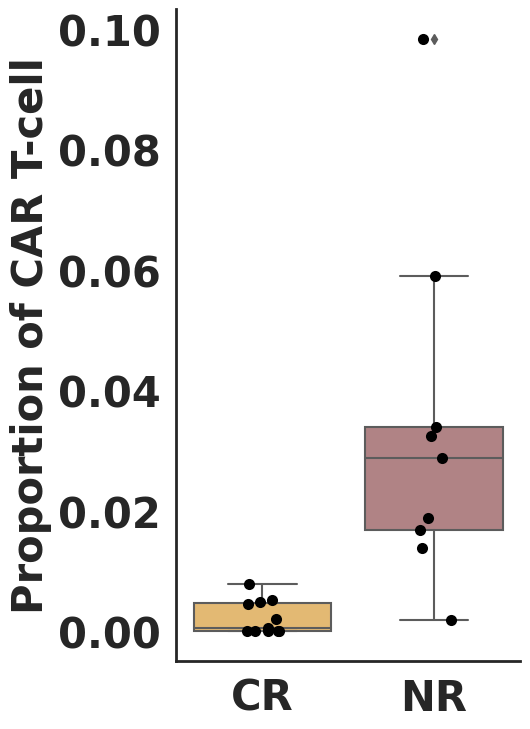

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


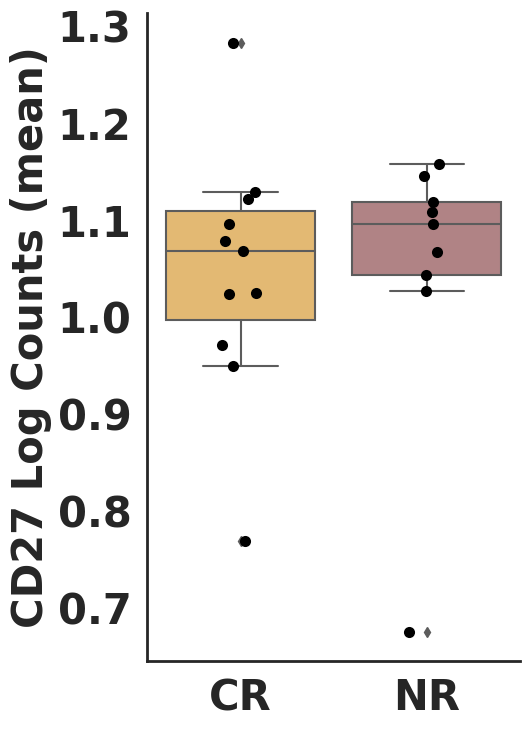

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


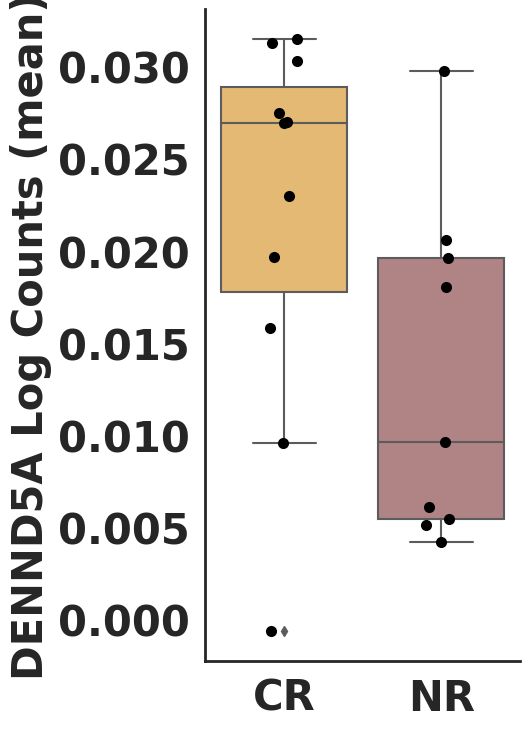

Gene pairs: DENND5A & TSC22D3


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


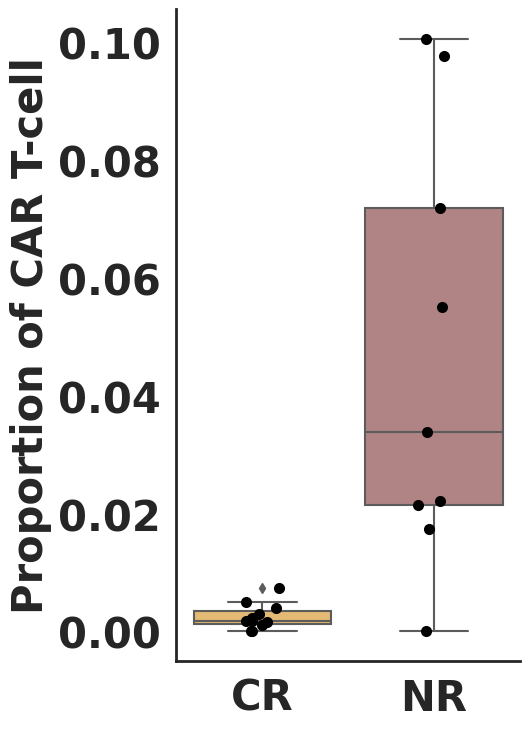

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


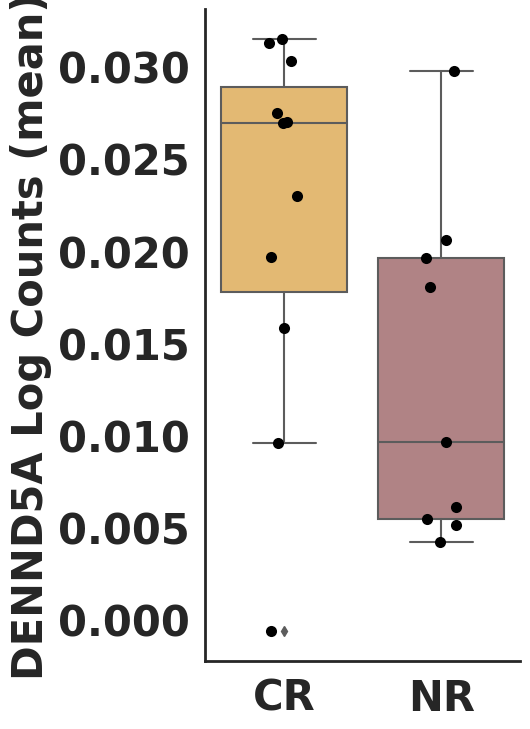

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


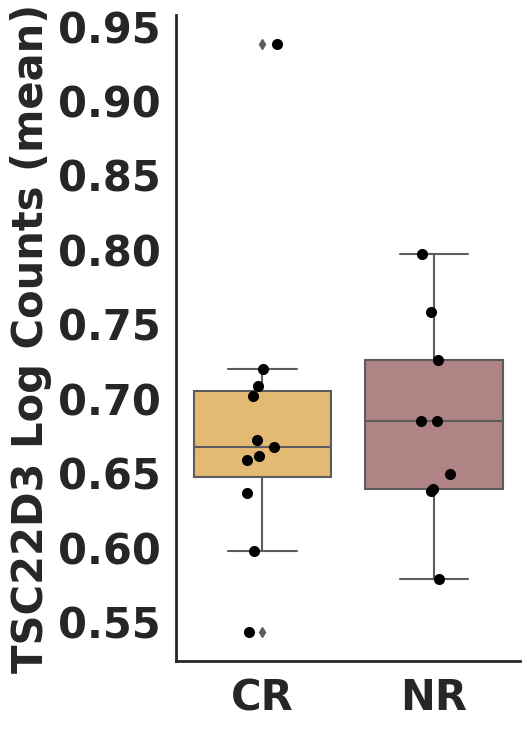

Gene pairs: DENND5A & PECAM1


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


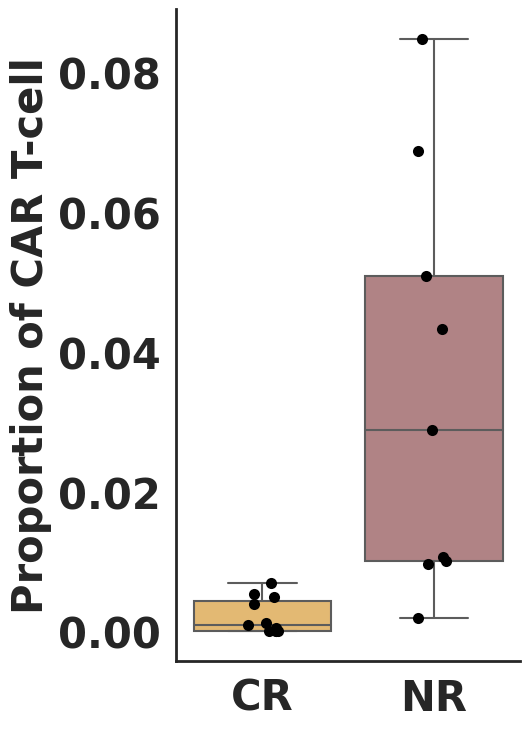

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


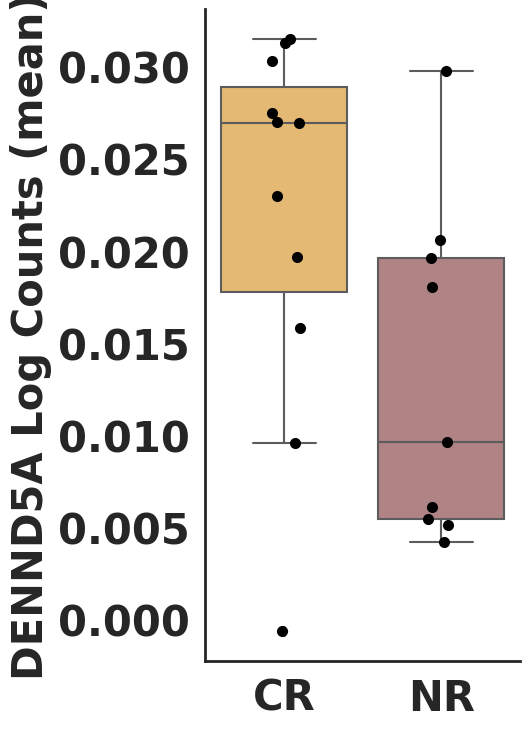

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


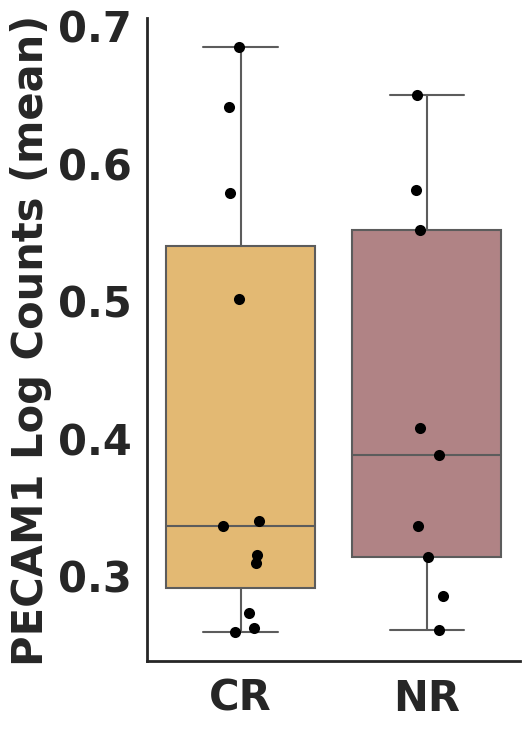

In [1]:
import scanpy as sc
import numpy as np
import pandas as pd
from scipy.sparse import issparse
from sklearn.preprocessing import LabelEncoder
from scipy.stats import zscore
import matplotlib.pyplot as plt
import seaborn as sns

# Load log-transformed dataset for proportions
adata_log = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD4_CD8A_highly_variable_log.h5ad')
adata_log_CD8 = adata_log[adata_log.obs['cell_type'] == 'CD8'].copy()
adata_log_CR_NR = adata_log_CD8[(adata_log_CD8.obs['response'] == 'CR') | (adata_log_CD8.obs['response'] == 'NR')].copy()

# Load combat-corrected dataset for counts
adata_combat = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD4_CD8A_highly_variable_combat.h5ad')
adata_combat_CD8 = adata_combat[adata_combat.obs['cell_type'] == 'CD8'].copy()
adata_combat_CR_NR = adata_combat_CD8[adata_combat_CD8.obs['response'].isin(['CR', 'NR'])].copy()

# Define gene pairs
gene_pairs = [
    ("CD27", "DENND5A"),
    ("DENND5A", "TSC22D3"),
    ("DENND5A", "PECAM1")
]

# Define the color palette
color_palette = ["#F6BD60", "#B77B7E"]

# Set global font and line styles for bold
plt.rcParams['font.weight'] = 'bold'
plt.rcParams['font.size'] = '30'
plt.rcParams['axes.linewidth'] = 2
plt.rcParams['axes.labelweight'] = 'bold'
plt.rcParams['xtick.major.width'] = 2
plt.rcParams['ytick.major.width'] = 2

for gene1, gene2 in gene_pairs:
    # Prepare the data for the gene pair
    print(f'Gene pairs: {gene1} & {gene2}')
    model_data = []
    patients = adata_log_CR_NR.obs['barcode'].unique()

    for patient in patients:
        # Proportions using log-transformed data
        patient_data_log = adata_log_CR_NR[adata_log_CR_NR.obs['barcode'] == patient]
        gene1_expr_log = patient_data_log[:, gene1].X.toarray().flatten() > 0 if issparse(patient_data_log.X) else patient_data_log[:, gene1].X > 0
        gene2_expr_log = patient_data_log[:, gene2].X.toarray().flatten() > 0 if issparse(patient_data_log.X) else patient_data_log[:, gene2].X > 0
        both_genes_expr_log = np.logical_and(gene1_expr_log, gene2_expr_log)
        proportion = np.sum(both_genes_expr_log) / patient_data_log.shape[0]

        # Gene counts using combat-corrected data
        patient_data_combat = adata_combat_CR_NR[adata_combat_CR_NR.obs['barcode'] == patient]
        gene1_count = np.mean(patient_data_combat[:, gene1].X)
        gene2_count = np.mean(patient_data_combat[:, gene2].X)

        # Append the data for analysis
        model_data.append({
            'Patient': patient,
            'Response': patient_data_log.obs['response'].values[0],
            'Proportion_Positive': proportion,
            f'{gene1}_Count': gene1_count,
            f'{gene2}_Count': gene2_count
        })

    # Convert the model_data list to a DataFrame
    model_df = pd.DataFrame(model_data)
    model_df[f'{gene1}_Count'] = model_df[f'{gene1}_Count'].astype(float)
    model_df[f'{gene2}_Count'] = model_df[f'{gene2}_Count'].astype(float)

    # Visualization - Adjusted version to display tick marks
    sns.set_style("white")

    # 1. Proportion of cells expressing both genes across response groups
    plt.figure(figsize=(6, 8))
    sns.boxplot(x='Response', y='Proportion_Positive', data=model_df, palette=color_palette)
    sns.stripplot(x='Response', y='Proportion_Positive', data=model_df, color='black', size=8, jitter=True)
    plt.xlabel('')  # Ensure the x-axis label is removed
    plt.ylabel('Proportion of CAR T-cell', fontweight='bold')
    plt.tick_params(axis='both', which='both', length=8, width=2, labelsize=20)
    plt.xticks(fontsize=30)
    plt.yticks(fontsize=30)
    sns.despine(top=True, right=True)
    plt.tight_layout()
    plt.show()

    # 2. Gene counts across response groups for gene1
    plt.figure(figsize=(6, 8))
    sns.boxplot(x='Response', y=f'{gene1}_Count', data=model_df, palette=color_palette)
    sns.stripplot(x='Response', y=f'{gene1}_Count', data=model_df, color='black', size=8, jitter=True)
    plt.xlabel('')  # Ensure the x-axis label is removed
    plt.ylabel(f'{gene1} Log Counts (mean)', fontweight='bold')
    plt.tick_params(axis='both', which='both', length=8, width=2, labelsize=20)
    plt.xticks(fontsize=30)
    plt.yticks(fontsize=30)
    sns.despine(top=True, right=True)
    plt.tight_layout()
    plt.show()

    # 3. Gene counts across response groups for gene2
    plt.figure(figsize=(6, 8))
    sns.boxplot(x='Response', y=f'{gene2}_Count', data=model_df, palette=color_palette)
    sns.stripplot(x='Response', y=f'{gene2}_Count', data=model_df, color='black', size=8, jitter=True)
    plt.xlabel('')  # Ensure the x-axis label is removed
    plt.ylabel(f'{gene2} Log Counts (mean)', fontweight='bold')
    plt.tick_params(axis='both', which='both', length=8, width=2, labelsize=20)
    plt.xticks(fontsize=30)
    plt.yticks(fontsize=30)
    sns.despine(top=True, right=True)
    plt.tight_layout()
    plt.show()

In [2]:
import scanpy as sc
import numpy as np
import pandas as pd
from scipy.sparse import issparse
from scipy.stats import ranksums

# Load log-transformed dataset for proportions
adata_log = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD4_CD8A_highly_variable_log.h5ad')
adata_log_CD8 = adata_log[adata_log.obs['cell_type'] == 'CD8'].copy()
adata_log_CR_NR = adata_log_CD8[(adata_log_CD8.obs['response'] == 'CR') | (adata_log_CD8.obs['response'] == 'NR')].copy()

# Load combat-corrected dataset for counts
adata_combat = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD4_CD8A_highly_variable_combat.h5ad')
adata_combat_CD8 = adata_combat[adata_combat.obs['cell_type'] == 'CD8'].copy()
adata_combat_CR_NR = adata_combat_CD8[adata_combat_CD8.obs['response'].isin(['CR', 'NR'])].copy()

# Define gene pairs
gene_pairs = [
    ("CD27", "DENND5A"),
    ("DENND5A", "TSC22D3"),
    ("DENND5A", "PECAM1")
]

for gene1, gene2 in gene_pairs:
    # Prepare the data for the gene pair
    model_data = []
    patients = adata_log_CR_NR.obs['barcode'].unique()

    for patient in patients:
        # Proportions using log-transformed data
        patient_data_log = adata_log_CR_NR[adata_log_CR_NR.obs['barcode'] == patient]
        gene1_expr_log = patient_data_log[:, gene1].X.toarray().flatten() > 0 if issparse(patient_data_log.X) else patient_data_log[:, gene1].X > 0
        gene2_expr_log = patient_data_log[:, gene2].X.toarray().flatten() > 0 if issparse(patient_data_log.X) else patient_data_log[:, gene2].X > 0
        both_genes_expr_log = np.logical_and(gene1_expr_log, gene2_expr_log)
        proportion = np.sum(both_genes_expr_log) / patient_data_log.shape[0]

        # Gene counts using combat-corrected data
        patient_data_combat = adata_combat_CR_NR[adata_combat_CR_NR.obs['barcode'] == patient]
        gene1_count = np.mean(patient_data_combat[:, gene1].X)
        gene2_count = np.mean(patient_data_combat[:, gene2].X)

        # Append the data for analysis
        model_data.append({
            'Patient': patient,
            'Response': patient_data_log.obs['response'].values[0],
            'Proportion_Positive': proportion,
            f'{gene1}_Count': gene1_count,
            f'{gene2}_Count': gene2_count
        })

    # Convert the model_data list to a DataFrame
    model_df = pd.DataFrame(model_data)
    model_df[f'{gene1}_Count'] = model_df[f'{gene1}_Count'].astype(float)
    model_df[f'{gene2}_Count'] = model_df[f'{gene2}_Count'].astype(float)

    # Perform Wilcoxon rank-sum test for each variable between CR and NR
    cr_group = model_df[model_df['Response'] == 'CR']
    nr_group = model_df[model_df['Response'] == 'NR']

    # Wilcoxon rank-sum for proportions
    w_proportion, p_proportion = ranksums(cr_group['Proportion_Positive'], nr_group['Proportion_Positive'])
    print(f'\nResults for {gene1} & {gene2}:')
    print(f'Proportion - p-value: {p_proportion:.4f}')

    # Wilcoxon rank-sum for gene1 counts
    w_gene1, p_gene1 = ranksums(cr_group[f'{gene1}_Count'], nr_group[f'{gene1}_Count'])
    print(f'{gene1} Counts - p-value: {p_gene1:.4f}')

    # Wilcoxon rank-sum for gene2 counts
    w_gene2, p_gene2 = ranksums(cr_group[f'{gene2}_Count'], nr_group[f'{gene2}_Count'])
    print(f'{gene2} Counts - p-value: {p_gene2:.4f}')


Results for CD27 & DENND5A:
Proportion - p-value: 0.0007
CD27 Counts - p-value: 0.4704
DENND5A Counts - p-value: 0.0527

Results for DENND5A & TSC22D3:
Proportion - p-value: 0.0027
DENND5A Counts - p-value: 0.0527
TSC22D3 Counts - p-value: 0.7324

Results for DENND5A & PECAM1:
Proportion - p-value: 0.0005
DENND5A Counts - p-value: 0.0527
PECAM1 Counts - p-value: 0.6761


Gene: CD81


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


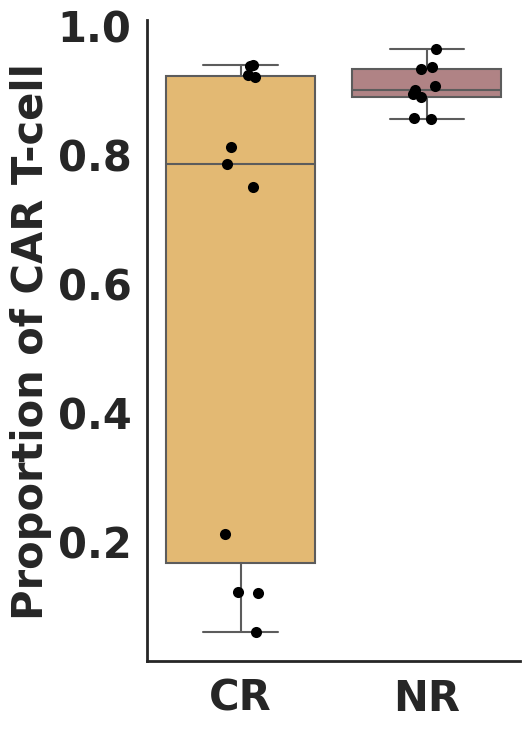

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


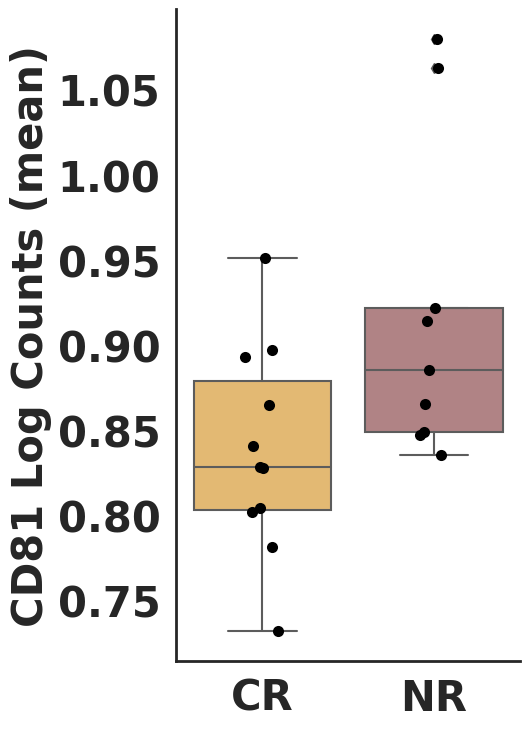

In [7]:
import scanpy as sc
import numpy as np
import pandas as pd
from scipy.sparse import issparse
import matplotlib.pyplot as plt
import seaborn as sns

# Load log-transformed dataset for proportions
adata_log = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD4_CD8A_highly_variable_log.h5ad')
adata_log_CD8 = adata_log[adata_log.obs['cell_type'] == 'CD8'].copy()
adata_log_CR_NR = adata_log_CD8[(adata_log_CD8.obs['response'] == 'CR') | (adata_log_CD8.obs['response'] == 'NR')].copy()

# Load combat-corrected dataset for counts
adata_combat = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD4_CD8A_highly_variable_combat.h5ad')
adata_combat_CD8 = adata_combat[adata_combat.obs['cell_type'] == 'CD8'].copy()
adata_combat_CR_NR = adata_combat_CD8[adata_combat_CD8.obs['response'].isin(['CR', 'NR'])].copy()

# Define the gene to analyze
gene = "CD81"

# Define the color palette
color_palette = ["#F6BD60", "#B77B7E"]

# Set global font and line styles for bold
plt.rcParams['font.weight'] = 'bold'
plt.rcParams['font.size'] = 30
plt.rcParams['axes.linewidth'] = 2
plt.rcParams['axes.labelweight'] = 'bold'
plt.rcParams['xtick.major.width'] = 2
plt.rcParams['ytick.major.width'] = 2

# Prepare the data for the gene
print(f'Gene: {gene}')
model_data = []
patients = adata_log_CR_NR.obs['barcode'].unique()

for patient in patients:
    # Proportions using log-transformed data
    patient_data_log = adata_log_CR_NR[adata_log_CR_NR.obs['barcode'] == patient]
    gene_expr_log = patient_data_log[:, gene].X.toarray().flatten() > 0 if issparse(patient_data_log.X) else patient_data_log[:, gene].X > 0
    proportion = np.sum(gene_expr_log) / patient_data_log.shape[0]

    # Gene counts using combat-corrected data
    patient_data_combat = adata_combat_CR_NR[adata_combat_CR_NR.obs['barcode'] == patient]
    gene_count = np.mean(patient_data_combat[:, gene].X)

    # Append the data for analysis
    model_data.append({
        'Patient': patient,
        'Response': patient_data_log.obs['response'].values[0],
        'Proportion_Positive': proportion,
        f'{gene}_Count': gene_count
    })

# Convert the model_data list to a DataFrame
model_df = pd.DataFrame(model_data)
model_df[f'{gene}_Count'] = model_df[f'{gene}_Count'].astype(float)

# Visualization - Adjusted version to display tick marks
sns.set_style("white")

# 1. Proportion of cells expressing JUND across response groups
plt.figure(figsize=(6, 8))
sns.boxplot(x='Response', y='Proportion_Positive', data=model_df, palette=color_palette)
sns.stripplot(x='Response', y='Proportion_Positive', data=model_df, color='black', size=8, jitter=True)
plt.xlabel('')  # Ensure the x-axis label is removed
plt.ylabel('Proportion of CAR T-cell', fontweight='bold')
plt.tick_params(axis='both', which='both', length=8, width=2, labelsize=20)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
sns.despine(top=True, right=True)
plt.tight_layout()
plt.show()

# 2. Gene counts across response groups for JUND
plt.figure(figsize=(6, 8))
sns.boxplot(x='Response', y=f'{gene}_Count', data=model_df, palette=color_palette)
sns.stripplot(x='Response', y=f'{gene}_Count', data=model_df, color='black', size=8, jitter=True)
plt.xlabel('')  # Ensure the x-axis label is removed
plt.ylabel(f'{gene} Log Counts (mean)', fontweight='bold')
plt.tick_params(axis='both', which='both', length=8, width=2, labelsize=20)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
sns.despine(top=True, right=True)
plt.tight_layout()
plt.show()


In [16]:
import scanpy as sc
import numpy as np
import pandas as pd
from scipy.sparse import issparse
from scipy.stats import ranksums

# Load log-transformed dataset for proportions
adata_log = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD4_CD8A_highly_variable_log.h5ad')
adata_log_CD8 = adata_log[adata_log.obs['cell_type'] == 'CD8'].copy()
adata_log_CR_NR = adata_log_CD8[(adata_log_CD8.obs['response'] == 'CR') | (adata_log_CD8.obs['response'] == 'NR')].copy()

# Load combat-corrected dataset for counts
adata_combat = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD4_CD8A_highly_variable_combat.h5ad')
adata_combat_CD8 = adata_combat[adata_combat.obs['cell_type'] == 'CD8'].copy()
adata_combat_CR_NR = adata_combat_CD8[adata_combat_CD8.obs['response'].isin(['CR', 'NR'])].copy()

# Define the gene to analyze
gene = "CD81"

# Prepare the data for JUND
model_data = []
patients = adata_log_CR_NR.obs['barcode'].unique()

for patient in patients:
    # Proportions using log-transformed data
    patient_data_log = adata_log_CR_NR[adata_log_CR_NR.obs['barcode'] == patient]
    gene_expr_log = patient_data_log[:, gene].X.toarray().flatten() > 0 if issparse(patient_data_log.X) else patient_data_log[:, gene].X > 0
    proportion = np.sum(gene_expr_log) / patient_data_log.shape[0]

    # Gene counts using combat-corrected data
    patient_data_combat = adata_combat_CR_NR[adata_combat_CR_NR.obs['barcode'] == patient]
    gene_count = np.mean(patient_data_combat[:, gene].X)

    # Append the data for analysis
    model_data.append({
        'Patient': patient,
        'Response': patient_data_log.obs['response'].values[0],
        'Proportion_Positive': proportion,
        f'{gene}_Count': gene_count
    })

# Convert the model_data list to a DataFrame
model_df = pd.DataFrame(model_data)
model_df[f'{gene}_Count'] = model_df[f'{gene}_Count'].astype(float)

# Perform Wilcoxon rank-sum test for each variable between CR and NR
cr_group = model_df[model_df['Response'] == 'CR']
nr_group = model_df[model_df['Response'] == 'NR']

# Wilcoxon rank-sum for proportions
w_proportion, p_proportion = ranksums(cr_group['Proportion_Positive'], nr_group['Proportion_Positive'])
print(f'\nResults for {gene}:')
print(f'Proportion - p-value: {p_proportion:.4f}')

# Wilcoxon rank-sum for gene counts
w_gene, p_gene = ranksums(cr_group[f'{gene}_Count'], nr_group[f'{gene}_Count'])
print(f'{gene} Counts - p-value: {p_gene:.4f}')



Results for CD81:
Proportion - p-value: 0.1024
CD81 Counts - p-value: 0.0304



Averaged feature importances for gene pair CD27 & DENND5A:
Proportion    0.863203
DENND5A       0.077411
CD27          0.059386
dtype: float32


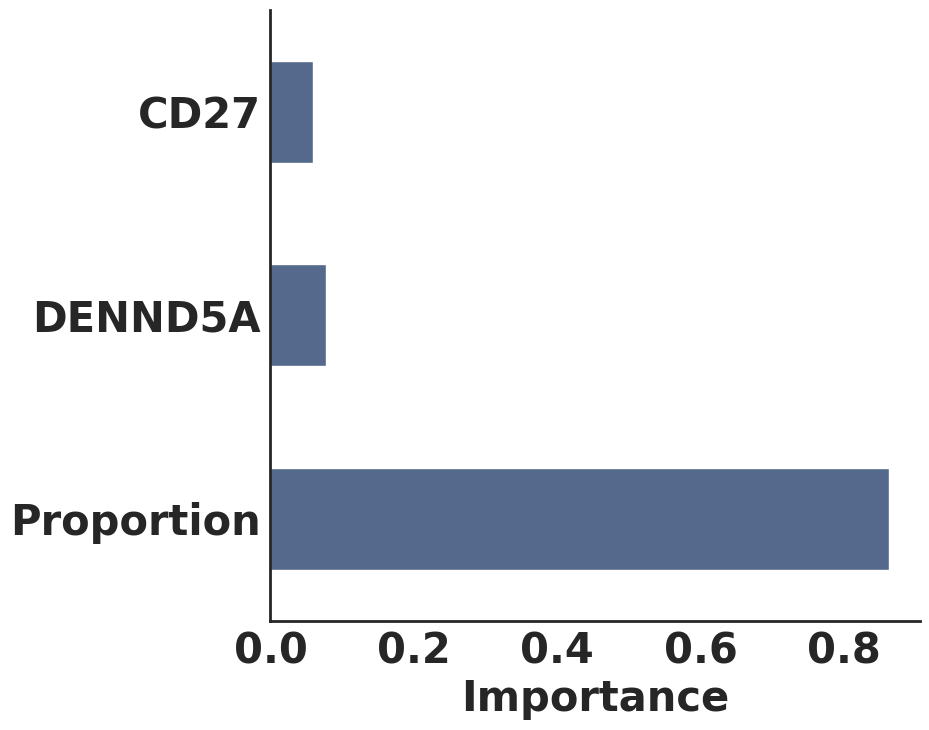


Averaged feature importances for gene pair DENND5A & TSC22D3:
Proportion    0.838699
DENND5A       0.108242
TSC22D3       0.053060
dtype: float32


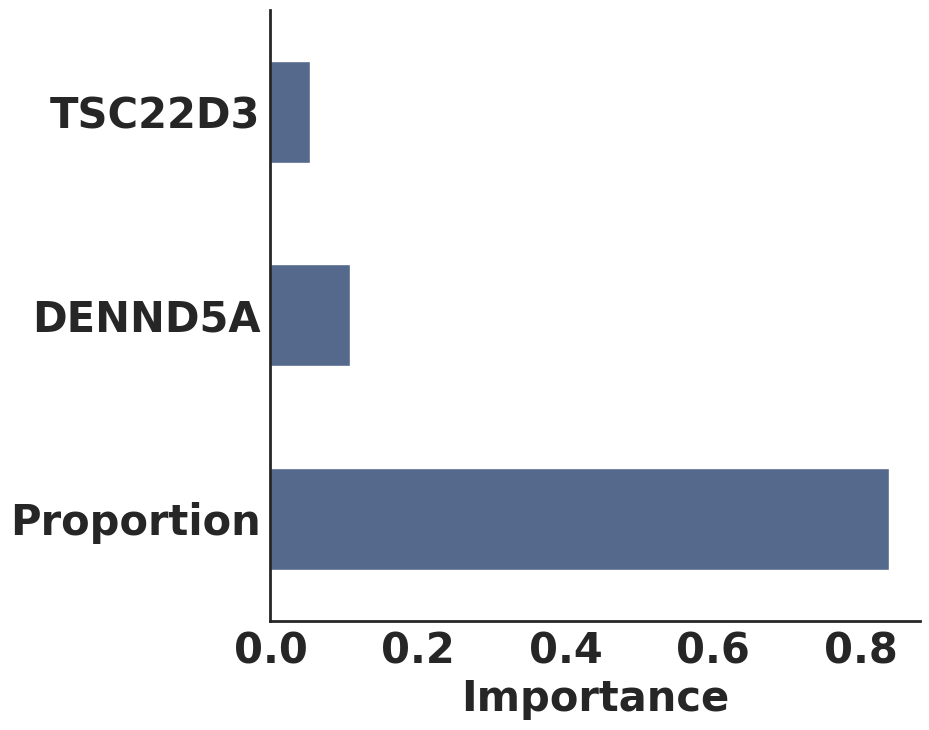


Averaged feature importances for gene pair DENND5A & PECAM1:
Proportion    0.857131
DENND5A       0.105324
PECAM1        0.037546
dtype: float32


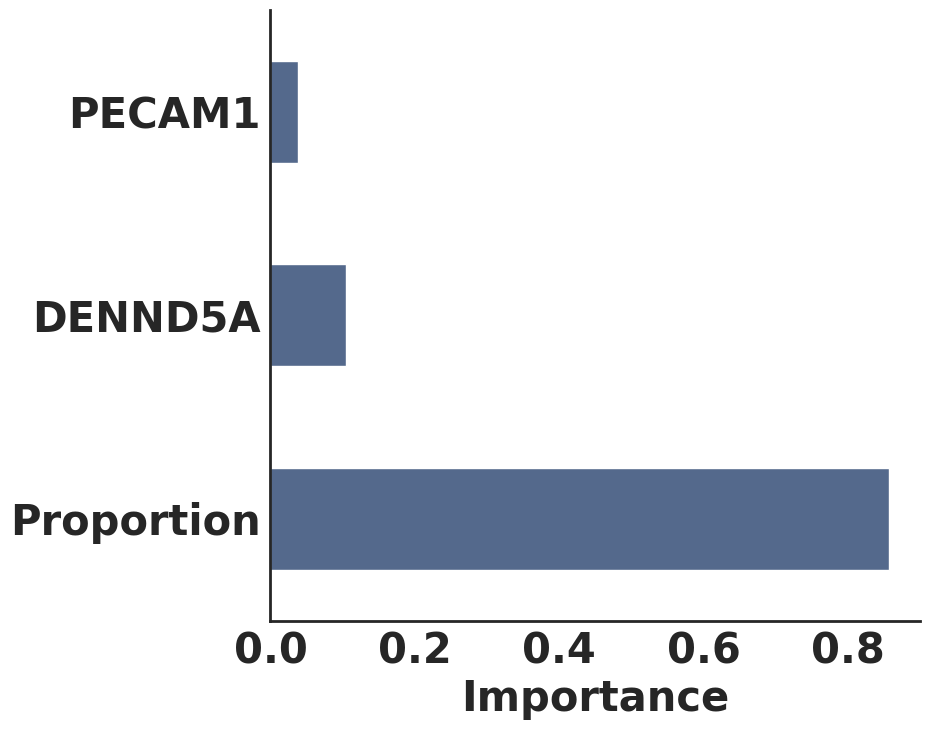

In [6]:
import scanpy as sc
import numpy as np
import pandas as pd
from scipy.sparse import issparse
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, average_precision_score
from sklearn.model_selection import StratifiedKFold
import xgboost as xgb
import matplotlib.pyplot as plt
import seaborn as sns

# Load your dataset
adata_log = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD4_CD8A_highly_variable_log.h5ad')
adata_log_CD8 = adata_log[adata_log.obs['cell_type'] == 'CD8'].copy()
adata_log_CR_NR = adata_log_CD8[(adata_log_CD8.obs['response'] == 'CR') | (adata_log_CD8.obs['response'] == 'NR')].copy()

# Load log-transformed dataset for proportions and gene counts
adata_combat = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD4_CD8A_highly_variable_combat.h5ad')
adata_combat_CD8 = adata_combat[adata_combat.obs['cell_type'] == 'CD8'].copy()
adata_combat_CR_NR = adata_combat_CD8[adata_combat_CD8.obs['response'].isin(['CR', 'NR'])].copy()

# Encode the 'response' labels (CR and NR only)
le = LabelEncoder()
adata_log_CR_NR.obs['Response_Encoded'] = le.fit_transform(adata_log_CR_NR.obs['response'])  # CR = 0, NR = 1

# Define the list of gene pairs
gene_pairs = [
    ("CD27", "DENND5A"),
    ("DENND5A", "TSC22D3"),
    ("DENND5A", "PECAM1")
]

# Define XGBoost parameters
xgb_params = {
    'objective': 'binary:logistic',
    'eval_metric': 'logloss',
    'random_state': 42,
    'n_estimators': 100
}

# Initialize Stratified K-Fold Cross-Validation
n_splits = 5
kf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

# Iterate over all pairs of genes
for gene1, gene2 in gene_pairs:
    model_data = []
    patients = adata_log_CR_NR.obs['barcode'].unique()
    # Calculate the proportion of cells expressing both genes for each patient using adata_log
    for patient in patients:
        patient_data_log = adata_log_CR_NR[adata_log_CR_NR.obs['barcode'] == patient]
        patient_data_combat = adata_combat_CR_NR[adata_combat_CR_NR.obs['barcode'] == patient]

        # Ensure the data is dense if needed
        gene1_expr_log = patient_data_log[:, gene1].X.toarray().flatten() > 0 if issparse(patient_data_log.X) else patient_data_log[:, gene1].X > 0
        gene2_expr_log = patient_data_log[:, gene2].X.toarray().flatten() > 0 if issparse(patient_data_log.X) else patient_data_log[:, gene2].X > 0
        both_genes_expr = np.logical_and(gene1_expr_log, gene2_expr_log)
        proportion = np.sum(both_genes_expr) / patient_data_log.shape[0]

        # Calculate the mean gene counts using adata_combat
        gene1_count_combat = np.mean(patient_data_combat[:, gene1].X)
        gene2_count_combat = np.mean(patient_data_combat[:, gene2].X)

        # Append the data for PERMANOVA analysis
        model_data.append({
            'Patient': patient,
            'Response_Encoded': patient_data_log.obs['Response_Encoded'].values[0],
            'Proportion': proportion,
            f'{gene1}': gene1_count_combat,
            f'{gene2}': gene2_count_combat
        })
    
    # Convert to DataFrame
    model_df = pd.DataFrame(model_data)
    model_df[f'{gene1}'] = model_df[f'{gene1}'].astype(float)
    model_df[f'{gene2}'] = model_df[f'{gene2}'].astype(float)

    # Normalize the features using zscore
    X = model_df[['Proportion', f'{gene1}', f'{gene2}']]
    y = model_df['Response_Encoded']

    # Initialize list to store feature importances
    importances_per_fold = []

    # Perform 5-fold cross-validation
    for train_index, test_index in kf.split(X, y):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]

        # Train an XGBoost classifier
        xgb_model = xgb.XGBClassifier(**xgb_params)
        xgb_model.fit(X_train, y_train)

        # Store feature importance for this fold
        fold_importances = pd.Series(xgb_model.feature_importances_, index=X.columns)
        importances_per_fold.append(fold_importances)

    # Average feature importances across folds
    avg_importances = pd.concat(importances_per_fold, axis=1).mean(axis=1).sort_values(ascending=False)

    # Print and visualize the averaged feature importances
    print(f"\nAveraged feature importances for gene pair {gene1} & {gene2}:")
    print(avg_importances)

    # Visualization of averaged feature importance
    avg_importances.plot(kind='barh', color='#54698C', figsize=(10, 8))
    plt.xlabel('Importance')
    plt.ylabel('')
    sns.despine(top=True, right=True)
    plt.tight_layout()
    plt.show()


Evaluating gene: CD81

Averaged feature importances for gene pair DENND5A & PECAM1:
Proportion    0.840453
CD81          0.159547
dtype: float32


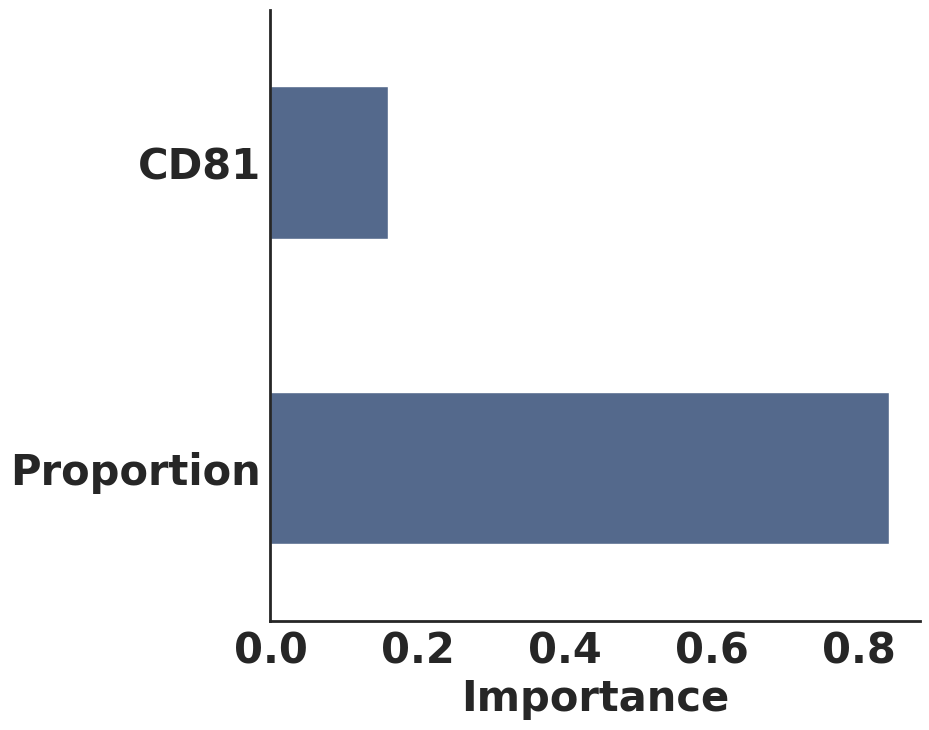

Evaluating gene: DENND5A

Averaged feature importances for gene pair DENND5A & PECAM1:
Proportion    1.0
DENND5A       0.0
dtype: float32


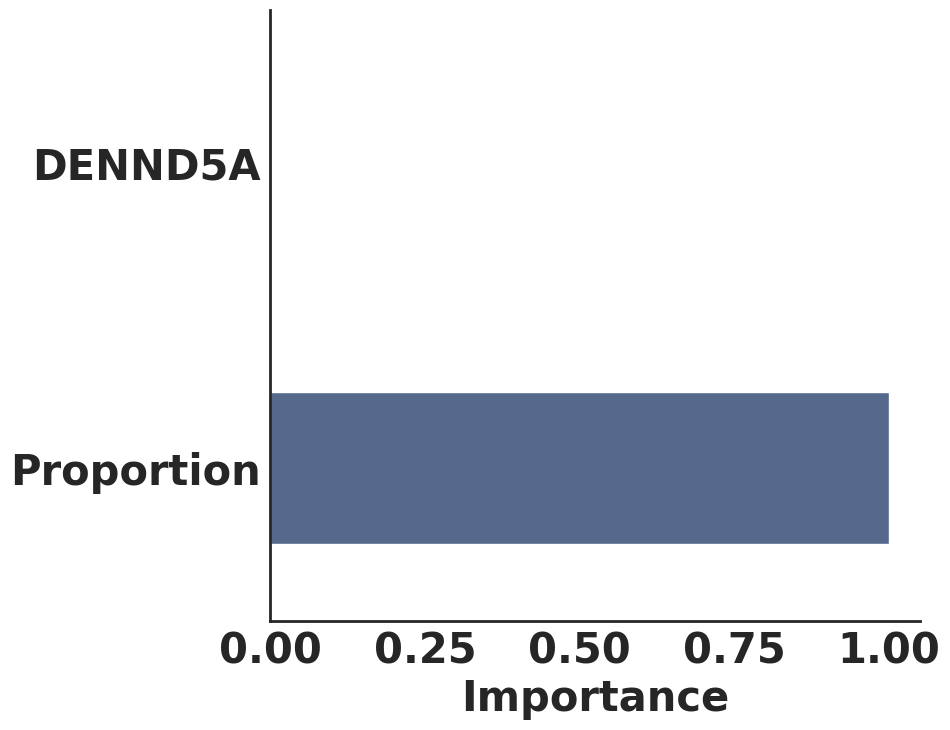

In [15]:
import scanpy as sc
import numpy as np
import pandas as pd
from scipy.sparse import issparse
from sklearn.preprocessing import LabelEncoder
import xgboost as xgb
import matplotlib.pyplot as plt
import seaborn as sns

# Load your dataset
adata_log = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD4_CD8A_highly_variable_log.h5ad')
adata_log_CD8 = adata_log[adata_log.obs['cell_type'] == 'CD8'].copy()
adata_log_CR_NR = adata_log_CD8[(adata_log_CD8.obs['response'] == 'CR') | (adata_log_CD8.obs['response'] == 'NR')].copy()

# Load log-transformed dataset for proportions and gene counts
adata_combat = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD4_CD8A_highly_variable_combat.h5ad')
adata_combat_CD8 = adata_combat[adata_combat.obs['cell_type'] == 'CD8'].copy()
adata_combat_CR_NR = adata_combat_CD8[adata_combat_CD8.obs['response'].isin(['CR', 'NR'])].copy()

# Encode the 'response' labels (CR and NR only)
le = LabelEncoder()
adata_log_CR_NR.obs['Response_Encoded'] = le.fit_transform(adata_log_CR_NR.obs['response'])  # CR = 0, NR = 1

# Define the gene of interest
genes = ["CD81", 'DENND5A' ]

# Define XGBoost parameters
xgb_params = {
    'objective': 'binary:logistic',
    'eval_metric': 'logloss',
    'random_state': 42,
    'n_estimators': 100
}

# Prepare data for analysis focusing only on JUND
model_data = []
patients = adata_log_CR_NR.obs['barcode'].unique()

# Calculate the proportion of cells expressing JUND and its mean count for each patient
# Define XGBoost parameters
xgb_params = {
    'objective': 'binary:logistic',
    'eval_metric': 'logloss',
    'random_state': 42,
    'n_estimators': 100
}

# Initialize Stratified K-Fold Cross-Validation
n_splits = 5
kf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

# Iterate over all pairs of genes
for gene in genes:
    print(f"Evaluating gene: {gene}")

    # Filter the data for the CR and NR responses
    patients = adata_log_CR_NR.obs['barcode'].unique()

    model_data = []
    for patient in patients:
        patient_data = adata_log_CR_NR[adata_log_CR_NR.obs['barcode'] == patient]

        # Ensure the data is dense if needed
        gene_expr = patient_data[:, gene].X.toarray().flatten() > 0 if issparse(patient_data.X) else patient_data[:, gene].X > 0
        proportion = np.sum(gene_expr) / patient_data.shape[0]
        gene_count = np.mean(patient_data[:, gene].X)

        # Append the data for analysis
        model_data.append({
            'Patient': patient,
            'Response_Encoded': patient_data.obs['Response_Encoded'].values[0],
            'Proportion': proportion,
            f'{gene}': gene_count
        })

    # Convert the model_data list to a DataFrame
    model_df = pd.DataFrame(model_data)
    model_df[f'{gene}'] = model_df[f'{gene}'].astype(float)

    # Select the normalized features and the target variable
    X = model_df[['Proportion', f'{gene}']]
    y = model_df['Response_Encoded']

    # Initialize list to store feature importances
    importances_per_fold = []

    # Perform 5-fold cross-validation
    for train_index, test_index in kf.split(X, y):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]

        # Train an XGBoost classifier
        xgb_model = xgb.XGBClassifier(**xgb_params)
        xgb_model.fit(X_train, y_train)

        # Store feature importance for this fold
        fold_importances = pd.Series(xgb_model.feature_importances_, index=X.columns)
        importances_per_fold.append(fold_importances)

    # Average feature importances across folds
    avg_importances = pd.concat(importances_per_fold, axis=1).mean(axis=1).sort_values(ascending=False)

    # Print and visualize the averaged feature importances
    print(f"\nAveraged feature importances for gene pair {gene1} & {gene2}:")
    print(avg_importances)

    # Visualization of averaged feature importance
    avg_importances.plot(kind='barh', color='#54698C', figsize=(10, 8))
    plt.xlabel('Importance')
    plt.ylabel('')
    sns.despine(top=True, right=True)
    plt.tight_layout()
    plt.show()


Gene pairs: CD27 & DENND5A


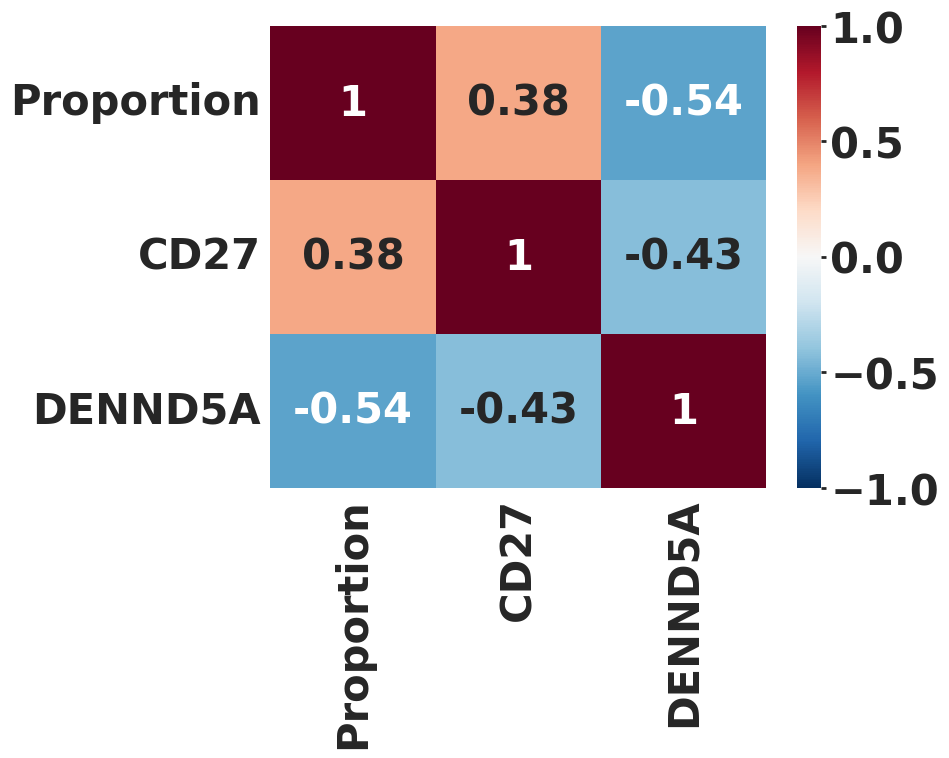

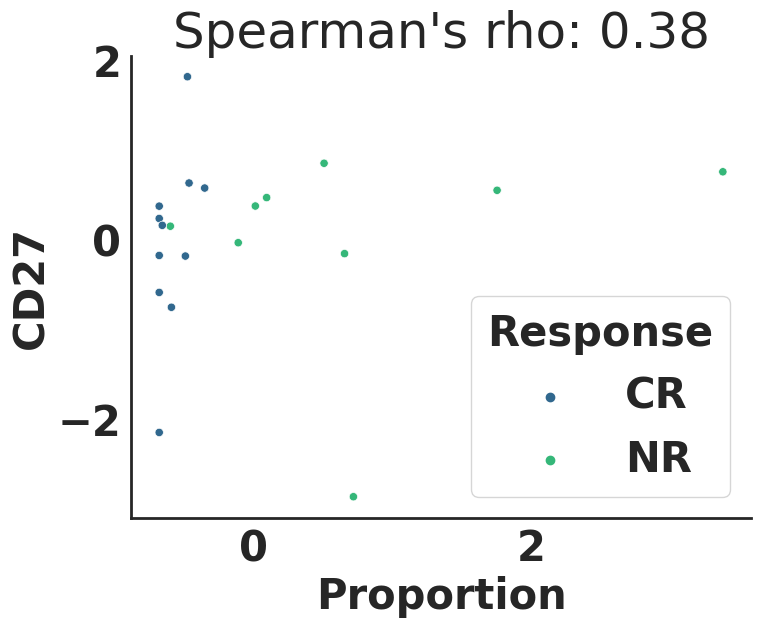

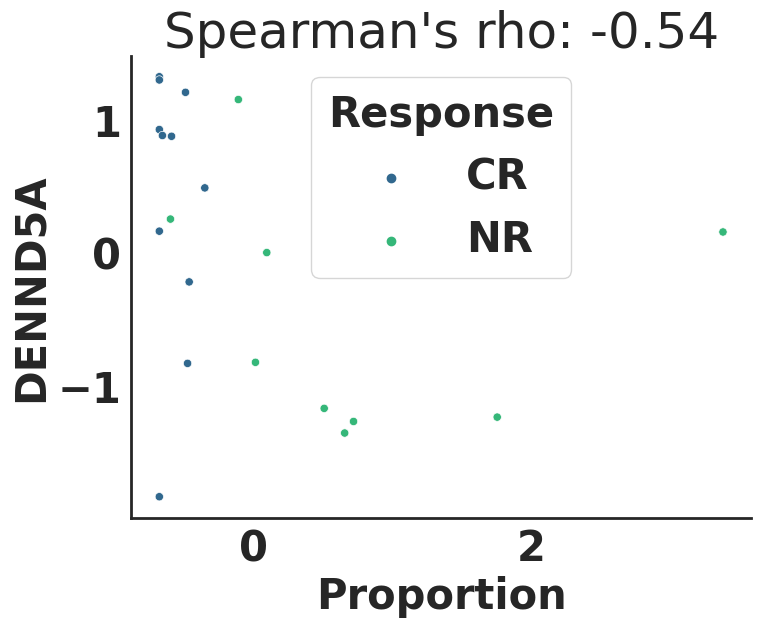

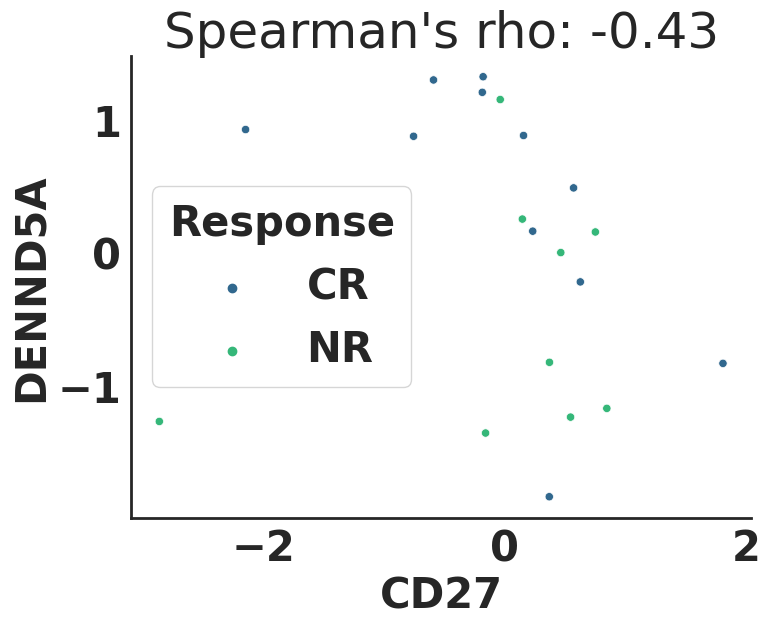

Gene pairs: DENND5A & TSC22D3


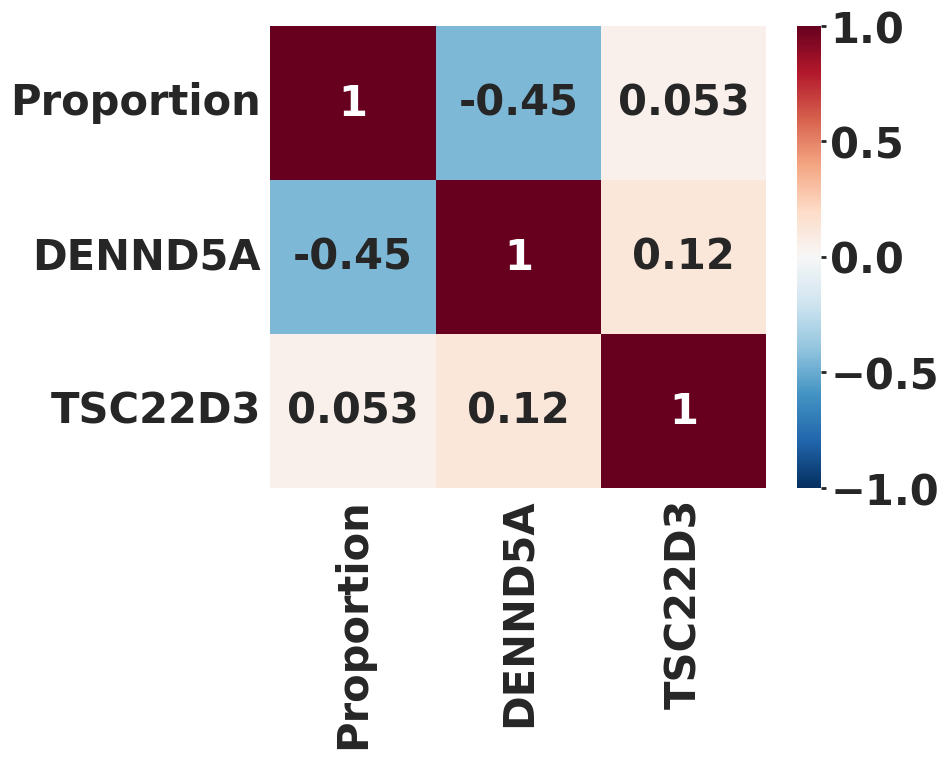

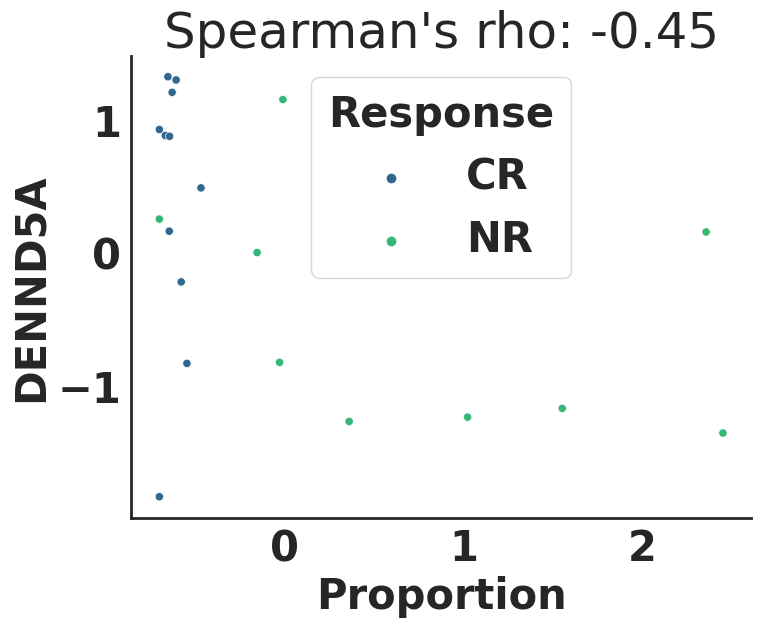

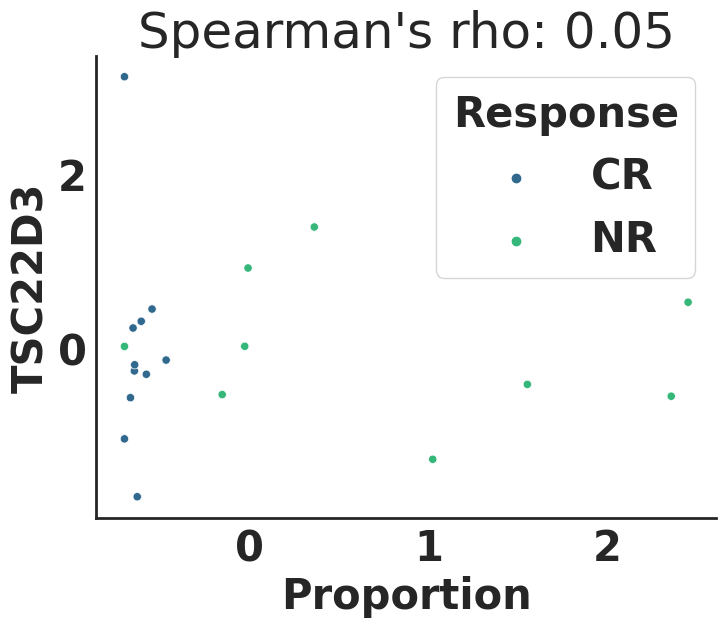

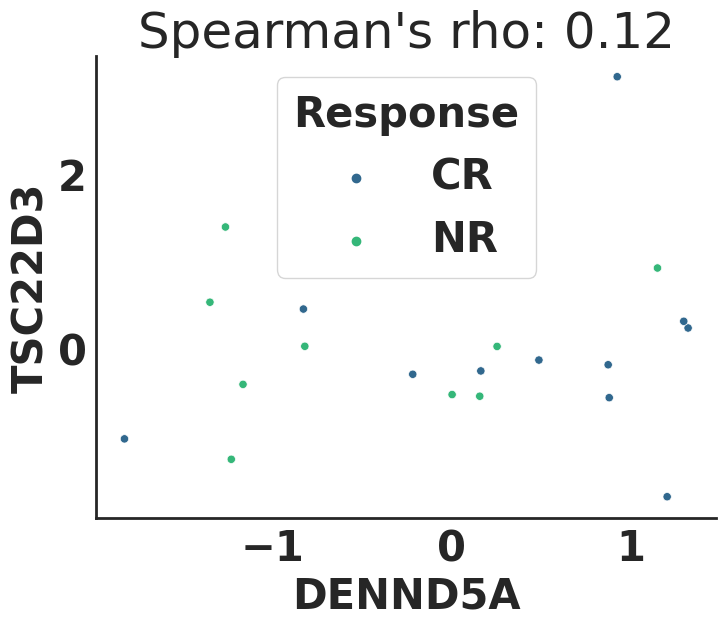

Gene pairs: DENND5A & PECAM1


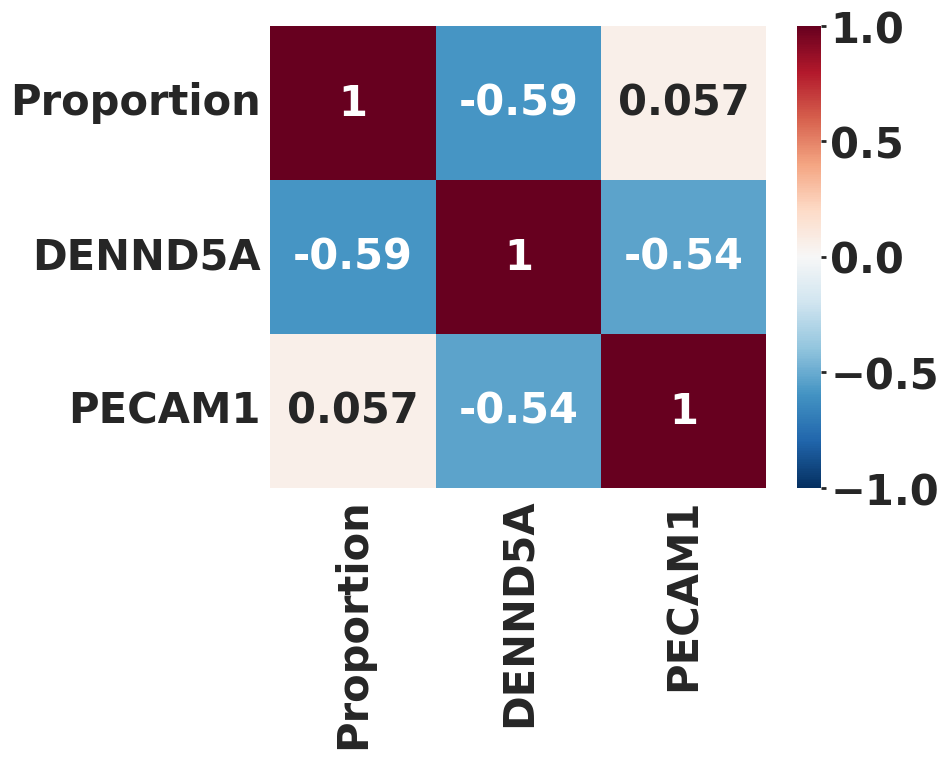

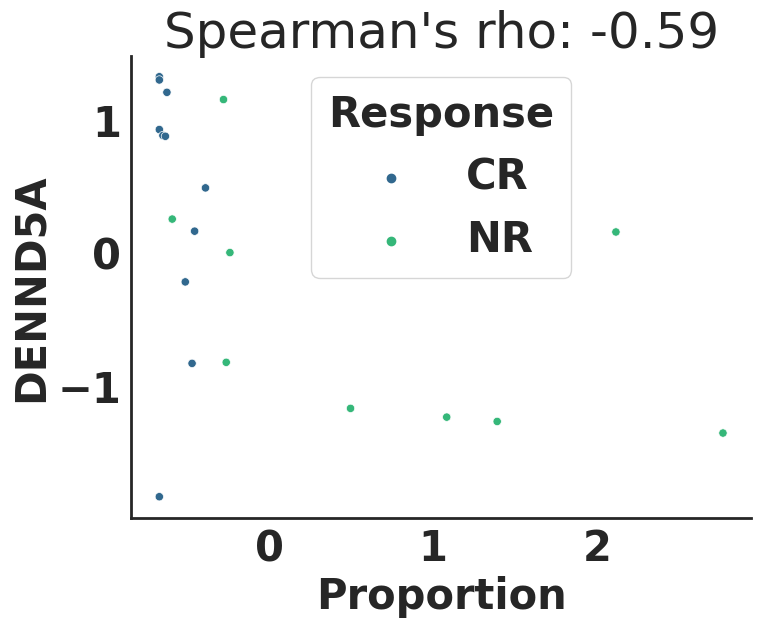

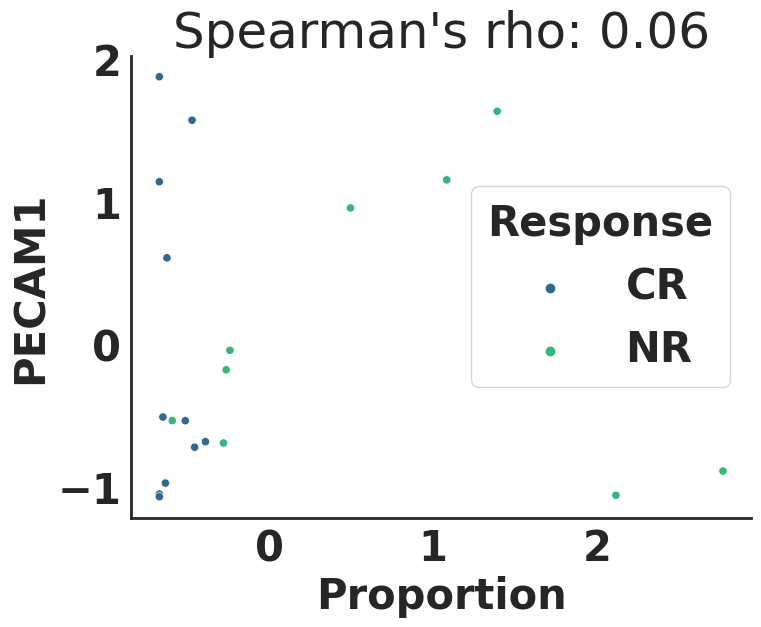

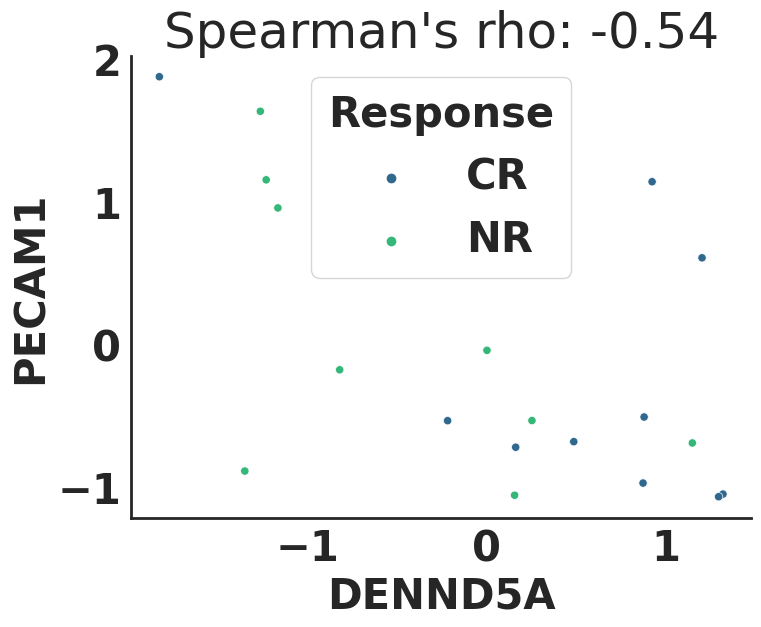

In [17]:
import scanpy as sc
import numpy as np
import pandas as pd
from scipy.sparse import issparse
from sklearn.preprocessing import LabelEncoder
from scipy.stats import zscore
from scipy.stats import spearmanr, zscore
import matplotlib.pyplot as plt
import seaborn as sns

# Load log-transformed dataset for proportions
adata_log = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD4_CD8A_highly_variable_log.h5ad')
adata_log_CD8 = adata_log[adata_log.obs['cell_type'] == 'CD8'].copy()
adata_log_CR_NR = adata_log_CD8[(adata_log_CD8.obs['response'] == 'CR') | (adata_log_CD8.obs['response'] == 'NR')].copy()

# Load combat-corrected dataset for counts
adata_combat = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD4_CD8A_highly_variable_combat.h5ad')
adata_combat_CD8 = adata_combat[adata_combat.obs['cell_type'] == 'CD8'].copy()
adata_combat_CR_NR = adata_combat_CD8[adata_combat_CD8.obs['response'].isin(['CR', 'NR'])].copy()

# Define gene pairs
gene_pairs = [
    ("CD27", "DENND5A"),
    ("DENND5A", "TSC22D3"),
    ("DENND5A", "PECAM1")
]


# Set global font and line styles for bold
plt.rcParams['font.weight'] = 'bold'
plt.rcParams['font.size'] = '30'
plt.rcParams['axes.linewidth'] = 2
plt.rcParams['axes.labelweight'] = 'bold'
plt.rcParams['xtick.major.width'] = 2
plt.rcParams['ytick.major.width'] = 2

for gene1, gene2 in gene_pairs:
    # Prepare the data for the gene pair
    print(f'Gene pairs: {gene1} & {gene2}')
    model_data = []
    patients = adata_log_CR_NR.obs['barcode'].unique()

    for patient in patients:
        # Proportions using log-transformed data
        patient_data_log = adata_log_CR_NR[adata_log_CR_NR.obs['barcode'] == patient]
        gene1_expr_log = patient_data_log[:, gene1].X.toarray().flatten() > 0 if issparse(patient_data_log.X) else patient_data_log[:, gene1].X > 0
        gene2_expr_log = patient_data_log[:, gene2].X.toarray().flatten() > 0 if issparse(patient_data_log.X) else patient_data_log[:, gene2].X > 0
        both_genes_expr_log = np.logical_and(gene1_expr_log, gene2_expr_log)
        proportion = np.sum(both_genes_expr_log) / patient_data_log.shape[0]

        # Gene counts using combat-corrected data
        patient_data_combat = adata_combat_CR_NR[adata_combat_CR_NR.obs['barcode'] == patient]
        gene1_count = np.mean(patient_data_combat[:, gene1].X)
        gene2_count = np.mean(patient_data_combat[:, gene2].X)

        # Append the data for analysis
        model_data.append({
            'Patient': patient,
            'Response': patient_data_log.obs['response'].values[0],
            'Proportion': proportion,
            f'{gene1}': gene1_count,
            f'{gene2}': gene2_count
        })

    # Convert the model_data list to a DataFrame
    model_df = pd.DataFrame(model_data)
    model_df[f'{gene1}'] = model_df[f'{gene1}'].astype(float)
    model_df[f'{gene2}'] = model_df[f'{gene2}'].astype(float)

        # Normalize the variables using Z-scores
    model_df['Proportion'] = zscore(model_df['Proportion'])
    model_df[f'{gene1}'] = zscore(model_df[f'{gene1}'])
    model_df[f'{gene2}'] = zscore(model_df[f'{gene2}'])

    # 5. Heatmap of Spearman Correlation (using z-score normalized data)
    correlation_matrix = model_df[['Proportion', f'{gene1}', f'{gene2}']].corr(method='spearman')
    plt.figure(figsize=(8, 6))
    sns.heatmap(correlation_matrix, annot=True, cmap='RdBu_r', vmin=-1, vmax=1)
    #sns.despine(top=True, right=True)
    plt.show()
    
    # 6. Scatter plots with Spearman's rho displayed (using z-score normalized data)
    pairs = [
        ('Proportion', f'{gene1}'),
        ('Proportion', f'{gene2}'),
        (f'{gene1}', f'{gene2}')
    ]
    
    for var1, var2 in pairs:
        plt.figure(figsize=(8, 6))
        sns.scatterplot(x=model_df[var1], y=model_df[var2], hue=model_df['Response'], palette='viridis')
        rho, _ = spearmanr(model_df[var1], model_df[var2])
        plt.title(f"Spearman's rho: {rho:.2f}")
        plt.xlabel(var1)
        plt.ylabel(var2)
        sns.despine(top=True, right=True)
        plt.show()  # Make sure to show each scatter plot

Gene: CD81


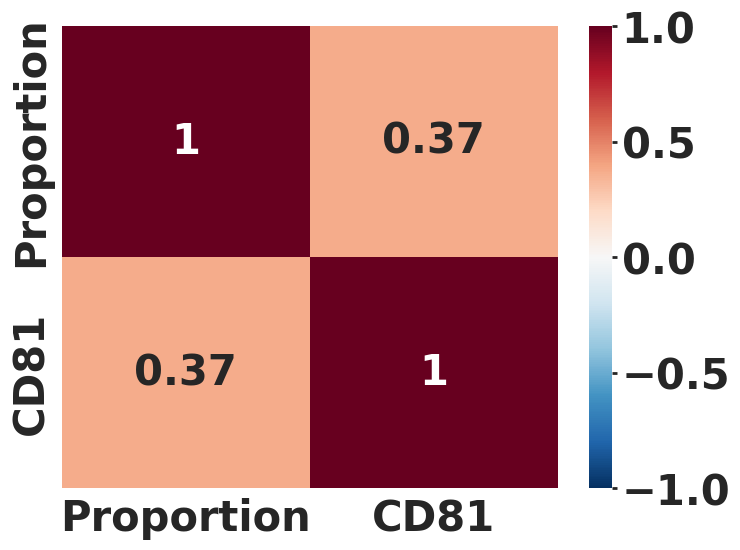

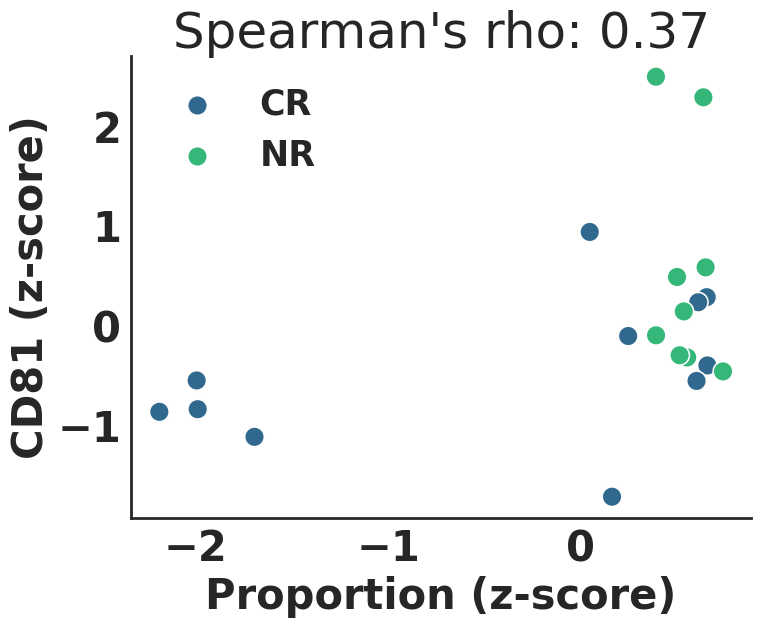

In [12]:
import scanpy as sc
import numpy as np
import pandas as pd
from scipy.sparse import issparse
from sklearn.preprocessing import LabelEncoder
from scipy.stats import zscore, spearmanr
import matplotlib.pyplot as plt
import seaborn as sns

# Load log-transformed dataset for proportions
adata_log = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD4_CD8A_highly_variable_log.h5ad')
adata_log_CD8 = adata_log[adata_log.obs['cell_type'] == 'CD8'].copy()
adata_log_CR_NR = adata_log_CD8[(adata_log_CD8.obs['response'] == 'CR') | (adata_log_CD8.obs['response'] == 'NR')].copy()

# Load combat-corrected dataset for counts
adata_combat = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD4_CD8A_highly_variable_combat.h5ad')
adata_combat_CD8 = adata_combat[adata_combat.obs['cell_type'] == 'CD8'].copy()
adata_combat_CR_NR = adata_combat_CD8[adata_combat_CD8.obs['response'].isin(['CR', 'NR'])].copy()

# Define gene pairs
gene_pairs = [
    ("CD81")
]

# Set global font and line styles for bold
plt.rcParams['font.weight'] = 'bold'
plt.rcParams['font.size'] = 30
plt.rcParams['axes.linewidth'] = 2
plt.rcParams['axes.labelweight'] = 'bold'
plt.rcParams['xtick.major.width'] = 2
plt.rcParams['ytick.major.width'] = 2

# Prepare the data for JUND
print(f'Gene: {gene}')
model_data = []
patients = adata_log_CR_NR.obs['barcode'].unique()

for patient in patients:
    # Proportions using log-transformed data
    patient_data_log = adata_log_CR_NR[adata_log_CR_NR.obs['barcode'] == patient]
    gene_expr_log = patient_data_log[:, gene].X.toarray().flatten() > 0 if issparse(patient_data_log.X) else patient_data_log[:, gene].X > 0
    proportion = np.sum(gene_expr_log) / patient_data_log.shape[0]

    # Gene counts using combat-corrected data
    patient_data_combat = adata_combat_CR_NR[adata_combat_CR_NR.obs['barcode'] == patient]
    gene_count = np.mean(patient_data_combat[:, gene].X)

    # Append the data for analysis
    model_data.append({
        'Patient': patient,
        'Response': patient_data_log.obs['response'].values[0],
        'Proportion': proportion,
        f'{gene}': gene_count
    })

# Convert the model_data list to a DataFrame
model_df = pd.DataFrame(model_data)
model_df[f'{gene}'] = model_df[f'{gene}'].astype(float)

# Normalize the variables using Z-scores
model_df['Proportion'] = zscore(model_df['Proportion'])
model_df[f'{gene}'] = zscore(model_df[f'{gene}'])

# Heatmap of Spearman Correlation (using z-score normalized data)
correlation_matrix = model_df[['Proportion', f'{gene}']].corr(method='spearman')
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='RdBu_r', vmin=-1, vmax=1)
plt.show()

# Scatter plot with Spearman's rho displayed (using z-score normalized data)
plt.figure(figsize=(8, 6))
scatter_plot = sns.scatterplot(x=model_df['Proportion'], y=model_df[f'{gene}'], hue=model_df['Response'], palette='viridis', s=200)
plt.legend(frameon=False, loc='best', fontsize='small', scatterpoints=1, markerscale=2)  # `frameon=False` removes the frame, `fontsize='small'` reduces legend size
rho, _ = spearmanr(model_df['Proportion'], model_df[f'{gene}'])
plt.title(f"Spearman's rho: {rho:.2f}")

plt.xlabel('Proportion (z-score)')
plt.ylabel(f'{gene} (z-score)')
sns.despine(top=True, right=True)
plt.show()



25% quantile of CD81 expression in CR and NR patients: 0.7195463239102338
Mann-Whitney U test for IL2RB with CD81high vs CD81low: U-statistic = 74386836.0, p-value = 9.358950869482428e-08


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


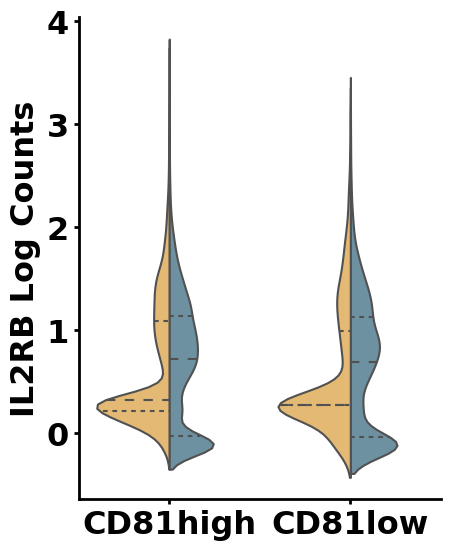

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


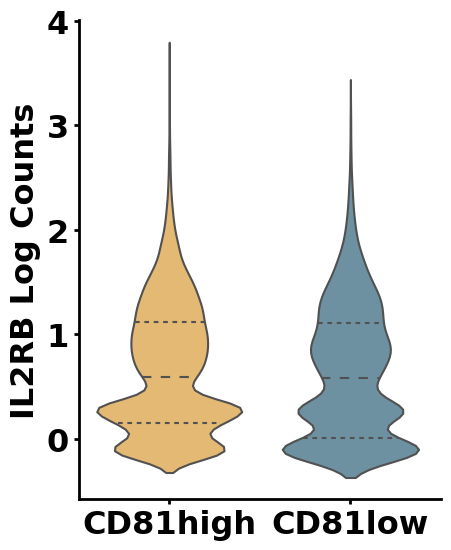

Mann-Whitney U test for IL7R with CD81high vs CD81low: U-statistic = 70925684.0, p-value = 0.4748702795701214


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


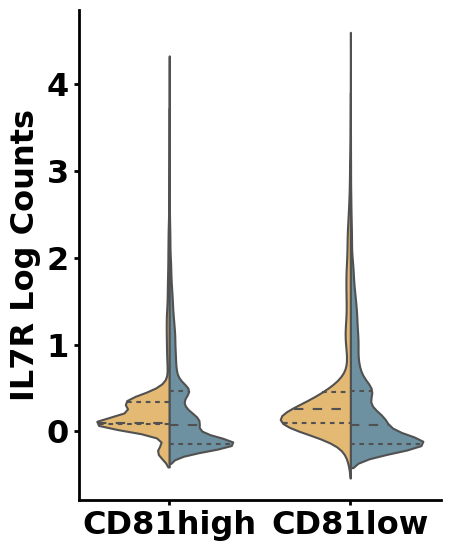

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


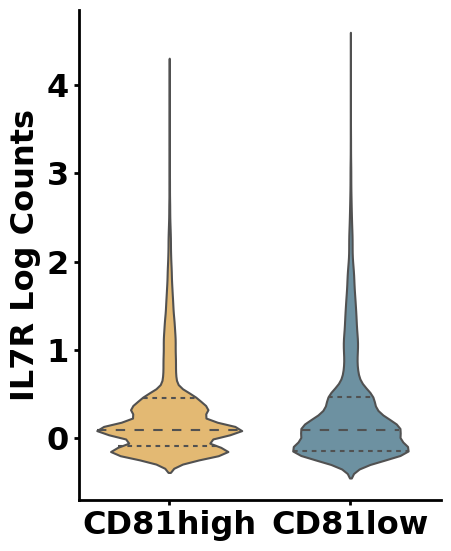

Mann-Whitney U test for CXCR3 with CD81high vs CD81low: U-statistic = 72952277.0, p-value = 0.004645365226753222


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


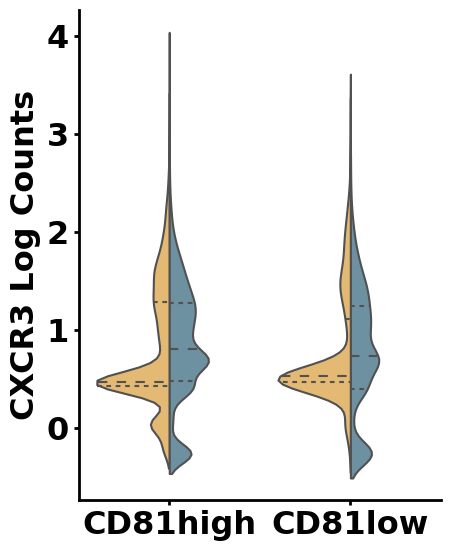

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


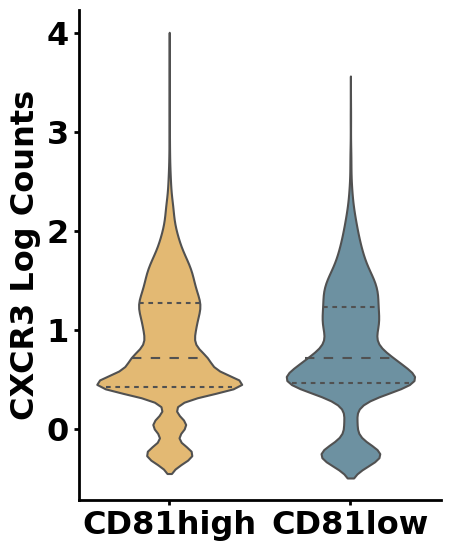

Mann-Whitney U test for CD27 with CD81high vs CD81low: U-statistic = 76360021.5, p-value = 1.6041131554882032e-18


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


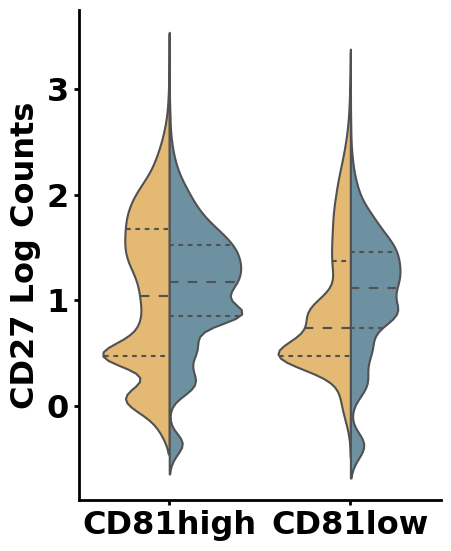

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


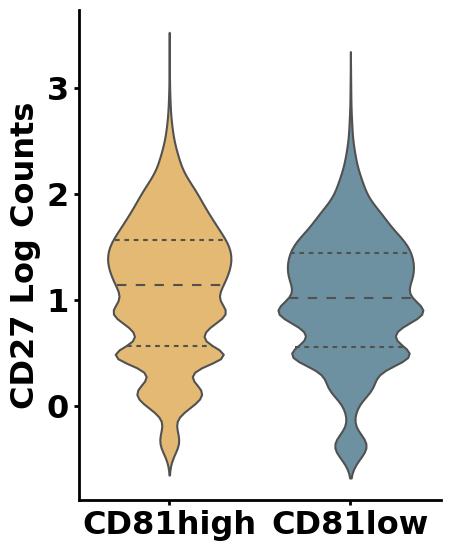

Mann-Whitney U test for CD28 with CD81high vs CD81low: U-statistic = 72347763.5, p-value = 0.07382193804372948


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


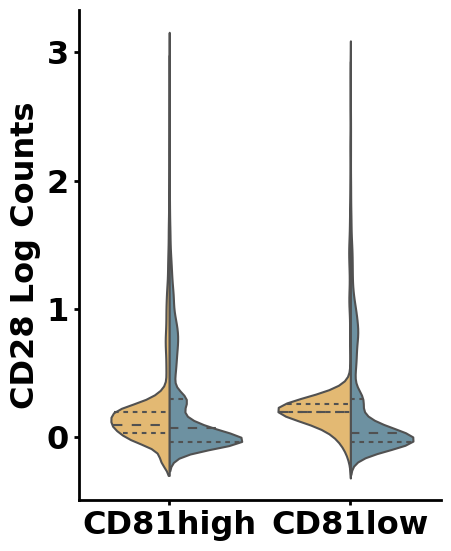

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


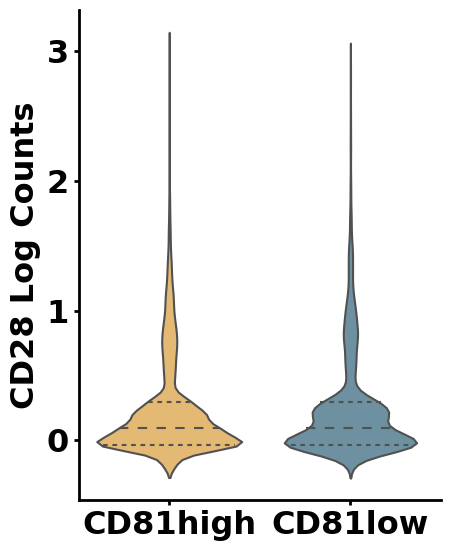

Mann-Whitney U test for ICOS with CD81high vs CD81low: U-statistic = 68924157.0, p-value = 2.2083026138337038e-05


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


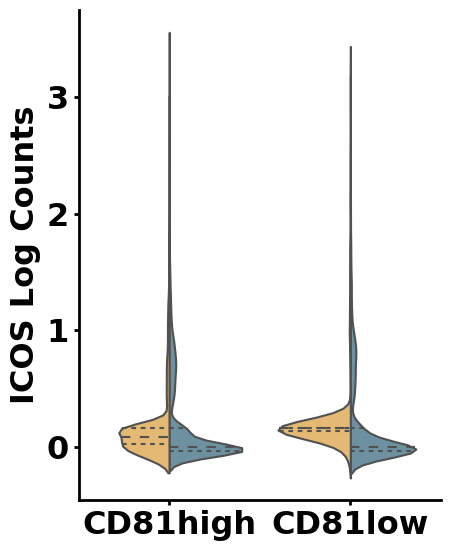

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


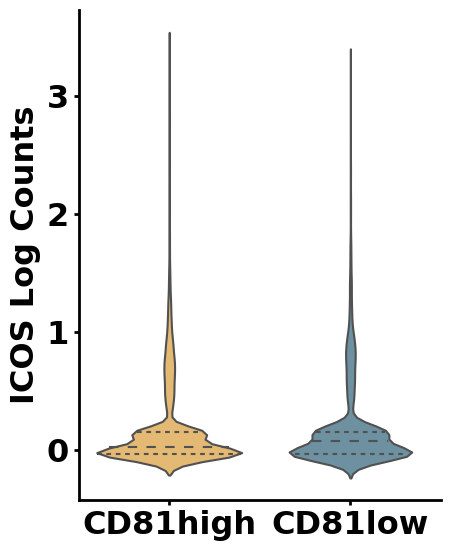

Mann-Whitney U test for CTLA4 with CD81high vs CD81low: U-statistic = 73212289.0, p-value = 0.0009464732420962056


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


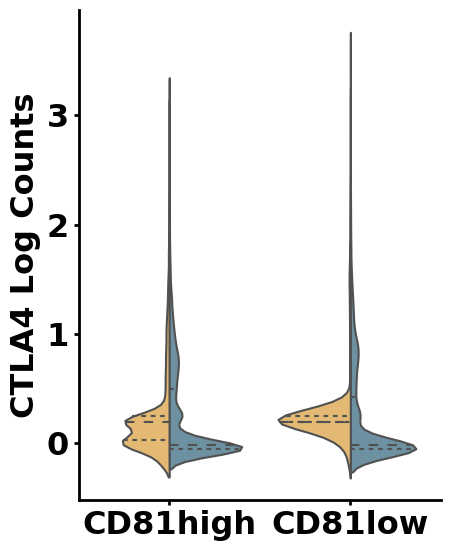

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


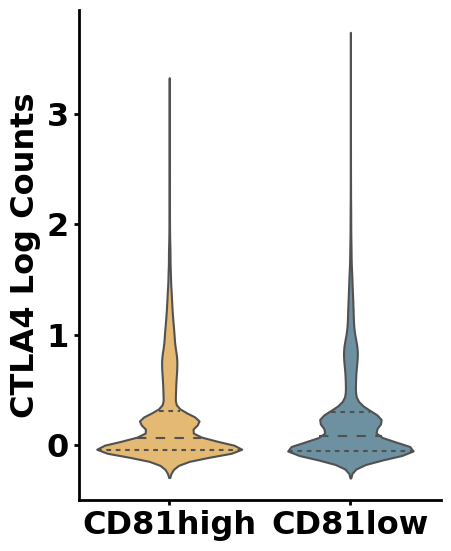

Mann-Whitney U test for LAG3 with CD81high vs CD81low: U-statistic = 77228301.0, p-value = 6.938018669563285e-25


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


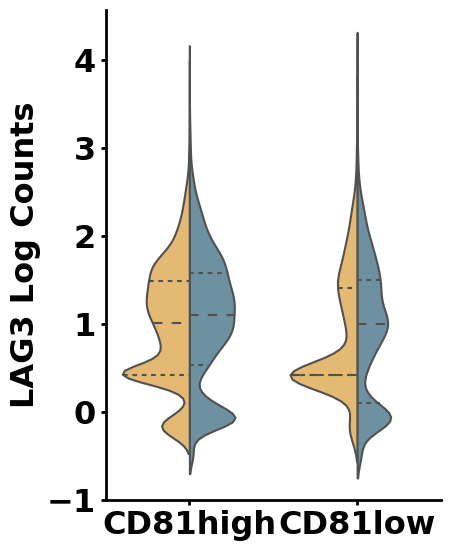

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


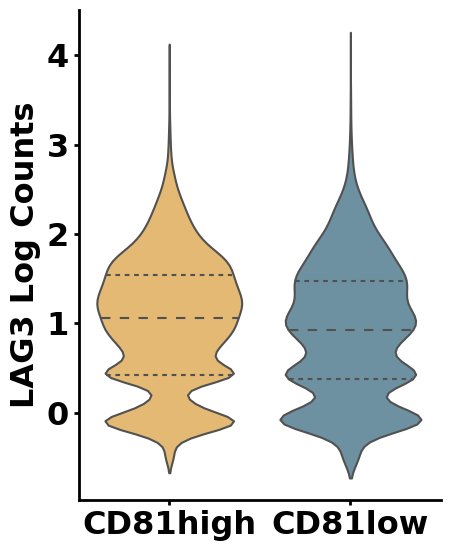

Mann-Whitney U test for PDCD1 with CD81high vs CD81low: U-statistic = 74651226.0, p-value = 6.036494687026297e-09


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


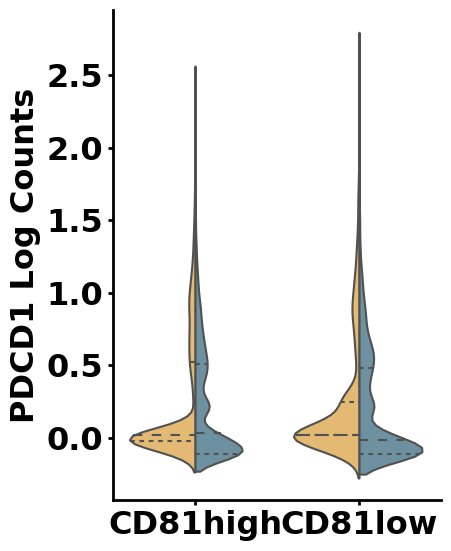

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


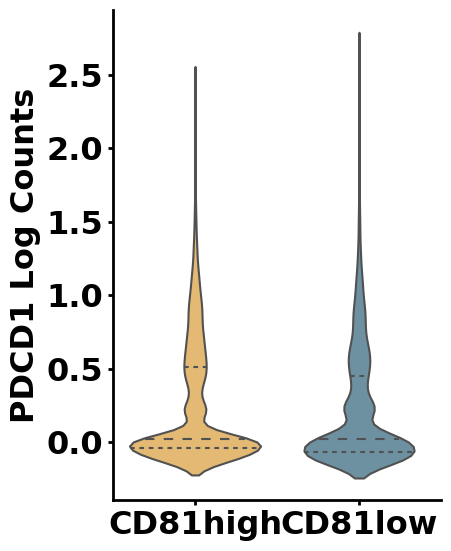

Mann-Whitney U test for HAVCR2 with CD81high vs CD81low: U-statistic = 74547197.5, p-value = 1.8910422301952844e-08


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


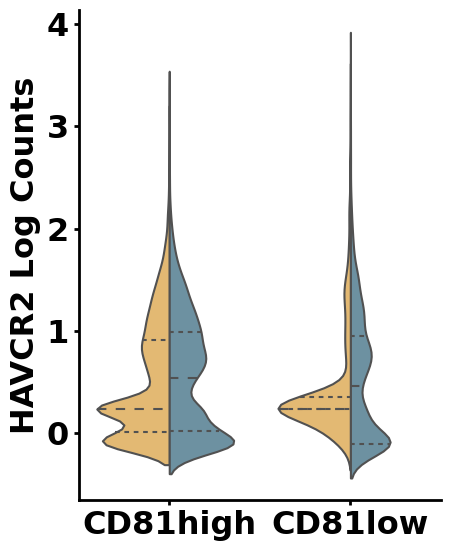

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


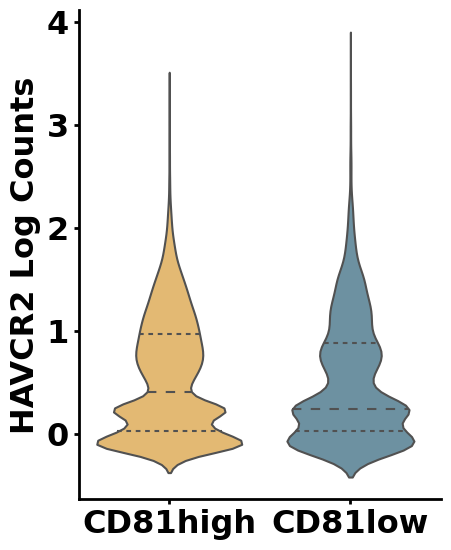

Mann-Whitney U test for TIGIT with CD81high vs CD81low: U-statistic = 72694695.0, p-value = 0.01713566949325752


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


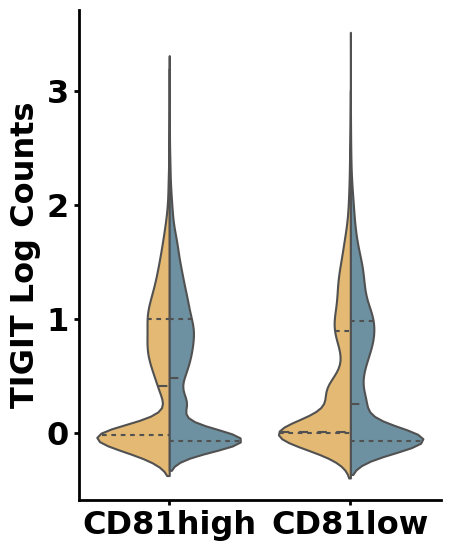

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


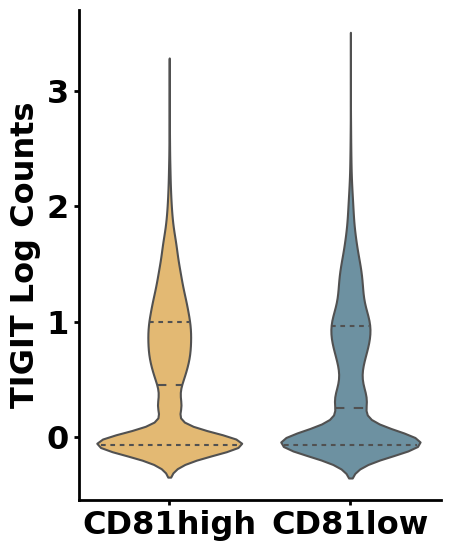

Mann-Whitney U test for IL2RA with CD81high vs CD81low: U-statistic = 74795711.5, p-value = 7.96330240788439e-10


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


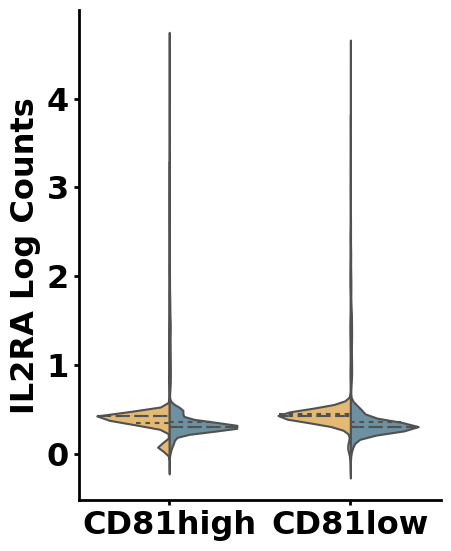

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


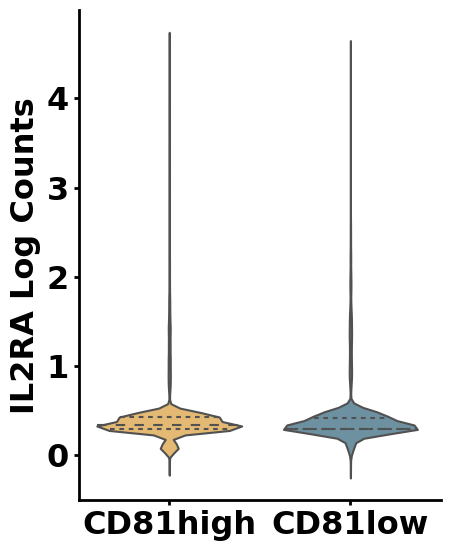

Mann-Whitney U test for CD38 with CD81high vs CD81low: U-statistic = 71454432.0, p-value = 0.8299484769095471


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


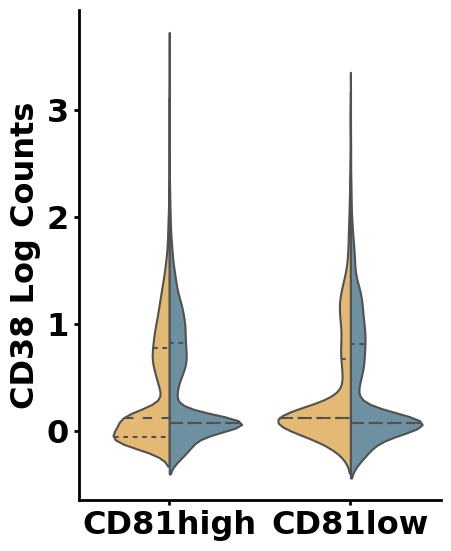

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


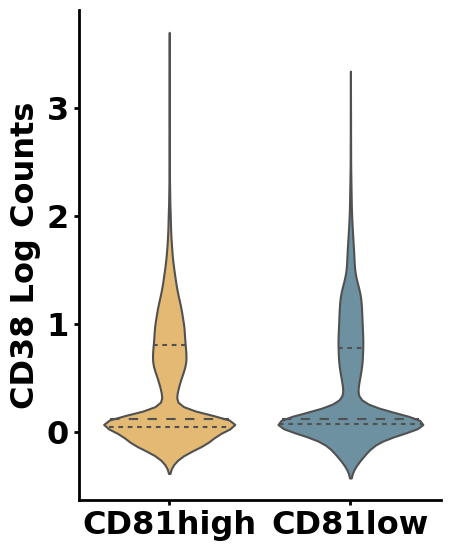

Mann-Whitney U test for MKI67 with CD81high vs CD81low: U-statistic = 67416914.0, p-value = 6.25665223085376e-12


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


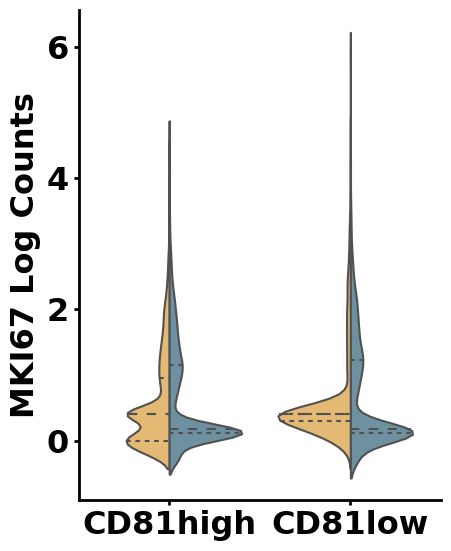

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


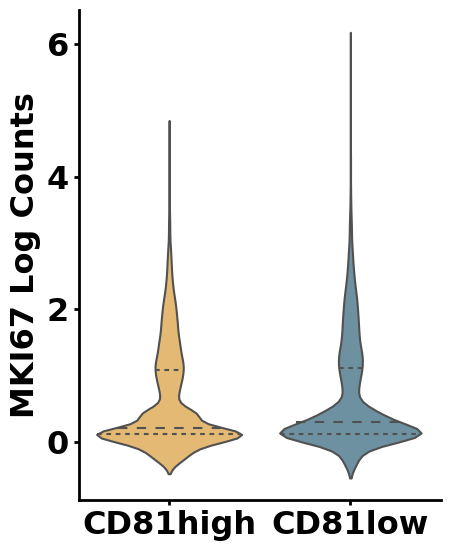

Mann-Whitney U test for PRDM1 with CD81high vs CD81low: U-statistic = 75189433.0, p-value = 1.3959212786270108e-11


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


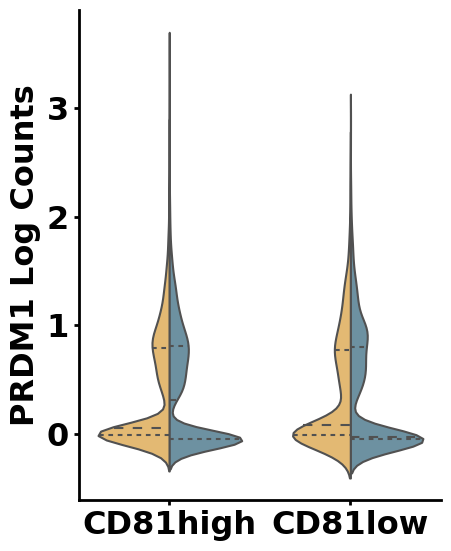

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


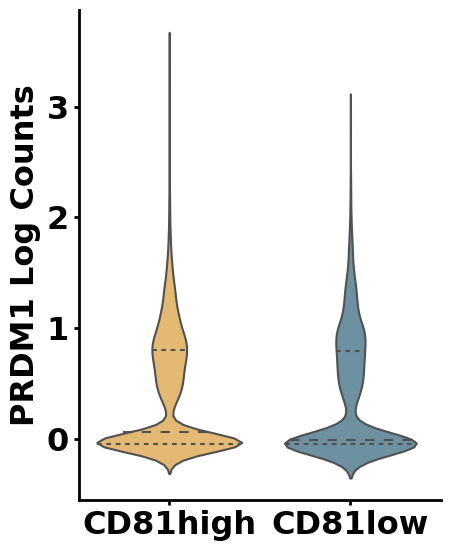

Mann-Whitney U test for TBX21 with CD81high vs CD81low: U-statistic = 75594198.0, p-value = 9.328618574281359e-14


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


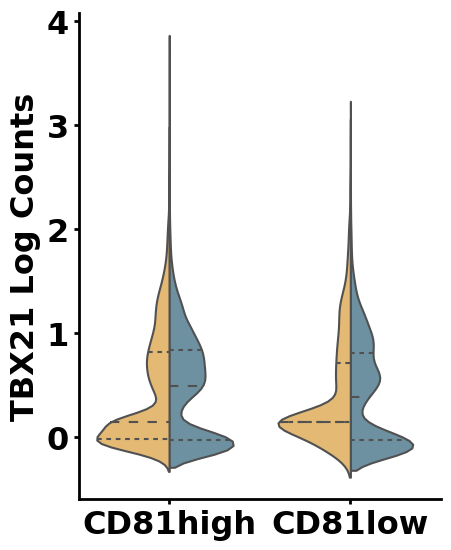

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


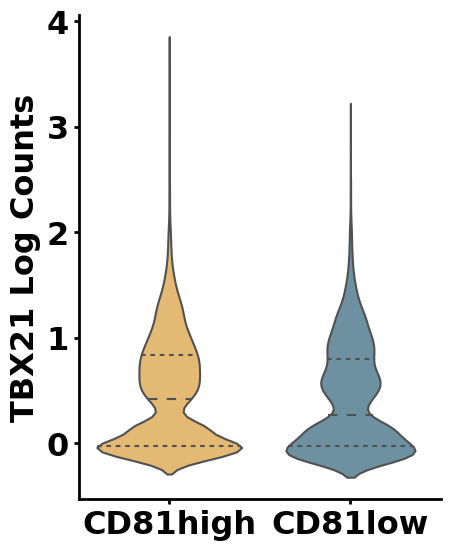

Mann-Whitney U test for B3GAT1 with CD81high vs CD81low: U-statistic = 65366520.5, p-value = 2.2000337457190776e-26


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


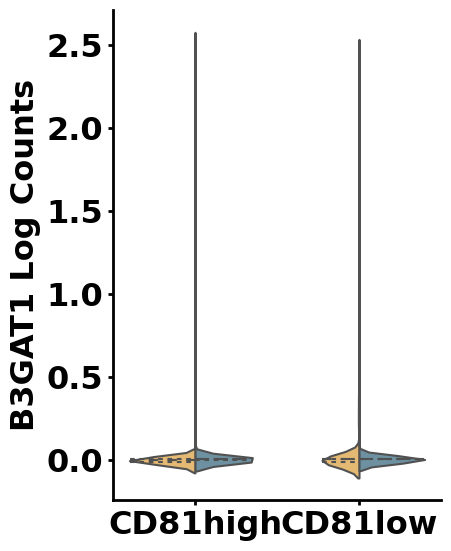

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


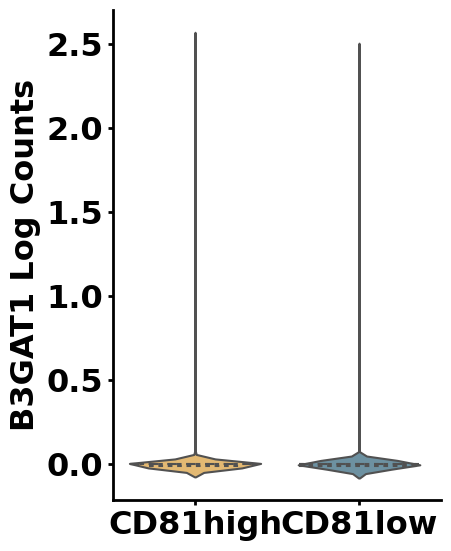

Bonferroni corrected p-value for IL2RB: 1.5910216478120127e-06
Bonferroni corrected p-value for IL7R: 1.0
Bonferroni corrected p-value for CXCR3: 0.07897120885480478
Bonferroni corrected p-value for CD27: 2.7269923643299455e-17
Bonferroni corrected p-value for CD28: 1.0
Bonferroni corrected p-value for ICOS: 0.00037541144435172965
Bonferroni corrected p-value for CTLA4: 0.016090045115635495
Bonferroni corrected p-value for LAG3: 1.1794631738257584e-23
Bonferroni corrected p-value for PDCD1: 1.0262040967944706e-07
Bonferroni corrected p-value for HAVCR2: 3.2147717913319834e-07
Bonferroni corrected p-value for TIGIT: 0.29130638138537784
Bonferroni corrected p-value for IL2RA: 1.3537614093403463e-08
Bonferroni corrected p-value for CD38: 1.0
Bonferroni corrected p-value for MKI67: 1.0636308792451392e-10
Bonferroni corrected p-value for PRDM1: 2.3730661736659185e-10
Bonferroni corrected p-value for TBX21: 1.585865157627831e-12
Bonferroni corrected p-value for B3GAT1: 3.7400573677224316e-25

In [1]:
import scanpy as sc
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.sparse import issparse
from scipy.stats import mannwhitneyu

# Load log-transformed dataset
adata_combat = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD4_CD8A_highly_variable_combat.h5ad')
adata_combat_CD8 = adata_combat[adata_combat.obs['cell_type'] == 'CD8'].copy()
adata_combat_CR_NR = adata_combat_CD8[(adata_combat_CD8.obs['response'] == 'CR') | (adata_combat_CD8.obs['response'] == 'NR')].copy()

# Define the gene list for comparison and focus on JUND
genes = [
    "IL2RB",  # CD122 (IL2Rβ)
    "IL7R",   # CD127 (IL7Rα)
    "CXCR3",  # CD183 (CXCR3)
    "CD27",   # CD27
    "CD28",   # CD28
    "ICOS",   # CD278 (ICOS)
    "CTLA4",  # CD152 (CTLA4)
    "LAG3",   # CD223 (LAG3)
    "PDCD1",  # CD279 (PD1)
    "HAVCR2", # CD366 (TIM3)
    "TIGIT",  # TIGIT
    "IL2RA",  # CD25 (IL2Rα)
    "CD38",   # CD38 (ADPRC1)
    "MKI67",  # Ki-67
    "PRDM1",  # Blimp-1
    "TBX21",  # T-bet
    "B3GAT1"  # CD57
]

# Identify JUND+ and JUND- populations using log-transformed data
primary_gene = "CD81"
# # Calculate the 25% quantile of JUND expression
gene_expression_CR_NR = adata_combat_CR_NR[:, primary_gene].X.toarray().flatten() if issparse(adata_combat_CR_NR.X) else adata_combat_CR_NR[:, primary_gene].X.flatten()
mask_CD81_positive_25perct = np.quantile(gene_expression_CR_NR, 0.25)
print(f"25% quantile of CD81 expression in CR and NR patients: {mask_CD81_positive_25perct}")

# Apply this threshold to label cells in both CR and NR populations
#adata_combat_CR_NR.obs[f'{primary_gene}_positive'] = np.where(gene_expression_all > mask_jund_positive_25perct, 'JUND+', 'JUND-')
adata_combat_CR_NR.obs[f'{primary_gene}_positive'] = np.where(gene_expression_CR_NR > mask_CD81_positive_25perct, 'CD81high', 'CD81low')
adata_combat_CR_NR.obs[f'{primary_gene}_positive'] = adata_combat_CR_NR.obs[f'{primary_gene}_positive'].astype('category')

# Convert data to a DataFrame for plotting
df = adata_combat_CR_NR.to_df()
df[f'{primary_gene}_positive'] = adata_combat_CR_NR.obs[f'{primary_gene}_positive'].values
df['response'] = adata_combat_CR_NR.obs['response'].values  # Add the response column

# Set the order for the x-axis categories to ensure JUND+ appears first
category_order = ['CD81high', 'CD81low']

# Initialize a list to store p-values for Bonferroni correction
p_values = []

# Loop through each gene in the list and compare its expression between JUND+ and JUND− cells
plt.rcParams['font.weight'] = 'bold'
plt.rcParams['font.size'] = 23
plt.rcParams['axes.linewidth'] = 2
plt.rcParams['axes.labelweight'] = 'bold'
plt.rcParams['xtick.major.width'] = 2
plt.rcParams['ytick.major.width'] = 2

for gene in genes:
    if gene in adata_combat_CR_NR.var_names:
        df['value'] = adata_combat_CR_NR[:, adata_combat_CR_NR.var_names == gene].X.toarray().flatten()

        # Separate values for cells expressing JUND (JUND+) and not expressing JUND (JUND−)
        group_jund_positive = df[df[f'{primary_gene}_positive'] == 'CD81high']['value']
        group_jund_negative = df[df[f'{primary_gene}_positive'] == 'CD81low']['value']

        # Perform Mann-Whitney U test to compare JUND+ and JUND−
        stat, p_value = mannwhitneyu(group_jund_positive, group_jund_negative, alternative='two-sided')
        p_values.append(p_value)
        print(f"Mann-Whitney U test for {gene} with CD81high vs CD81low: U-statistic = {stat}, p-value = {p_value}")

        # Create the violin plot using seaborn, split by JUND expression
        plt.figure(figsize=(5, 6))
        sns.violinplot(data=df, x=f'{primary_gene}_positive', y='value', hue = 'response', split=True, inner="quart", palette=["#F6BD60", '#6494AA'], order=category_order)
        
        #sns.stripplot(data=df, x=f'{primary_gene}_positive', y='value', hue='response', dodge=True, palette=["black"], order=category_order, jitter=True, size=4, alpha=0.5)
        sns.despine()  # Remove the top and right spines

        # Remove the legend
        plt.legend([], [], frameon=False)
        # Customize the plot
        plt.title(f'')
        plt.xlabel('')
        plt.ylabel(f'{gene} Log Counts')
        plt.tight_layout()

        # Save or display the plot
        #plt.savefig(f'/home/emma/result/CART/violinplot_JUND/{primary_gene}_{gene}_violinplot.png')
        plt.show()
        
        plt.figure(figsize=(5, 6))
        sns.violinplot(data=df, x=f'{primary_gene}_positive', y='value', inner="quart", palette=["#F6BD60", '#6494AA'], order=category_order)
        #sns.stripplot(data=df, x=f'{primary_gene}_positive', y='value', hue='response', dodge=True, palette=["black"], order=category_order, jitter=True, size=4, alpha=0.5)
        sns.despine()  # Remove the top and right spines

        # Remove the legend
        plt.legend([], [], frameon=False)
        # Customize the plot
        plt.title(f'')
        plt.xlabel('')
        plt.ylabel(f'{gene} Log Counts')
        plt.tight_layout()

        # Save or display the plot
        #plt.savefig(f'/home/emma/result/CART/violinplot_JUND/{primary_gene}_{gene}_violinplot.png')
        plt.show()
    else:
        print(f"{gene} is not present in the variable names. Please check your adata object.")

# Apply Bonferroni correction
bonferroni_corrected_p_values = np.minimum(np.array(p_values) * len(genes), 1.0)

# Print corrected p-values
for gene, corrected_p_value in zip(genes, bonferroni_corrected_p_values):
    print(f"Bonferroni corrected p-value for {gene}: {corrected_p_value}")

Mann-Whitney U test for IL2RB with JhZh vs JlZl: U-statistic = 75835965.0, p-value = 0.00041963927574111963


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


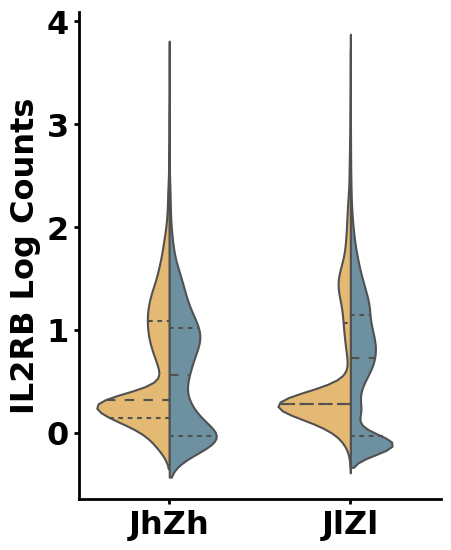

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


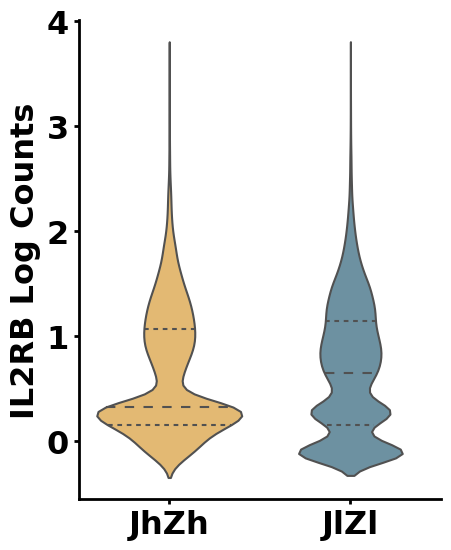

Mann-Whitney U test for IL7R with JhZh vs JlZl: U-statistic = 94077949.0, p-value = 4.838914882492838e-162


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


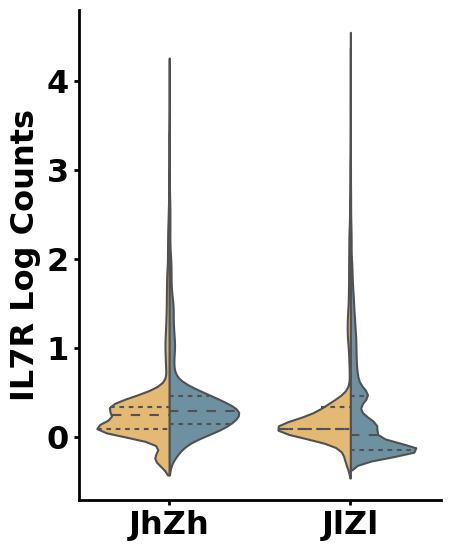

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


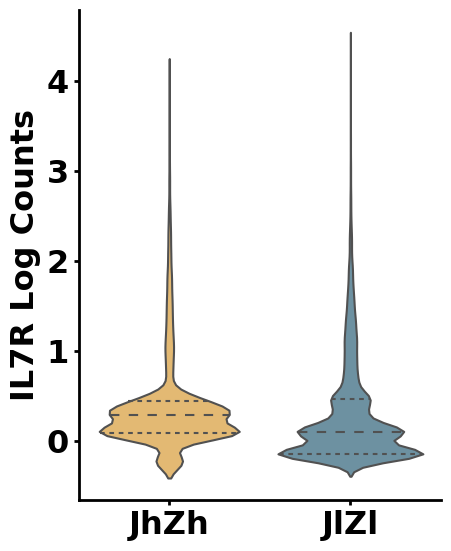

Mann-Whitney U test for CXCR3 with JhZh vs JlZl: U-statistic = 81449452.5, p-value = 4.727221054352356e-09


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


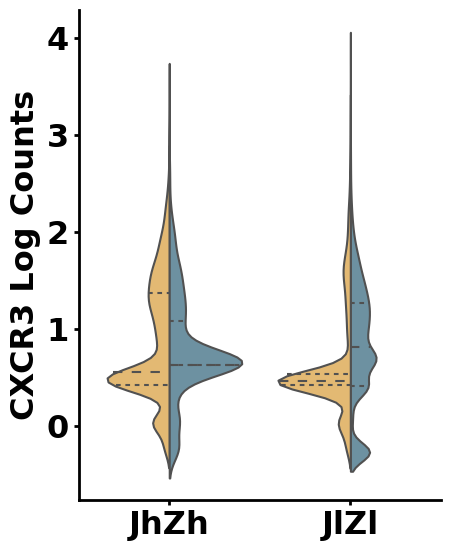

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


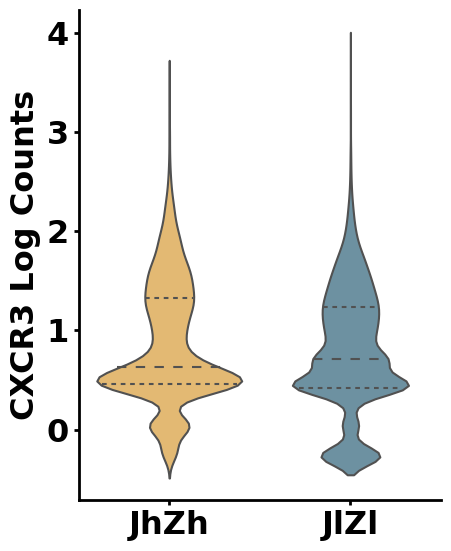

Mann-Whitney U test for CD27 with JhZh vs JlZl: U-statistic = 115998548.0, p-value = 0.0


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


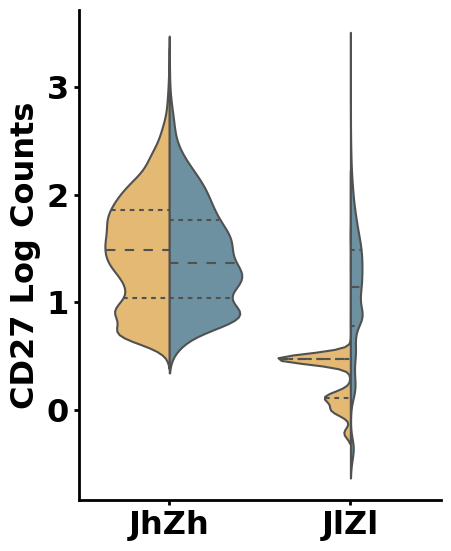

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


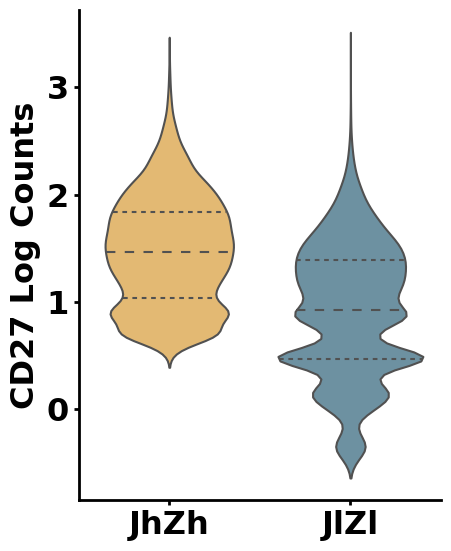

Mann-Whitney U test for CD28 with JhZh vs JlZl: U-statistic = 95243067.0, p-value = 1.5318916488281087e-186


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


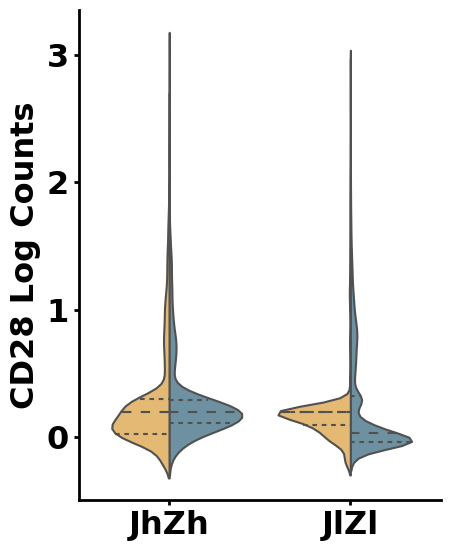

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


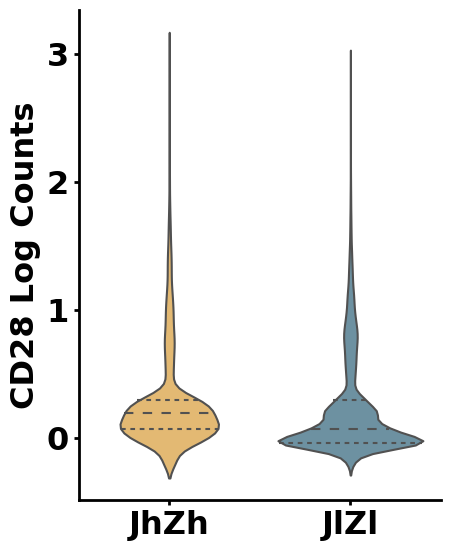

Mann-Whitney U test for ICOS with JhZh vs JlZl: U-statistic = 87222593.0, p-value = 4.1401204549129145e-55


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


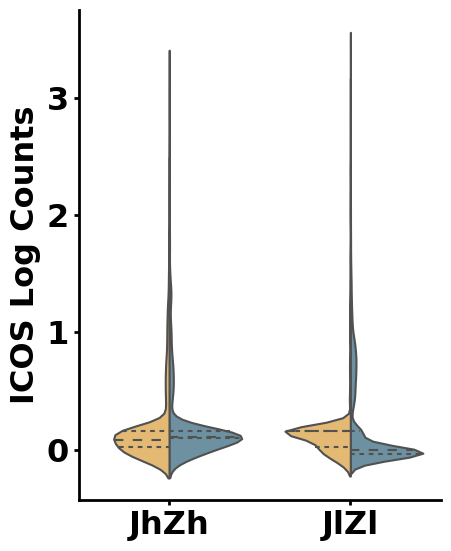

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


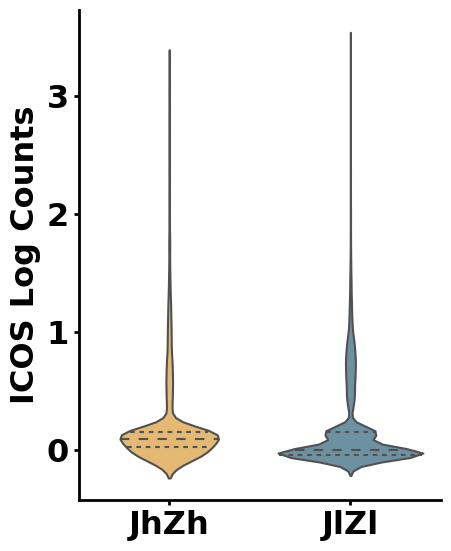

Mann-Whitney U test for CTLA4 with JhZh vs JlZl: U-statistic = 94004700.0, p-value = 1.0067233431260325e-160


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


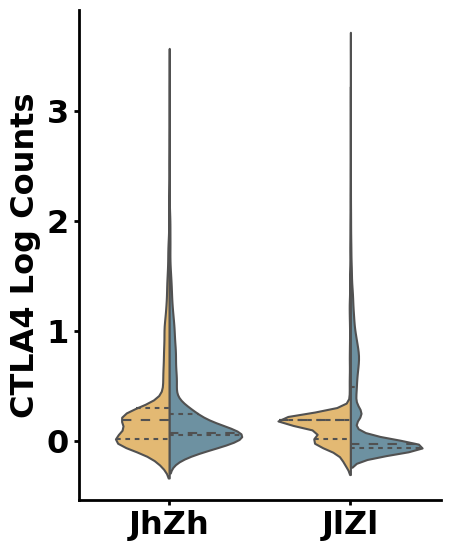

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


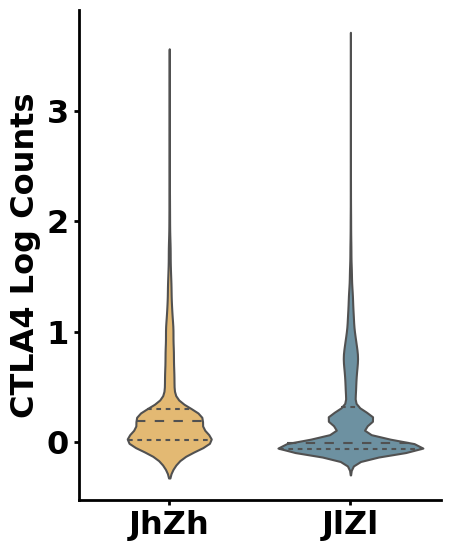

Mann-Whitney U test for LAG3 with JhZh vs JlZl: U-statistic = 79393485.5, p-value = 0.015526476477987551


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


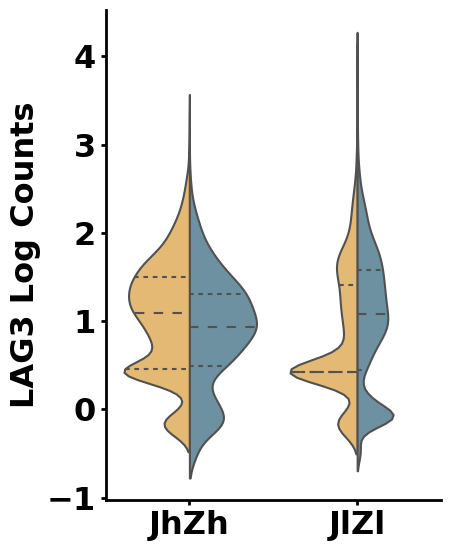

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


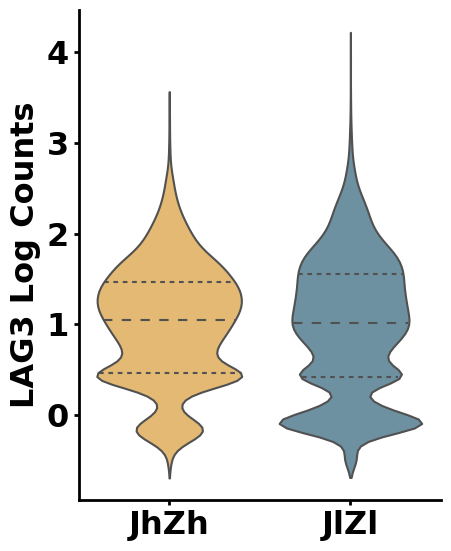

Mann-Whitney U test for PDCD1 with JhZh vs JlZl: U-statistic = 85732595.5, p-value = 6.11156175594617e-39


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


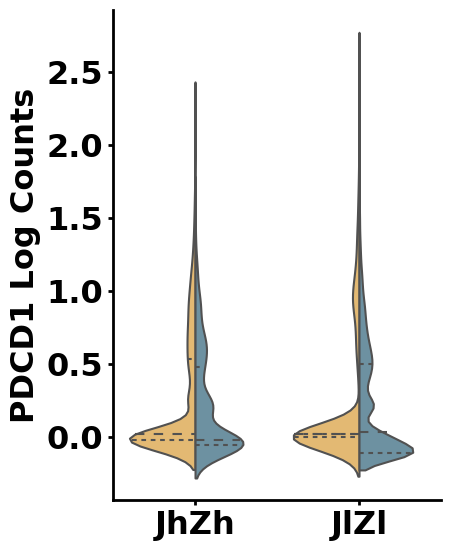

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


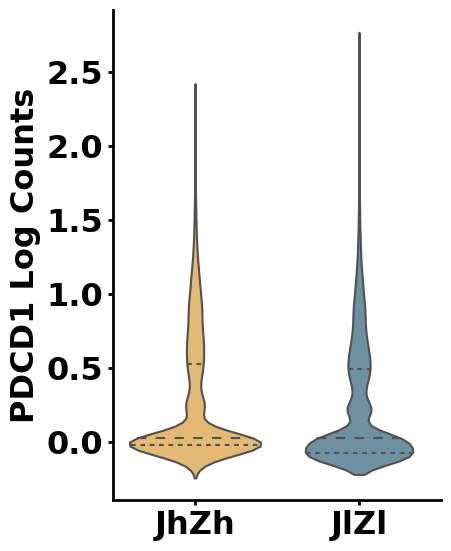

Mann-Whitney U test for HAVCR2 with JhZh vs JlZl: U-statistic = 82579356.5, p-value = 9.11354999161498e-15


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


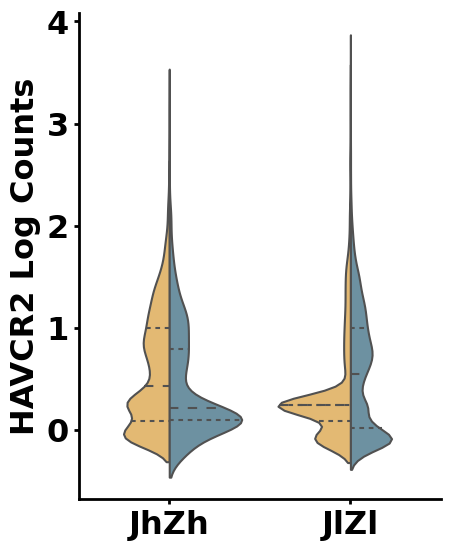

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


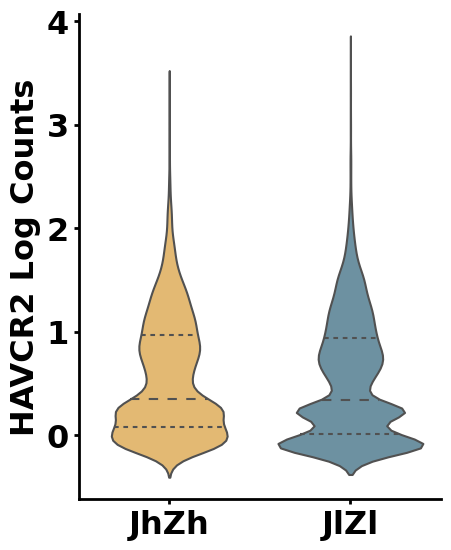

Mann-Whitney U test for TIGIT with JhZh vs JlZl: U-statistic = 84943527.0, p-value = 1.099647527211124e-31


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


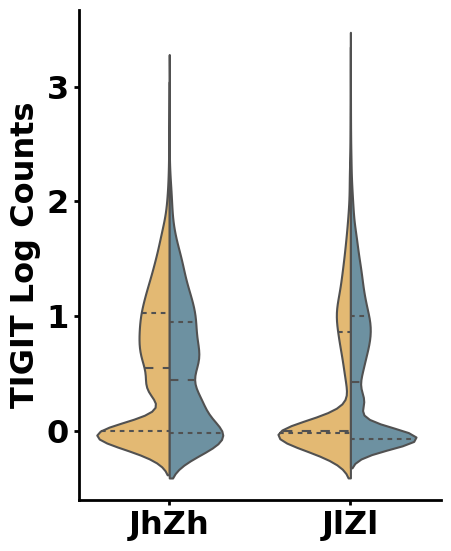

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


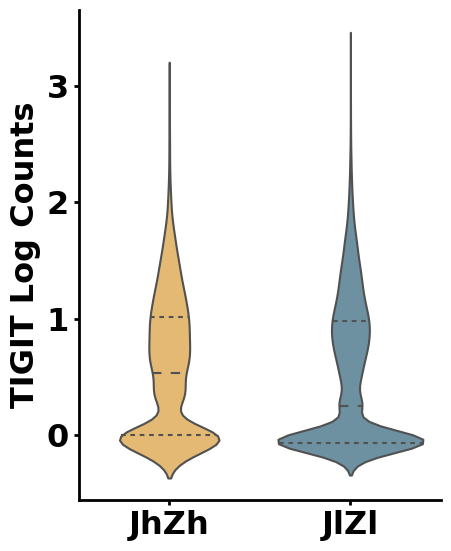

Mann-Whitney U test for IL2RA with JhZh vs JlZl: U-statistic = 103794267.5, p-value = 0.0


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


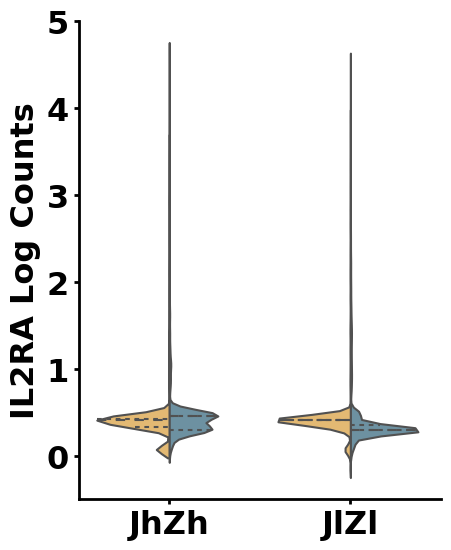

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


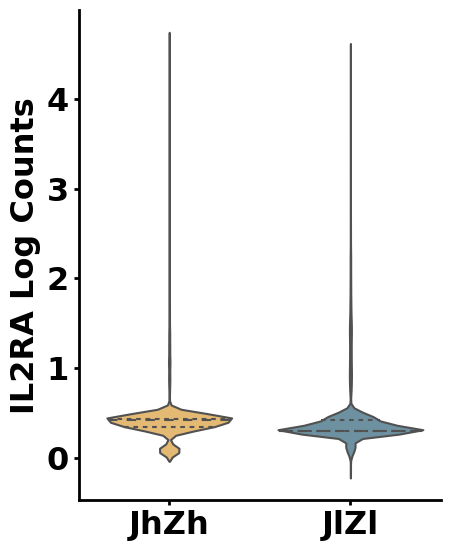

Mann-Whitney U test for CD38 with JhZh vs JlZl: U-statistic = 75327491.5, p-value = 1.0740537714882312e-05


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


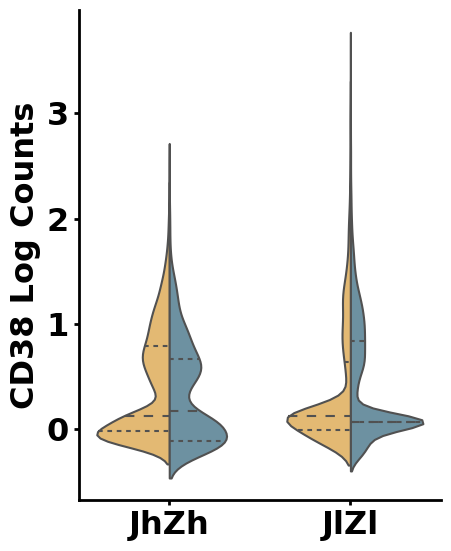

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


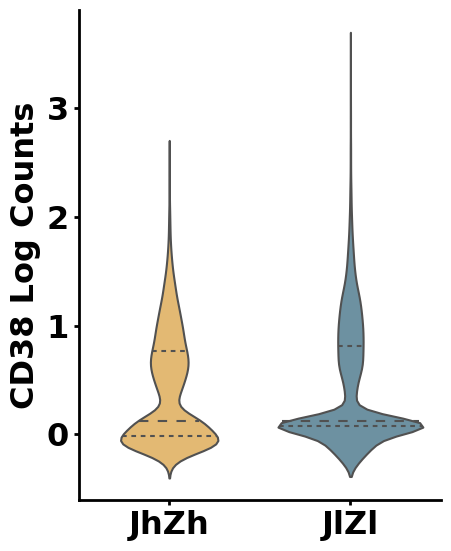

Mann-Whitney U test for MKI67 with JhZh vs JlZl: U-statistic = 76259230.0, p-value = 0.00462077930940522


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


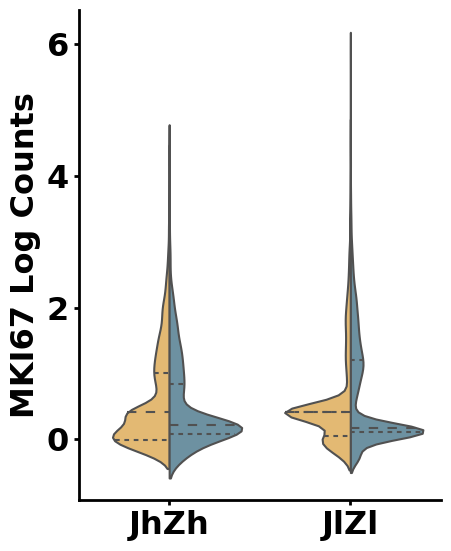

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


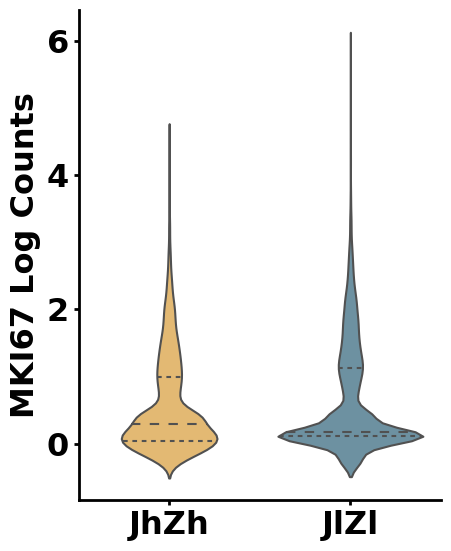

Mann-Whitney U test for PRDM1 with JhZh vs JlZl: U-statistic = 82312093.5, p-value = 2.5029753155895766e-13


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


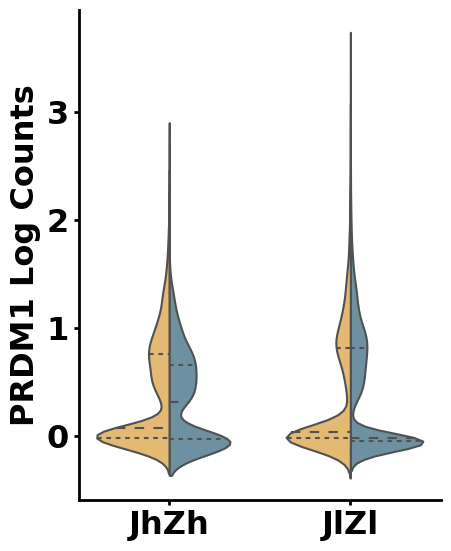

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


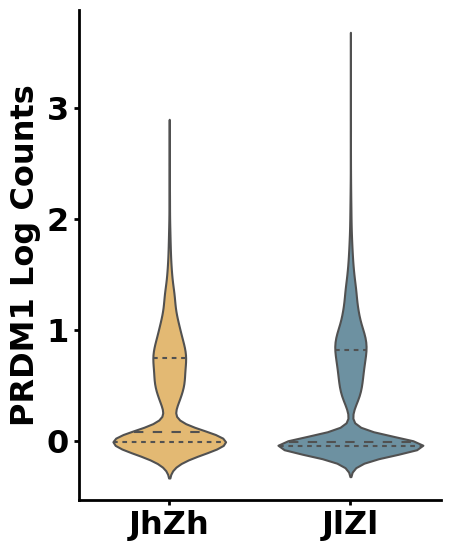

Mann-Whitney U test for TBX21 with JhZh vs JlZl: U-statistic = 74345186.5, p-value = 1.7346845452792927e-09


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


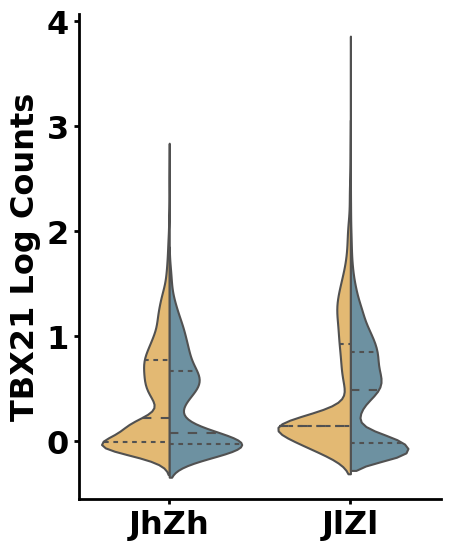

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


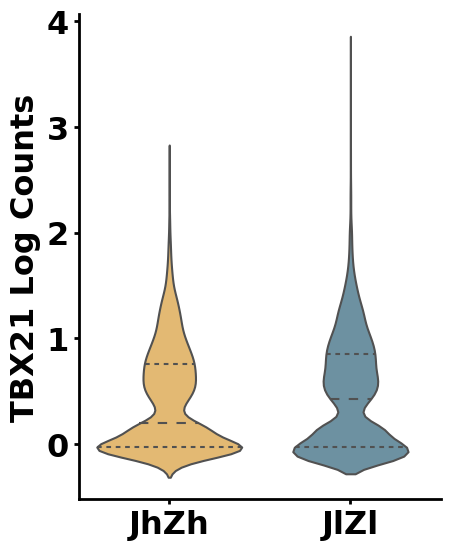

Mann-Whitney U test for B3GAT1 with JhZh vs JlZl: U-statistic = 46207569.5, p-value = 0.0


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


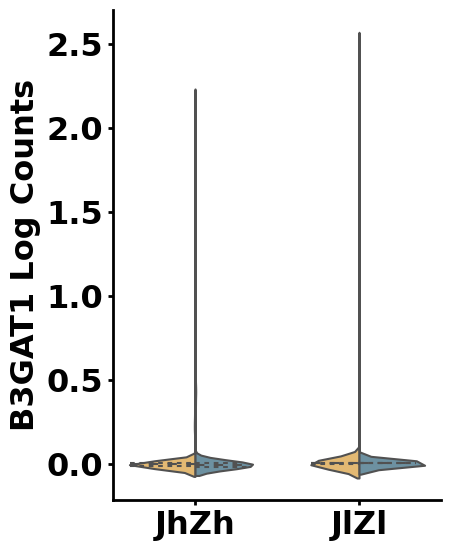

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


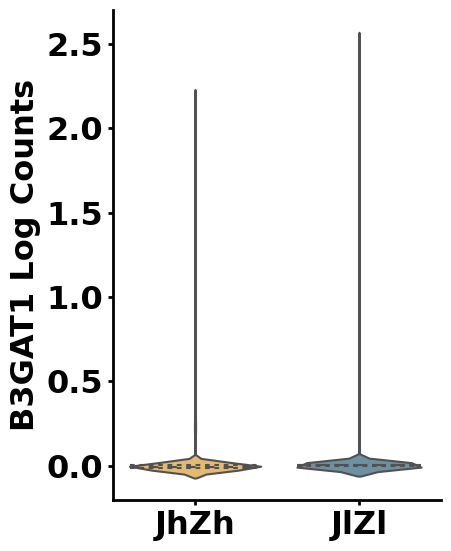

Bonferroni corrected p-value for IL2RB: 0.007133867687599034
Bonferroni corrected p-value for IL7R: 8.226155300237824e-161
Bonferroni corrected p-value for CXCR3: 8.036275792399004e-08
Bonferroni corrected p-value for CD27: 0.0
Bonferroni corrected p-value for CD28: 2.6042158030077847e-185
Bonferroni corrected p-value for ICOS: 7.038204773351955e-54
Bonferroni corrected p-value for CTLA4: 1.7114296833142551e-159
Bonferroni corrected p-value for LAG3: 0.2639501001257884
Bonferroni corrected p-value for PDCD1: 1.038965498510849e-37
Bonferroni corrected p-value for HAVCR2: 1.5493034985745465e-13
Bonferroni corrected p-value for TIGIT: 1.8694007962589107e-30
Bonferroni corrected p-value for IL2RA: 0.0
Bonferroni corrected p-value for CD38: 0.0001825891411529993
Bonferroni corrected p-value for MKI67: 0.07855324825988874
Bonferroni corrected p-value for PRDM1: 4.25505803650228e-12
Bonferroni corrected p-value for TBX21: 2.9489637269747977e-08
Bonferroni corrected p-value for B3GAT1: 0.0


In [1]:
import scanpy as sc
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import mannwhitneyu
from scipy.sparse import issparse

# Load combat-corrected dataset (for visualization)
adata_combat = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD4_CD8A_highly_variable_combat.h5ad')
adata_combat_CD8 = adata_combat[adata_combat.obs['cell_type'] == 'CD8'].copy()
adata_combat_CR_NR = adata_combat_CD8[(adata_combat_CD8.obs['response'] == 'CR') | (adata_combat_CD8.obs['response'] == 'NR')].copy()

# Define the gene list for marker comparison
genes = [
    "IL2RB",  # CD122 (IL2Rβ)
    "IL7R",   # CD127 (IL7Rα)
    "CXCR3",  # CD183 (CXCR3)
    "CD27",   # CD27
    "CD28",   # CD28
    "ICOS",   # CD278 (ICOS)
    "CTLA4",  # CD152 (CTLA4)
    "LAG3",   # CD223 (LAG3)
    "PDCD1",  # CD279 (PD1)
    "HAVCR2", # CD366 (TIM3)
    "TIGIT",  # TIGIT
    "IL2RA",  # CD25 (IL2Rα)
    "CD38",   # CD38 (ADPRC1)
    "MKI67",  # Ki-67
    "PRDM1",  # Blimp-1
    "TBX21",  # T-bet
    "B3GAT1"  # CD57
]


# Identify JUND+ and ZNF683+ populations using log-transformed data
primary_gene_1 = "DENND5A"
primary_gene_2 = "CD27"

# Calculate the 25% quantile of both genes' expression
JUND_CR_NR = adata_combat_CR_NR[:, primary_gene_1].X.toarray().flatten() if issparse(adata_combat_CR_NR.X) else adata_combat_CR_NR[:, primary_gene_1].X.flatten()
ZNF683_CR_NR = adata_combat_CR_NR[:, primary_gene_2].X.toarray().flatten() if issparse(adata_combat_CR_NR.X) else adata_combat_CR_NR[:, primary_gene_2].X.flatten()
mask_JUND_positive_25perct = np.quantile(JUND_CR_NR, 0.25)
mask_ZNF683_positive_25perct = np.quantile(ZNF683_CR_NR, 0.25)
mask_JUND_ZNF683_positive = (JUND_CR_NR > mask_JUND_positive_25perct) & (ZNF683_CR_NR > mask_ZNF683_positive_25perct)  # JUND+ZNF683+
adata_combat_CR_NR.obs[f'{primary_gene_1}_{primary_gene_2}_positive'] = np.where(mask_JUND_ZNF683_positive, 'JhZh', 'JlZl')
adata_combat_CR_NR.obs[f'{primary_gene_1}_{primary_gene_2}_positive'] = adata_combat_CR_NR.obs[f'{primary_gene_1}_{primary_gene_2}_positive'].astype('category')

# Convert data to a DataFrame for plotting
df = adata_combat_CR_NR.to_df()
df[f'{primary_gene_1}_{primary_gene_2}_positive'] = adata_combat_CR_NR.obs[f'{primary_gene_1}_{primary_gene_2}_positive'].values
df['response'] = adata_combat_CR_NR.obs['response'].values  # add response labels

# Set the order for the x-axis categories to ensure JUND+ZNF683+ appears first
category_order = ['JhZh', 'JlZl']

# Initialize a list to store p-values for Bonferroni correction
p_values = []

# Loop through each gene in the list and compare its expression between JUND+ZNF683+ and JUND-ZNF683- cells
plt.rcParams['font.weight'] = 'bold'
plt.rcParams['font.size'] = 23
plt.rcParams['axes.linewidth'] = 2
plt.rcParams['axes.labelweight'] = 'bold'
plt.rcParams['xtick.major.width'] = 2
plt.rcParams['ytick.major.width'] = 2

for gene in genes:
    if gene in adata_combat_CR_NR.var_names:
        df['value'] = adata_combat_CR_NR[:, adata_combat_CR_NR.var_names == gene].X.toarray().flatten()

        # Separate values for cells expressing JUND+ZNF683+ (J+Z+) and not (J-Z-)
        group_positive = df[df[f'{primary_gene_1}_{primary_gene_2}_positive'] == 'JhZh']['value']
        group_negative = df[df[f'{primary_gene_1}_{primary_gene_2}_positive'] == 'JlZl']['value']

        # Perform Mann-Whitney U test to compare J+Z+ and J-Z-
        stat, p_value = mannwhitneyu(group_positive, group_negative, alternative='two-sided')
        p_values.append(p_value)
        print(f"Mann-Whitney U test for {gene} with JhZh vs JlZl: U-statistic = {stat}, p-value = {p_value}")

        # Create the violin plot using seaborn, split by JUND_ZNF683 expression
        plt.figure(figsize=(5, 6))
        sns.violinplot(data=df, x=f'{primary_gene_1}_{primary_gene_2}_positive', y='value', hue='response', split=True, inner="quart", palette=["#F6BD60", '#6494AA'], order=category_order)
        sns.despine()  # Remove the top and right spines

        # Remove the legend and customize the plot
        plt.legend([], [], frameon=False)
        plt.title(f'')
        plt.xlabel('')
        plt.ylabel(f'{gene} Log Counts')
        plt.tight_layout()

        # Display the plot
        plt.show()

        plt.figure(figsize=(5, 6))
        sns.violinplot(data=df, x=f'{primary_gene_1}_{primary_gene_2}_positive', y='value', inner="quart", palette=["#F6BD60", '#6494AA'], order=category_order)
        #sns.stripplot(data=df, x=f'{primary_gene}_positive', y='value', hue='response', dodge=True, palette=["black"], order=category_order, jitter=True, size=4, alpha=0.5)
        sns.despine()  # Remove the top and right spines

        # Remove the legend
        plt.legend([], [], frameon=False)
        # Customize the plot
        plt.title(f'')
        plt.xlabel('')
        plt.ylabel(f'{gene} Log Counts')
        plt.tight_layout()

        # Save or display the plot
        #plt.savefig(f'/home/emma/result/CART/violinplot_JUND/{primary_gene}_{gene}_violinplot.png')
        plt.show()
    else:
        print(f"{gene} is not present in the variable names. Please check your adata object.")

# Apply Bonferroni correction
bonferroni_corrected_p_values = np.minimum(np.array(p_values) * len(genes), 1.0)

# Print corrected p-values
for gene, corrected_p_value in zip(genes, bonferroni_corrected_p_values):
    print(f"Bonferroni corrected p-value for {gene}: {corrected_p_value}")



Gene: CTLA4
D+CD+ vs D-CD- (All): BH corrected p=4.4230e-01
D+CD+ vs D-CD- (Responders only): BH corrected p=4.2246e-01
D+CD+ vs D-CD- (Non-responders only): BH corrected p=8.1634e-03


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


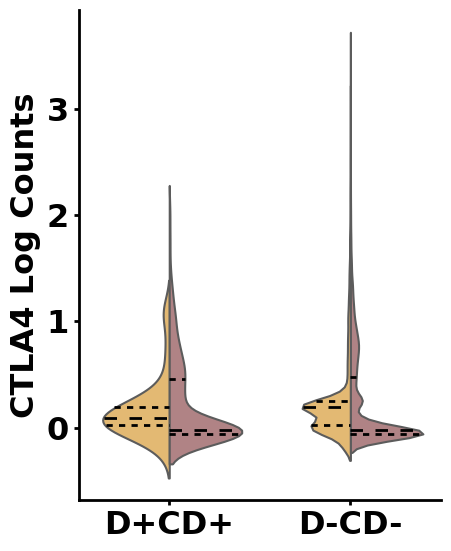

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


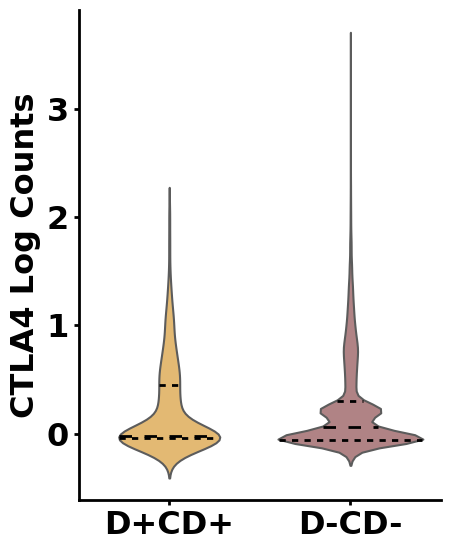

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)



Gene: LAG3
D+CD+ vs D-CD- (All): BH corrected p=2.5277e-10
D+CD+ vs D-CD- (Responders only): BH corrected p=1.0457e-01
D+CD+ vs D-CD- (Non-responders only): BH corrected p=6.3910e-12


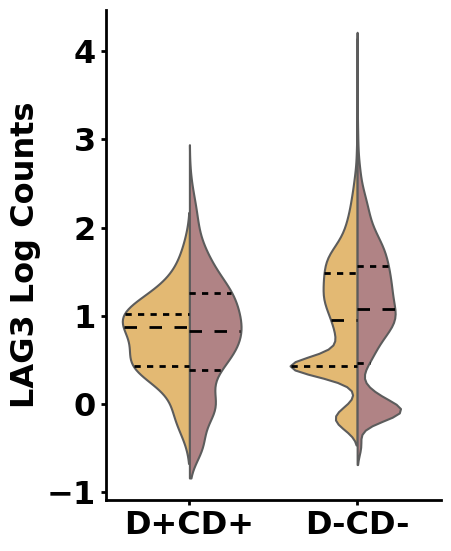

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


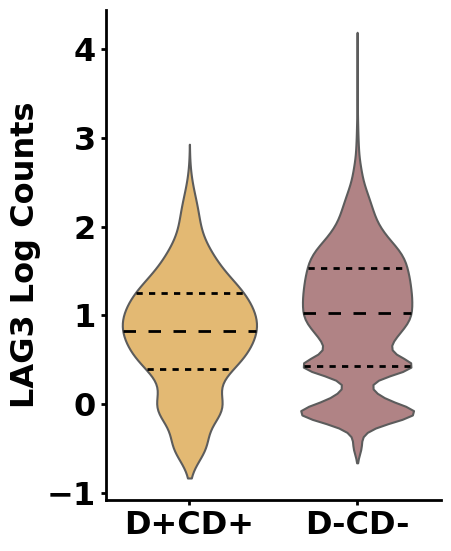

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)



Gene: PDCD1
D+CD+ vs D-CD- (All): BH corrected p=5.9973e-04
D+CD+ vs D-CD- (Responders only): BH corrected p=8.2343e-02
D+CD+ vs D-CD- (Non-responders only): BH corrected p=5.1122e-01


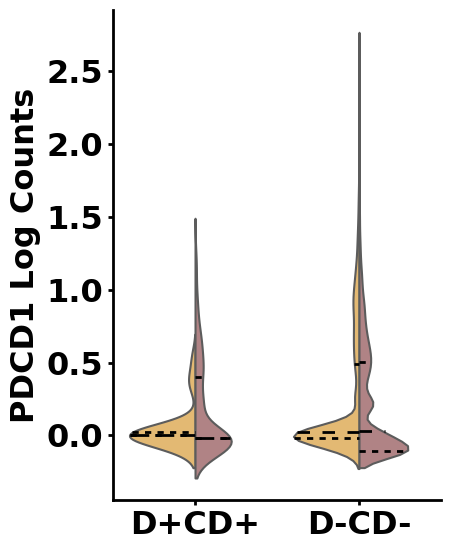

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


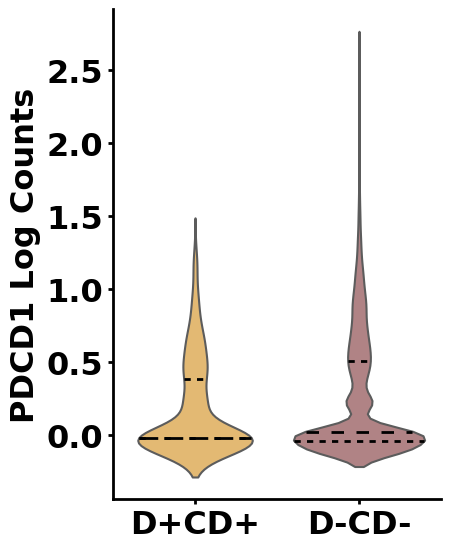

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)



Gene: HAVCR2
D+CD+ vs D-CD- (All): BH corrected p=4.8143e-11
D+CD+ vs D-CD- (Responders only): BH corrected p=2.8550e-01
D+CD+ vs D-CD- (Non-responders only): BH corrected p=3.0834e-12


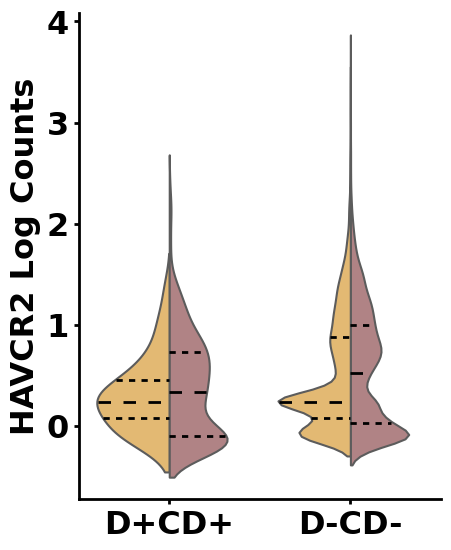

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


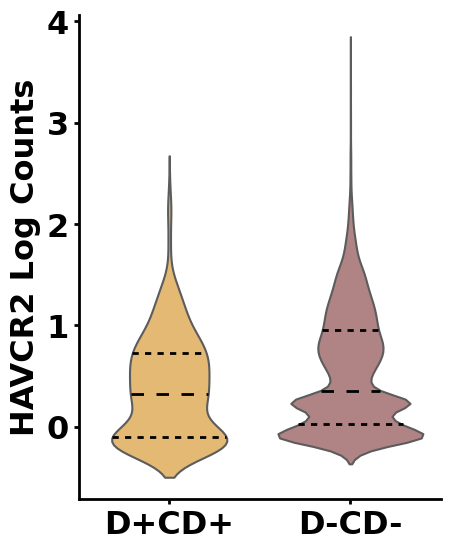

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)



Gene: TIGIT
D+CD+ vs D-CD- (All): BH corrected p=4.5106e-01
D+CD+ vs D-CD- (Responders only): BH corrected p=9.5264e-01
D+CD+ vs D-CD- (Non-responders only): BH corrected p=1.9054e-01


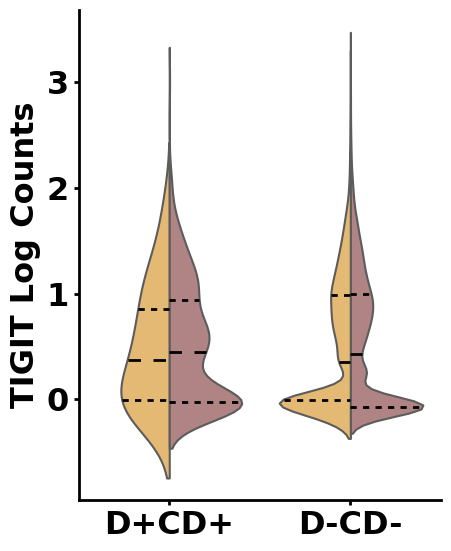

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


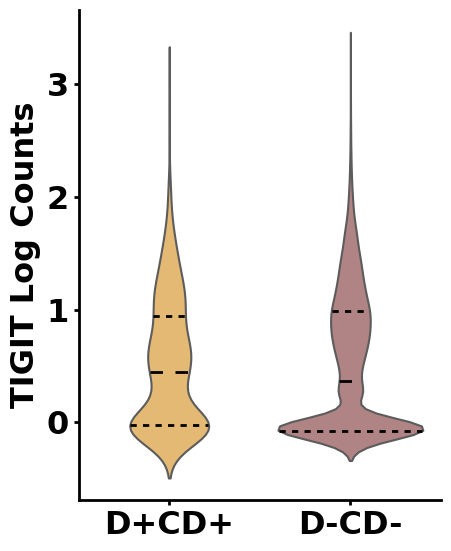

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)



Gene: TBX21
D+CD+ vs D-CD- (All): BH corrected p=5.1874e-11
D+CD+ vs D-CD- (Responders only): BH corrected p=9.7150e-02
D+CD+ vs D-CD- (Non-responders only): BH corrected p=3.8833e-10


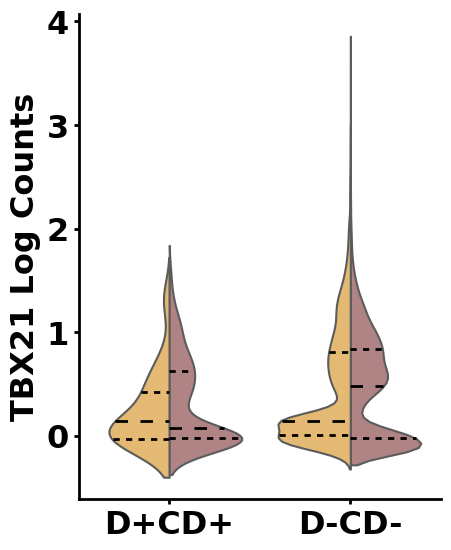

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


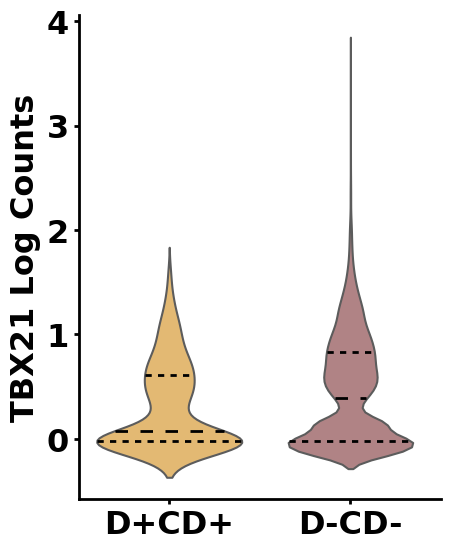

In [18]:
import scanpy as sc
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import mannwhitneyu
from scipy.sparse import issparse

def benjamini_hochberg(p_values):
    """
    Apply Benjamini-Hochberg FDR correction to an array of p-values.
    Returns an array of adjusted p-values (same size as input).
    """
    p_values = np.array(p_values)
    n = p_values.size
    order = np.argsort(p_values)
    ranks = np.arange(1, n+1)
    adjusted = p_values[order] * n / ranks
    # Ensure monotonicity of adjusted p-values
    adjusted = np.minimum.accumulate(adjusted[::-1])[::-1]
    adjusted_p = np.empty(n)
    adjusted_p[order] = adjusted
    return adjusted_p

# -----------------------------------
# Step 1: Load and Preprocess Data
# -----------------------------------
adata_log = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD4_CD8A_highly_variable_log.h5ad')
adata_log_CD4 = adata_log[adata_log.obs['cell_type'] == 'CD8'].copy()
adata_log_CR_NR = adata_log_CD4[adata_log_CD4.obs['response'].isin(['CR', 'NR'])].copy()

adata_combat = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD4_CD8A_highly_variable_combat.h5ad')
adata_combat_CD4 = adata_combat[adata_combat.obs['cell_type'] == 'CD8'].copy()
adata_combat_CR_NR = adata_combat_CD4[adata_combat_CD4.obs['response'].isin(['CR', 'NR'])].copy()

# -----------------------------------
# Step 2: Define D+CD+ and D-CD- Populations
# -----------------------------------
primary_gene_1 = "DENND5A"
primary_gene_2 = "CD27"

DENND5A_log = adata_log_CR_NR[:, primary_gene_1].X.toarray().flatten() if issparse(adata_log_CR_NR.X) else adata_log_CR_NR[:, primary_gene_1].X.flatten()
CD27_log = adata_log_CR_NR[:, primary_gene_2].X.toarray().flatten() if issparse(adata_log_CR_NR.X) else adata_log_CR_NR[:, primary_gene_2].X.flatten()

mask_DENND5A_positive = DENND5A_log > 0
mask_CD27_positive = CD27_log > 0
mask_DCD = mask_DENND5A_positive & mask_CD27_positive

adata_combat_CR_NR.obs[f'{primary_gene_1}_{primary_gene_2}_positive'] = np.where(mask_DCD, 'D+CD+', 'D-CD-')
adata_combat_CR_NR.obs[f'{primary_gene_1}_{primary_gene_2}_positive'] = adata_combat_CR_NR.obs[f'{primary_gene_1}_{primary_gene_2}_positive'].astype('category')

# -----------------------------------
# Step 3: Define Gene List for Comparison
# -----------------------------------
genes = [
    "CTLA4",  # CD152 (CTLA4)
    "LAG3",   # CD223 (LAG3)
    "PDCD1",  # CD279 (PD1)
    "HAVCR2", # CD366 (TIM3)
    "TIGIT",  # TIGIT
    "TBX21",  # T-bet
]

# -----------------------------------
# Step 4: Prepare Data for Comparison
# -----------------------------------
df = adata_combat_CR_NR.to_df()
df[f'{primary_gene_1}_{primary_gene_2}_positive'] = adata_combat_CR_NR.obs[f'{primary_gene_1}_{primary_gene_2}_positive'].values
df['response'] = adata_combat_CR_NR.obs['response'].values

category_order = ['D+CD+', 'D-CD-']

plt.rcParams['font.weight'] = 'bold'
plt.rcParams['font.size'] = 23
plt.rcParams['axes.linewidth'] = 2
plt.rcParams['axes.labelweight'] = 'bold'
plt.rcParams['xtick.major.width'] = 2
plt.rcParams['ytick.major.width'] = 2

# -----------------------------------
# Step 5: Calculate P-Values for All Comparisons
# -----------------------------------
pvals_info = []  # Will store (gene, comparison_type, p_value)

for gene in genes:
    if gene not in adata_combat_CR_NR.var_names:
        print(f"{gene} is not present in the variable names. Please check your adata object.")
        continue

    df['value'] = adata_combat_CR_NR[:, adata_combat_CR_NR.var_names == gene].X.toarray().flatten()

    # Overall comparison
    group_positive_all = df[df[f'{primary_gene_1}_{primary_gene_2}_positive'] == 'D+CD+']['value']
    group_negative_all = df[df[f'{primary_gene_1}_{primary_gene_2}_positive'] == 'D-CD-']['value']
    if len(group_positive_all) > 0 and len(group_negative_all) > 0:
        stat_all, p_all = mannwhitneyu(group_positive_all, group_negative_all, alternative='two-sided')
    else:
        p_all = np.nan

    # Responders only
    df_CR = df[df['response'] == 'CR']
    group_positive_CR = df_CR[df_CR[f'{primary_gene_1}_{primary_gene_2}_positive'] == 'D+CD+']['value']
    group_negative_CR = df_CR[df_CR[f'{primary_gene_1}_{primary_gene_2}_positive'] == 'D-CD-']['value']
    if len(group_positive_CR) > 0 and len(group_negative_CR) > 0:
        stat_CR, p_CR = mannwhitneyu(group_positive_CR, group_negative_CR, alternative='two-sided')
    else:
        p_CR = np.nan

    # Non-responders only
    df_NR = df[df['response'] == 'NR']
    group_positive_NR = df_NR[df_NR[f'{primary_gene_1}_{primary_gene_2}_positive'] == 'D+CD+']['value']
    group_negative_NR = df_NR[df_NR[f'{primary_gene_1}_{primary_gene_2}_positive'] == 'D-CD-']['value']
    if len(group_positive_NR) > 0 and len(group_negative_NR) > 0:
        stat_NR, p_NR = mannwhitneyu(group_positive_NR, group_negative_NR, alternative='two-sided')
    else:
        p_NR = np.nan

    pvals_info.append((gene, 'overall', p_all))
    pvals_info.append((gene, 'CR', p_CR))
    pvals_info.append((gene, 'NR', p_NR))

# -----------------------------------
# Step 6: Apply Benjamini-Hochberg Correction
# -----------------------------------
# Extract raw p-values (non-NaN)
raw_pvals = [x[2] for x in pvals_info if not np.isnan(x[2])]

# Apply BH correction
adjusted_p = benjamini_hochberg(raw_pvals)

# Map corrected p-values back
corrected_dict = {}
idx = 0
for gene, comp, pval in pvals_info:
    if gene not in corrected_dict:
        corrected_dict[gene] = {}
    if np.isnan(pval):
        corrected_dict[gene][comp] = np.nan
    else:
        corrected_dict[gene][comp] = adjusted_p[idx]
        idx += 1

# -----------------------------------
# Step 7: Print Corrected P-values and Plot
# -----------------------------------
for gene in genes:
    if gene not in corrected_dict:
        continue

    p_all_corrected = corrected_dict[gene]['overall']
    p_CR_corrected = corrected_dict[gene]['CR']
    p_NR_corrected = corrected_dict[gene]['NR']

    print(f"\nGene: {gene}")
    print(f"D+CD+ vs D-CD- (All): BH corrected p={p_all_corrected:.4e}")
    print(f"D+CD+ vs D-CD- (Responders only): BH corrected p={p_CR_corrected:.4e}")
    print(f"D+CD+ vs D-CD- (Non-responders only): BH corrected p={p_NR_corrected:.4e}")

    # Plot with hue
    df['value'] = adata_combat_CR_NR[:, adata_combat_CR_NR.var_names == gene].X.toarray().flatten()
    plt.figure(figsize=(5, 6))
    ax = sns.violinplot(
        data=df,
        x=f'{primary_gene_1}_{primary_gene_2}_positive',
        y='value',
        hue='response',
        split=True,
        inner="quart",
        palette=["#F6BD60", "#B77B7E"],
        order=category_order
    )
    sns.despine()

    for line in ax.lines:
        line.set_linewidth(2)
        line.set_color('black')

    plt.legend([], [], frameon=False)
    plt.title('')
    plt.xlabel('')
    plt.ylabel(f'{gene} Log Counts')
    plt.tight_layout()
    plt.show()

    # Plot without hue
    plt.figure(figsize=(5, 6))
    ax = sns.violinplot(
        data=df,
        x=f'{primary_gene_1}_{primary_gene_2}_positive',
        y='value',
        inner="quart",
        palette=["#F6BD60", "#B77B7E"],
        order=category_order
    )
    sns.despine()

    for line in ax.lines:
        line.set_linewidth(2)
        line.set_color('black')

    plt.legend([], [], frameon=False)
    plt.title('')
    plt.xlabel('')
    plt.ylabel(f'{gene} Log Counts')
    plt.tight_layout()
    plt.show()


Gene: CTLA4
D+TS+ vs D-TS- (All): BH corrected p=6.6344e-02
D+TS+ vs D-TS- (Responders only): BH corrected p=3.4892e-01
D+TS+ vs D-TS- (Non-responders only): BH corrected p=4.4482e-07


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


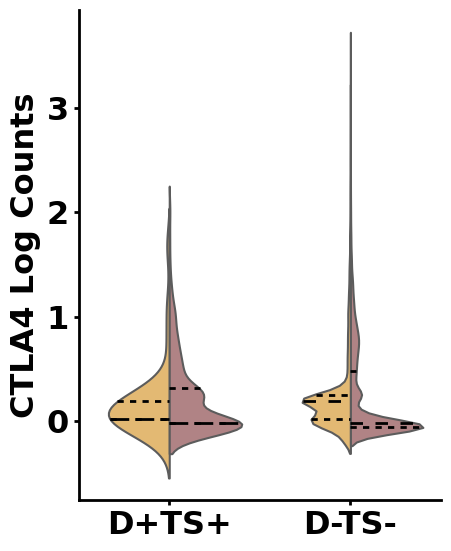

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


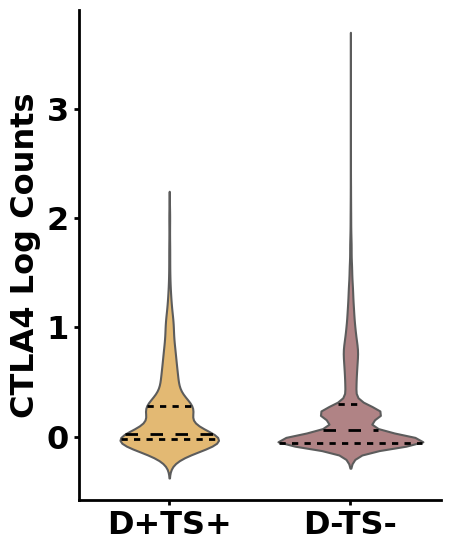

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)



Gene: LAG3
D+TS+ vs D-TS- (All): BH corrected p=2.5839e-14
D+TS+ vs D-TS- (Responders only): BH corrected p=9.5109e-03
D+TS+ vs D-TS- (Non-responders only): BH corrected p=1.0181e-15


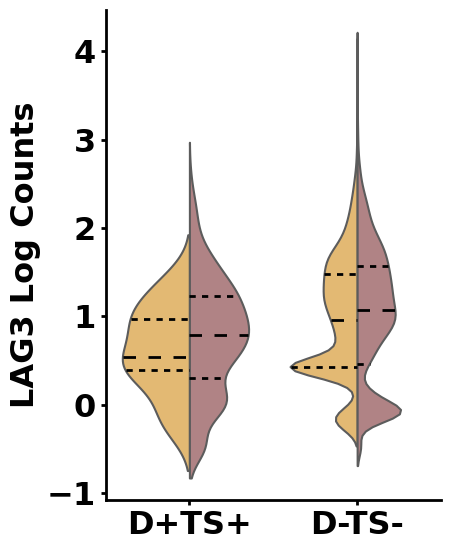

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


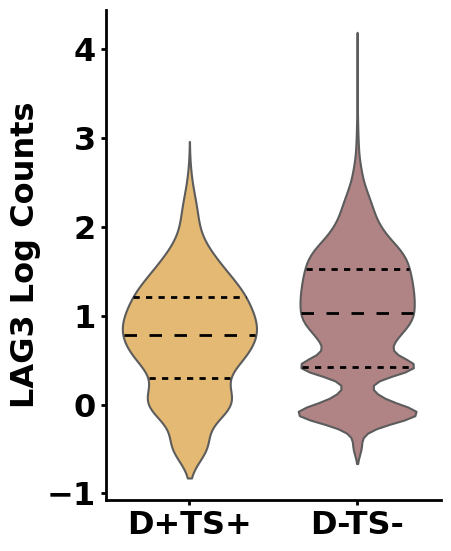

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)



Gene: PDCD1
D+TS+ vs D-TS- (All): BH corrected p=2.5035e-02
D+TS+ vs D-TS- (Responders only): BH corrected p=1.4303e-01
D+TS+ vs D-TS- (Non-responders only): BH corrected p=8.4472e-01


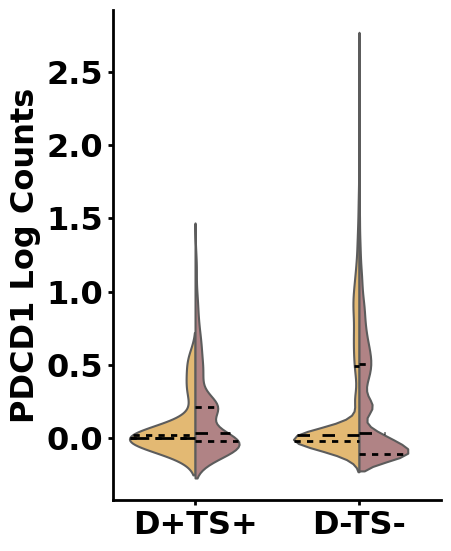

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


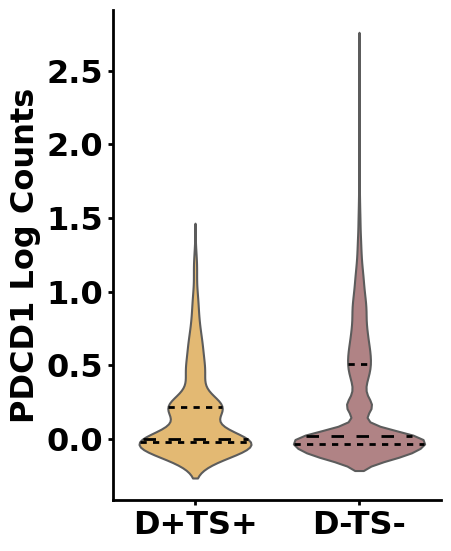

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)



Gene: HAVCR2
D+TS+ vs D-TS- (All): BH corrected p=1.1437e-12
D+TS+ vs D-TS- (Responders only): BH corrected p=7.2949e-01
D+TS+ vs D-TS- (Non-responders only): BH corrected p=4.1984e-13


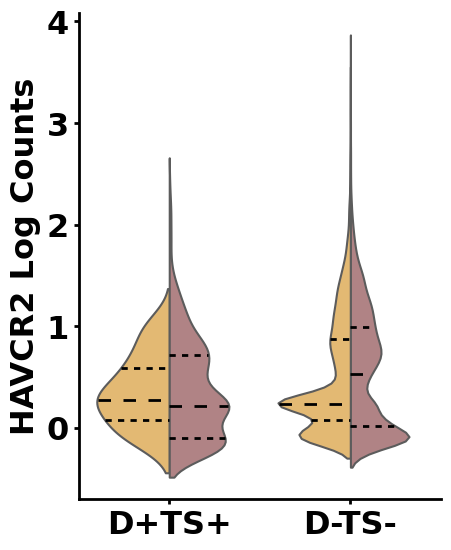

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


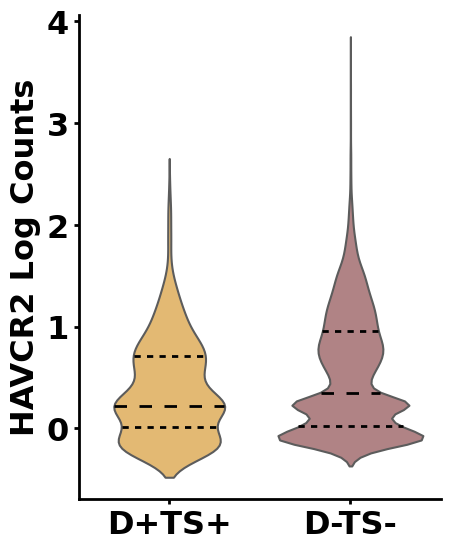

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)



Gene: TIGIT
D+TS+ vs D-TS- (All): BH corrected p=7.2949e-01
D+TS+ vs D-TS- (Responders only): BH corrected p=4.7341e-01
D+TS+ vs D-TS- (Non-responders only): BH corrected p=8.4472e-01


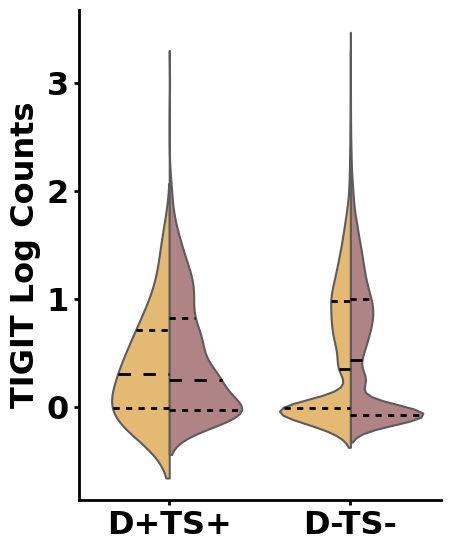

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


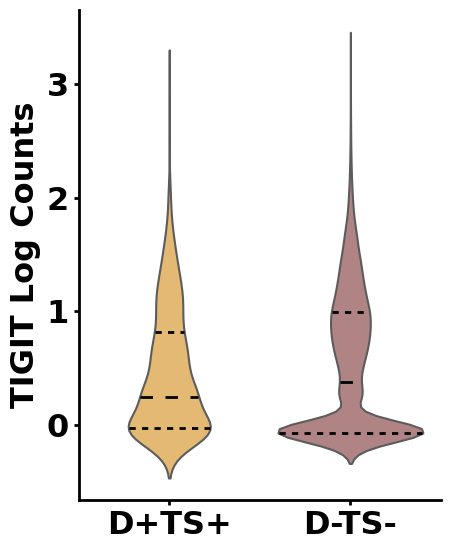

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)



Gene: TBX21
D+TS+ vs D-TS- (All): BH corrected p=1.2369e-12
D+TS+ vs D-TS- (Responders only): BH corrected p=9.5109e-03
D+TS+ vs D-TS- (Non-responders only): BH corrected p=1.4662e-10


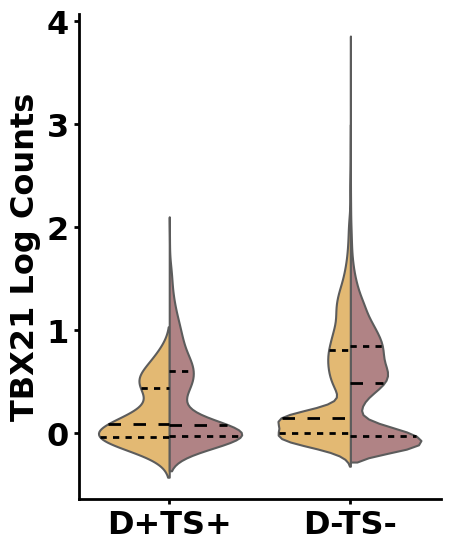

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


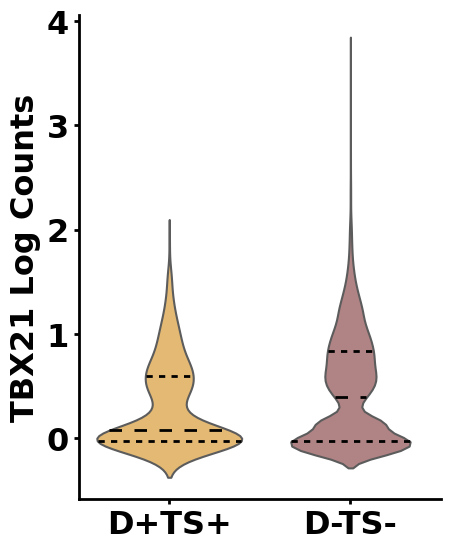

In [15]:
import scanpy as sc
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import mannwhitneyu
from scipy.sparse import issparse

def benjamini_hochberg(p_values):
    """
    Apply Benjamini-Hochberg FDR correction to an array of p-values.
    Returns an array of adjusted p-values (same size as input).
    """
    p_values = np.array(p_values)
    n = p_values.size
    order = np.argsort(p_values)
    ranks = np.arange(1, n+1)
    adjusted = p_values[order] * n / ranks
    # Ensure monotonicity of adjusted p-values
    adjusted = np.minimum.accumulate(adjusted[::-1])[::-1]
    adjusted_p = np.empty(n)
    adjusted_p[order] = adjusted
    return adjusted_p

# -----------------------------------
# Step 1: Load and Preprocess Data
# -----------------------------------
adata_log = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD4_CD8A_highly_variable_log.h5ad')
adata_log_CD4 = adata_log[adata_log.obs['cell_type'] == 'CD8'].copy()
adata_log_CR_NR = adata_log_CD4[adata_log_CD4.obs['response'].isin(['CR', 'NR'])].copy()

adata_combat = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD4_CD8A_highly_variable_combat.h5ad')
adata_combat_CD4 = adata_combat[adata_combat.obs['cell_type'] == 'CD8'].copy()
adata_combat_CR_NR = adata_combat_CD4[adata_combat_CD4.obs['response'].isin(['CR', 'NR'])].copy()

# -----------------------------------
# Step 2: Define D+TS+ and D-TS- Populations
# -----------------------------------
primary_gene_1 = "DENND5A"
primary_gene_2 = "TSC22D3"

DENND5A_log = adata_log_CR_NR[:, primary_gene_1].X.toarray().flatten() if issparse(adata_log_CR_NR.X) else adata_log_CR_NR[:, primary_gene_1].X.flatten()
TSC22D3_log = adata_log_CR_NR[:, primary_gene_2].X.toarray().flatten() if issparse(adata_log_CR_NR.X) else adata_log_CR_NR[:, primary_gene_2].X.flatten()

mask_DENND5A_positive = DENND5A_log > 0
mask_TSC22D3_positive = TSC22D3_log > 0
mask_DTS = mask_DENND5A_positive & mask_TSC22D3_positive

adata_combat_CR_NR.obs[f'{primary_gene_1}_{primary_gene_2}_positive'] = np.where(mask_DTS, 'D+TS+', 'D-TS-')
adata_combat_CR_NR.obs[f'{primary_gene_1}_{primary_gene_2}_positive'] = adata_combat_CR_NR.obs[f'{primary_gene_1}_{primary_gene_2}_positive'].astype('category')

# -----------------------------------
# Step 3: Define Gene List for Comparison
# -----------------------------------
genes = [
    "CTLA4",  # CD152 (CTLA4)
    "LAG3",   # CD223 (LAG3)
    "PDCD1",  # CD279 (PD1)
    "HAVCR2", # CD366 (TIM3)
    "TIGIT",  # TIGIT
    "TBX21",  # T-bet
]

# -----------------------------------
# Step 4: Prepare Data for Comparison
# -----------------------------------
df = adata_combat_CR_NR.to_df()
df[f'{primary_gene_1}_{primary_gene_2}_positive'] = adata_combat_CR_NR.obs[f'{primary_gene_1}_{primary_gene_2}_positive'].values
df['response'] = adata_combat_CR_NR.obs['response'].values

category_order = ['D+TS+', 'D-TS-']

plt.rcParams['font.weight'] = 'bold'
plt.rcParams['font.size'] = 23
plt.rcParams['axes.linewidth'] = 2
plt.rcParams['axes.labelweight'] = 'bold'
plt.rcParams['xtick.major.width'] = 2
plt.rcParams['ytick.major.width'] = 2

# -----------------------------------
# Step 5: Calculate P-Values for All Comparisons
# -----------------------------------
pvals_info = []  # Will store (gene, comparison_type, p_value)

for gene in genes:
    if gene not in adata_combat_CR_NR.var_names:
        print(f"{gene} is not present in the variable names. Please check your adata object.")
        continue

    df['value'] = adata_combat_CR_NR[:, adata_combat_CR_NR.var_names == gene].X.toarray().flatten()

    # Overall comparison
    group_positive_all = df[df[f'{primary_gene_1}_{primary_gene_2}_positive'] == 'D+TS+']['value']
    group_negative_all = df[df[f'{primary_gene_1}_{primary_gene_2}_positive'] == 'D-TS-']['value']
    if len(group_positive_all) > 0 and len(group_negative_all) > 0:
        stat_all, p_all = mannwhitneyu(group_positive_all, group_negative_all, alternative='two-sided')
    else:
        p_all = np.nan
    pvals_info.append((gene, 'overall', p_all))

    # Responders only
    df_CR = df[df['response'] == 'CR']
    group_positive_CR = df_CR[df_CR[f'{primary_gene_1}_{primary_gene_2}_positive'] == 'D+TS+']['value']
    group_negative_CR = df_CR[df_CR[f'{primary_gene_1}_{primary_gene_2}_positive'] == 'D-TS-']['value']
    if len(group_positive_CR) > 0 and len(group_negative_CR) > 0:
        stat_CR, p_CR = mannwhitneyu(group_positive_CR, group_negative_CR, alternative='two-sided')
    else:
        p_CR = np.nan
    pvals_info.append((gene, 'CR', p_CR))

    # Non-responders only
    df_NR = df[df['response'] == 'NR']
    group_positive_NR = df_NR[df_NR[f'{primary_gene_1}_{primary_gene_2}_positive'] == 'D+TS+']['value']
    group_negative_NR = df_NR[df_NR[f'{primary_gene_1}_{primary_gene_2}_positive'] == 'D-TS-']['value']
    if len(group_positive_NR) > 0 and len(group_negative_NR) > 0:
        stat_NR, p_NR = mannwhitneyu(group_positive_NR, group_negative_NR, alternative='two-sided')
    else:
        p_NR = np.nan
    pvals_info.append((gene, 'NR', p_NR))

# -----------------------------------
# Step 6: Apply Benjamini-Hochberg Correction
# -----------------------------------
raw_pvals = [x[2] for x in pvals_info if not np.isnan(x[2])]

# Apply BH correction
adjusted_p = benjamini_hochberg(raw_pvals)

# Map corrected p-values back
corrected_dict = {}
idx = 0
for gene, comp, pval in pvals_info:
    if gene not in corrected_dict:
        corrected_dict[gene] = {}
    if np.isnan(pval):
        corrected_dict[gene][comp] = np.nan
    else:
        corrected_dict[gene][comp] = adjusted_p[idx]
        idx += 1

# -----------------------------------
# Step 7: Print Corrected P-values and Plot
# -----------------------------------
for gene in genes:
    if gene not in corrected_dict:
        continue

    p_all_corrected = corrected_dict[gene]['overall']
    p_CR_corrected = corrected_dict[gene]['CR']
    p_NR_corrected = corrected_dict[gene]['NR']

    print(f"\nGene: {gene}")
    print(f"D+TS+ vs D-TS- (All): BH corrected p={p_all_corrected:.4e}")
    print(f"D+TS+ vs D-TS- (Responders only): BH corrected p={p_CR_corrected:.4e}")
    print(f"D+TS+ vs D-TS- (Non-responders only): BH corrected p={p_NR_corrected:.4e}")

    # Plot with hue
    df['value'] = adata_combat_CR_NR[:, adata_combat_CR_NR.var_names == gene].X.toarray().flatten()
    plt.figure(figsize=(5, 6))
    ax = sns.violinplot(
        data=df,
        x=f'{primary_gene_1}_{primary_gene_2}_positive',
        y='value',
        hue='response',
        split=True,
        inner="quart",
        palette=["#F6BD60", "#B77B7E"],
        order=category_order
    )
    sns.despine()

    for line in ax.lines:
        line.set_linewidth(2)
        line.set_color('black')

    plt.legend([], [], frameon=False)
    plt.title('')
    plt.xlabel('')
    plt.ylabel(f'{gene} Log Counts')
    plt.tight_layout()
    plt.show()

    # Plot without hue
    plt.figure(figsize=(5, 6))
    ax = sns.violinplot(
        data=df,
        x=f'{primary_gene_1}_{primary_gene_2}_positive',
        y='value',
        inner="quart",
        palette=["#F6BD60", "#B77B7E"],
        order=category_order
    )
    sns.despine()

    for line in ax.lines:
        line.set_linewidth(2)
        line.set_color('black')

    plt.legend([], [], frameon=False)
    plt.title('')
    plt.xlabel('')
    plt.ylabel(f'{gene} Log Counts')
    plt.tight_layout()
    plt.show()


Gene: CTLA4
D+PE+ vs D-PE- (All): BH corrected p=8.6337e-03
D+PE+ vs D-PE- (Responders only): BH corrected p=1.9358e-02
D+PE+ vs D-PE- (Non-responders only): BH corrected p=3.6763e-07


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


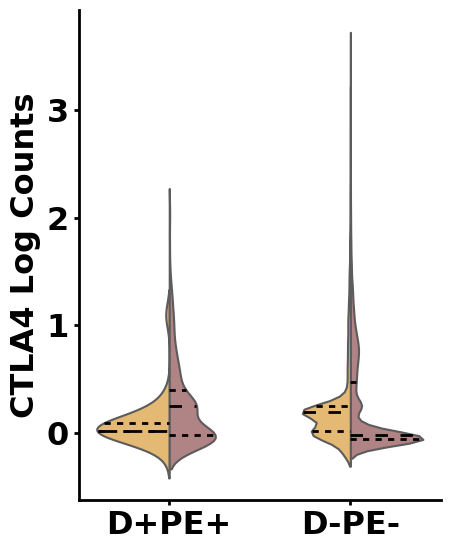

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


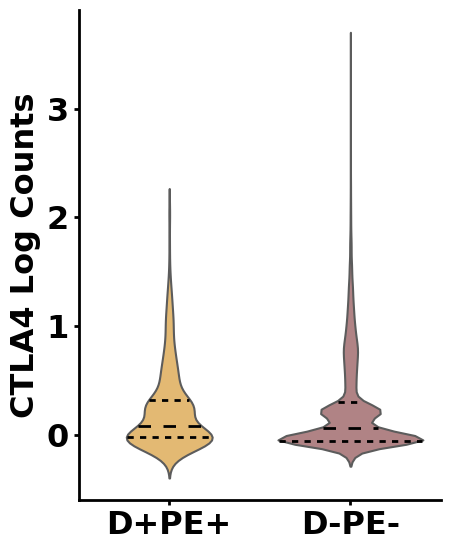

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)



Gene: LAG3
D+PE+ vs D-PE- (All): BH corrected p=1.4840e-10
D+PE+ vs D-PE- (Responders only): BH corrected p=3.4654e-01
D+PE+ vs D-PE- (Non-responders only): BH corrected p=4.4548e-12


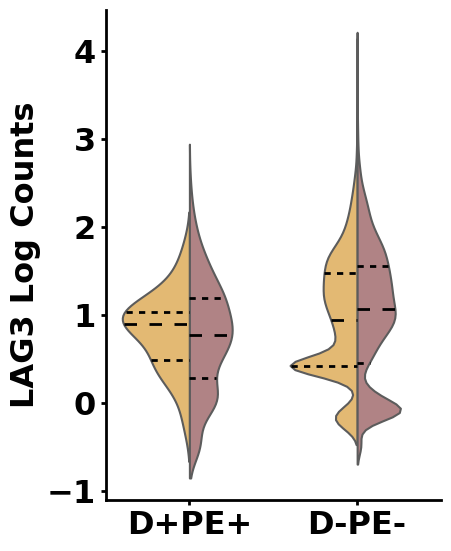

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


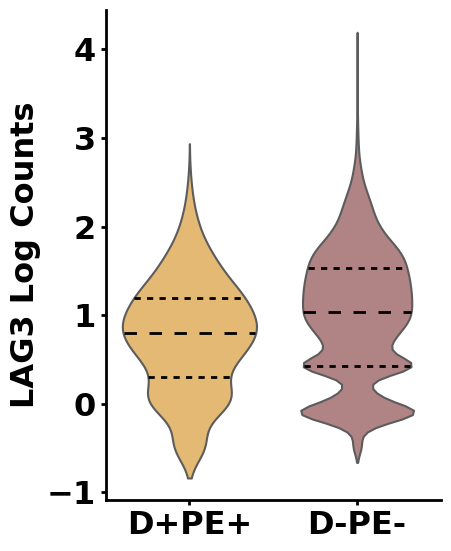

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)



Gene: PDCD1
D+PE+ vs D-PE- (All): BH corrected p=2.8579e-01
D+PE+ vs D-PE- (Responders only): BH corrected p=1.1605e-01
D+PE+ vs D-PE- (Non-responders only): BH corrected p=5.9299e-01


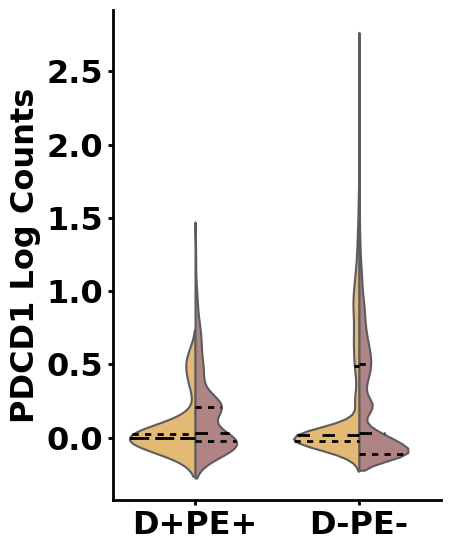

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


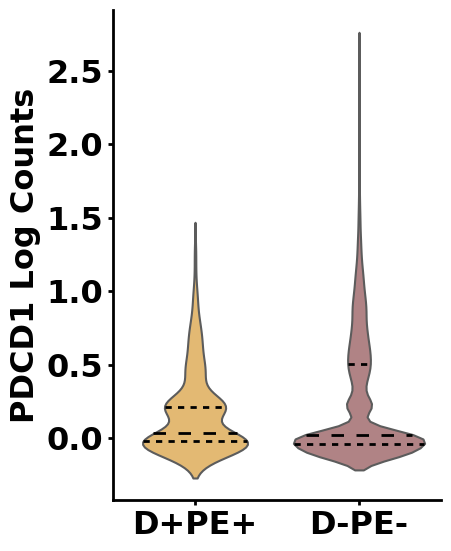

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)



Gene: HAVCR2
D+PE+ vs D-PE- (All): BH corrected p=3.7608e-09
D+PE+ vs D-PE- (Responders only): BH corrected p=2.8579e-01
D+PE+ vs D-PE- (Non-responders only): BH corrected p=3.6145e-09


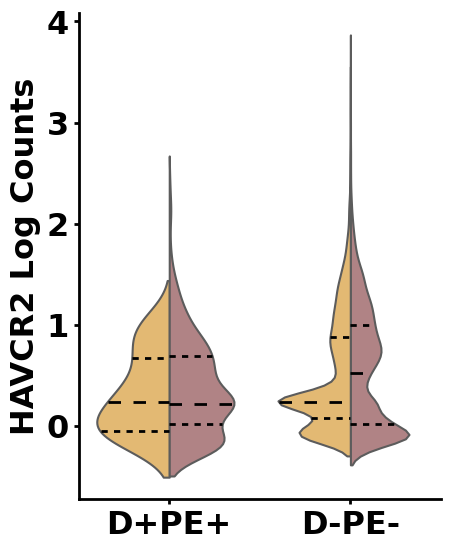

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


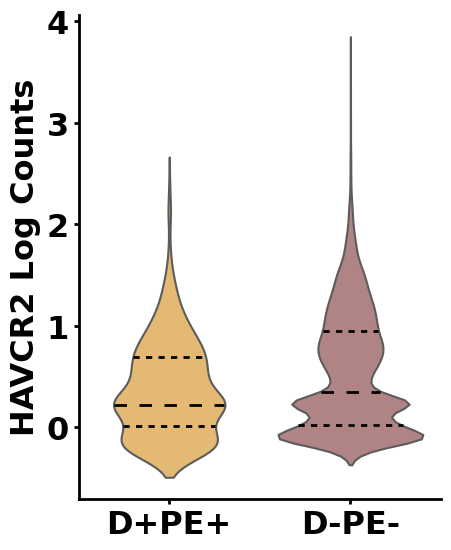

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)



Gene: TIGIT
D+PE+ vs D-PE- (All): BH corrected p=6.0561e-01
D+PE+ vs D-PE- (Responders only): BH corrected p=3.1686e-01
D+PE+ vs D-PE- (Non-responders only): BH corrected p=3.1686e-01


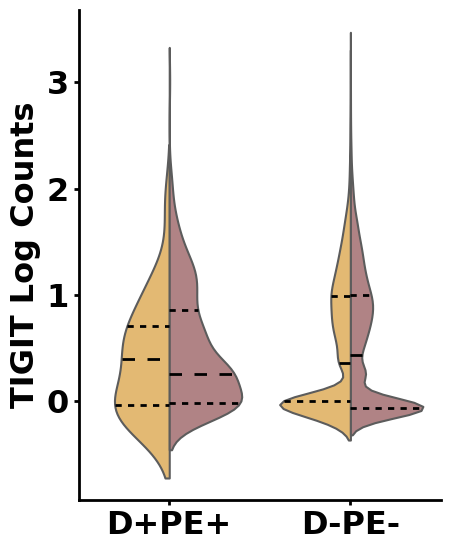

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


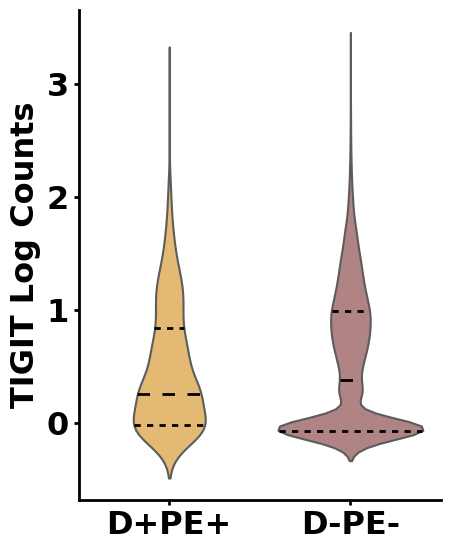

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)



Gene: TBX21
D+PE+ vs D-PE- (All): BH corrected p=3.7608e-09
D+PE+ vs D-PE- (Responders only): BH corrected p=6.1518e-02
D+PE+ vs D-PE- (Non-responders only): BH corrected p=5.9446e-08


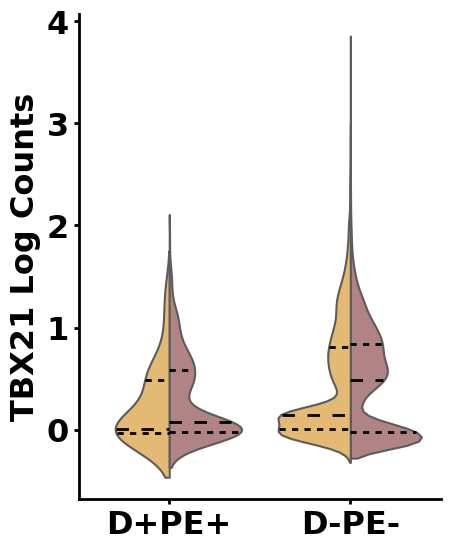

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


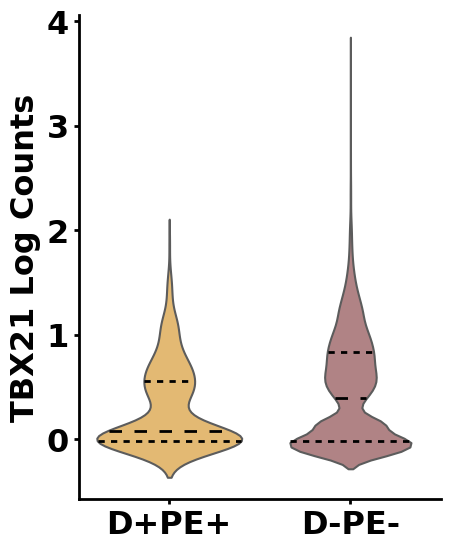

In [13]:
import scanpy as sc
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import mannwhitneyu
from scipy.sparse import issparse

def benjamini_hochberg(p_values):
    """
    Apply Benjamini-Hochberg FDR correction to an array of p-values.
    Returns an array of adjusted p-values (same size as input).
    """
    p_values = np.array(p_values)
    n = p_values.size
    order = np.argsort(p_values)
    ranks = np.arange(1, n+1)
    adjusted = p_values[order] * n / ranks
    # Ensure monotonicity of adjusted p-values
    adjusted = np.minimum.accumulate(adjusted[::-1])[::-1]
    adjusted_p = np.empty(n)
    adjusted_p[order] = adjusted
    return adjusted_p

# -----------------------------------
# Step 1: Load and Preprocess Data
# -----------------------------------
adata_log = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD4_CD8A_highly_variable_log.h5ad')
adata_log_CD4 = adata_log[adata_log.obs['cell_type'] == 'CD8'].copy()
adata_log_CR_NR = adata_log_CD4[adata_log_CD4.obs['response'].isin(['CR', 'NR'])].copy()

adata_combat = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD4_CD8A_highly_variable_combat.h5ad')
adata_combat_CD4 = adata_combat[adata_combat.obs['cell_type'] == 'CD8'].copy()
adata_combat_CR_NR = adata_combat_CD4[adata_combat_CD4.obs['response'].isin(['CR', 'NR'])].copy()

# -----------------------------------
# Step 2: Define D+PE+ and D-PE- Populations
# -----------------------------------
primary_gene_1 = "DENND5A"
primary_gene_2 = "PECAM1"

DENND5A_log = adata_log_CR_NR[:, primary_gene_1].X.toarray().flatten() if issparse(adata_log_CR_NR.X) else adata_log_CR_NR[:, primary_gene_1].X.flatten()
PECAM1_log = adata_log_CR_NR[:, primary_gene_2].X.toarray().flatten() if issparse(adata_log_CR_NR.X) else adata_log_CR_NR[:, primary_gene_2].X.flatten()

mask_DENND5A_positive = DENND5A_log > 0
mask_PECAM1_positive = PECAM1_log > 0
mask_DPE = mask_DENND5A_positive & mask_PECAM1_positive

adata_combat_CR_NR.obs[f'{primary_gene_1}_{primary_gene_2}_positive'] = np.where(mask_DPE, 'D+PE+', 'D-PE-')
adata_combat_CR_NR.obs[f'{primary_gene_1}_{primary_gene_2}_positive'] = adata_combat_CR_NR.obs[f'{primary_gene_1}_{primary_gene_2}_positive'].astype('category')

# -----------------------------------
# Step 3: Define Gene List for Comparison
# -----------------------------------
genes = [
    "CTLA4",  # CD152 (CTLA4)
    "LAG3",   # CD223 (LAG3)
    "PDCD1",  # CD279 (PD1)
    "HAVCR2", # CD366 (TIM3)
    "TIGIT",  # TIGIT
    "TBX21",  # T-bet
]

# -----------------------------------
# Step 4: Prepare Data for Comparison
# -----------------------------------
df = adata_combat_CR_NR.to_df()
df[f'{primary_gene_1}_{primary_gene_2}_positive'] = adata_combat_CR_NR.obs[f'{primary_gene_1}_{primary_gene_2}_positive'].values
df['response'] = adata_combat_CR_NR.obs['response'].values

category_order = ['D+PE+', 'D-PE-']

plt.rcParams['font.weight'] = 'bold'
plt.rcParams['font.size'] = 23
plt.rcParams['axes.linewidth'] = 2
plt.rcParams['axes.labelweight'] = 'bold'
plt.rcParams['xtick.major.width'] = 2
plt.rcParams['ytick.major.width'] = 2

# -----------------------------------
# Step 5: Calculate P-Values for All Comparisons
# -----------------------------------
pvals_info = []  # Will store (gene, comparison_type, p_value)

for gene in genes:
    if gene not in adata_combat_CR_NR.var_names:
        print(f"{gene} is not present in the variable names. Please check your adata object.")
        continue

    df['value'] = adata_combat_CR_NR[:, adata_combat_CR_NR.var_names == gene].X.toarray().flatten()

    # Overall comparison
    group_positive_all = df[df[f'{primary_gene_1}_{primary_gene_2}_positive'] == 'D+PE+']['value']
    group_negative_all = df[df[f'{primary_gene_1}_{primary_gene_2}_positive'] == 'D-PE-']['value']
    if len(group_positive_all) > 0 and len(group_negative_all) > 0:
        stat_all, p_all = mannwhitneyu(group_positive_all, group_negative_all, alternative='two-sided')
    else:
        p_all = np.nan
    pvals_info.append((gene, 'overall', p_all))

    # Responders only
    df_CR = df[df['response'] == 'CR']
    group_positive_CR = df_CR[df_CR[f'{primary_gene_1}_{primary_gene_2}_positive'] == 'D+PE+']['value']
    group_negative_CR = df_CR[df_CR[f'{primary_gene_1}_{primary_gene_2}_positive'] == 'D-PE-']['value']
    if len(group_positive_CR) > 0 and len(group_negative_CR) > 0:
        stat_CR, p_CR = mannwhitneyu(group_positive_CR, group_negative_CR, alternative='two-sided')
    else:
        p_CR = np.nan
    pvals_info.append((gene, 'CR', p_CR))

    # Non-responders only
    df_NR = df[df['response'] == 'NR']
    group_positive_NR = df_NR[df_NR[f'{primary_gene_1}_{primary_gene_2}_positive'] == 'D+PE+']['value']
    group_negative_NR = df_NR[df_NR[f'{primary_gene_1}_{primary_gene_2}_positive'] == 'D-PE-']['value']
    if len(group_positive_NR) > 0 and len(group_negative_NR) > 0:
        stat_NR, p_NR = mannwhitneyu(group_positive_NR, group_negative_NR, alternative='two-sided')
    else:
        p_NR = np.nan
    pvals_info.append((gene, 'NR', p_NR))

# -----------------------------------
# Step 6: Apply Benjamini-Hochberg Correction
# -----------------------------------
raw_pvals = [x[2] for x in pvals_info if not np.isnan(x[2])]

# Apply BH correction
adjusted_p = benjamini_hochberg(raw_pvals)

# Map corrected p-values back
corrected_dict = {}
idx = 0
for gene, comp, pval in pvals_info:
    if gene not in corrected_dict:
        corrected_dict[gene] = {}
    if np.isnan(pval):
        corrected_dict[gene][comp] = np.nan
    else:
        corrected_dict[gene][comp] = adjusted_p[idx]
        idx += 1

# -----------------------------------
# Step 7: Print Corrected P-values and Plot
# -----------------------------------
for gene in genes:
    if gene not in corrected_dict:
        continue

    p_all_corrected = corrected_dict[gene]['overall']
    p_CR_corrected = corrected_dict[gene]['CR']
    p_NR_corrected = corrected_dict[gene]['NR']

    print(f"\nGene: {gene}")
    print(f"D+PE+ vs D-PE- (All): BH corrected p={p_all_corrected:.4e}")
    print(f"D+PE+ vs D-PE- (Responders only): BH corrected p={p_CR_corrected:.4e}")
    print(f"D+PE+ vs D-PE- (Non-responders only): BH corrected p={p_NR_corrected:.4e}")

    # Plot with hue
    df['value'] = adata_combat_CR_NR[:, adata_combat_CR_NR.var_names == gene].X.toarray().flatten()
    plt.figure(figsize=(5, 6))
    ax = sns.violinplot(
        data=df,
        x=f'{primary_gene_1}_{primary_gene_2}_positive',
        y='value',
        hue='response',
        split=True,
        inner="quart",
        palette=["#F6BD60", "#B77B7E"],
        order=category_order
    )
    sns.despine()

    for line in ax.lines:
        line.set_linewidth(2)
        line.set_color('black')

    plt.legend([], [], frameon=False)
    plt.title('')
    plt.xlabel('')
    plt.ylabel(f'{gene} Log Counts')
    plt.tight_layout()
    plt.show()

    # Plot without hue
    plt.figure(figsize=(5, 6))
    ax = sns.violinplot(
        data=df,
        x=f'{primary_gene_1}_{primary_gene_2}_positive',
        y='value',
        inner="quart",
        palette=["#F6BD60", "#B77B7E"],
        order=category_order
    )
    sns.despine()

    for line in ax.lines:
        line.set_linewidth(2)
        line.set_color('black')

    plt.legend([], [], frameon=False)
    plt.title('')
    plt.xlabel('')
    plt.ylabel(f'{gene} Log Counts')
    plt.tight_layout()
    plt.show()



Gene: CTLA4
CD81+ vs CD81- (All): corrected p=2.3392e-06
CD81+ vs CD81- (Responders only): corrected p=1.7912e-152
CD81+ vs CD81- (Non-responders only): corrected p=1.1229e-10


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


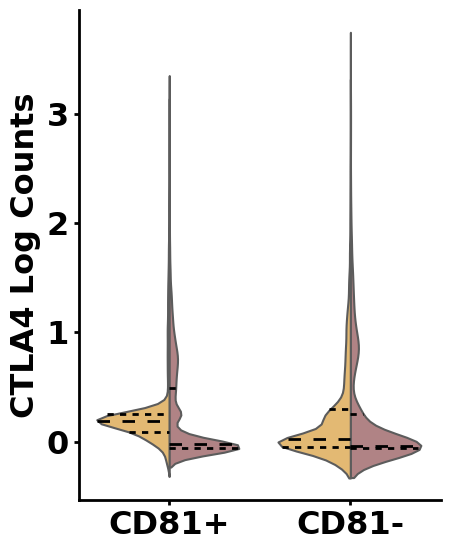

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


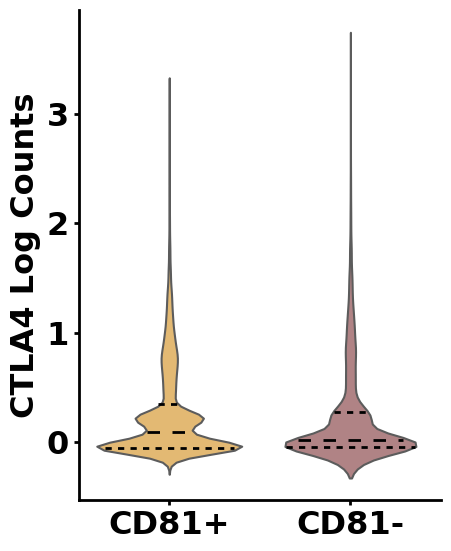

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)



Gene: LAG3
CD81+ vs CD81- (All): corrected p=5.7494e-09
CD81+ vs CD81- (Responders only): corrected p=2.4616e-02
CD81+ vs CD81- (Non-responders only): corrected p=1.8457e-07


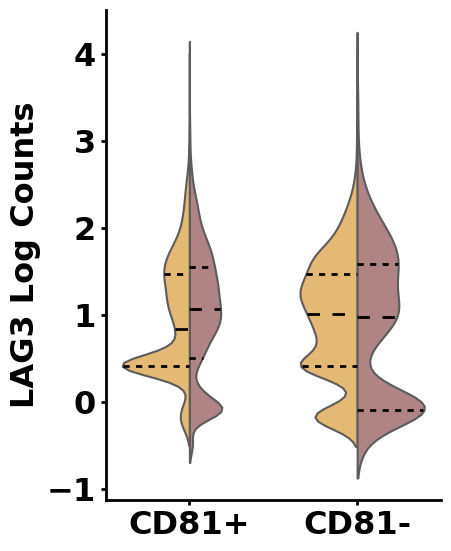

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


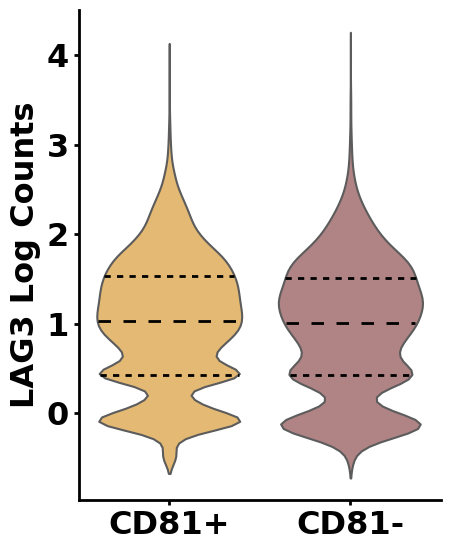

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)



Gene: PDCD1
CD81+ vs CD81- (All): corrected p=5.4458e-07
CD81+ vs CD81- (Responders only): corrected p=9.8727e-105
CD81+ vs CD81- (Non-responders only): corrected p=4.3894e-15


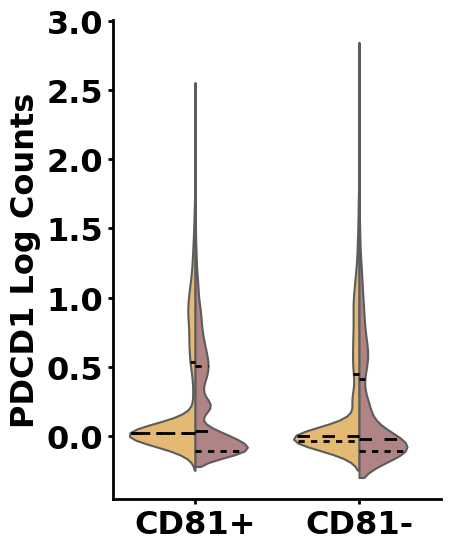

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


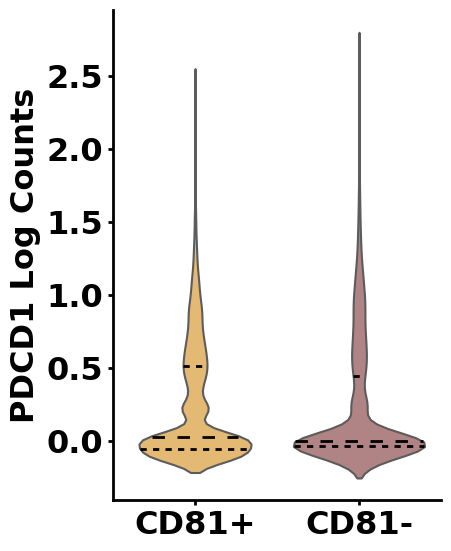

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)



Gene: HAVCR2
CD81+ vs CD81- (All): corrected p=2.8051e-01
CD81+ vs CD81- (Responders only): corrected p=1.3958e-03
CD81+ vs CD81- (Non-responders only): corrected p=5.6219e-03


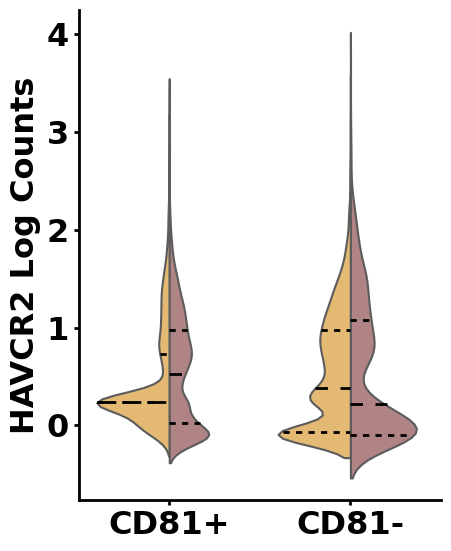

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


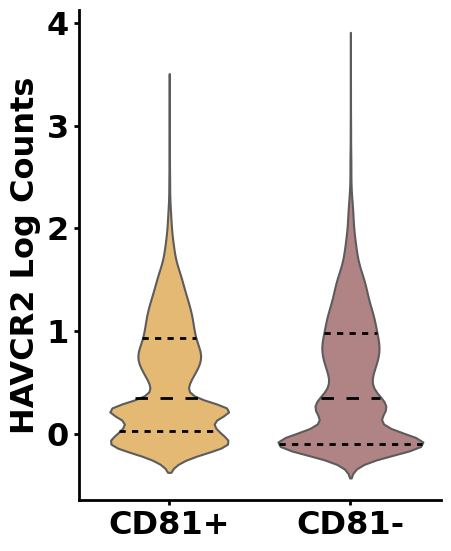

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)



Gene: TIGIT
CD81+ vs CD81- (All): corrected p=5.5144e-45
CD81+ vs CD81- (Responders only): corrected p=4.9104e-35
CD81+ vs CD81- (Non-responders only): corrected p=4.3894e-15


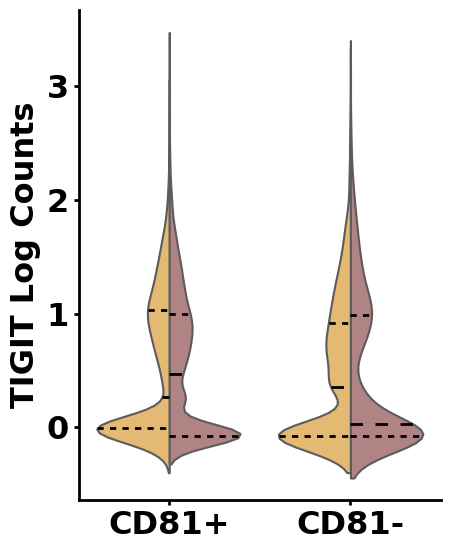

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


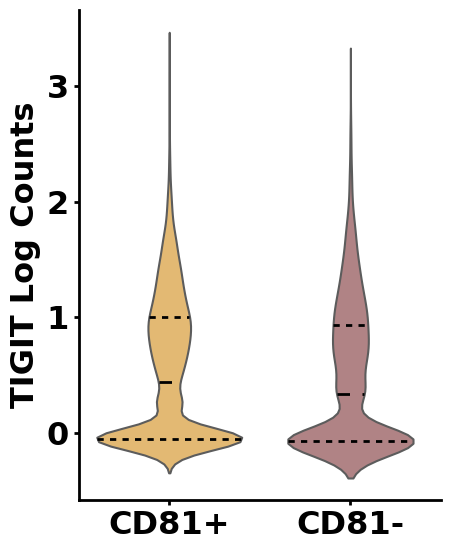

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)



Gene: TBX21
CD81+ vs CD81- (All): corrected p=2.6857e-09
CD81+ vs CD81- (Responders only): corrected p=1.0562e-07
CD81+ vs CD81- (Non-responders only): corrected p=1.1122e-13


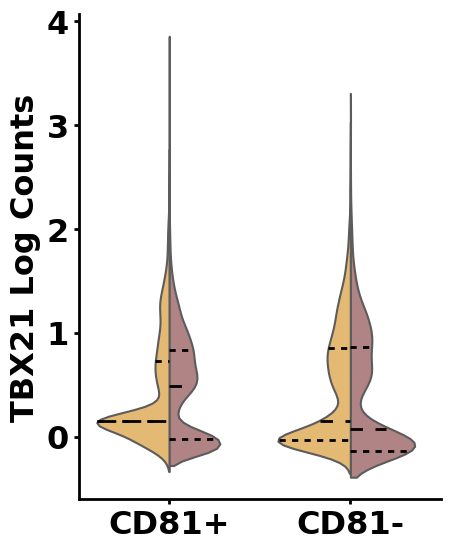

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


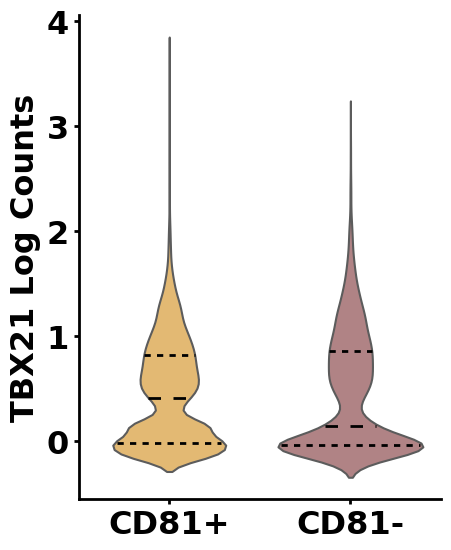

In [12]:
import scanpy as sc
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import mannwhitneyu
from scipy.sparse import issparse

def benjamini_hochberg(p_values):
    """
    Apply Benjamini-Hochberg FDR correction to an array of p-values.
    Returns an array of adjusted p-values (same size as input).
    """
    p_values = np.array(p_values)
    n = p_values.size
    order = np.argsort(p_values)
    ranks = np.arange(1, n+1)
    adjusted = p_values[order] * n / ranks
    # Ensure monotonicity of adjusted p-values
    adjusted = np.minimum.accumulate(adjusted[::-1])[::-1]
    adjusted_p = np.empty(n)
    adjusted_p[order] = adjusted
    return adjusted_p

# -----------------------------------
# Step 1: Load and Preprocess Data
# -----------------------------------
adata_log = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD4_CD8A_highly_variable_log.h5ad')
adata_log_CD4 = adata_log[adata_log.obs['cell_type'] == 'CD8'].copy()
adata_log_CR_NR = adata_log_CD4[adata_log_CD4.obs['response'].isin(['CR', 'NR'])].copy()

adata_combat = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD4_CD8A_highly_variable_combat.h5ad')
adata_combat_CD4 = adata_combat[adata_combat.obs['cell_type'] == 'CD8'].copy()
adata_combat_CR_NR = adata_combat_CD4[adata_combat_CD4.obs['response'].isin(['CR', 'NR'])].copy()

# -----------------------------------
# Step 2: Define CD81+ and CD81- Populations
# -----------------------------------
primary_gene = "CD81"
CD81_log = adata_log_CR_NR[:, primary_gene].X.toarray().flatten() if issparse(adata_log_CR_NR.X) else adata_log_CR_NR[:, primary_gene].X.flatten()
mask_CD81_positive = CD81_log > 0
adata_combat_CR_NR.obs[f'{primary_gene}_positive'] = np.where(mask_CD81_positive, 'CD81+', 'CD81-')
adata_combat_CR_NR.obs[f'{primary_gene}_positive'] = adata_combat_CR_NR.obs[f'{primary_gene}_positive'].astype('category')

# -----------------------------------
# Step 3: Define Gene List for Comparison
# -----------------------------------
genes = [
    "CTLA4",  # CD152 (CTLA4)
    "LAG3",   # CD223 (LAG3)
    "PDCD1",  # CD279 (PD1)
    "HAVCR2", # CD366 (TIM3)
    "TIGIT",  # TIGIT
    "TBX21",  # T-bet
]

# -----------------------------------
# Step 4: Prepare Data for Comparison
# -----------------------------------
df = adata_combat_CR_NR.to_df()
df[f'{primary_gene}_positive'] = adata_combat_CR_NR.obs[f'{primary_gene}_positive'].values
df['response'] = adata_combat_CR_NR.obs['response'].values

category_order = ['CD81+', 'CD81-']

plt.rcParams['font.weight'] = 'bold'
plt.rcParams['font.size'] = 23
plt.rcParams['axes.linewidth'] = 2
plt.rcParams['axes.labelweight'] = 'bold'
plt.rcParams['xtick.major.width'] = 2
plt.rcParams['ytick.major.width'] = 2

# -----------------------------------
# Step 5: Calculate P-Values for All Comparisons for All Genes
# -----------------------------------
pvals_info = []  # Will store tuples: (gene, comparison_type, p_value)

for gene in genes:
    if gene not in adata_combat_CR_NR.var_names:
        print(f"{gene} is not present in the variable names. Please check your adata object.")
        continue

    df['value'] = adata_combat_CR_NR[:, adata_combat_CR_NR.var_names == gene].X.toarray().flatten()

    # Overall comparison
    group_positive_all = df[df[f'{primary_gene}_positive'] == 'CD81+']['value']
    group_negative_all = df[df[f'{primary_gene}_positive'] == 'CD81-']['value']
    if len(group_positive_all) > 0 and len(group_negative_all) > 0:
        stat_all, p_all = mannwhitneyu(group_positive_all, group_negative_all, alternative='two-sided')
    else:
        p_all = np.nan
    pvals_info.append((gene, 'overall', p_all))

    # Responders only
    df_CR = df[df['response'] == 'CR']
    group_positive_CR = df_CR[df_CR[f'{primary_gene}_positive'] == 'CD81+']['value']
    group_negative_CR = df_CR[df_CR[f'{primary_gene}_positive'] == 'CD81-']['value']
    if len(group_positive_CR) > 0 and len(group_negative_CR) > 0:
        stat_CR, p_CR = mannwhitneyu(group_positive_CR, group_negative_CR, alternative='two-sided')
    else:
        p_CR = np.nan
    pvals_info.append((gene, 'CR', p_CR))

    # Non-responders only
    df_NR = df[df['response'] == 'NR']
    group_positive_NR = df_NR[df_NR[f'{primary_gene}_positive'] == 'CD81+']['value']
    group_negative_NR = df_NR[df_NR[f'{primary_gene}_positive'] == 'CD81-']['value']
    if len(group_positive_NR) > 0 and len(group_negative_NR) > 0:
        stat_NR, p_NR = mannwhitneyu(group_positive_NR, group_negative_NR, alternative='two-sided')
    else:
        p_NR = np.nan
    pvals_info.append((gene, 'NR', p_NR))

# -----------------------------------
# Step 6: Apply Benjamini-Hochberg Correction Across All Tests
# -----------------------------------
# Extract all non-nan p-values
raw_pvals = [x[2] for x in pvals_info if not np.isnan(x[2])]

# Apply BH correction
adjusted_p = benjamini_hochberg(raw_pvals)

# Map corrected p-values back
corrected_dict = {}
idx = 0
for gene, comp, pval in pvals_info:
    if gene not in corrected_dict:
        corrected_dict[gene] = {}
    if np.isnan(pval):
        corrected_dict[gene][comp] = np.nan
    else:
        corrected_dict[gene][comp] = adjusted_p[idx]
        idx += 1

# -----------------------------------
# Step 7: Print Corrected P-Values and Plot
# -----------------------------------
for gene in genes:
    if gene not in corrected_dict:
        continue

    p_all_corrected = corrected_dict[gene]['overall']
    p_CR_corrected = corrected_dict[gene]['CR']
    p_NR_corrected = corrected_dict[gene]['NR']

    print(f"\nGene: {gene}")
    print(f"CD81+ vs CD81- (All): corrected p={p_all_corrected:.4e}")
    print(f"CD81+ vs CD81- (Responders only): corrected p={p_CR_corrected:.4e}")
    print(f"CD81+ vs CD81- (Non-responders only): corrected p={p_NR_corrected:.4e}")

    # Plot with hue
    df['value'] = adata_combat_CR_NR[:, adata_combat_CR_NR.var_names == gene].X.toarray().flatten()
    plt.figure(figsize=(5, 6))
    ax = sns.violinplot(
        data=df,
        x=f'{primary_gene}_positive',
        y='value',
        hue='response',
        split=True,
        inner="quart",
        palette=["#F6BD60", "#B77B7E"],
        order=category_order
    )
    sns.despine()

    for line in ax.lines:
        line.set_linewidth(2)
        line.set_color('black')

    plt.legend([], [], frameon=False)
    plt.title('')
    plt.xlabel('')
    plt.ylabel(f'{gene} Log Counts')
    plt.tight_layout()
    plt.show()

    # Plot without hue
    plt.figure(figsize=(5, 6))
    ax = sns.violinplot(
        data=df,
        x=f'{primary_gene}_positive',
        y='value',
        inner="quart",
        palette=["#F6BD60", "#B77B7E"],
        order=category_order
    )
    sns.despine()

    for line in ax.lines:
        line.set_linewidth(2)
        line.set_color('black')

    plt.legend([], [], frameon=False)
    plt.title('')
    plt.xlabel('')
    plt.ylabel(f'{gene} Log Counts')
    plt.tight_layout()
    plt.show()


Mann-Whitney U test for IL2RB with JUND+ZNF683+ vs JUND− or ZNF683−: U-statistic = 76001464.0, p-value = 0.0001504970052641939


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


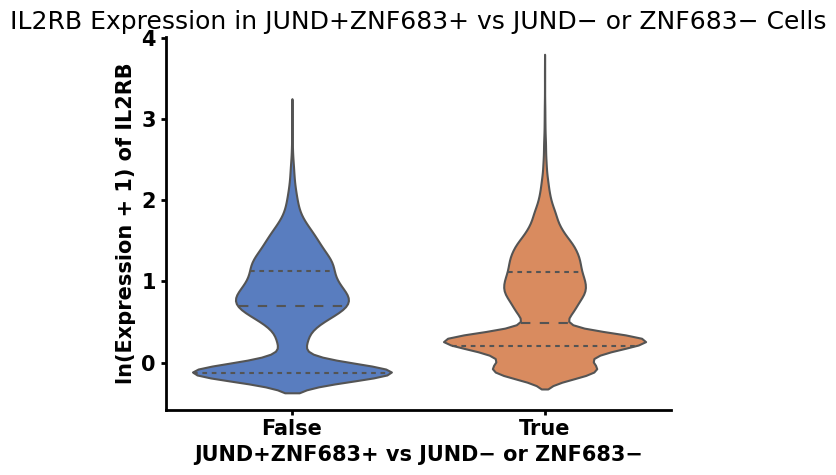

Mann-Whitney U test for IL7R with JUND+ZNF683+ vs JUND− or ZNF683−: U-statistic = 95354230.0, p-value = 8.568517881377507e-304


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


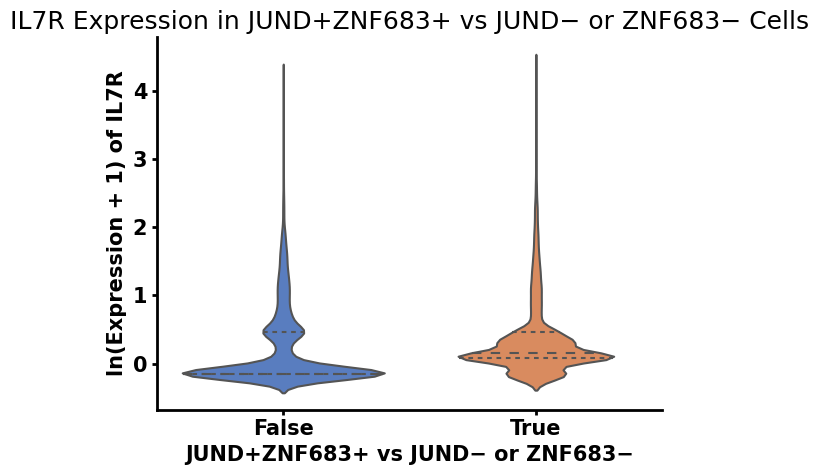

Mann-Whitney U test for CXCR3 with JUND+ZNF683+ vs JUND− or ZNF683−: U-statistic = 79667671.5, p-value = 6.298853247016099e-24


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


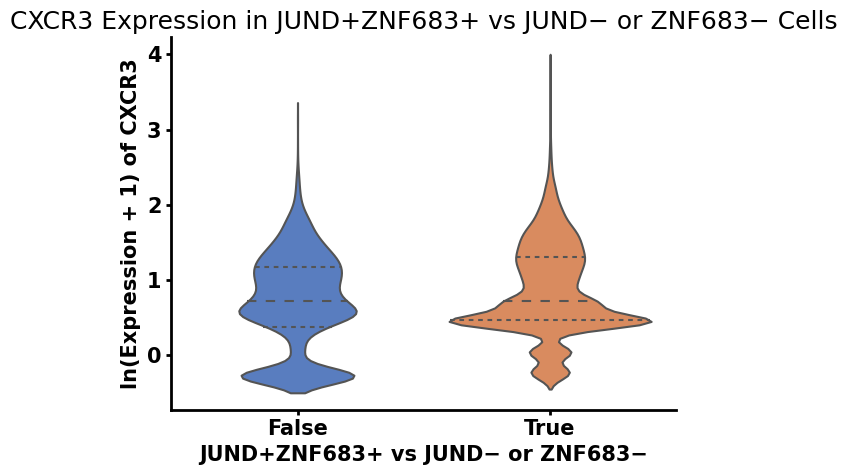

Mann-Whitney U test for CD27 with JUND+ZNF683+ vs JUND− or ZNF683−: U-statistic = 71926779.0, p-value = 0.0013294746603873084


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


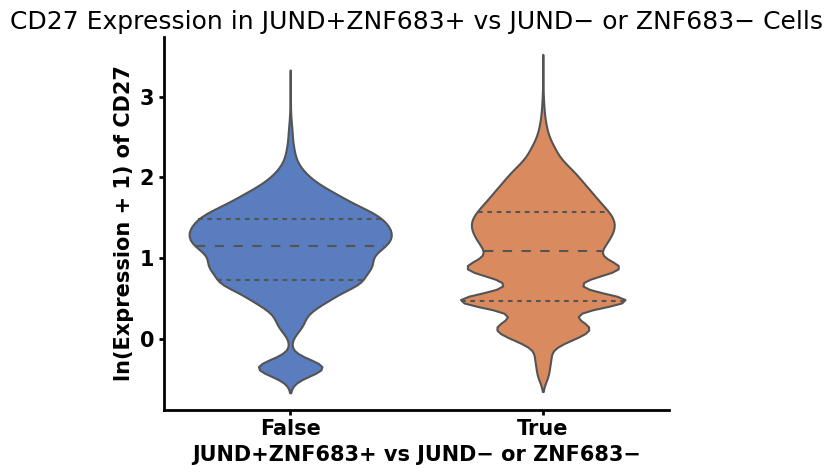

Mann-Whitney U test for CD28 with JUND+ZNF683+ vs JUND− or ZNF683−: U-statistic = 91047056.0, p-value = 7.036314236346693e-196


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


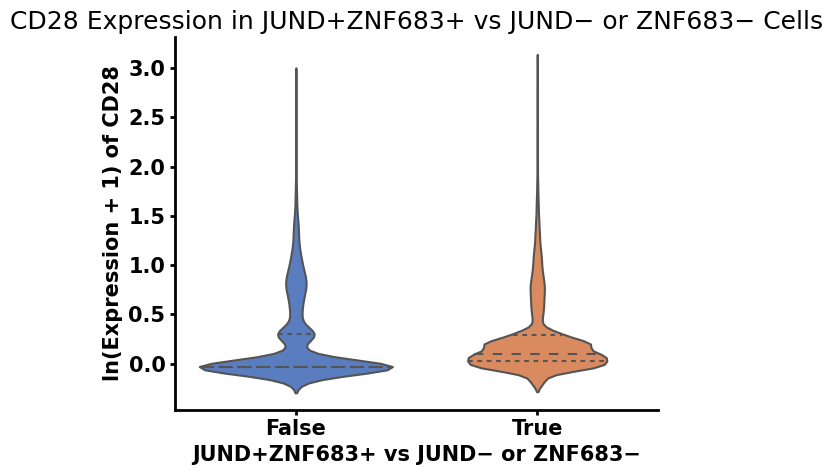

Mann-Whitney U test for ICOS with JUND+ZNF683+ vs JUND− or ZNF683−: U-statistic = 90759653.5, p-value = 8.472205312235079e-190


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


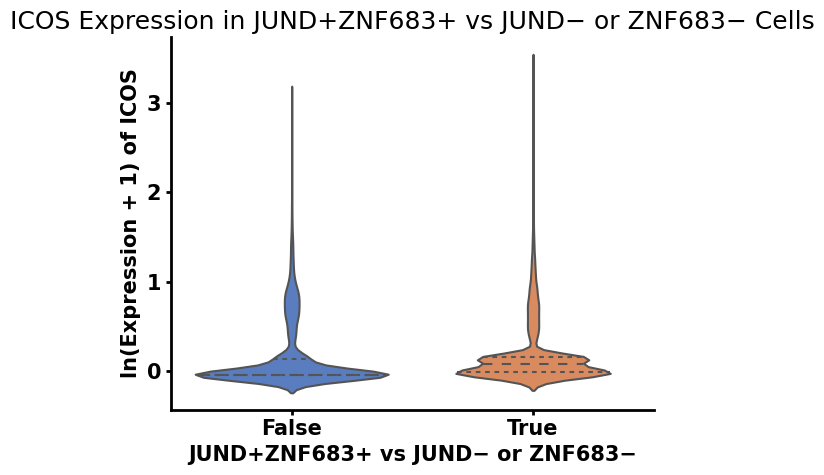

Mann-Whitney U test for CTLA4 with JUND+ZNF683+ vs JUND− or ZNF683−: U-statistic = 90386777.0, p-value = 6.176015061329306e-181


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


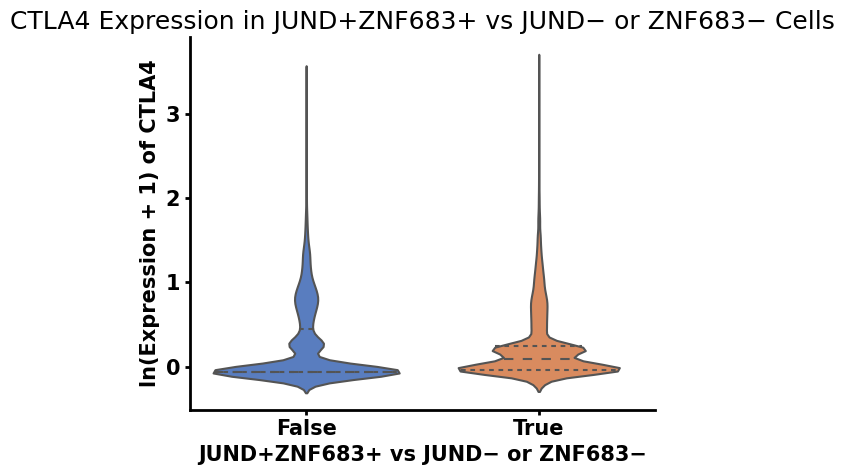

Mann-Whitney U test for LAG3 with JUND+ZNF683+ vs JUND− or ZNF683−: U-statistic = 71301942.0, p-value = 1.837999853513005e-05


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


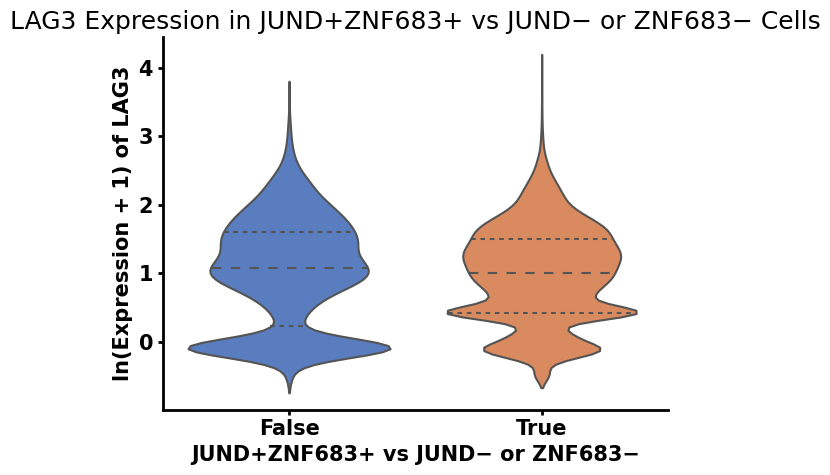

Mann-Whitney U test for PDCD1 with JUND+ZNF683+ vs JUND− or ZNF683−: U-statistic = 85845677.0, p-value = 1.0120848220263592e-95


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


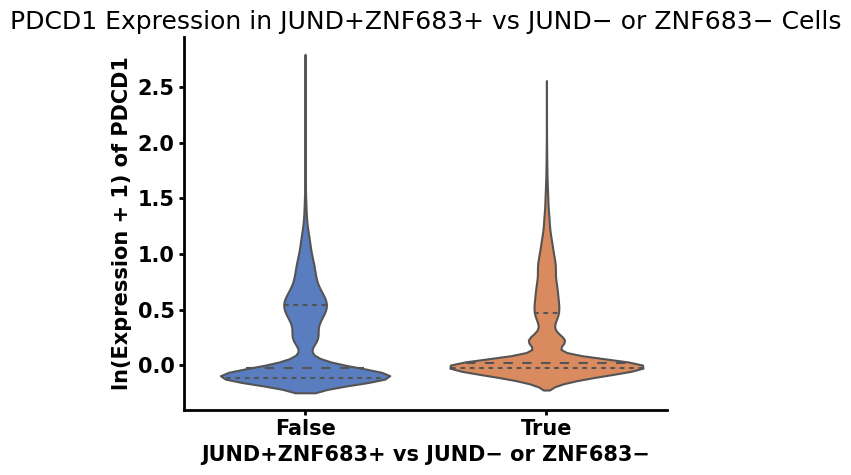

Mann-Whitney U test for HAVCR2 with JUND+ZNF683+ vs JUND− or ZNF683−: U-statistic = 70713271.5, p-value = 1.1630556987282803e-07


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


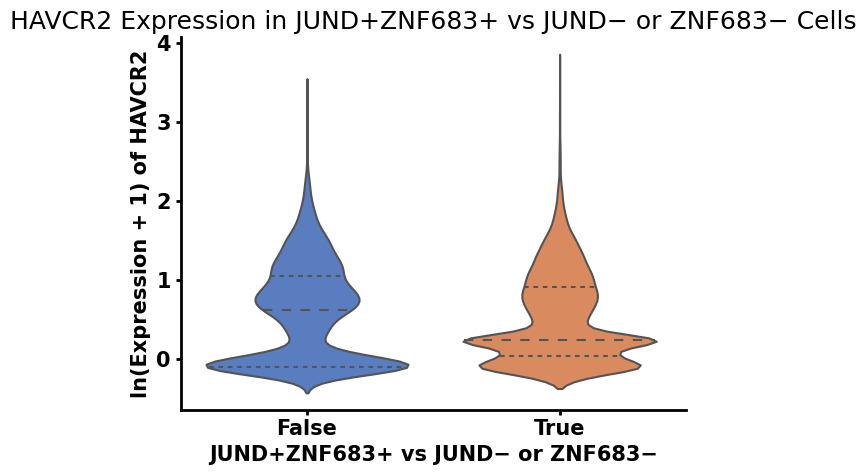

Mann-Whitney U test for TIGIT with JUND+ZNF683+ vs JUND− or ZNF683−: U-statistic = 71342064.5, p-value = 2.4360187003075914e-05


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


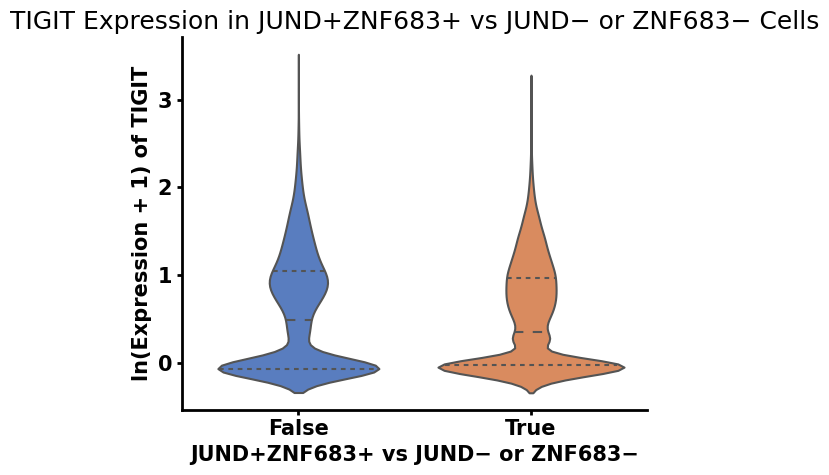

Mann-Whitney U test for IL2RA with JUND+ZNF683+ vs JUND− or ZNF683−: U-statistic = 95804957.0, p-value = 0.0


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


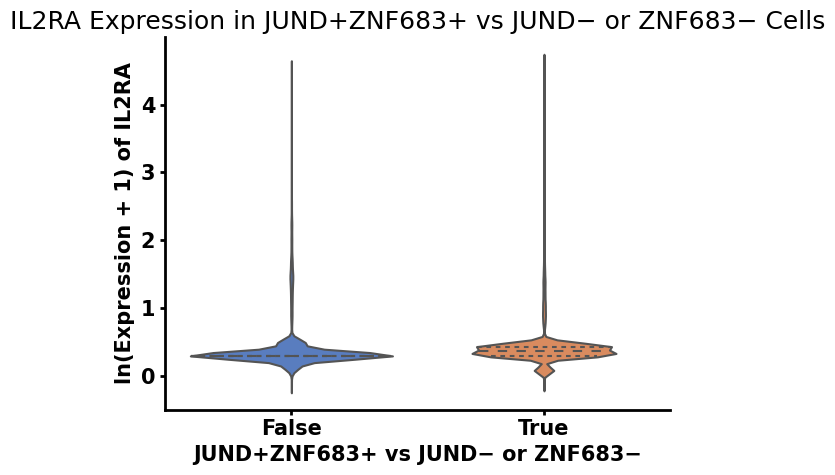

Mann-Whitney U test for CD38 with JUND+ZNF683+ vs JUND− or ZNF683−: U-statistic = 73186324.5, p-value = 0.29238235217100583


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


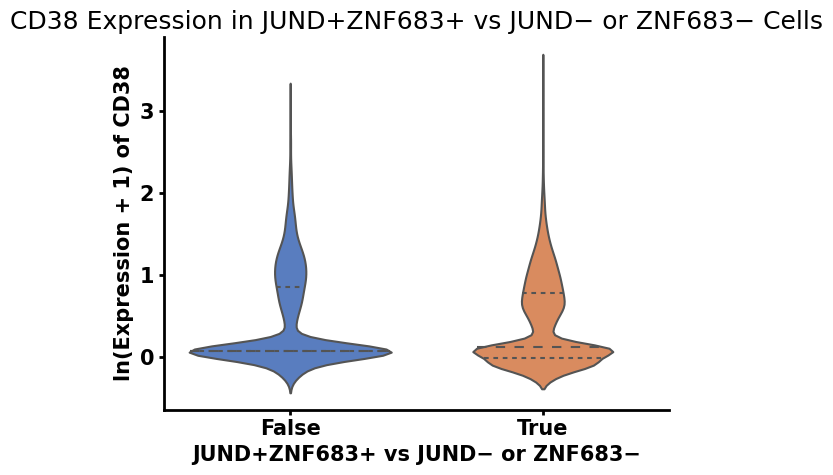

Mann-Whitney U test for MKI67 with JUND+ZNF683+ vs JUND− or ZNF683−: U-statistic = 76471904.5, p-value = 3.852005378440684e-06


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


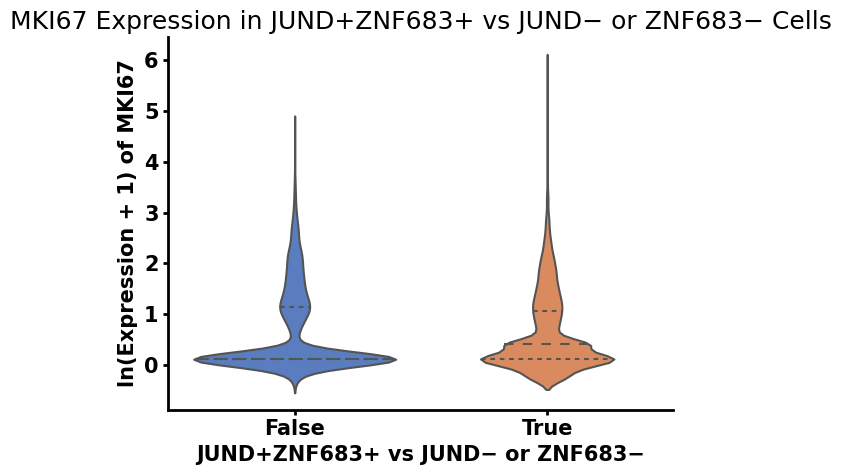

Mann-Whitney U test for PRDM1 with JUND+ZNF683+ vs JUND− or ZNF683−: U-statistic = 74867604.0, p-value = 0.06482256179967698


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


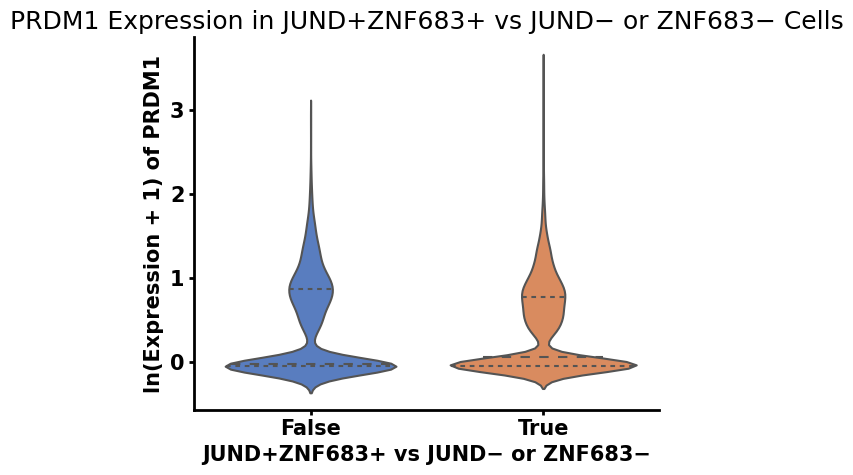

Mann-Whitney U test for TBX21 with JUND+ZNF683+ vs JUND− or ZNF683−: U-statistic = 76663757.5, p-value = 8.262987270623949e-07


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


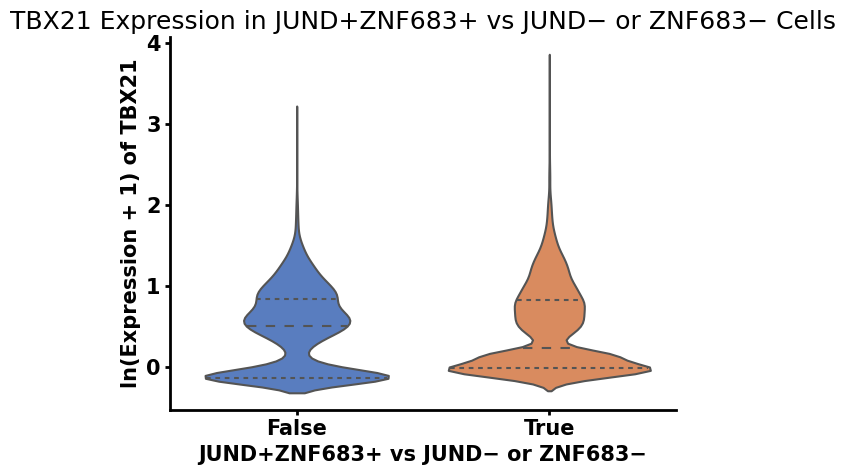

Mann-Whitney U test for B3GAT1 with JUND+ZNF683+ vs JUND− or ZNF683−: U-statistic = 55882508.5, p-value = 4.2369107570266525e-216


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


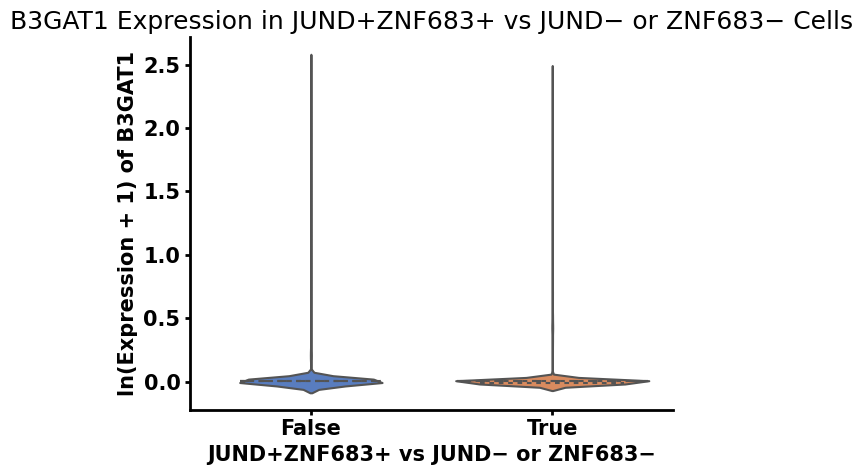

In [ ]:

import scanpy as sc
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import mannwhitneyu

# Load log-transformed dataset
adata_log = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD4_CD8A_highly_variable_combat.h5ad')
adata_log_CD8 = adata_log[adata_log.obs['cell_type'] == 'CD8'].copy()
adata_log_CR_NR = adata_log_CD8[(adata_log_CD8.obs['response'] == 'CR') | (adata_log_CD8.obs['response'] == 'NR')].copy()

# Define the gene list for comparison
genes = [
    "IL2RB",  # CD122 (IL2Rβ)
    "IL7R",   # CD127 (IL7Rα)
    "CXCR3",  # CD183 (CXCR3)
    "CD27",   # CD27
    "CD28",   # CD28
    "ICOS",   # CD278 (ICOS)
    "CTLA4",  # CD152 (CTLA4)
    "LAG3",   # CD223 (LAG3)
    "PDCD1",  # CD279 (PD1)
    "HAVCR2", # CD366 (TIM3)
    "TIGIT",  # TIGIT
    "IL2RA",  # CD25 (IL2Rα)
    "CD38",   # CD38 (ADPRC1)
    "MKI67",  # Ki-67
    "PRDM1",  # Blimp-1
    "TBX21",  # T-bet
    "B3GAT1"  # CD57
]


# Define the primary genes JUND and ZNF683
primary_gene_1 = "CD81"
primary_gene_2 = "ZNF683"

# Create masks for cells that express JUND and ZNF683
mask_jund_positive = adata_log_CR_NR[:, primary_gene_1].X > 0
mask_znf683_positive = adata_log_CR_NR[:, primary_gene_2].X > 0

# Combine masks to select cells that express both JUND and ZNF683 (JUND+ZNF683+)
mask_both_genes_positive = mask_jund_positive & mask_znf683_positive

# Create a new column to indicate if cells express both genes (JUND+ZNF683+) or not
adata_log_CR_NR.obs['both_genes_positive'] = mask_both_genes_positive
adata_log_CR_NR.obs['both_genes_positive'] = adata_log_CR_NR.obs['both_genes_positive'].astype('category')

# Convert data to a DataFrame for plotting
df = adata_log_CR_NR.to_df()
df['both_genes_positive'] = adata_log_CR_NR.obs['both_genes_positive'].values

# Loop through each gene in the list and compare its expression between cells expressing both genes and cells not expressing both
for gene in genes:
    if gene in adata_log_CR_NR.var_names:
        df['value'] = adata_log_CR_NR[:, adata_log_CR_NR.var_names == gene].X.toarray().flatten()

        # Separate values for cells expressing both JUND and ZNF683 (JUND+ZNF683+) and those that do not express both
        group_both_positive = df[df['both_genes_positive'] == True]['value']
        group_both_negative = df[df['both_genes_positive'] == False]['value']

        # Perform Mann-Whitney U test to compare JUND+ZNF683+ and JUND− or ZNF683−
        stat, p_value = mannwhitneyu(group_both_positive, group_both_negative, alternative='two-sided')
        print(f"Mann-Whitney U test for {gene} with JUND+ZNF683+ vs JUND− or ZNF683−: U-statistic = {stat}, p-value = {p_value}")

        # Create the violin plot using seaborn, split by both genes expression
        plt.figure(figsize=(6, 5))
        plt.rcParams.update({'font.size': 15})
        ax = sns.violinplot(data=df, x='both_genes_positive', y='value', inner="quart", palette="muted")
        sns.despine()  # Remove the top and right spines

        # Customize the plot
        plt.title(f'{gene} Expression in JUND+ZNF683+ vs JUND− or ZNF683− Cells')
        plt.xlabel('JUND+ZNF683+ vs JUND− or ZNF683−')
        plt.ylabel(f'ln(Expression + 1) of {gene}')
        plt.tight_layout()

        # Save or display the plot
        # plt.savefig(f'/home/emma/result/CART/violinplot_JUND_ZNF683/{gene}_both_genes_violinplot.png')
        plt.show()
    else:
        print(f"{gene} is not present in the variable names. Please check your adata object.")


In [5]:
import scanpy as sc
import numpy as np
import pandas as pd
from scipy.sparse import issparse
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import StratifiedKFold
import xgboost as xgb
from scipy.stats import zscore

# Load your dataset
adata = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD4_CD8A_highly_variable_combat.h5ad')
adata_CD8 = adata[adata.obs['cell_type'] == 'CD8'].copy()
#adata_CD8_cluster = adata_CD8[adata_CD8.obs['leiden_0.9'].isin(['0', '1', '4', '7', '9', '10', '11', '13', '14'])].copy()
adata_CR_NR = adata_CD8[(adata_CD8.obs['response'] == 'CR') | (adata_CD8.obs['response'] == 'NR')].copy()

# Encode the 'response' labels (CR and NR only)
le = LabelEncoder()
adata_CR_NR.obs['Response_Encoded'] = le.fit_transform(adata_CR_NR.obs['response'])  # CR = 0, NR = 1

# Define the list of gene pairs
gene_pairs = [
    ("ALYREF", "DENND5A"), ("CD81", "DENND5A"), ("DENND5A", "ARL4C"), ("ALYREF", "RPL17"),
    ("DENND5A", "PLP2"), ("DENND5A", "TSC22D3"), ("CD81", "ALYREF"), ("CD27", "DENND5A"),
    ("GZMK", "DENND5A"), ("CD7", "DENND5A"), ("ZNF683", "DENND5A"), ("KLRK1", "ALYREF"),
    ("ALYREF", "ARL4C"), ("ITGB2", "DENND5A"), ("CD81", "PLP2"), ("DENND5A", "RPL17"),
    ("DENND5A", "PECAM1"), ("CD81", "TMEM123"), ("DENND5A", "IL7R"), ("ALYREF", "PECAM1"),
    ("CD81", "CD7"), ("DENND5A", "ITM2A"), ("PRF1", "DENND5A"), ("CST7", "ALYREF"),
    ("PRF1", "ALYREF"), ("CST7", "DENND5A"), ("CD7", "ALYREF"), ("ITGB2", "ALYREF"),
    ("ALYREF", "TMEM123"), ("CD81", "ARL4C"), ("CD81", "RPL17"), ("ALYREF", "TSC22D3"),
    ("CD81", "ITGB2"), ("CD81", "PECAM1"), ("KLRK1", "DENND5A"), ("CD81", "PRF1"),
    ("DENND5A", "HOPX"), ("CD81", "KLRK1"), ("ALYREF", "PLP2"), ("CD81", "TSC22D3"),
    ("DENND5A", "TMEM123"), ("CD81", "CST7"), ("CD81", "ZNF683"), ("ALYREF", "ZNF683"),
    ("CD81", "HOPX")
]

# Prepare to store results for each gene pair
evaluation_results = []

# Define XGBoost parameters
xgb_params = {
    'objective': 'binary:logistic',
    'eval_metric': 'logloss',
    'use_label_encoder': False,
    'random_state': 42,
    'n_estimators': 100
}

# Initialize Stratified K-Fold Cross-Validation
n_splits = 5
kf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

# Iterate over all pairs of genes
for gene1, gene2 in gene_pairs:
    print(f"Evaluating gene pair: {gene1} & {gene2}")

    # Prepare data for analysis
    model_data = [] 
    patients = adata_CR_NR.obs['barcode'].unique()
    
    # Calculate the proportion of cells expressing both genes for each patient
    for patient in patients:
        patient_data = adata_CR_NR[adata_CR_NR.obs['barcode'] == patient]
        
        # Ensure the data is dense if needed
        gene1_expr = patient_data[:, gene1].X.toarray().flatten() > 0 if issparse(patient_data.X) else patient_data[:, gene1].X > 0
        gene2_expr = patient_data[:, gene2].X.toarray().flatten() > 0 if issparse(patient_data.X) else patient_data[:, gene2].X > 0
        both_genes_expr = np.logical_and(gene1_expr, gene2_expr)
        proportion = np.sum(both_genes_expr) / patient_data.shape[0]
        gene1_count = np.mean(patient_data[:, gene1].X)
        gene2_count = np.mean(patient_data[:, gene2].X)

        # Append the data for analysis
        model_data.append({
            'Patient': patient,
            'Response_Encoded': patient_data.obs['Response_Encoded'].values[0],
            'Proportion_Positive': proportion,
            f'{gene1}_Count': gene1_count,
            f'{gene2}_Count': gene2_count
        })
    
    # Convert to DataFrame
    model_df = pd.DataFrame(model_data)
    model_df[f'{gene1}_Count'] = model_df[f'{gene1}_Count'].astype(float)
    model_df[f'{gene2}_Count'] = model_df[f'{gene2}_Count'].astype(float)

    # Normalize the features using zscore
    X = model_df[['Proportion_Positive', f'{gene1}_Count', f'{gene2}_Count']]
    y = model_df['Response_Encoded']

    # Perform 5-fold cross-validation
    fold_accuracies = []
    fold_precisions = []
    fold_recalls = []
    fold_f1s = []

    for train_index, test_index in kf.split(X, y):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]

        # Train an XGBoost classifier
        xgb_model = xgb.XGBClassifier(**xgb_params)
        xgb_model.fit(X_train, y_train)

        # Predict on the test set
        y_pred = xgb_model.predict(X_test)

        # Calculate accuracy, precision, recall, and F1-score
        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred, average='weighted')
        recall = recall_score(y_test, y_pred, average='weighted')
        f1 = f1_score(y_test, y_pred, average='weighted')

        # Append fold metrics
        fold_accuracies.append(accuracy)
        fold_precisions.append(precision)
        fold_recalls.append(recall)
        fold_f1s.append(f1)

    # Store the average metrics across the 5 folds
    evaluation_results.append({
        'Gene_Pair': f'{gene1} & {gene2}',
        'Accuracy': np.mean(fold_accuracies),
        'Precision': np.mean(fold_precisions),
        'Recall': np.mean(fold_recalls),
        'F1_Score': np.mean(fold_f1s)
    })

# Convert the evaluation results to a DataFrame
evaluation_df = pd.DataFrame(evaluation_results)

# Save the results to a CSV file
evaluation_df.to_csv('/home/emma/result/CART/CD8_figure3_2_genes_xgb_evaluation_metrics_CR_NR_5fold.csv', index=False)

print("XGBoost evaluation with 5-fold cross-validation complete. Results exported to '/home/emma/result/CART/CD8_gene_pairs_xgb_evaluation_metrics_CR_NR_5fold.csv'.")


Evaluating gene pair: ALYREF & DENND5A


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.wa

Evaluating gene pair: CD81 & DENND5A


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.wa

Evaluating gene pair: DENND5A & ARL4C


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.wa

Evaluating gene pair: ALYREF & RPL17


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and b

Evaluating gene pair: DENND5A & PLP2


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.wa

Evaluating gene pair: DENND5A & TSC22D3


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.wa

Evaluating gene pair: CD81 & ALYREF


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/pytho

Evaluating gene pair: CD27 & DENND5A


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.wa

Evaluating gene pair: GZMK & DENND5A


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/emma/miniconda3/envs/serverGPU/lib/pytho

Evaluating gene pair: CD7 & DENND5A


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.wa

Evaluating gene pair: ZNF683 & DENND5A


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.wa

Evaluating gene pair: KLRK1 & ALYREF


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/pytho

Evaluating gene pair: ALYREF & ARL4C


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/pytho

Evaluating gene pair: ITGB2 & DENND5A


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and b

Evaluating gene pair: CD81 & PLP2


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.wa

Evaluating gene pair: DENND5A & RPL17


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and b

Evaluating gene pair: DENND5A & PECAM1


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.wa

Evaluating gene pair: CD81 & TMEM123


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.wa

Evaluating gene pair: DENND5A & IL7R


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/emma/miniconda3/envs/serverGPU/lib/pytho

Evaluating gene pair: ALYREF & PECAM1


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.wa

Evaluating gene pair: CD81 & CD7


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.wa

Evaluating gene pair: DENND5A & ITM2A


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.wa

Evaluating gene pair: PRF1 & DENND5A


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.wa

Evaluating gene pair: CST7 & ALYREF


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.wa

Evaluating gene pair: PRF1 & ALYREF


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.wa

Evaluating gene pair: CST7 & DENND5A


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.wa

Evaluating gene pair: CD7 & ALYREF


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/pytho

Evaluating gene pair: ITGB2 & ALYREF


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and b

Evaluating gene pair: ALYREF & TMEM123


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/pytho

Evaluating gene pair: CD81 & ARL4C


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.wa

Evaluating gene pair: CD81 & RPL17


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.wa

Evaluating gene pair: ALYREF & TSC22D3


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/pytho

Evaluating gene pair: CD81 & ITGB2


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.wa

Evaluating gene pair: CD81 & PECAM1


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.wa

Evaluating gene pair: KLRK1 & DENND5A


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.wa

Evaluating gene pair: CD81 & PRF1


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.wa

Evaluating gene pair: DENND5A & HOPX


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.wa

Evaluating gene pair: CD81 & KLRK1


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.wa

Evaluating gene pair: ALYREF & PLP2


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/emma/miniconda3/envs/serverGPU/lib/pytho

Evaluating gene pair: CD81 & TSC22D3


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.wa

Evaluating gene pair: DENND5A & TMEM123


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.wa

Evaluating gene pair: CD81 & CST7


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.wa

Evaluating gene pair: CD81 & ZNF683


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.wa

Evaluating gene pair: ALYREF & ZNF683


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/pytho

Evaluating gene pair: CD81 & HOPX
XGBoost evaluation with 5-fold cross-validation complete. Results exported to '/home/emma/result/CART/CD8_gene_pairs_xgb_evaluation_metrics_CR_NR_5fold.csv'.


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/pytho

In [6]:
import scanpy as sc
import numpy as np
import pandas as pd
from scipy.sparse import issparse
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler

# Load your dataset
adata = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD4_CD8A_highly_variable_combat.h5ad')
adata_CD8 = adata[adata.obs['cell_type'] == 'CD8'].copy()
adata_CR_NR = adata_CD8[(adata_CD8.obs['response'] == 'CR') | (adata_CD8.obs['response'] == 'NR')].copy()

# Encode the 'response' labels (CR and NR only)
le = LabelEncoder()
adata_CR_NR.obs['Response_Encoded'] = le.fit_transform(adata_CR_NR.obs['response'])  # CR = 0, NR = 1

# Define the list of gene pairs
gene_pairs = [
    ("ALYREF", "DENND5A"), ("CD81", "DENND5A"), ("DENND5A", "ARL4C"), ("ALYREF", "RPL17"),
    ("DENND5A", "PLP2"), ("DENND5A", "TSC22D3"), ("CD81", "ALYREF"), ("CD27", "DENND5A"),
    ("GZMK", "DENND5A"), ("CD7", "DENND5A"), ("ZNF683", "DENND5A"), ("KLRK1", "ALYREF"),
    ("ALYREF", "ARL4C"), ("ITGB2", "DENND5A"), ("CD81", "PLP2"), ("DENND5A", "RPL17"),
    ("DENND5A", "PECAM1"), ("CD81", "TMEM123"), ("DENND5A", "IL7R"), ("ALYREF", "PECAM1"),
    ("CD81", "CD7"), ("DENND5A", "ITM2A"), ("PRF1", "DENND5A"), ("CST7", "ALYREF"),
    ("PRF1", "ALYREF"), ("CST7", "DENND5A"), ("CD7", "ALYREF"), ("ITGB2", "ALYREF"),
    ("ALYREF", "TMEM123"), ("CD81", "ARL4C"), ("CD81", "RPL17"), ("ALYREF", "TSC22D3"),
    ("CD81", "ITGB2"), ("CD81", "PECAM1"), ("KLRK1", "DENND5A"), ("CD81", "PRF1"),
    ("DENND5A", "HOPX"), ("CD81", "KLRK1"), ("ALYREF", "PLP2"), ("CD81", "TSC22D3"),
    ("DENND5A", "TMEM123"), ("CD81", "CST7"), ("CD81", "ZNF683"), ("ALYREF", "ZNF683"),
    ("CD81", "HOPX")
]

# Prepare to store results for each gene pair
evaluation_results = []

# Initialize Stratified K-Fold Cross-Validation
n_splits = 5
kf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

# Iterate over all pairs of genes
for gene1, gene2 in gene_pairs:
    print(f"Evaluating gene pair: {gene1} & {gene2}")

    # Prepare data for analysis
    model_data = [] 
    patients = adata_CR_NR.obs['barcode'].unique()
    
    # Calculate the proportion of cells expressing both genes for each patient
    for patient in patients:
        patient_data = adata_CR_NR[adata_CR_NR.obs['barcode'] == patient]
        
        # Ensure the data is dense if needed
        gene1_expr = patient_data[:, gene1].X.toarray().flatten() > 0 if issparse(patient_data.X) else patient_data[:, gene1].X > 0
        gene2_expr = patient_data[:, gene2].X.toarray().flatten() > 0 if issparse(patient_data.X) else patient_data[:, gene2].X > 0
        both_genes_expr = np.logical_and(gene1_expr, gene2_expr)
        proportion = np.sum(both_genes_expr) / patient_data.shape[0]
        gene1_count = np.mean(patient_data[:, gene1].X)
        gene2_count = np.mean(patient_data[:, gene2].X)

        # Append the data for analysis
        model_data.append({
            'Patient': patient,
            'Response_Encoded': patient_data.obs['Response_Encoded'].values[0],
            'Proportion_Positive': proportion,
            f'{gene1}_Count': gene1_count,
            f'{gene2}_Count': gene2_count
        })
    
    # Convert to DataFrame
    model_df = pd.DataFrame(model_data)
    model_df[f'{gene1}_Count'] = model_df[f'{gene1}_Count'].astype(float)
    model_df[f'{gene2}_Count'] = model_df[f'{gene2}_Count'].astype(float)

    # Normalize the features using zscore
    X = model_df[['Proportion_Positive', f'{gene1}_Count', f'{gene2}_Count']]
    y = model_df['Response_Encoded']

    # Standardize the data
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Perform 5-fold cross-validation
    fold_accuracies = []
    fold_precisions = []
    fold_recalls = []
    fold_f1s = []

    for train_index, test_index in kf.split(X_scaled, y):
        X_train, X_test = X_scaled[train_index], X_scaled[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]

        # Train a Logistic Regression classifier with Elastic Net regularization
        lr_model = LogisticRegression(penalty='elasticnet', solver='saga', l1_ratio=0.5, max_iter=1000, random_state=42)
        lr_model.fit(X_train, y_train)

        # Predict on the test set
        y_pred = lr_model.predict(X_test)

        # Calculate accuracy, precision, recall, and F1-score
        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred, average='weighted')
        recall = recall_score(y_test, y_pred, average='weighted')
        f1 = f1_score(y_test, y_pred, average='weighted')

        # Append fold metrics
        fold_accuracies.append(accuracy)
        fold_precisions.append(precision)
        fold_recalls.append(recall)
        fold_f1s.append(f1)

    # Store the average metrics across the 5 folds
    evaluation_results.append({
        'Gene_Pair': f'{gene1} & {gene2}',
        'Accuracy': np.mean(fold_accuracies),
        'Precision': np.mean(fold_precisions),
        'Recall': np.mean(fold_recalls),
        'F1_Score': np.mean(fold_f1s)
    })

# Convert the evaluation results to a DataFrame
evaluation_df = pd.DataFrame(evaluation_results)

# Save the results to a CSV file
evaluation_df.to_csv('/home/emma/result/CART/CD8_gene_pairs_elasticnet_evaluation_metrics_CR_NR_5fold.csv', index=False)

print("Elastic Net Logistic Regression evaluation with 5-fold cross-validation complete. Results exported to '/home/emma/result/CART/CD8_gene_pairs_elasticnet_evaluation_metrics_CR_NR_5fold.csv'.")


Evaluating gene pair: ALYREF & DENND5A
Evaluating gene pair: CD81 & DENND5A
Evaluating gene pair: DENND5A & ARL4C
Evaluating gene pair: ALYREF & RPL17


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Evaluating gene pair: DENND5A & PLP2
Evaluating gene pair: DENND5A & TSC22D3
Evaluating gene pair: CD81 & ALYREF
Evaluating gene pair: CD27 & DENND5A


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Evaluating gene pair: GZMK & DENND5A


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Evaluating gene pair: CD7 & DENND5A
Evaluating gene pair: ZNF683 & DENND5A
Evaluating gene pair: KLRK1 & ALYREF


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Evaluating gene pair: ALYREF & ARL4C


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Evaluating gene pair: ITGB2 & DENND5A
Evaluating gene pair: CD81 & PLP2
Evaluating gene pair: DENND5A & RPL17
Evaluating gene pair: DENND5A & PECAM1
Evaluating gene pair: CD81 & TMEM123
Evaluating gene pair: DENND5A & IL7R
Evaluating gene pair: ALYREF & PECAM1
Evaluating gene pair: CD81 & CD7
Evaluating gene pair: DENND5A & ITM2A
Evaluating gene pair: PRF1 & DENND5A
Evaluating gene pair: CST7 & ALYREF


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Evaluating gene pair: PRF1 & ALYREF


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Evaluating gene pair: CST7 & DENND5A
Evaluating gene pair: CD7 & ALYREF


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Evaluating gene pair: ITGB2 & ALYREF


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Evaluating gene pair: ALYREF & TMEM123


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Evaluating gene pair: CD81 & ARL4C
Evaluating gene pair: CD81 & RPL17
Evaluating gene pair: ALYREF & TSC22D3


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Evaluating gene pair: CD81 & ITGB2
Evaluating gene pair: CD81 & PECAM1


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Evaluating gene pair: KLRK1 & DENND5A
Evaluating gene pair: CD81 & PRF1
Evaluating gene pair: DENND5A & HOPX


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Evaluating gene pair: CD81 & KLRK1
Evaluating gene pair: ALYREF & PLP2


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Evaluating gene pair: CD81 & TSC22D3


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Evaluating gene pair: DENND5A & TMEM123
Evaluating gene pair: CD81 & CST7
Evaluating gene pair: CD81 & ZNF683
Evaluating gene pair: ALYREF & ZNF683
Evaluating gene pair: CD81 & HOPX
Elastic Net Logistic Regression evaluation with 5-fold cross-validation complete. Results exported to '/home/emma/result/CART/CD8_gene_pairs_elasticnet_evaluation_metrics_CR_NR_5fold.csv'.


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [13]:
import scanpy as sc
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
from scipy.sparse import issparse
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import StratifiedKFold
from torch.utils.data import TensorDataset, DataLoader

# Define the MLP model using PyTorch
class SimpleNeuralNet(nn.Module):
    def __init__(self, input_size):
        super(SimpleNeuralNet, self).__init__()
        self.fc1 = nn.Linear(input_size, 256)   # First hidden layer with 256 units
        self.fc2 = nn.Linear(256, 128)          # Second hidden layer with 128 units
        self.fc3 = nn.Linear(128, 1)            # Output layer with 1 unit (for binary classification)
        self.relu = nn.ReLU()                   # ReLU activation
        self.sigmoid = nn.Sigmoid()             # Sigmoid activation for output

    def forward(self, x):
        x = self.fc1(x)
        x = self.relu(x)
        x = self.fc2(x)
        x = self.relu(x)
        x = self.fc3(x)
        x = self.sigmoid(x)                     # Apply Sigmoid activation to the output
        return x

# Load your dataset
adata = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD4_CD8A_highly_variable_combat.h5ad')
adata_CD8 = adata[adata.obs['cell_type'] == 'CD8'].copy()
adata_CR_NR = adata_CD8[(adata_CD8.obs['response'] == 'CR') | (adata_CD8.obs['response'] == 'NR')].copy()

# Encode the 'response' labels (CR and NR only)
le = LabelEncoder()
adata_CR_NR.obs['Response_Encoded'] = le.fit_transform(adata_CR_NR.obs['response'])  # CR = 0, NR = 1

# Define the list of gene pairs
gene_pairs = [
    ("ALYREF", "DENND5A"), ("CD81", "DENND5A"), ("DENND5A", "ARL4C"), ("ALYREF", "RPL17"),
    ("DENND5A", "PLP2"), ("DENND5A", "TSC22D3"), ("CD81", "ALYREF"), ("CD27", "DENND5A"),
    ("GZMK", "DENND5A"), ("CD7", "DENND5A"), ("ZNF683", "DENND5A"), ("KLRK1", "ALYREF"),
    ("ALYREF", "ARL4C"), ("ITGB2", "DENND5A"), ("CD81", "PLP2"), ("DENND5A", "RPL17"),
    ("DENND5A", "PECAM1"), ("CD81", "TMEM123"), ("DENND5A", "IL7R"), ("ALYREF", "PECAM1"),
    ("CD81", "CD7"), ("DENND5A", "ITM2A"), ("PRF1", "DENND5A"), ("CST7", "ALYREF"),
    ("PRF1", "ALYREF"), ("CST7", "DENND5A"), ("CD7", "ALYREF"), ("ITGB2", "ALYREF"),
    ("ALYREF", "TMEM123"), ("CD81", "ARL4C"), ("CD81", "RPL17"), ("ALYREF", "TSC22D3"),
    ("CD81", "ITGB2"), ("CD81", "PECAM1"), ("KLRK1", "DENND5A"), ("CD81", "PRF1"),
    ("DENND5A", "HOPX"), ("CD81", "KLRK1"), ("ALYREF", "PLP2"), ("CD81", "TSC22D3"),
    ("DENND5A", "TMEM123"), ("CD81", "CST7"), ("CD81", "ZNF683"), ("ALYREF", "ZNF683"),
    ("CD81", "HOPX")
]

# Hyperparameters for MLP
input_size = 3  # Proportion_Positive, gene1_count, gene2_count
batch_size = 16
num_epochs = 40
learning_rate = 0.001

# Prepare to store results for each gene pair
evaluation_results = []

# Initialize Stratified K-Fold Cross-Validation
n_splits = 5
kf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

# Iterate over all pairs of genes
for gene1, gene2 in gene_pairs:
    print(f"Evaluating gene pair: {gene1} & {gene2}")

    # Prepare data for analysis
    model_data = []
    patients = adata_CR_NR.obs['barcode'].unique()

    # Calculate the proportion of cells expressing both genes for each patient
    for patient in patients:
        patient_data = adata_CR_NR[adata_CR_NR.obs['barcode'] == patient]
        
        # Ensure the data is dense if needed
        gene1_expr = patient_data[:, gene1].X.toarray().flatten() > 0 if issparse(patient_data.X) else patient_data[:, gene1].X > 0
        gene2_expr = patient_data[:, gene2].X.toarray().flatten() > 0 if issparse(patient_data.X) else patient_data[:, gene2].X > 0
        both_genes_expr = np.logical_and(gene1_expr, gene2_expr)
        proportion = np.sum(both_genes_expr) / patient_data.shape[0]
        gene1_count = np.mean(patient_data[:, gene1].X)
        gene2_count = np.mean(patient_data[:, gene2].X)

        # Append the data for analysis
        model_data.append({
            'Patient': patient,
            'Response_Encoded': patient_data.obs['Response_Encoded'].values[0],
            'Proportion_Positive': proportion,
            f'{gene1}_Count': gene1_count,
            f'{gene2}_Count': gene2_count
        })
    
    # Convert to DataFrame
    model_df = pd.DataFrame(model_data)
    model_df[f'{gene1}_Count'] = model_df[f'{gene1}_Count'].astype(float)
    model_df[f'{gene2}_Count'] = model_df[f'{gene2}_Count'].astype(float)

    # Select the normalized features and the target variable
    X = model_df[['Proportion_Positive', f'{gene1}_Count', f'{gene2}_Count']].values
    y = model_df['Response_Encoded'].values

    # Convert data to PyTorch tensors
    X_tensor = torch.tensor(X, dtype=torch.float32)
    y_tensor = torch.tensor(y, dtype=torch.float32).unsqueeze(1)

    # Perform 5-fold cross-validation
    fold_accuracies = []
    fold_precisions = []
    fold_recalls = []
    fold_f1s = []

    for train_index, test_index in kf.split(X, y):
        X_train, X_test = X_tensor[train_index], X_tensor[test_index]
        y_train, y_test = y_tensor[train_index], y_tensor[test_index]

        # Create data loaders
        train_dataset = TensorDataset(X_train, y_train)
        test_dataset = TensorDataset(X_test, y_test)
        train_loader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
        test_loader = DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=False)

        # Initialize the MLP model
        model = SimpleNeuralNet(input_size=input_size)
        criterion = nn.BCELoss()  # Binary cross-entropy loss for binary classification
        optimizer = optim.Adam(model.parameters(), lr=learning_rate)

        # Train the model
        model.train()
        for epoch in range(num_epochs):
            for inputs, labels in train_loader:
                # Forward pass
                outputs = model(inputs)
                loss = criterion(outputs, labels)

                # Backward and optimize
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()

        # Evaluate the model
        model.eval()
        y_pred_list = []
        with torch.no_grad():
            for inputs, _ in test_loader:
                outputs = model(inputs)
                y_pred_list.append(outputs.cpu().numpy())

        # Convert predictions to binary
        y_pred = np.round(np.concatenate(y_pred_list))

        # Calculate accuracy, precision, recall, and F1-score
        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)

        # Append fold metrics
        fold_accuracies.append(accuracy)
        fold_precisions.append(precision)
        fold_recalls.append(recall)
        fold_f1s.append(f1)

    # Store the average metrics across the 5 folds
    evaluation_results.append({
        'Gene_Pair': f'{gene1} & {gene2}',
        'Accuracy': np.mean(fold_accuracies),
        'Precision': np.mean(fold_precisions),
        'Recall': np.mean(fold_recalls),
        'F1_Score': np.mean(fold_f1s)
    })

# Convert the evaluation results to a DataFrame
evaluation_df = pd.DataFrame(evaluation_results)

# Save the results to a CSV file
evaluation_df.to_csv('/home/emma/result/CART/CD8_figure3_2_genes_mlp_evaluation_metrics_CR_NR_5fold.csv', index=False)

print("MLP evaluation with 5-fold cross-validation complete. Results exported to '/home/emma/result/CART/CD8_gene_pairs_mlp_evaluation_metrics_CR_NR_5fold.csv'.")


Evaluating gene pair: ALYREF & DENND5A
Evaluating gene pair: CD81 & DENND5A
Evaluating gene pair: DENND5A & ARL4C
Evaluating gene pair: ALYREF & RPL17


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Evaluating gene pair: DENND5A & PLP2
Evaluating gene pair: DENND5A & TSC22D3
Evaluating gene pair: CD81 & ALYREF


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Evaluating gene pair: CD27 & DENND5A
Evaluating gene pair: GZMK & DENND5A
Evaluating gene pair: CD7 & DENND5A
Evaluating gene pair: ZNF683 & DENND5A
Evaluating gene pair: KLRK1 & ALYREF


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Evaluating gene pair: ALYREF & ARL4C
Evaluating gene pair: ITGB2 & DENND5A
Evaluating gene pair: CD81 & PLP2


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Evaluating gene pair: DENND5A & RPL17
Evaluating gene pair: DENND5A & PECAM1
Evaluating gene pair: CD81 & TMEM123


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Evaluating gene pair: DENND5A & IL7R
Evaluating gene pair: ALYREF & PECAM1
Evaluating gene pair: CD81 & CD7


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/s

Evaluating gene pair: DENND5A & ITM2A
Evaluating gene pair: PRF1 & DENND5A
Evaluating gene pair: CST7 & ALYREF


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Evaluating gene pair: PRF1 & ALYREF
Evaluating gene pair: CST7 & DENND5A
Evaluating gene pair: CD7 & ALYREF


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Evaluating gene pair: ITGB2 & ALYREF


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Evaluating gene pair: ALYREF & TMEM123


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Evaluating gene pair: CD81 & ARL4C


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Evaluating gene pair: CD81 & RPL17


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Evaluating gene pair: ALYREF & TSC22D3
Evaluating gene pair: CD81 & ITGB2


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/s

Evaluating gene pair: CD81 & PECAM1


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Evaluating gene pair: KLRK1 & DENND5A
Evaluating gene pair: CD81 & PRF1


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Evaluating gene pair: DENND5A & HOPX
Evaluating gene pair: CD81 & KLRK1
Evaluating gene pair: ALYREF & PLP2


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Evaluating gene pair: CD81 & TSC22D3


Gene pairs: DENND5A & PECAM1


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


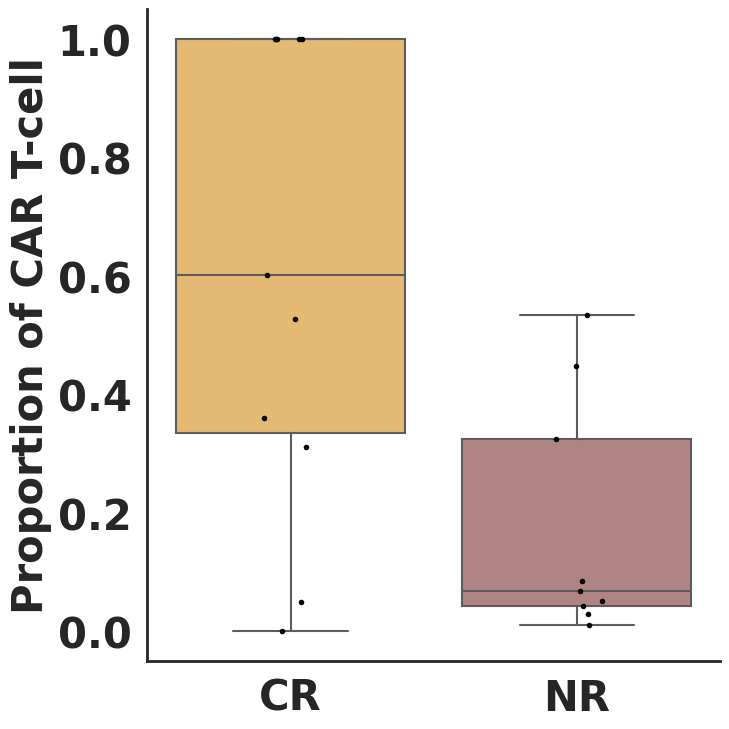

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


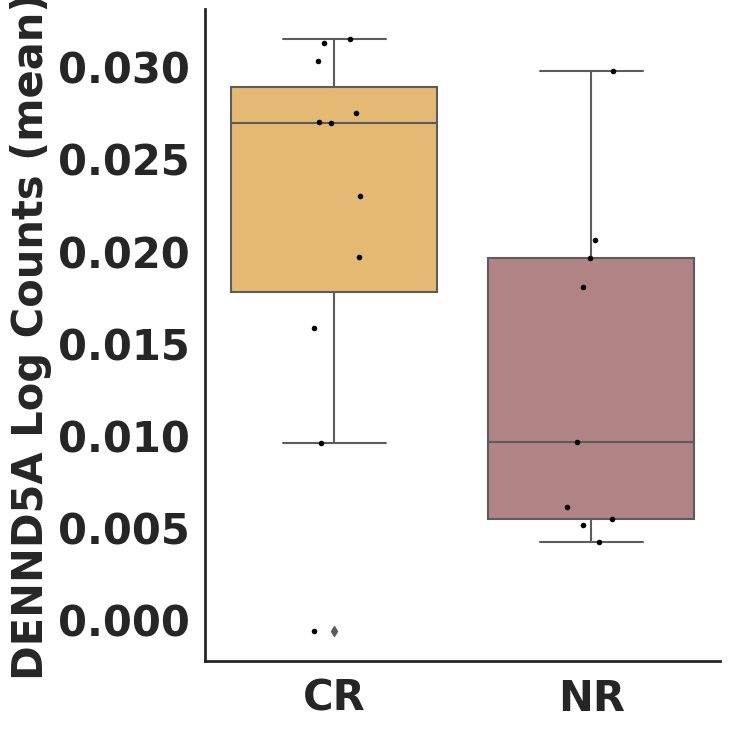

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


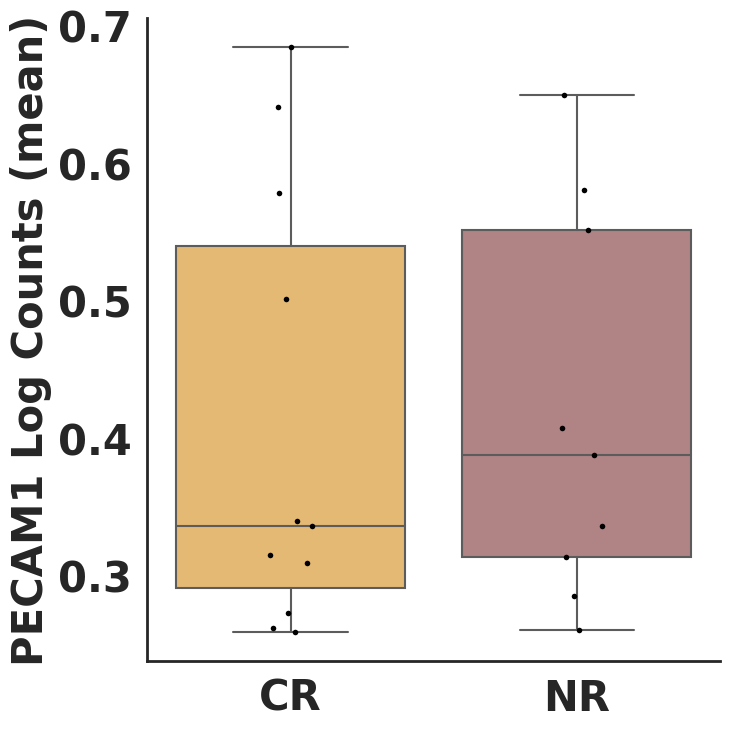

Gene pairs: DENND5A & CD27


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


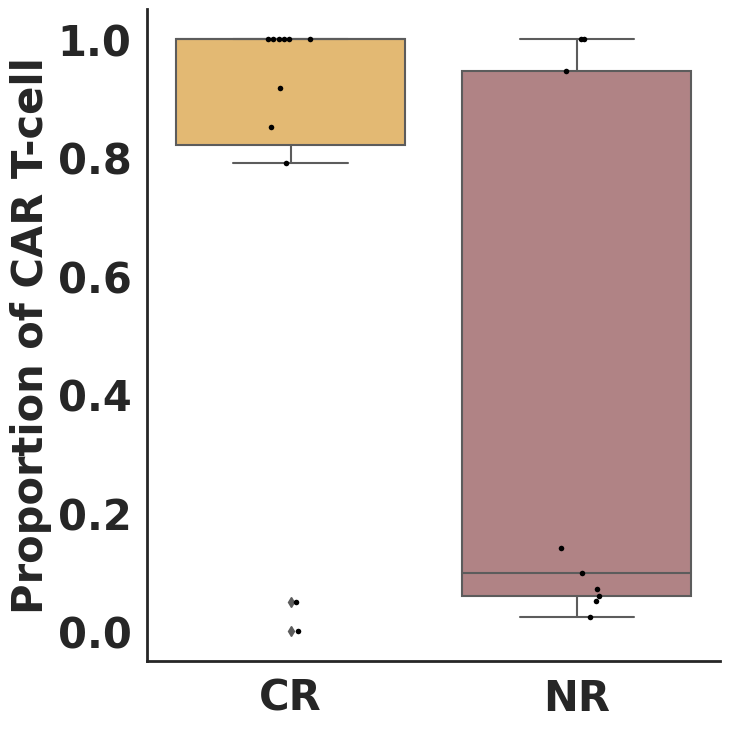

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


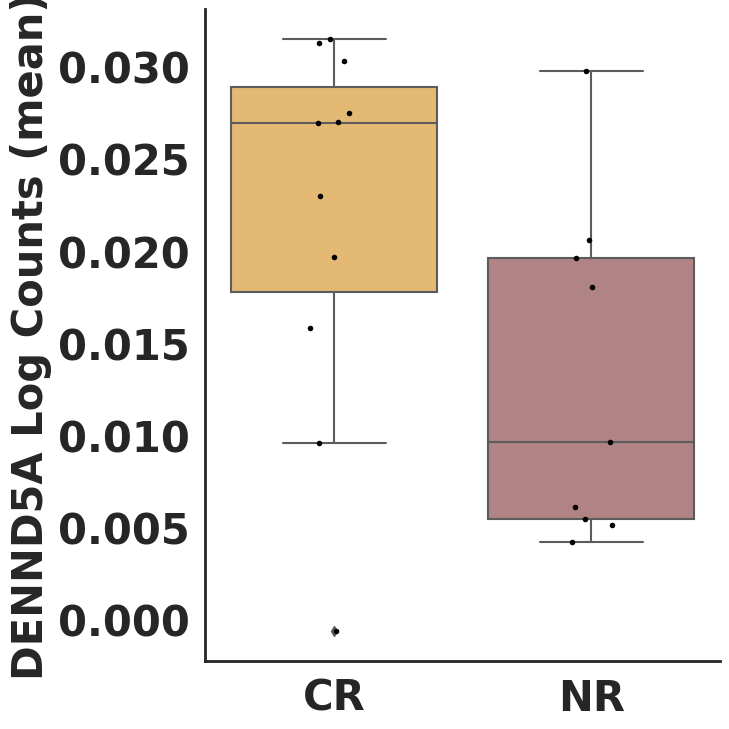

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


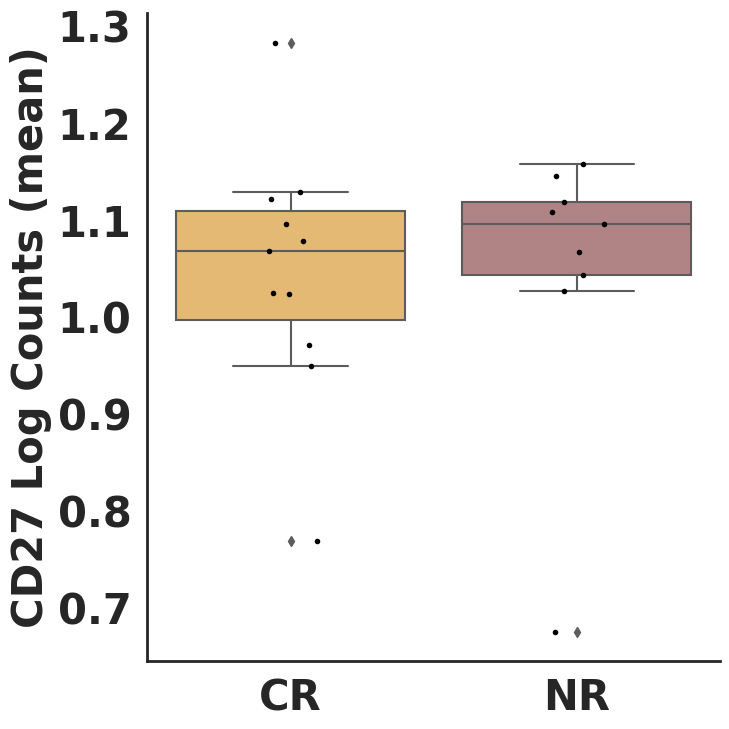

Gene pairs: CD81 & CD7


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


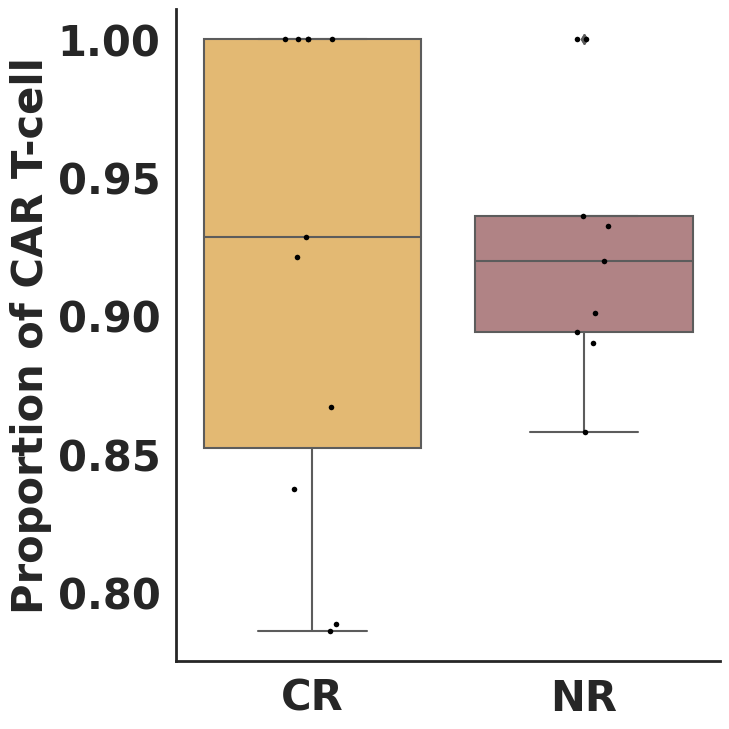

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


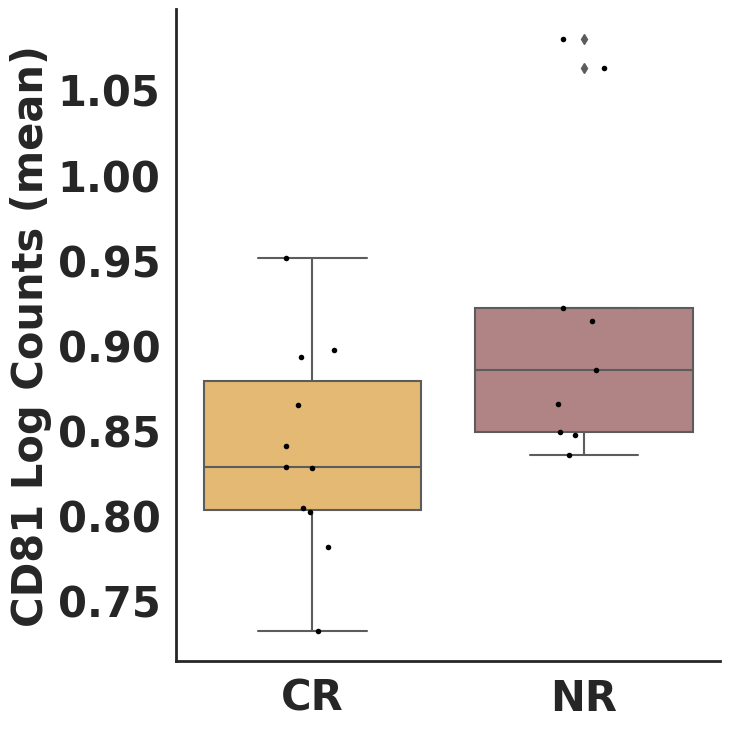

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


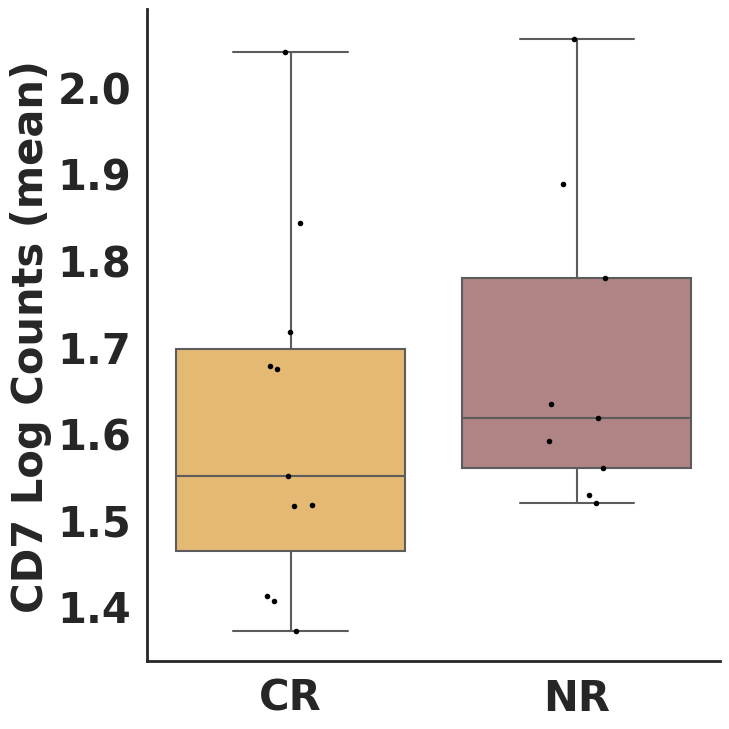

In [9]:
import scanpy as sc
import numpy as np
import pandas as pd
from scipy.sparse import issparse
from sklearn.preprocessing import LabelEncoder
from scipy.stats import zscore
import matplotlib.pyplot as plt
import seaborn as sns

# Load your dataset
adata = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD4_CD8A_highly_variable_combat.h5ad')
adata_CD8 = adata[adata.obs['cell_type'] == 'CD8'].copy()
adata_CR_NR = adata_CD8[(adata_CD8.obs['response'] == 'CR') | (adata_CD8.obs['response'] == 'NR')].copy()
# Define gene pairs
gene_pairs = [
    ("DENND5A", "PECAM1"),
    ("DENND5A", "CD27"),
    ("CD81", "CD7")
]

# Define the color palette
color_palette = ["#F6BD60", "#B77B7E"]
#"#A3B18A", 

# Set global font and line styles for bold
plt.rcParams['font.weight'] = 'bold'
plt.rcParams['font.size'] = '30'
plt.rcParams['axes.linewidth'] = 2
plt.rcParams['axes.labelweight'] = 'bold'
#plt.rcParams['xtick.labelsize'] = 20
#plt.rcParams['ytick.labelsize'] = 30
plt.rcParams['xtick.major.width'] = 2
plt.rcParams['ytick.major.width'] = 2

for gene1, gene2 in gene_pairs:
    # Prepare the data for the gene pair
    print(f'Gene pairs: {gene1} & {gene2}')
    model_data = []
    patients = adata_CR_NR.obs['barcode'].unique()
    for patient in patients:
        patient_data = adata_CR_NR[adata_CR_NR.obs['barcode'] == patient]
        gene1_expr = patient_data[:, gene1].X.toarray().flatten() > 0 if issparse(patient_data.X) else patient_data[:, gene1].X > 0
        gene2_expr = patient_data[:, gene2].X.toarray().flatten() > 0 if issparse(patient_data.X) else patient_data[:, gene2].X > 0
        both_genes_expr = np.logical_and(gene1_expr, gene2_expr)
        proportion = np.sum(both_genes_expr) / patient_data.shape[0]
        gene1_count = np.mean(patient_data[:, gene1].X)  # Sum of log1p-transformed counts
        gene2_count = np.mean(patient_data[:, gene2].X)  # Sum of log1p-transformed counts

        # Append the data for analysis
        model_data.append({
            'Patient': patient,
            'Response': patient_data.obs['response'].values[0],
            'Proportion_Positive': proportion,
            f'{gene1}_Count': gene1_count,
            f'{gene2}_Count': gene2_count
        })

    # Convert the model_data list to a DataFrame
    model_df = pd.DataFrame(model_data)
    model_df[f'{gene1}_Count'] = model_df[f'{gene1}_Count'].astype(float)
    model_df[f'{gene2}_Count'] = model_df[f'{gene2}_Count'].astype(float)
    # Visualization - Adjusted version to display tick marks
    sns.set_style("white")

    # 1. Proportion of cells expressing both genes across response groups
    plt.figure(figsize=(8, 8))
    sns.boxplot(x='Response', y='Proportion_Positive', data=model_df, palette=color_palette)
    sns.stripplot(x='Response', y='Proportion_Positive', data=model_df, color='black', size=4, jitter=True)
    # Remove x-axis label explicitly
    plt.xlabel('')  # Ensure the x-axis label is removed
    plt.ylabel('Proportion of CAR T-cell', fontweight='bold')
    # Ensure tick marks are displayed and adjust their size
    plt.tick_params(axis='both', which='both', length=8, width=2, labelsize=20)
    # Add tick marks explicitly, if necessary
    plt.xticks(fontsize=30)
    plt.yticks(fontsize=30)
    # Display the plot with tick marks
    sns.despine(top=True, right=True)
    plt.tight_layout()
    plt.show()


    
        # 2. Gene counts across response groups for gene1
    plt.figure(figsize=(8, 8))
    sns.boxplot(x='Response', y=f'{gene1}_Count', data=model_df, palette=color_palette)
    sns.stripplot(x='Response', y=f'{gene1}_Count', data=model_df, color='black', size=4, jitter=True)

    # Remove x-axis label explicitly
    plt.xlabel('')  # Ensure the x-axis label is removed
    plt.ylabel(f'{gene1} Log Counts (mean)', fontweight='bold')

    # Ensure tick marks are displayed and adjust their size
    plt.tick_params(axis='both', which='both', length=8, width=2, labelsize=20)

    # Add tick marks explicitly
    plt.xticks(fontsize=30)
    plt.yticks(fontsize=30)

    # Display the plot with tick marks
    sns.despine(top=True, right=True)
    plt.tight_layout()
    plt.show()

    # 3. Gene counts across response groups for gene2
    plt.figure(figsize=(8, 8))
    sns.boxplot(x='Response', y=f'{gene2}_Count', data=model_df, palette=color_palette)
    sns.stripplot(x='Response', y=f'{gene2}_Count', data=model_df, color='black', size=4, jitter=True)

    # Remove x-axis label explicitly
    plt.xlabel('')  # Ensure the x-axis label is removed
    plt.ylabel(f'{gene2} Log Counts (mean)', fontweight='bold')

    # Ensure tick marks are displayed and adjust their size
    plt.tick_params(axis='both', which='both', length=8, width=2, labelsize=20)

    # Add tick marks explicitly
    plt.xticks(fontsize=30)
    plt.yticks(fontsize=30)

    # Display the plot with tick marks
    sns.despine(top=True, right=True)
    plt.tight_layout()
    plt.show()

Gene pairs: DENND5A


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


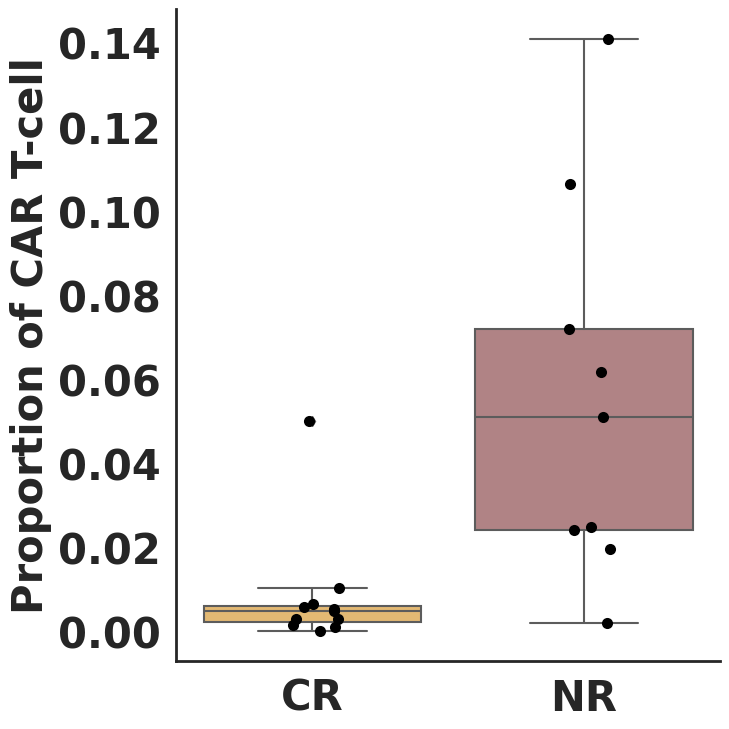

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


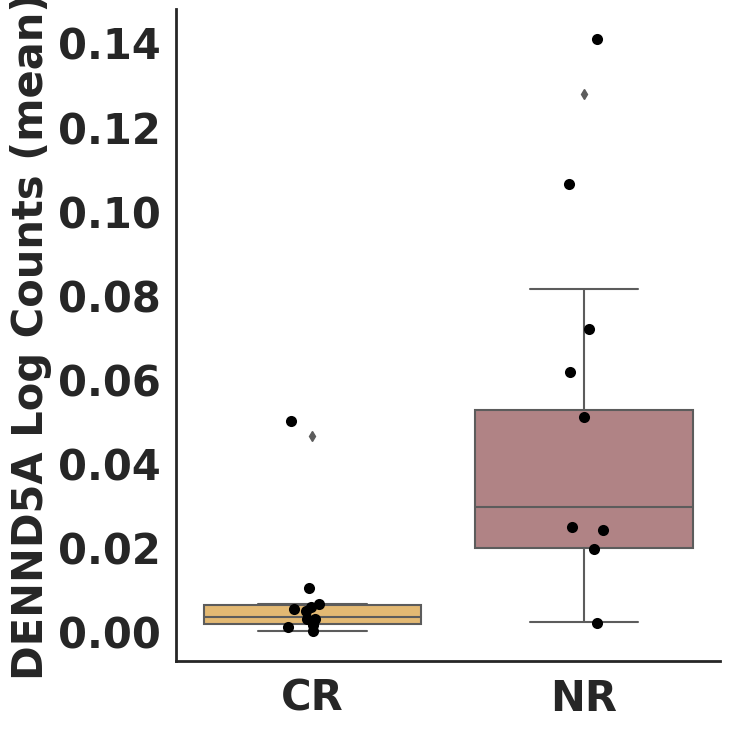

In [7]:
import scanpy as sc
import numpy as np
import pandas as pd
from scipy.sparse import issparse
from sklearn.preprocessing import LabelEncoder
from scipy.stats import zscore
import matplotlib.pyplot as plt
import seaborn as sns

# Load your dataset
adata = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD4_CD8A_highly_variable_log.h5ad')
adata_CD8 = adata[adata.obs['cell_type'] == 'CD8'].copy()
adata_CR_NR = adata_CD8[(adata_CD8.obs['response'] == 'CR') | (adata_CD8.obs['response'] == 'NR')].copy()
# Define gene pairs
gene_pairs = ["DENND5A"]
# Define the color palette
color_palette = ["#F6BD60", "#B77B7E"]
#"#A3B18A", 

# Set global font and line styles for bold
plt.rcParams['font.weight'] = 'bold'
plt.rcParams['font.size'] = '30'
plt.rcParams['axes.linewidth'] = 2
plt.rcParams['axes.labelweight'] = 'bold'
#plt.rcParams['xtick.labelsize'] = 20
#plt.rcParams['ytick.labelsize'] = 30
plt.rcParams['xtick.major.width'] = 2
plt.rcParams['ytick.major.width'] = 2

for gene in gene_pairs:
    # Prepare the data for the gene pair
    print(f'Gene pairs: {gene}')
    model_data = []
    patients = adata_CR_NR.obs['barcode'].unique()
    for patient in patients:
        patient_data = adata_CR_NR[adata_CR_NR.obs['barcode'] == patient]
        gene_expr = patient_data[:, gene].X.toarray().flatten() > 0 if issparse(patient_data.X) else patient_data[:, gene1].X > 0
        proportion = np.sum(gene_expr) / patient_data.shape[0]
        gene_count = np.mean(patient_data[:, gene].X)  # Sum of log1p-transformed counts

        # Append the data for analysis
        model_data.append({
            'Patient': patient,
            'Response': patient_data.obs['response'].values[0],
            'Proportion_Positive': proportion,
            f'{gene}_Count': gene_count,
        })

    # Convert the model_data list to a DataFrame
    model_df = pd.DataFrame(model_data)
    # Visualization - Adjusted version to display tick marks
    sns.set_style("white")

    # 1. Proportion of cells expressing both genes across response groups
    plt.figure(figsize=(8, 8))
    sns.boxplot(x='Response', y='Proportion_Positive', data=model_df, palette=color_palette)
    sns.stripplot(x='Response', y='Proportion_Positive', data=model_df, color='black', size=8, jitter=True)
    # Remove x-axis label explicitly
    plt.xlabel('')  # Ensure the x-axis label is removed
    plt.ylabel('Proportion of CAR T-cell', fontweight='bold')
    # Ensure tick marks are displayed and adjust their size
    plt.tick_params(axis='both', which='both', length=8, width=2, labelsize=20)
    # Add tick marks explicitly, if necessary
    plt.xticks(fontsize=30)
    plt.yticks(fontsize=30)
    # Display the plot with tick marks
    sns.despine(top=True, right=True)
    plt.tight_layout()
    plt.show()


    
        # 2. Gene counts across response groups for gene1
    plt.figure(figsize=(8, 8))
    sns.boxplot(x='Response', y=f'{gene}_Count', data=model_df, palette=color_palette)
    sns.stripplot(x='Response', y='Proportion_Positive', data=model_df, color='black', size=8, jitter=True)
    # Remove x-axis label explicitly
    plt.xlabel('')  # Ensure the x-axis label is removed
    plt.ylabel(f'{gene1} Log Counts (mean)', fontweight='bold')
    # Ensure tick marks are displayed and adjust their size
    plt.tick_params(axis='both', which='both', length=8, width=2, labelsize=20)

    # Add tick marks explicitly
    plt.xticks(fontsize=30)
    plt.yticks(fontsize=30)

    # Display the plot with tick marks
    sns.despine(top=True, right=True)
    plt.tight_layout()
    plt.show()

In [20]:
import scanpy as sc
import numpy as np
import pandas as pd
from scipy.sparse import issparse
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import StratifiedKFold
from xgboost import XGBClassifier
from scipy.stats import zscore

# Load your dataset
adata = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD4_CD8A_highly_variable_log.h5ad')
adata_CD8 = adata[adata.obs['cell_type'] == 'CD8'].copy()
adata_CD8_cluster = adata_CD8[adata_CD8.obs['leiden_0.9'].isin(['0', '1', '4', '7', '9', '10', '11', '13', '14'])].copy()
adata_CR_NR = adata_CD8_cluster[(adata_CD8_cluster.obs['response'] == 'CR') | (adata_CD8_cluster.obs['response'] == 'NR')].copy()

# Encode the 'response' labels (CR and NR only)
le = LabelEncoder()
adata_CR_NR.obs['Response_Encoded'] = le.fit_transform(adata_CR_NR.obs['response'])  # CR = 0, NR = 1

# Add a suffix to the patient IDs to make them unique
adata_CR_NR.obs['Unique_ID'] = adata_CR_NR.obs['barcode'].astype(str) + '-' + adata_CR_NR.obs['timepoint'].astype(str)

# Define the list of gene pairs
gene_pairs = [
    ("PECAM1", "JUND"),
    ("JUND", "TYMS"),
    ("PECAM1", "MATK"),
    ("JUND", "MSN"),
    ("JUND", "MATK"),
    ("PECAM1", "MSN"),
    ("FCER1G", "JUND"),
    ("JUND", "GINS2"),
    ("JUND", "TLE5"),
    ("JUND", "CLSPN"),
    ("JUND", "CTSW"),
    ("KLRK1", "JUND"),
    ("PECAM1", "TSC22D3"),
    ("PECAM1", "TYMS"),
    ("PECAM1", "TLE5"),
    ("PECAM1", "CTSW"),
    ("JUND", "ZNF683"),
    ("JUND", "LFNG"),
    ("PECAM1", "FCER1G"),
    ("JUND", "TSC22D3")
]

# Prepare to store results for each gene pair
evaluation_results = []

# Define XGBoost parameters
xgb_params = {
    'n_estimators': 100,
    'max_depth': 3,
    'learning_rate': 0.1,
    'use_label_encoder': False,
    'eval_metric': 'logloss',
    'random_state': 42
}

# Initialize Stratified K-Fold Cross-Validation
n_splits = 5
kf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

# Iterate over all pairs of genes
for gene1, gene2 in gene_pairs:
    print(f"Evaluating gene pair: {gene1} & {gene2}")

    # Prepare data for analysis
    model_data = [] 
    patients = adata_CR_NR.obs['Unique_ID'].unique()
    
    # Calculate the proportion of cells expressing both genes for each patient
    for patient in patients:
        patient_data = adata_CR_NR[adata_CR_NR.obs['Unique_ID'] == patient]
        
        # Ensure the data is dense if needed
        gene1_expr = patient_data[:, gene1].X.toarray().flatten() > 0 if issparse(patient_data.X) else patient_data[:, gene1].X > 0
        gene2_expr = patient_data[:, gene2].X.toarray().flatten() > 0 if issparse(patient_data.X) else patient_data[:, gene2].X > 0
        both_genes_expr = np.logical_and(gene1_expr, gene2_expr)
        proportion = np.sum(both_genes_expr) / patient_data.shape[0]
        gene1_count = np.mean(patient_data[:, gene1].X)
        gene2_count = np.mean(patient_data[:, gene2].X)

        # Append the data for analysis
        model_data.append({
            'Patient': patient,
            'Response_Encoded': patient_data.obs['Response_Encoded'].values[0],
            'Proportion_Positive': proportion,
            f'{gene1}_Count': gene1_count,
            f'{gene2}_Count': gene2_count
        })
    
    # Convert to DataFrame
    model_df = pd.DataFrame(model_data)

    # Normalize the features using zscore
    model_df['Proportion_Positive_Z'] = zscore(model_df['Proportion_Positive'])
    model_df[f'{gene1}_Count_Z'] = zscore(model_df[f'{gene1}_Count'])
    model_df[f'{gene2}_Count_Z'] = zscore(model_df[f'{gene2}_Count'])

    # Select the normalized features and the target variable
    X = model_df[['Proportion_Positive_Z', f'{gene1}_Count_Z', f'{gene2}_Count_Z']]
    y = model_df['Response_Encoded']

    # Perform 5-fold cross-validation
    fold_accuracies = []
    fold_precisions = []
    fold_recalls = []
    fold_f1s = []

    for train_index, test_index in kf.split(X, y):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]

        # Train the XGBoost classifier
        xgb_model = XGBClassifier(**xgb_params)
        xgb_model.fit(X_train, y_train)

        # Predict on the test set
        y_pred = xgb_model.predict(X_test)

        # Calculate accuracy, precision, recall, and F1-score
        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred, average='weighted')
        recall = recall_score(y_test, y_pred, average='weighted')
        f1 = f1_score(y_test, y_pred, average='weighted')

        # Append fold metrics
        fold_accuracies.append(accuracy)
        fold_precisions.append(precision)
        fold_recalls.append(recall)
        fold_f1s.append(f1)

    # Store the average metrics across the 5 folds
    evaluation_results.append({
        'Gene_Pair': f'{gene1} & {gene2}',
        'Accuracy': np.mean(fold_accuracies),
        'Precision': np.mean(fold_precisions),
        'Recall': np.mean(fold_recalls),
        'F1_Score': np.mean(fold_f1s)
    })

# Convert the evaluation results to a DataFrame
evaluation_df = pd.DataFrame(evaluation_results)

# Save the results to a CSV file
evaluation_df.to_csv('/home/emma/result/CART/CD8_figure3_2_genes_xgboost_evaluation_metrics_CR_NR_5fold.csv', index=False)

print("XGBoost evaluation with 5-fold cross-validation complete. Results exported to '/home/emma/result/CART/CD8_gene_pairs_xgboost_evaluation_metrics_CR_NR_5fold.csv'.")


Evaluating gene pair: PECAM1 & JUND


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.wa

Evaluating gene pair: JUND & TYMS


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.wa

Evaluating gene pair: PECAM1 & MATK


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.wa

Evaluating gene pair: JUND & MSN


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.wa

Evaluating gene pair: JUND & MATK


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.wa

Evaluating gene pair: PECAM1 & MSN


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/emma/miniconda3/envs/serverGPU/lib/pytho

Evaluating gene pair: FCER1G & JUND


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.wa

Evaluating gene pair: JUND & GINS2


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.wa

Evaluating gene pair: JUND & TLE5


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.wa

Evaluating gene pair: JUND & CLSPN


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.wa

Evaluating gene pair: JUND & CTSW


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.wa

Evaluating gene pair: KLRK1 & JUND


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and b

Evaluating gene pair: PECAM1 & TSC22D3


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.wa

Evaluating gene pair: PECAM1 & TYMS


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.wa

Evaluating gene pair: PECAM1 & TLE5


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.wa

Evaluating gene pair: PECAM1 & CTSW


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.wa

Evaluating gene pair: JUND & ZNF683


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.wa

Evaluating gene pair: JUND & LFNG


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.wa

Evaluating gene pair: PECAM1 & FCER1G


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.wa

Evaluating gene pair: JUND & TSC22D3
XGBoost evaluation with 5-fold cross-validation complete. Results exported to '/home/emma/result/CART/CD8_gene_pairs_xgboost_evaluation_metrics_CR_NR_5fold.csv'.


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.wa

In [28]:
import scanpy as sc
import numpy as np
import pandas as pd
from scipy.sparse import issparse
from sklearn.preprocessing import LabelEncoder
from scipy.spatial.distance import pdist, squareform
from skbio.stats.distance import DistanceMatrix
from skbio.stats.distance import permanova
from scipy.stats import zscore

# Load log-transformed dataset for proportions and gene counts
adata = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD4_CD8A_highly_variable_log.h5ad')
adata_CD8 = adata[adata.obs['cell_type'] == 'CD8'].copy()

# Encode the 'response' labels
le = LabelEncoder()
adata_CD8.obs['Response_Encoded'] = le.fit_transform(adata_CD8.obs['response'])

# Add a suffix to the patient IDs to make them unique
adata_CD8.obs['Unique_ID'] = adata_CD8.obs['barcode'].astype(str) + '-' + adata_CD8.obs['timepoint'].astype(str)

# Define gene list
genes = [
    "CD27", "CD81", "CD7", "KLRK1", "ITGB2",                          # Immune System and Cell Surface Markers
    "GZMK", "PRF1", "CST7",                                           # Cytotoxicity and Immune Response
    "ALYREF", "ZNF683",                                               # Transcription Factors and Gene Regulation
    "DENND5A", "ARL4C", "TSC22D3",                                    # Signal Transduction and Kinases
    "IL7R",                                                           # Cytokine Receptors
    "PECAM1", "ITM2A", "PLP2", "TMEM123", "HOPX", "RPL17"             # Cellular Structure and Metabolism
]

# Prepare to store results
results = []

# Iterate over all genes
for gene in genes:
    # Prepare a list to store the data for the PERMANOVA analysis
    model_data = []

    responses = adata_CD8.obs['response'].unique()
    for response in responses:
        resp_adata = adata_CD8[adata_CD8.obs['response'] == response]
        patients = resp_adata.obs['Unique_ID'].unique()
        
        # Calculate the proportion of cells expressing the gene for each patient
        for patient in patients:
            patient_data = resp_adata[resp_adata.obs['Unique_ID'] == patient]
            
            # Ensure the data is dense if needed
            gene_expr = patient_data[:, gene].X.toarray().flatten() > 0 if issparse(patient_data.X) else patient_data[:, gene].X > 0
            proportion = np.sum(gene_expr) / patient_data.shape[0]
            gene_count = np.mean(patient_data[:, gene].X)

            # Append the data for PERMANOVA analysis
            model_data.append({
                'Patient': patient,
                'Response_Encoded': patient_data.obs['Response_Encoded'].values[0], 
                'Proportion_Positive': proportion,
                f'{gene}_Count': gene_count
            })

    # Convert the model_data list to a DataFrame
    model_df = pd.DataFrame(model_data)

    # Normalize the variables using Z-scores
    model_df['Proportion_Positive_Z'] = zscore(model_df['Proportion_Positive'])
    model_df[f'{gene}_Count_Z'] = zscore(model_df[f'{gene}_Count'])

    # Calculate the distance matrix for the two normalized variables
    dist_matrix = squareform(pdist(model_df[[f'{gene}_Count_Z', 'Proportion_Positive_Z']], metric='euclidean'))
    
    # Prepare unique IDs for each sample
    ids = model_df.index.to_list()

    # Convert the distance matrix into a skbio DistanceMatrix object
    dist_matrix = DistanceMatrix(dist_matrix, ids=ids)

    # Perform PERMANOVA for each pairwise comparison and retrieve additional statistics
    result_CR_NR = permanova(dist_matrix, model_df['Response_Encoded'].isin([0, 1]), permutations=999)
    result_Infusion_CR = permanova(dist_matrix, model_df['Response_Encoded'].isin([1, 2]), permutations=999)
    result_Infusion_NR = permanova(dist_matrix, model_df['Response_Encoded'].isin([0, 2]), permutations=999)

    p_val_CR_NR = result_CR_NR['p-value']
    p_val_Infusion_CR = result_Infusion_CR['p-value']
    p_val_Infusion_NR = result_Infusion_NR['p-value']
    Var_p = p_val_CR_NR + p_val_Infusion_NR - p_val_Infusion_CR

    pseudo_F_CR_NR = result_CR_NR['test statistic']
    pseudo_F_Infusion_CR = result_Infusion_CR['test statistic']
    pseudo_F_Infusion_NR = result_Infusion_NR['test statistic']
    Var_F = pseudo_F_CR_NR + pseudo_F_Infusion_NR - pseudo_F_Infusion_CR

    # Apply criteria: Significant for CR vs NR and Infusion vs NR, but not Infusion vs CR
    if p_val_CR_NR < 0.05 and p_val_Infusion_CR > 0.05 and p_val_Infusion_NR < 0.05:
        results.append({
            'Gene': gene,
            'Pseudo-F CR vs NR': pseudo_F_CR_NR,
            'P-value CR vs NR': p_val_CR_NR,
            'Pseudo-F Infusion vs CR': pseudo_F_Infusion_CR,
            'P-value Infusion vs CR': p_val_Infusion_CR,
            'Pseudo-F Infusion vs NR': pseudo_F_Infusion_NR,
            'P-value Infusion vs NR': p_val_Infusion_NR,
            'Variance F': Var_F,
            'Variance p': Var_p
        })

# Convert the results list to a DataFrame
results_df = pd.DataFrame(results)

# Calculate Z-scores for Variance F and Variance p
results_df['Z_Var_F'] = zscore(results_df['Variance F'])
results_df['Z_Var_P'] = zscore(results_df['Variance p'])

# Combine Z-scores into a single score
results_df['Z_Score'] = results_df['Z_Var_F'] - results_df['Z_Var_P']

# Rank the genes by the Z_Score
ranked_genes = results_df.sort_values(by='Z_Score', ascending=False)

# Export the ranked results to an Excel file
ranked_genes.to_excel('/home/emma/result/CART/CD8_figure3_1_gene_permanova_results_ranked_by_z_score_log_mean.xlsx', index=False)

print("Analysis complete. Results exported to '/home/emma/result/CART/CD8_figure3_gene_permanova_results_ranked_by_z_score_log.xlsx'.")

Analysis complete. Results exported to '/home/emma/result/CART/CD8_figure3_gene_permanova_results_ranked_by_z_score_log.xlsx'.


In [29]:
import scanpy as sc
import numpy as np
import pandas as pd
from scipy.sparse import issparse
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from scipy.stats import zscore
import xgboost as xgb

# Load your dataset
adata = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD4_CD8A_highly_variable_log.h5ad')
adata_CD8 = adata[adata.obs['cell_type'] == 'CD8'].copy()

# Encode the 'response' labels
adata_CD8.obs['Response_Simplified'] = adata_CD8.obs['response'].replace({
    'Infusion': 'Non-NR',
    'CR': 'Non-NR',
    'NR': 'NR'
})

# Encode the simplified labels
le = LabelEncoder()
adata_CD8.obs['Response_Encoded'] = le.fit_transform(adata_CD8.obs['Response_Simplified'])

# Print the mapping of the encoded labels
response_mapping = dict(zip(le.classes_, le.transform(le.classes_)))
print("Response Label Mapping (Original Label -> Encoded Value):")
for label, encoded_value in response_mapping.items():
    print(f"{label} -> {encoded_value}")

# Add unique ID to each patient
adata_CD8.obs['Unique_ID'] = adata_CD8.obs['barcode'].astype(str) + '-' + adata_CD8.obs['timepoint'].astype(str)

# Define the list of genes
genes = [
    "PECAM1", "CD81", "ZNF683"
]

# Prepare to store results for each gene
evaluation_results = []

# Define common XGBoost parameters
xgb_params = {
    'n_estimators': 100,
    'random_state': 42,
    'use_label_encoder': False,
    'eval_metric': 'logloss'
}

# Iterate over each gene
for gene in genes:
    # Prepare a list to store the data for each gene
    model_data = []

    responses = adata_CD8.obs['Response_Encoded'].unique()
    for response in responses:
        resp_adata = adata_CD8[adata_CD8.obs['Response_Encoded'] == response]
        patients = resp_adata.obs['Unique_ID'].unique()
        
        # Calculate the proportion of cells expressing the gene for each patient
        for patient in patients:
            patient_data = resp_adata[resp_adata.obs['Unique_ID'] == patient]
            
            # Ensure the data is dense if needed
            gene_expr = patient_data[:, gene].X.toarray().flatten() > 0 if issparse(patient_data.X) else patient_data[:, gene].X > 0
            proportion = np.sum(gene_expr) / patient_data.shape[0]
            gene_count = np.mean(patient_data[:, gene].X)

            # Append the data for analysis
            model_data.append({
                'Patient': patient,
                'Response_Encoded': response,
                'Proportion_Positive': proportion,
                f'{gene}_Count': gene_count
            })

    # Convert the model_data list to a DataFrame
    model_df = pd.DataFrame(model_data)

    # Normalize the features using zscore
    model_df['Proportion_Positive_Z'] = zscore(model_df['Proportion_Positive'])
    model_df[f'{gene}_Count_Z'] = zscore(model_df[f'{gene}_Count'])

    # Select the normalized features and the target variable
    X = model_df[['Proportion_Positive_Z', f'{gene}_Count_Z']]
    y = model_df['Response_Encoded']

    # Split the data into training and test sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

    # Train an XGBoost classifier using the common parameters
    xgb_model = xgb.XGBClassifier(**xgb_params)
    xgb_model.fit(X_train, y_train)

    # Predict on the test set
    y_pred = xgb_model.predict(X_test)

    # Calculate accuracy, precision, recall, and F1-score
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')

    # Store the results
    evaluation_results.append({
        'Gene': gene,
        'Accuracy': accuracy,
        'Precision': precision,
        'Recall': recall,
        'F1_Score': f1
    })

# Convert the evaluation results to a DataFrame
evaluation_df = pd.DataFrame(evaluation_results)

# Save the results to a CSV file
evaluation_df.to_csv('/home/emma/result/CART/CD8_figure3_1_gene_xgb_evaluation_metrics_mean.csv', index=False)

print("XGBoost evaluation complete. Results exported to '/home/emma/result/CART/CD8_single_gene_xgb_evaluation_metrics.csv'.")

Response Label Mapping (Original Label -> Encoded Value):
NR -> 0
Non-NR -> 1


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")


XGBoost evaluation complete. Results exported to '/home/emma/result/CART/CD8_single_gene_xgb_evaluation_metrics.csv'.


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")


In [17]:
import scanpy as sc
import numpy as np
import pandas as pd
import itertools
from scipy.sparse import issparse
from sklearn.preprocessing import LabelEncoder
from scipy.spatial.distance import pdist, squareform
from skbio.stats.distance import DistanceMatrix
from skbio.stats.distance import permanova
from scipy.stats import zscore

# Load log-transformed dataset for proportions and gene counts
adata = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD4_CD8A_highly_variable_log.h5ad')
adata_CD8 = adata[adata.obs['cell_type'] == 'CD8'].copy()

# Encode the 'response' labels
le = LabelEncoder()
adata_CD8.obs['Response_Encoded'] = le.fit_transform(adata_CD8.obs['response'])

# Add a suffix to the patient IDs to make them unique
adata_CD8.obs['Unique_ID'] = adata_CD8.obs['barcode'].astype(str) + '-' + adata_CD8.obs['timepoint'].astype(str)

# Define gene list
genes = [
    "CD27", "CD81", "CD7", "KLRK1", "ITGB2",                          # Immune System and Cell Surface Markers
    "GZMK", "PRF1", "CST7",                                           # Cytotoxicity and Immune Response
    "ALYREF", "ZNF683",                                               # Transcription Factors and Gene Regulation
    "DENND5A", "ARL4C", "TSC22D3",                                    # Signal Transduction and Kinases
    "IL7R",                                                           # Cytokine Receptors
    "PECAM1", "ITM2A", "PLP2", "TMEM123", "HOPX", "RPL17"             # Cellular Structure and Metabolism
]

# Prepare to store results
results = []

# Iterate over all pairs of genes
for gene1, gene2 in itertools.combinations(genes, 2):
    # Prepare a list to store the data for the PERMANOVA analysis
    model_data = []

    responses = adata_CD8.obs['response'].unique()
    for response in responses:
        resp_adata = adata_CD8[adata_CD8.obs['response'] == response]
        patients = resp_adata.obs['Unique_ID'].unique()
        
        # Calculate the proportion of cells expressing both genes for each patient
        for patient in patients:
            patient_data = resp_adata[resp_adata.obs['Unique_ID'] == patient]
            
            # Ensure the data is dense if needed
            gene1_expr = patient_data[:, gene1].X.toarray().flatten() > 0 if issparse(patient_data.X) else patient_data[:, gene1].X > 0
            gene2_expr = patient_data[:, gene2].X.toarray().flatten() > 0 if issparse(patient_data.X) else patient_data[:, gene2].X > 0
            both_genes_expr = np.logical_and(gene1_expr, gene2_expr)
            proportion = np.sum(both_genes_expr) / patient_data.shape[0]
            gene1_count = np.mean(patient_data[:, gene1].X)
            gene2_count = np.mean(patient_data[:, gene2].X)

            # Append the data for PERMANOVA analysis
            model_data.append({
                'Patient': patient,
                'Response_Encoded': patient_data.obs['Response_Encoded'].values[0], 
                'Proportion_Positive': proportion,
                f'{gene1}_Count': gene1_count,
                f'{gene2}_Count': gene2_count
            })

    # Convert the model_data list to a DataFrame
    model_df = pd.DataFrame(model_data)

    # Normalize the variables using Z-scores
    model_df['Proportion_Positive_Z'] = zscore(model_df['Proportion_Positive'])
    model_df[f'{gene1}_Count_Z'] = zscore(model_df[f'{gene1}_Count'])
    model_df[f'{gene2}_Count_Z'] = zscore(model_df[f'{gene2}_Count'])

    # Calculate the distance matrix for the three normalized variables
    dist_matrix = squareform(pdist(model_df[[f'{gene1}_Count_Z', f'{gene2}_Count_Z', 'Proportion_Positive_Z']], metric='euclidean'))
    
    # Prepare unique IDs for each sample
    ids = model_df.index.to_list()

    # Convert the distance matrix into a skbio DistanceMatrix object
    dist_matrix = DistanceMatrix(dist_matrix, ids=ids)

    # Perform PERMANOVA for each pairwise comparison and retrieve additional statistics
    result_CR_NR = permanova(dist_matrix, model_df['Response_Encoded'].isin([0, 1]), permutations=999)
    result_Infusion_CR = permanova(dist_matrix, model_df['Response_Encoded'].isin([1, 2]), permutations=999)
    result_Infusion_NR = permanova(dist_matrix, model_df['Response_Encoded'].isin([0, 2]), permutations=999)

    p_val_CR_NR = result_CR_NR['p-value']
    p_val_Infusion_CR = result_Infusion_CR['p-value']
    p_val_Infusion_NR = result_Infusion_NR['p-value']
    Var_p = p_val_CR_NR + p_val_Infusion_NR - p_val_Infusion_CR

    pseudo_F_CR_NR = result_CR_NR['test statistic']
    pseudo_F_Infusion_CR = result_Infusion_CR['test statistic']
    pseudo_F_Infusion_NR = result_Infusion_NR['test statistic']
    Var_F = pseudo_F_CR_NR + pseudo_F_Infusion_NR - pseudo_F_Infusion_CR
    

    # Apply criteria: Significant for CR vs NR and Infusion vs CR, but not Infusion vs NR
    if p_val_CR_NR < 0.05 and p_val_Infusion_CR > 0.05 and p_val_Infusion_NR < 0.05:
        results.append({
            'Gene1': gene1,
            'Gene2': gene2,
            'Pseudo-F CR vs NR': pseudo_F_CR_NR,
            'P-value CR vs NR': p_val_CR_NR,
            'Pseudo-F Infusion vs CR': pseudo_F_Infusion_CR,
            'P-value Infusion vs CR': p_val_Infusion_CR,
            'Pseudo-F Infusion vs NR': pseudo_F_Infusion_NR,
            'P-value Infusion vs NR': p_val_Infusion_NR,
            'Variance F': Var_F,
            'Variance p': Var_p
        })

# Convert the results list to a DataFrame
results_df = pd.DataFrame(results)

# Calculate Z-scores for Variance F and Variance p
results_df['Z_Var_F'] = zscore(results_df['Variance F'])
results_df['Z_Var_P'] = zscore(results_df['Variance p'])

# Combine Z-scores into a single score
results_df['Z_Score'] = results_df['Z_Var_F'] - results_df['Z_Var_P']

# Rank the pairs by the Z_Score
ranked_pairs = results_df.sort_values(by='Z_Score', ascending=False)

# Export the ranked results to an Excel file
ranked_pairs.to_excel('/home/emma/result/CART/CD8_figure3_2_genes_permanova_results_ranked_by_z_score_log_mean.xlsx', index=False)

print("Analysis complete. Results exported to '/home/emma/result/CART/CD8_figure3_gene_pair_permanova_results_ranked_by_z_score_log.xlsx'.")

Analysis complete. Results exported to '/home/emma/result/CART/CD8_figure3_gene_pair_permanova_results_ranked_by_z_score_log.xlsx'.


In [1]:
import scanpy as sc
import numpy as np
import pandas as pd
import itertools
from scipy.sparse import issparse
from sklearn.preprocessing import LabelEncoder
from scipy.spatial.distance import pdist, squareform
from skbio.stats.distance import DistanceMatrix
from skbio.stats.distance import permanova
from scipy.stats import zscore

# Load log-transformed dataset for proportions and gene counts
adata = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD4_CD8A_highly_variable_log.h5ad')

# Focus on CD8 cells and clusters of interest
adata_CD8 = adata[adata.obs['cell_type'] == 'CD8'].copy()
adata_CD8_clusters = adata_CD8[adata_CD8.obs['leiden_0.9'].isin(['0', '1', '4', '7', '9', '10', '11', '13', '14'])].copy()

# Filter the dataset to include only 'CR' and 'NR' responses
adata_CR_NR = adata_CD8_clusters[(adata_CD8_clusters.obs['response'] == 'CR') | (adata_CD8_clusters.obs['response'] == 'NR')].copy()

# Encode the 'response' labels (CR as 1, NR as 0)
le = LabelEncoder()
adata_CR_NR.obs['Response_Encoded'] = le.fit_transform(adata_CR_NR.obs['response'])

# Add a suffix to the patient IDs to make them unique
adata_CR_NR.obs['Unique_ID'] = adata_CR_NR.obs['barcode'].astype(str) + '-' + adata_CR_NR.obs['timepoint'].astype(str)

# Define gene list
genes = [
    "CD27", "CD81", "CD7", "KLRK1", "ITGB2",                          # Immune System and Cell Surface Markers
    "GZMK", "PRF1", "CST7",                                           # Cytotoxicity and Immune Response
    "ALYREF", "ZNF683",                                               # Transcription Factors and Gene Regulation
    "DENND5A", "ARL4C", "TSC22D3",                                    # Signal Transduction and Kinases
    "IL7R",                                                           # Cytokine Receptors
    "PECAM1", "ITM2A", "PLP2", "TMEM123", "HOPX", "RPL17"             # Cellular Structure and Metabolism
]

# Prepare to store results
results = []

# Iterate over all pairs of genes
for gene1, gene2 in itertools.combinations(genes, 2):
    # Prepare a list to store the data for the PERMANOVA analysis
    model_data = []

    # Get unique response types (CR, NR)
    responses = adata_CR_NR.obs['response'].unique()
    for response in responses:
        # Filter for the current response type (CR or NR)
        resp_adata = adata_CR_NR[adata_CR_NR.obs['response'] == response]
        # Get unique patient IDs
        patients = resp_adata.obs['Unique_ID'].unique()

        # Calculate the proportion of cells expressing both genes for each patient
        for patient in patients:
            patient_data = resp_adata[resp_adata.obs['Unique_ID'] == patient]
            
            # Ensure the data is dense if needed
            gene1_expr = patient_data[:, gene1].X.toarray().flatten() > 0 if issparse(patient_data.X) else patient_data[:, gene1].X > 0
            gene2_expr = patient_data[:, gene2].X.toarray().flatten() > 0 if issparse(patient_data.X) else patient_data[:, gene2].X > 0
            both_genes_expr = np.logical_and(gene1_expr, gene2_expr)
            proportion = np.sum(both_genes_expr) / patient_data.shape[0]
            gene1_count = np.mean(patient_data[:, gene1].X)
            gene2_count = np.mean(patient_data[:, gene2].X)

            # Append the data for PERMANOVA analysis
            model_data.append({
                'Patient': patient,
                'Response_Encoded': patient_data.obs['Response_Encoded'].values[0], 
                'Proportion_Positive': proportion,
                f'{gene1}_Count': gene1_count,
                f'{gene2}_Count': gene2_count
            })

    # Convert the model_data list to a DataFrame
    model_df = pd.DataFrame(model_data)

    # Normalize the variables using Z-scores
    model_df['Proportion_Positive_Z'] = zscore(model_df['Proportion_Positive'])
    model_df[f'{gene1}_Count_Z'] = zscore(model_df[f'{gene1}_Count'])
    model_df[f'{gene2}_Count_Z'] = zscore(model_df[f'{gene2}_Count'])

    # Calculate the distance matrix for the three normalized variables
    dist_matrix = squareform(pdist(model_df[[f'{gene1}_Count_Z', f'{gene2}_Count_Z', 'Proportion_Positive_Z']], metric='euclidean'))
    
    # Prepare unique IDs for each sample
    ids = model_df.index.to_list()

    # Convert the distance matrix into a skbio DistanceMatrix object
    dist_matrix = DistanceMatrix(dist_matrix, ids=ids)

    # Perform PERMANOVA for CR vs NR comparison
    result_CR_NR = permanova(dist_matrix, model_df['Response_Encoded'], permutations=999)

    # Extract p-value and pseudo-F statistic for CR vs NR
    p_val_CR_NR = result_CR_NR['p-value']
    pseudo_F_CR_NR = result_CR_NR['test statistic']

    # Apply the significance threshold: keep only pairs with p-value < 0.05
    if p_val_CR_NR < 0.05:
        results.append({
            'Gene1': gene1,
            'Gene2': gene2,
            'Pseudo-F CR vs NR': pseudo_F_CR_NR,
            'P-value CR vs NR': p_val_CR_NR,
        })

# Convert the results list to a DataFrame
results_df = pd.DataFrame(results)

# Calculate Z-scores for Variance F and Variance p
results_df['Z_Var_F'] = zscore(results_df['Pseudo-F CR vs NR'])
results_df['Z_Var_P'] = zscore(results_df['P-value CR vs NR'])

# Combine Z-scores into a single score
results_df['Z_Score'] = results_df['Z_Var_F'] - results_df['Z_Var_P']

# Rank the gene pairs by their Pseudo-F values (higher values indicate stronger differences)
ranked_pairs = results_df.sort_values(by='Z_Score', ascending=False)

# Export the ranked results to an Excel file
ranked_pairs.to_excel('/home/emma/result/CART/CD8_figure3_2_genes_permanova_results_ranked_by_z_score_log_mean_elasticnetClusters_CR_NR.xlsx', index=False)

print("Analysis complete. Results exported to '/home/emma/result/CART/CD8_figure3_gene_pair_permanova_results_ranked_by_z_score_log.xlsx'.")

Analysis complete. Results exported to '/home/emma/result/CART/CD8_figure3_gene_pair_permanova_results_ranked_by_z_score_log.xlsx'.


In [2]:
import scanpy as sc
import numpy as np
import pandas as pd
from scipy.sparse import issparse
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from scipy.stats import zscore
import xgboost as xgb
import itertools

# Load your dataset
adata = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD4_CD8A_highly_variable_log.h5ad')

# Focus on CD8 cells and clusters of interest
adata_CD8 = adata[adata.obs['cell_type'] == 'CD8'].copy()
adata_CD8_clusters = adata_CD8[adata_CD8.obs['leiden_0.9'].isin(['0', '1', '4', '7', '9', '10', '11', '13', '14'])].copy()

# Filter the dataset to include only 'CR' and 'NR' responses
adata_CR_NR = adata_CD8_clusters[(adata_CD8_clusters.obs['response'] == 'CR') | (adata_CD8_clusters.obs['response'] == 'NR')].copy()

# Add a suffix to the patient IDs to make them unique
adata_CR_NR.obs['Unique_ID'] = adata_CR_NR.obs['barcode'].astype(str) + '-' + adata_CR_NR.obs['timepoint'].astype(str)

# Define the list of gene pairs
gene_pairs = [
    ("ALYREF", "TMEM123"), ("ALYREF", "PECAM1"), ("CD81", "ALYREF"), ("ALYREF", "DENND5A"),
    ("DENND5A", "PECAM1"), ("PECAM1", "TMEM123"), ("CD81", "TMEM123"), ("ALYREF", "RPL17"),
    ("ALYREF", "TSC22D3"), ("ALYREF", "ARL4C"), ("ALYREF", "ITM2A"), ("DENND5A", "TSC22D3"),
    ("KLRK1", "ALYREF"), ("CD81", "PECAM1"), ("CST7", "ALYREF"), ("ITGB2", "ALYREF"),
    ("PRF1", "ALYREF"), ("CD81", "DENND5A"), ("DENND5A", "TMEM123"), ("CD7", "ALYREF"),
    ("ALYREF", "PLP2"), ("GZMK", "DENND5A"), ("ALYREF", "ZNF683"), ("DENND5A", "PLP2"),
    ("TSC22D3", "TMEM123"), ("ARL4C", "TMEM123"), ("TSC22D3", "PECAM1"), ("ALYREF", "HOPX"),
    ("ZNF683", "DENND5A"), ("CD27", "DENND5A"), ("DENND5A", "ARL4C"), ("GZMK", "ALYREF"),
    ("ARL4C", "PECAM1"), ("PECAM1", "RPL17"), ("DENND5A", "ITM2A"), ("PRF1", "TMEM123"),
    ("CST7", "TMEM123"), ("CD27", "ALYREF"), ("DENND5A", "IL7R"), ("ITM2A", "TMEM123"),
    ("ITGB2", "TMEM123"), ("ALYREF", "IL7R"), ("CD7", "TMEM123"), ("PRF1", "PECAM1"),
    ("TMEM123", "RPL17"), ("CD7", "DENND5A"), ("ITGB2", "DENND5A"), ("DENND5A", "RPL17"),
    ("ITGB2", "PECAM1"), ("CST7", "DENND5A"), ("CST7", "PECAM1"), ("PECAM1", "ITM2A"),
    ("CD81", "RPL17"), ("PRF1", "DENND5A"), ("CD81", "ZNF683"), ("KLRK1", "DENND5A"),
    ("PECAM1", "PLP2"), ("IL7R", "PECAM1"), ("ZNF683", "PECAM1"), ("CD81", "KLRK1")
]

# Prepare to store results for each gene pair
evaluation_results = []

# Define common XGBoost parameters
xgb_params = {
    'n_estimators': 100,
    'random_state': 42,
    'use_label_encoder': False,
    'eval_metric': 'logloss'
}

# Iterate over all pairs of genes
for gene1, gene2 in gene_pairs:
    # Filter for CR and NR responses
    response_pairs = [('CR', 'NR')]
    for response_pair in response_pairs:
        filtered_data = adata_CR_NR[adata_CR_NR.obs['response'].isin(response_pair)]
        filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x: 0 if x == 'CR' else 1)
        #print(f"CR: {filtered_data[filtered_data.obs['response'] == 'CR'].shape[0]} samples")
        #print(f"NR: {filtered_data[filtered_data.obs['response'] == 'NR'].shape[0]} samples")
        
        model_data = []
        patients = filtered_data.obs['Unique_ID'].unique()
        # Calculate the proportion of cells expressing both genes for each patient
        for patient in patients:
            patient_data = filtered_data[filtered_data.obs['Unique_ID'] == patient]
            
            # Ensure the data is dense if needed
            gene1_expr = patient_data[:, gene1].X.toarray().flatten() > 0 if issparse(patient_data.X) else patient_data[:, gene1].X > 0
            gene2_expr = patient_data[:, gene2].X.toarray().flatten() > 0 if issparse(patient_data.X) else patient_data[:, gene2].X > 0
            both_genes_expr = np.logical_and(gene1_expr, gene2_expr)
            proportion = np.sum(both_genes_expr) / patient_data.shape[0]
            gene1_count = np.mean(patient_data[:, gene1].X)
            gene2_count = np.mean(patient_data[:, gene2].X)

            # Append the data for analysis
            model_data.append({
                'Patient': patient,
                'Binary_Response': patient_data.obs['Binary_Response'].values[0],
                'Proportion_Positive': proportion,
                f'{gene1}_Count': gene1_count,
                f'{gene2}_Count': gene2_count
            })
        
        # Convert the model_data list to a DataFrame
        model_df = pd.DataFrame(model_data)

        # Normalize the features using zscore
        model_df['Proportion_Positive_Z'] = zscore(model_df['Proportion_Positive'])
        model_df[f'{gene1}_Count_Z'] = zscore(model_df[f'{gene1}_Count'])
        model_df[f'{gene2}_Count_Z'] = zscore(model_df[f'{gene2}_Count'])

        # Select the normalized features and the target variable
        X = model_df[['Proportion_Positive_Z', f'{gene1}_Count_Z', f'{gene2}_Count_Z']]
        y = model_df['Binary_Response']

        # Split the data into training and test sets
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

        # Train an XGBoost classifier using the common parameters
        xgb_model = xgb.XGBClassifier(**xgb_params)
        xgb_model.fit(X_train, y_train)

        # Predict on the test set
        y_pred = xgb_model.predict(X_test)

        # Calculate accuracy, precision, recall, and F1-score
        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred, average='weighted')
        recall = recall_score(y_test, y_pred, average='weighted')
        f1 = f1_score(y_test, y_pred, average='weighted')

        # Store the results
        evaluation_results.append({
            'Gene_Pair': f'{gene1} & {gene2}',
            'Binary_Response': response_pair,
            'Accuracy': accuracy,
            'Precision': precision,
            'Recall': recall,
            'F1_Score': f1
        })

# Convert the evaluation results to a DataFrame
evaluation_df = pd.DataFrame(evaluation_results)

# Save the results to a CSV file
evaluation_df.to_csv('/home/emma/result/CART/CD8_figure3_2_genes_xgb_evaluation_metrics_CR_NR.csv', index=False)

print("XGBoost evaluation complete. Results exported to '/home/emma/result/CART/CD8_gene_pairs_xgb_evaluation_metrics_CR_NR.csv'.")

/tmp/ipykernel_1209108/2823969570.py:61: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x: 0 if x == 'CR' else 1)


CR: 9502 samples
NR: 15473 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_1209108/2823969570.py:61: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x: 0 if x == 'CR' else 1)


CR: 9502 samples
NR: 15473 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_1209108/2823969570.py:61: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x: 0 if x == 'CR' else 1)


CR: 9502 samples
NR: 15473 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_1209108/2823969570.py:61: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x: 0 if x == 'CR' else 1)


CR: 9502 samples
NR: 15473 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_1209108/2823969570.py:61: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x: 0 if x == 'CR' else 1)


CR: 9502 samples
NR: 15473 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_1209108/2823969570.py:61: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x: 0 if x == 'CR' else 1)


CR: 9502 samples
NR: 15473 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_1209108/2823969570.py:61: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x: 0 if x == 'CR' else 1)


CR: 9502 samples
NR: 15473 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_1209108/2823969570.py:61: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x: 0 if x == 'CR' else 1)


CR: 9502 samples
NR: 15473 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_1209108/2823969570.py:61: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x: 0 if x == 'CR' else 1)


CR: 9502 samples
NR: 15473 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_1209108/2823969570.py:61: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x: 0 if x == 'CR' else 1)


CR: 9502 samples
NR: 15473 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_1209108/2823969570.py:61: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x: 0 if x == 'CR' else 1)


CR: 9502 samples
NR: 15473 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_1209108/2823969570.py:61: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x: 0 if x == 'CR' else 1)


CR: 9502 samples
NR: 15473 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_1209108/2823969570.py:61: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x: 0 if x == 'CR' else 1)


CR: 9502 samples
NR: 15473 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_1209108/2823969570.py:61: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x: 0 if x == 'CR' else 1)


CR: 9502 samples
NR: 15473 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_1209108/2823969570.py:61: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x: 0 if x == 'CR' else 1)


CR: 9502 samples
NR: 15473 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_1209108/2823969570.py:61: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x: 0 if x == 'CR' else 1)


CR: 9502 samples
NR: 15473 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_1209108/2823969570.py:61: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x: 0 if x == 'CR' else 1)


CR: 9502 samples
NR: 15473 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_1209108/2823969570.py:61: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x: 0 if x == 'CR' else 1)


CR: 9502 samples
NR: 15473 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_1209108/2823969570.py:61: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x: 0 if x == 'CR' else 1)


CR: 9502 samples
NR: 15473 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_1209108/2823969570.py:61: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x: 0 if x == 'CR' else 1)


CR: 9502 samples
NR: 15473 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_1209108/2823969570.py:61: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x: 0 if x == 'CR' else 1)


CR: 9502 samples
NR: 15473 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_1209108/2823969570.py:61: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x: 0 if x == 'CR' else 1)


CR: 9502 samples
NR: 15473 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_1209108/2823969570.py:61: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x: 0 if x == 'CR' else 1)


CR: 9502 samples
NR: 15473 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_1209108/2823969570.py:61: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x: 0 if x == 'CR' else 1)


CR: 9502 samples
NR: 15473 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_1209108/2823969570.py:61: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x: 0 if x == 'CR' else 1)


CR: 9502 samples
NR: 15473 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_1209108/2823969570.py:61: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x: 0 if x == 'CR' else 1)


CR: 9502 samples
NR: 15473 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_1209108/2823969570.py:61: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x: 0 if x == 'CR' else 1)


CR: 9502 samples
NR: 15473 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_1209108/2823969570.py:61: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x: 0 if x == 'CR' else 1)


CR: 9502 samples
NR: 15473 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_1209108/2823969570.py:61: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x: 0 if x == 'CR' else 1)


CR: 9502 samples
NR: 15473 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_1209108/2823969570.py:61: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x: 0 if x == 'CR' else 1)


CR: 9502 samples
NR: 15473 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_1209108/2823969570.py:61: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x: 0 if x == 'CR' else 1)


CR: 9502 samples
NR: 15473 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_1209108/2823969570.py:61: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x: 0 if x == 'CR' else 1)


CR: 9502 samples
NR: 15473 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_1209108/2823969570.py:61: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x: 0 if x == 'CR' else 1)


CR: 9502 samples
NR: 15473 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_1209108/2823969570.py:61: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x: 0 if x == 'CR' else 1)


CR: 9502 samples
NR: 15473 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_1209108/2823969570.py:61: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x: 0 if x == 'CR' else 1)


CR: 9502 samples
NR: 15473 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_1209108/2823969570.py:61: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x: 0 if x == 'CR' else 1)


CR: 9502 samples
NR: 15473 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_1209108/2823969570.py:61: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x: 0 if x == 'CR' else 1)


CR: 9502 samples
NR: 15473 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_1209108/2823969570.py:61: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x: 0 if x == 'CR' else 1)


CR: 9502 samples
NR: 15473 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_1209108/2823969570.py:61: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x: 0 if x == 'CR' else 1)


CR: 9502 samples
NR: 15473 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_1209108/2823969570.py:61: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x: 0 if x == 'CR' else 1)


CR: 9502 samples
NR: 15473 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_1209108/2823969570.py:61: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x: 0 if x == 'CR' else 1)


CR: 9502 samples
NR: 15473 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_1209108/2823969570.py:61: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x: 0 if x == 'CR' else 1)


CR: 9502 samples
NR: 15473 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_1209108/2823969570.py:61: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x: 0 if x == 'CR' else 1)


CR: 9502 samples
NR: 15473 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_1209108/2823969570.py:61: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x: 0 if x == 'CR' else 1)


CR: 9502 samples
NR: 15473 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_1209108/2823969570.py:61: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x: 0 if x == 'CR' else 1)


CR: 9502 samples
NR: 15473 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_1209108/2823969570.py:61: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x: 0 if x == 'CR' else 1)


CR: 9502 samples
NR: 15473 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_1209108/2823969570.py:61: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x: 0 if x == 'CR' else 1)


CR: 9502 samples
NR: 15473 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_1209108/2823969570.py:61: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x: 0 if x == 'CR' else 1)


CR: 9502 samples
NR: 15473 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_1209108/2823969570.py:61: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x: 0 if x == 'CR' else 1)


CR: 9502 samples
NR: 15473 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_1209108/2823969570.py:61: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x: 0 if x == 'CR' else 1)


CR: 9502 samples
NR: 15473 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_1209108/2823969570.py:61: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x: 0 if x == 'CR' else 1)


CR: 9502 samples
NR: 15473 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_1209108/2823969570.py:61: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x: 0 if x == 'CR' else 1)


CR: 9502 samples
NR: 15473 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_1209108/2823969570.py:61: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x: 0 if x == 'CR' else 1)


CR: 9502 samples
NR: 15473 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_1209108/2823969570.py:61: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x: 0 if x == 'CR' else 1)


CR: 9502 samples
NR: 15473 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_1209108/2823969570.py:61: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x: 0 if x == 'CR' else 1)


CR: 9502 samples
NR: 15473 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_1209108/2823969570.py:61: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x: 0 if x == 'CR' else 1)


CR: 9502 samples
NR: 15473 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_1209108/2823969570.py:61: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x: 0 if x == 'CR' else 1)


CR: 9502 samples
NR: 15473 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_1209108/2823969570.py:61: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x: 0 if x == 'CR' else 1)


CR: 9502 samples
NR: 15473 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_1209108/2823969570.py:61: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x: 0 if x == 'CR' else 1)


CR: 9502 samples
NR: 15473 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_1209108/2823969570.py:61: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x: 0 if x == 'CR' else 1)


CR: 9502 samples
NR: 15473 samples
XGBoost evaluation complete. Results exported to '/home/emma/result/CART/CD8_gene_pairs_xgb_evaluation_metrics_CR_NR.csv'.


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")


In [4]:
import scanpy as sc
import numpy as np
import pandas as pd
from scipy.sparse import issparse
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from scipy.stats import zscore
import itertools

# Load your dataset
adata = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD4_CD8A_highly_variable_log.h5ad')

# Focus on CD8 cells and clusters of interest
adata_CD8 = adata[adata.obs['cell_type'] == 'CD8'].copy()
adata_CD8_clusters = adata_CD8[adata_CD8.obs['leiden_0.9'].isin(['0', '1', '4', '7', '9', '10', '11', '13', '14'])].copy()

# Filter the dataset to include only 'CR' and 'NR' responses
adata_CR_NR = adata_CD8_clusters[(adata_CD8_clusters.obs['response'] == 'CR') | (adata_CD8_clusters.obs['response'] == 'NR')].copy()

# Add a suffix to the patient IDs to make them unique
adata_CR_NR.obs['Unique_ID'] = adata_CR_NR.obs['barcode'].astype(str) + '-' + adata_CR_NR.obs['timepoint'].astype(str)

# Define the list of gene pairs
gene_pairs = [
    ("ALYREF", "TMEM123"), ("ALYREF", "PECAM1"), ("CD81", "ALYREF"), ("ALYREF", "DENND5A"),
    ("DENND5A", "PECAM1"), ("PECAM1", "TMEM123"), ("CD81", "TMEM123"), ("ALYREF", "RPL17"),
    ("ALYREF", "TSC22D3"), ("ALYREF", "ARL4C"), ("ALYREF", "ITM2A"), ("DENND5A", "TSC22D3"),
    ("KLRK1", "ALYREF"), ("CD81", "PECAM1"), ("CST7", "ALYREF"), ("ITGB2", "ALYREF"),
    ("PRF1", "ALYREF"), ("CD81", "DENND5A"), ("DENND5A", "TMEM123"), ("CD7", "ALYREF"),
]

# Prepare to store results for each gene pair
evaluation_results = []

# Define Random Forest parameters
rf_params = {
    'n_estimators': 100,
    'random_state': 42
}

# Iterate over all pairs of genes
for gene1, gene2 in gene_pairs:
    # Filter for CR and NR responses
    response_pairs = [('CR', 'NR')]
    for response_pair in response_pairs:
        filtered_data = adata_CR_NR[adata_CR_NR.obs['response'].isin(response_pair)]
        filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x: 0 if x == 'CR' else 1)
        
        model_data = []
        patients = filtered_data.obs['Unique_ID'].unique()
        # Calculate the proportion of cells expressing both genes for each patient
        for patient in patients:
            patient_data = filtered_data[filtered_data.obs['Unique_ID'] == patient]
            
            # Ensure the data is dense if needed
            gene1_expr = patient_data[:, gene1].X.toarray().flatten() > 0 if issparse(patient_data.X) else patient_data[:, gene1].X > 0
            gene2_expr = patient_data[:, gene2].X.toarray().flatten() > 0 if issparse(patient_data.X) else patient_data[:, gene2].X > 0
            both_genes_expr = np.logical_and(gene1_expr, gene2_expr)
            proportion = np.sum(both_genes_expr) / patient_data.shape[0]
            gene1_count = np.mean(patient_data[:, gene1].X)
            gene2_count = np.mean(patient_data[:, gene2].X)

            # Append the data for analysis
            model_data.append({
                'Patient': patient,
                'Binary_Response': patient_data.obs['Binary_Response'].values[0],
                'Proportion_Positive': proportion,
                f'{gene1}_Count': gene1_count,
                f'{gene2}_Count': gene2_count
            })
        
        # Convert the model_data list to a DataFrame
        model_df = pd.DataFrame(model_data)

        # Normalize the features using zscore
        model_df['Proportion_Positive_Z'] = zscore(model_df['Proportion_Positive'])
        model_df[f'{gene1}_Count_Z'] = zscore(model_df[f'{gene1}_Count'])
        model_df[f'{gene2}_Count_Z'] = zscore(model_df[f'{gene2}_Count'])

        # Select the normalized features and the target variable
        X = model_df[['Proportion_Positive_Z', f'{gene1}_Count_Z', f'{gene2}_Count_Z']]
        y = model_df['Binary_Response']

        # Split the data into training and test sets
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

        # Train a Random Forest classifier
        rf_model = RandomForestClassifier(**rf_params)
        rf_model.fit(X_train, y_train)

        # Predict on the test set
        y_pred = rf_model.predict(X_test)

        # Calculate accuracy, precision, recall, and F1-score
        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred, average='weighted')
        recall = recall_score(y_test, y_pred, average='weighted')
        f1 = f1_score(y_test, y_pred, average='weighted')

        # Store the results
        evaluation_results.append({
            'Gene_Pair': f'{gene1} & {gene2}',
            'Binary_Response': response_pair,
            'Accuracy': accuracy,
            'Precision': precision,
            'Recall': recall,
            'F1_Score': f1
        })

# Convert the evaluation results to a DataFrame
evaluation_df = pd.DataFrame(evaluation_results)

# Save the results to a CSV file
evaluation_df.to_csv('/home/emma/result/CART/CD8_figure3_2_genes_rf_evaluation_metrics_CR_NR.csv', index=False)

print("Random Forest evaluation complete. Results exported to '/home/emma/result/CART/CD8_gene_pairs_rf_evaluation_metrics_CR_NR.csv'.")


/tmp/ipykernel_1209108/1238511493.py:49: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x: 0 if x == 'CR' else 1)
/tmp/ipykernel_1209108/1238511493.py:49: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x: 0 if x == 'CR' else 1)
/tmp/ipykernel_1209108/1238511493.py:49: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x: 0 if x == 'CR' else 1)
/tmp/ipykernel_1209108/1238511493.py:49: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x: 0 if x == 'CR' 

Random Forest evaluation complete. Results exported to '/home/emma/result/CART/CD8_gene_pairs_rf_evaluation_metrics_CR_NR.csv'.


In [19]:
import scanpy as sc
import numpy as np
import pandas as pd
from scipy.sparse import issparse
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from scipy.stats import zscore
import xgboost as xgb

# Load your dataset
adata = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD4_CD8A_highly_variable_log.h5ad')
adata_CD8 = adata[adata.obs['cell_type'] == 'CD8'].copy()

# Encode the 'response' labels
adata_CD8.obs['Response_Simplified'] = adata_CD8.obs['response'].replace({
    'Infusion': 'Non-NR',
    'CR': 'Non-NR',
    'NR': 'NR'
})

# Encode the simplified labels
le = LabelEncoder()
adata_CD8.obs['Response_Encoded'] = le.fit_transform(adata_CD8.obs['Response_Simplified'])

# Print the mapping of the encoded labels
response_mapping = dict(zip(le.classes_, le.transform(le.classes_)))
print("Response Label Mapping (Original Label -> Encoded Value):")
for label, encoded_value in response_mapping.items():
    print(f"{label} -> {encoded_value}")

# Add unique ID to each patient
adata_CD8.obs['Unique_ID'] = adata_CD8.obs['barcode'].astype(str) + '-' + adata_CD8.obs['timepoint'].astype(str)

# Define the list of gene pairs
gene_pairs = [
    ("CD81", "PECAM1"), ("TSC22D3", "PECAM1"), ("ARL4C", "PECAM1"), ("CD81", "TSC22D3"), ("CD81", "ZNF683"),
    ("ZNF683", "PECAM1"), ("CD81", "ARL4C"), ("ITGB2", "PECAM1"), ("PECAM1", "HOPX"), ("ZNF683", "ARL4C"),
    ("ZNF683", "TSC22D3"), ("CD81", "HOPX"), ("GZMK", "PECAM1"), ("ALYREF", "PECAM1"), ("CD81", "GZMK"),
    ("ZNF683", "IL7R"), ("PECAM1", "RPL17"), ("ALYREF", "ZNF683"), ("CD7", "PECAM1"), ("GZMK", "ZNF683"),
    ("ZNF683", "HOPX"), ("KLRK1", "PECAM1"), ("GZMK", "ALYREF"), ("IL7R", "PECAM1"), ("CD81", "RPL17"),
    ("GZMK", "ARL4C"), ("CD81", "KLRK1"), ("CD7", "ZNF683"), ("ARL4C", "HOPX"), ("CD81", "ALYREF"),
    ("CD27", "PECAM1"), ("CD81", "CD7"), ("CD81", "CST7"), ("CD27", "CD81"), ("CD27", "ZNF683"),
    ("GZMK", "HOPX"), ("KLRK1", "ALYREF"), ("ZNF683", "RPL17"), ("ALYREF", "HOPX"), ("ALYREF", "RPL17"),
    ("PECAM1", "PLP2"), ("ARL4C", "RPL17"), ("CD27", "ALYREF"), ("GZMK", "IL7R"), ("KLRK1", "ARL4C"),
    ("ZNF683", "DENND5A"), ("CD27", "ARL4C"), ("KLRK1", "ZNF683"), ("DENND5A", "HOPX")
]

# Prepare to store results for each gene pair
evaluation_results = []

# Define common XGBoost parameters
xgb_params = {
    'n_estimators': 100,
    'random_state': 42,
    'use_label_encoder': False,
    'eval_metric': 'logloss'
}

# Iterate over all pairs of genes
for gene1, gene2 in gene_pairs:
    # Prepare a list to store the data for each gene pair
    model_data = []

    responses = adata_CD8.obs['Response_Encoded'].unique()
    for response in responses:
        resp_adata = adata_CD8[adata_CD8.obs['Response_Encoded'] == response]
        patients = resp_adata.obs['Unique_ID'].unique()
        
        # Calculate the proportion of cells expressing both genes for each patient
        for patient in patients:
            patient_data = resp_adata[resp_adata.obs['Unique_ID'] == patient]
            
            # Ensure the data is dense if needed
            gene1_expr = patient_data[:, gene1].X.toarray().flatten() > 0 if issparse(patient_data.X) else patient_data[:, gene1].X > 0
            gene2_expr = patient_data[:, gene2].X.toarray().flatten() > 0 if issparse(patient_data.X) else patient_data[:, gene2].X > 0
            both_genes_expr = np.logical_and(gene1_expr, gene2_expr)
            proportion = np.sum(both_genes_expr) / patient_data.shape[0]
            gene1_count = np.mean(patient_data[:, gene1].X)
            gene2_count = np.mean(patient_data[:, gene2].X)

            # Append the data for analysis
            model_data.append({
                'Patient': patient,
                'Response_Encoded': response,
                'Proportion_Positive': proportion,
                f'{gene1}_Count': gene1_count,
                f'{gene2}_Count': gene2_count
            })

    # Convert the model_data list to a DataFrame
    model_df = pd.DataFrame(model_data)

    # Normalize the features using zscore
        # Normalize the features using zscore
    model_df['Proportion_Positive_Z'] = zscore(model_df['Proportion_Positive'])
    model_df[f'{gene1}_Count_Z'] = zscore(model_df[f'{gene1}_Count'])
    model_df[f'{gene2}_Count_Z'] = zscore(model_df[f'{gene2}_Count'])

    # Select the normalized features and the target variable
    X = model_df[['Proportion_Positive_Z', f'{gene1}_Count_Z', f'{gene2}_Count_Z']]
    y = model_df['Response_Encoded']

    # Split the data into training and test sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

    # Train an XGBoost classifier using the common parameters
    xgb_model = xgb.XGBClassifier(**xgb_params)
    xgb_model.fit(X_train, y_train)

    # Predict on the test set
    y_pred = xgb_model.predict(X_test)

    # Calculate accuracy, precision, recall, and F1-score
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')

    # Store the results
    evaluation_results.append({
        'Gene_Pair': f'{gene1} & {gene2}',
        'Accuracy': accuracy,
        'Precision': precision,
        'Recall': recall,
        'F1_Score': f1
    })

# Convert the evaluation results to a DataFrame
evaluation_df = pd.DataFrame(evaluation_results)

# Save the results to a CSV file
evaluation_df.to_csv('/home/emma/result/CART/CD8_figure3_2_genes_xgb_evaluation_metrics_mean.csv', index=False)

print("XGBoost evaluation complete. Results exported to '/home/emma/result/CART/CD8_gene_pairs_xgb_evaluation_metrics.csv'.")



Response Label Mapping (Original Label -> Encoded Value):
NR -> 0
Non-NR -> 1


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.wa

XGBoost evaluation complete. Results exported to '/home/emma/result/CART/CD8_gene_pairs_xgb_evaluation_metrics.csv'.


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")


In [4]:
import scanpy as sc
import numpy as np
import pandas as pd
from scipy.sparse import issparse
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from scipy.stats import zscore
import xgboost as xgb

# Load your dataset
adata = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD4_CD8A_highly_variable_log.h5ad')
adata_CD8 = adata[adata.obs['cell_type'] == 'CD8'].copy()

# Encode the 'response' labels
adata_CD8.obs['Response_Simplified'] = adata_CD8.obs['response'].replace({
    'Infusion': 'Non-NR',
    'CR': 'Non-NR',
    'NR': 'NR'
})

# Encode the simplified labels
le = LabelEncoder()
adata_CD8.obs['Response_Encoded'] = le.fit_transform(adata_CD8.obs['Response_Simplified'])

# Print the mapping of the encoded labels
response_mapping = dict(zip(le.classes_, le.transform(le.classes_)))
print("Response Label Mapping (Original Label -> Encoded Value):")
for label, encoded_value in response_mapping.items():
    print(f"{label} -> {encoded_value}")

# Add unique ID to each patient
adata_CD8.obs['Unique_ID'] = adata_CD8.obs['barcode'].astype(str) + '-' + adata_CD8.obs['timepoint'].astype(str)

# Define the list of gene pairs
gene_pairs = [
    ("CD81", "PECAM1"), ("TSC22D3", "PECAM1"), ("CD81", "TSC22D3"), 
    ("ARL4C", "PECAM1"), ("ZNF683", "PECAM1"), ("CD81", "ZNF683"),
    ("CD81", "ARL4C"), ("PECAM1", "HOPX"), ("ZNF683", "TSC22D3"), 
    ("ZNF683", "ARL4C"), ("GZMK", "PECAM1"), ("CD81", "HOPX"), 
    ("CST7", "PECAM1"), ("CD81", "GZMK"), ("ALYREF", "PECAM1"),
    ("ZNF683", "IL7R"), ("PECAM1", "RPL17"), ("ALYREF", "ZNF683"), 
    ("CD7", "PECAM1"), ("GZMK", "ZNF683"), ("ZNF683", "HOPX"), 
    ("GZMK", "ALYREF"), ("KLRK1", "PECAM1"), ("GZMK", "ARL4C"), 
    ("CD81", "RPL17"), ("CD81", "KLRK1"), ("CD81", "ALYREF"), 
    ("CD7", "ZNF683"), ("CD27", "PECAM1"), ("ARL4C", "HOPX"), 
    ("CD27", "CD81"), ("CD81", "CD7"), ("CD81", "CST7"), 
    ("GZMK", "HOPX"), ("CD27", "ZNF683"), ("KLRK1", "ALYREF"), 
    ("ALYREF", "HOPX"), ("ZNF683", "RPL17"), ("ZNF683", "PLP2"), 
    ("PECAM1", "PLP2"), ("ARL4C", "RPL17"), ("CD27", "ALYREF"), 
    ("ALYREF", "RPL17"), ("GZMK", "IL7R"), ("KLRK1", "ARL4C"), 
    ("CD27", "ARL4C")
]

# Prepare to store results for each gene pair
evaluation_results = []

# Define common XGBoost parameters
xgb_params = {
    'n_estimators': 100,
    'random_state': 42,
    'use_label_encoder': False,
    'eval_metric': 'logloss'
}

# Iterate over all pairs of genes
for gene1, gene2 in gene_pairs:
    # Prepare a list to store the data for each gene pair
    model_data = []

    responses = adata_CD8.obs['Response_Encoded'].unique()
    for response in responses:
        resp_adata = adata_CD8[adata_CD8.obs['Response_Encoded'] == response]
        patients = resp_adata.obs['Unique_ID'].unique()
        
        # Calculate the proportion of cells expressing both genes for each patient
        for patient in patients:
            patient_data = resp_adata[resp_adata.obs['Unique_ID'] == patient]
            
            # Ensure the data is dense if needed
            gene1_expr = patient_data[:, gene1].X.toarray().flatten() > 0 if issparse(patient_data.X) else patient_data[:, gene1].X > 0
            gene2_expr = patient_data[:, gene2].X.toarray().flatten() > 0 if issparse(patient_data.X) else patient_data[:, gene2].X > 0
            both_genes_expr = np.logical_and(gene1_expr, gene2_expr)
            proportion = np.sum(both_genes_expr) / patient_data.shape[0]
            gene1_count = np.mean(patient_data[:, gene1].X)
            gene2_count = np.mean(patient_data[:, gene2].X)

            # Append the data for analysis
            model_data.append({
                'Patient': patient,
                'Response_Encoded': response,
                'Proportion_Positive': proportion,
                f'{gene1}_Count': gene1_count,
                f'{gene2}_Count': gene2_count
            })

    # Convert the model_data list to a DataFrame
    model_df = pd.DataFrame(model_data)

    # Normalize the features using zscore
    model_df['Proportion_Positive_Z'] = zscore(model_df['Proportion_Positive'])
    model_df[f'{gene1}_Count_Z'] = zscore(model_df[f'{gene1}_Count'])
    model_df[f'{gene2}_Count_Z'] = zscore(model_df[f'{gene2}_Count'])

    # Select the normalized features and the target variable
    X = model_df[['Proportion_Positive_Z', f'{gene1}_Count_Z', f'{gene2}_Count_Z']]
    y = model_df['Response_Encoded']

    # Split the data into training and test sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

    # Train an XGBoost classifier using the common parameters
    xgb_model = xgb.XGBClassifier(**xgb_params)
    xgb_model.fit(X_train, y_train)

    # Predict on the test set
    y_pred = xgb_model.predict(X_test)

    # Calculate accuracy, precision, recall, and F1-score
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')

    # Store the results
    evaluation_results.append({
        'Gene_Pair': f'{gene1} & {gene2}',
        'Accuracy': accuracy,
        'Precision': precision,
        'Recall': recall,
        'F1_Score': f1
    })

# Convert the evaluation results to a DataFrame
evaluation_df = pd.DataFrame(evaluation_results)

# Save the results to a CSV file
evaluation_df.to_csv('/home/emma/result/CART/CD8_figure3_2_genes_xgb_evaluation_metrics_mean.csv', index=False)

print("XGBoost evaluation complete. Results exported to '/home/emma/result/CART/CD8_gene_pairs_xgb_evaluation_metrics.csv'.")

Response Label Mapping (Original Label -> Encoded Value):
NR -> 0
Non-NR -> 1


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.wa

XGBoost evaluation complete. Results exported to '/home/emma/result/CART/CD8_gene_pairs_xgb_evaluation_metrics.csv'.


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")


In [37]:
import scanpy as sc
import numpy as np
import pandas as pd
from scipy.sparse import issparse
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from scipy.stats import zscore
import xgboost as xgb

# Load your dataset
adata = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD4_CD8A_highly_variable_log.h5ad')
adata_CD8 = adata[adata.obs['cell_type'] == 'CD8'].copy()

# Add unique ID to each patient
adata_CD8.obs['Unique_ID'] = adata_CD8.obs['barcode'].astype(str) + '-' + adata_CD8.obs['timepoint'].astype(str)

# Define the list of gene pairs
gene_pairs = [
    ("CD81", "PECAM1"), ("TSC22D3", "PECAM1"), ("CD81", "TSC22D3"), 
    ("ARL4C", "PECAM1"), ("ZNF683", "PECAM1"), ("CD81", "ZNF683"),
    ("CD81", "ARL4C"), ("PECAM1", "HOPX"), ("ZNF683", "TSC22D3"), 
    ("ZNF683", "ARL4C"), ("GZMK", "PECAM1"), ("CD81", "HOPX"), 
    ("CST7", "PECAM1"), ("CD81", "GZMK"), ("ALYREF", "PECAM1"),
    ("ZNF683", "IL7R"), ("PECAM1", "RPL17"), ("ALYREF", "ZNF683"), 
    ("CD7", "PECAM1"), ("GZMK", "ZNF683"), ("ZNF683", "HOPX"), 
    ("GZMK", "ALYREF"), ("KLRK1", "PECAM1"), ("GZMK", "ARL4C"), 
    ("CD81", "RPL17"), ("CD81", "KLRK1"), ("CD81", "ALYREF"), 
    ("CD7", "ZNF683"), ("CD27", "PECAM1"), ("ARL4C", "HOPX"), 
    ("CD27", "CD81"), ("CD81", "CD7"), ("CD81", "CST7"), 
    ("GZMK", "HOPX"), ("CD27", "ZNF683"), ("KLRK1", "ALYREF"), 
    ("ALYREF", "HOPX"), ("ZNF683", "RPL17"), ("ZNF683", "PLP2"), 
    ("PECAM1", "PLP2"), ("ARL4C", "RPL17"), ("CD27", "ALYREF"), 
    ("ALYREF", "RPL17"), ("GZMK", "IL7R"), ("KLRK1", "ARL4C"), 
    ("CD27", "ARL4C")
]

# Prepare to store results for each gene pair
evaluation_results = []

# Define common XGBoost parameters
xgb_params = {
    'n_estimators': 100,
    'random_state': 42,
    'use_label_encoder': False,
    'eval_metric': 'logloss'
}

# Iterate over all pairs of genes
for gene1, gene2 in gene_pairs:
    # Prepare a list to store the data for each gene pair
    #model_data = []
    
    response_pairs = itertools.combinations(adata_CD8.obs['response'].unique(), 2)
    for response_pair in response_pairs:
        filtered_data = adata_CD8[adata_CD8.obs['response'].isin(response_pair)]
        filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)
        print(f"{response_pair[0]}:{filtered_data[filtered_data.obs['response'] == response_pair[0]].shape[0]} samples")
        print(f"{response_pair[1]}: {filtered_data[filtered_data.obs['response'] == response_pair[1]].shape[0]} samples")
        model_data = []
        patients = filtered_data.obs['Unique_ID'].unique()
        # Calculate the proportion of cells expressing both genes for each patient
        for patient in patients:
            patient_data = filtered_data[filtered_data.obs['Unique_ID'] == patient]
            
            # Ensure the data is dense if needed
            gene1_expr = patient_data[:, gene1].X.toarray().flatten() > 0 if issparse(patient_data.X) else patient_data[:, gene1].X > 0
            gene2_expr = patient_data[:, gene2].X.toarray().flatten() > 0 if issparse(patient_data.X) else patient_data[:, gene2].X > 0
            both_genes_expr = np.logical_and(gene1_expr, gene2_expr)
            proportion = np.sum(both_genes_expr) / patient_data.shape[0]
            gene1_count = np.mean(patient_data[:, gene1].X)
            gene2_count = np.mean(patient_data[:, gene2].X)

            # Append the data for analysis
            model_data.append({
                'Patient': patient,
                'Binary_Response': patient_data.obs['Binary_Response'].values[0],
                'Proportion_Positive': proportion,
                f'{gene1}_Count': gene1_count,
                f'{gene2}_Count': gene2_count
            })
        
        # Convert the model_data list to a DataFrame
        model_df = pd.DataFrame(model_data)

        # Normalize the features using zscore
        model_df['Proportion_Positive_Z'] = zscore(model_df['Proportion_Positive'])
        model_df[f'{gene1}_Count_Z'] = zscore(model_df[f'{gene1}_Count'])
        model_df[f'{gene2}_Count_Z'] = zscore(model_df[f'{gene2}_Count'])

        # Select the normalized features and the target variable
        X = model_df[['Proportion_Positive_Z', f'{gene1}_Count_Z', f'{gene2}_Count_Z']]
        y = model_df['Binary_Response']

        # Split the data into training and test sets
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

        # Train an XGBoost classifier using the common parameters
        xgb_model = xgb.XGBClassifier(**xgb_params)
        xgb_model.fit(X_train, y_train)

        # Predict on the test set
        y_pred = xgb_model.predict(X_test)

        # Calculate accuracy, precision, recall, and F1-score
        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred, average='weighted')
        recall = recall_score(y_test, y_pred, average='weighted')
        f1 = f1_score(y_test, y_pred, average='weighted')

        # Store the results
        evaluation_results.append({
            'Gene_Pair': f'{gene1} & {gene2}',
            'Binary_Response': response_pair,
            'Accuracy': accuracy,
            'Precision': precision,
            'Recall': recall,
            'F1_Score': f1
        })

# Convert the evaluation results to a DataFrame
evaluation_df = pd.DataFrame(evaluation_results)

# Save the results to a CSV file
evaluation_df.to_csv('/home/emma/result/CART/CD8_figure3_2_genes_xgb_evaluation_metrics_mean_3x.csv', index=False)

print("XGBoost evaluation complete. Results exported to '/home/emma/result/CART/CD4_gene_pairs_xgb_evaluation_metrics.csv'.")

/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
CR: 10614 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


CR:10614 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
CR: 10614 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


CR:10614 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
CR: 10614 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


CR:10614 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
CR: 10614 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


CR:10614 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
CR: 10614 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


CR:10614 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
CR: 10614 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


CR:10614 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
CR: 10614 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


CR:10614 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
CR: 10614 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


CR:10614 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
CR: 10614 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


CR:10614 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
CR: 10614 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


CR:10614 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
CR: 10614 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


CR:10614 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
CR: 10614 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


CR:10614 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
CR: 10614 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


CR:10614 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
CR: 10614 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


CR:10614 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
CR: 10614 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


CR:10614 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
CR: 10614 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


CR:10614 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
CR: 10614 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


CR:10614 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
CR: 10614 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


CR:10614 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
CR: 10614 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


CR:10614 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
CR: 10614 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


CR:10614 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
CR: 10614 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


CR:10614 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
CR: 10614 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


CR:10614 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
CR: 10614 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


CR:10614 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
CR: 10614 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


CR:10614 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
CR: 10614 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


CR:10614 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
CR: 10614 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


CR:10614 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
CR: 10614 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


CR:10614 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
CR: 10614 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


CR:10614 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
CR: 10614 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


CR:10614 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
CR: 10614 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


CR:10614 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
CR: 10614 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


CR:10614 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
CR: 10614 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


CR:10614 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
CR: 10614 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


CR:10614 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
CR: 10614 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


CR:10614 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
CR: 10614 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


CR:10614 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
CR: 10614 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


CR:10614 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
CR: 10614 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


CR:10614 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
CR: 10614 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


CR:10614 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
CR: 10614 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


CR:10614 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
CR: 10614 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


CR:10614 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
CR: 10614 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


CR:10614 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
CR: 10614 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


CR:10614 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
CR: 10614 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


CR:10614 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
CR: 10614 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


CR:10614 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
CR: 10614 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


CR:10614 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
CR: 10614 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


Infusion:19352 samples
NR: 16970 samples


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/tmp/ipykernel_476464/1017725173.py:57: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_data.obs['Binary_Response'] = filtered_data.obs['response'].apply(lambda x:0 if x == response_pair[0] else 1)


CR:10614 samples
NR: 16970 samples
XGBoost evaluation complete. Results exported to '/home/emma/result/CART/CD4_gene_pairs_xgb_evaluation_metrics.csv'.


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")


ALYREF TMEM123


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


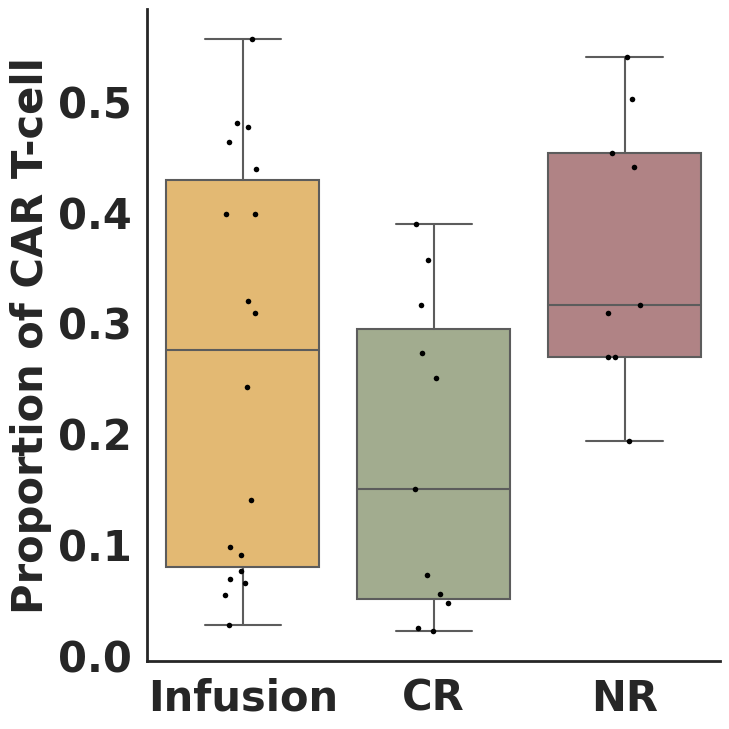

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


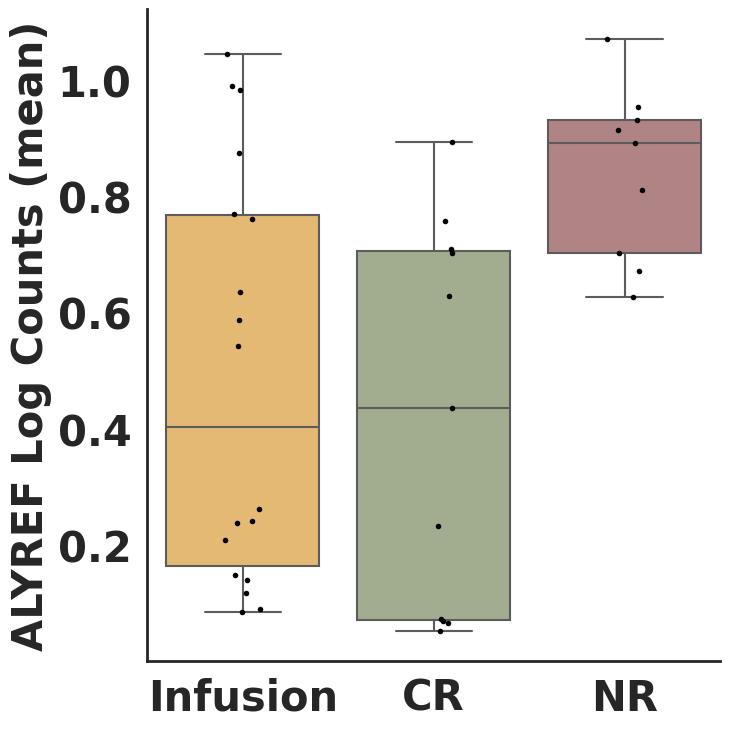

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


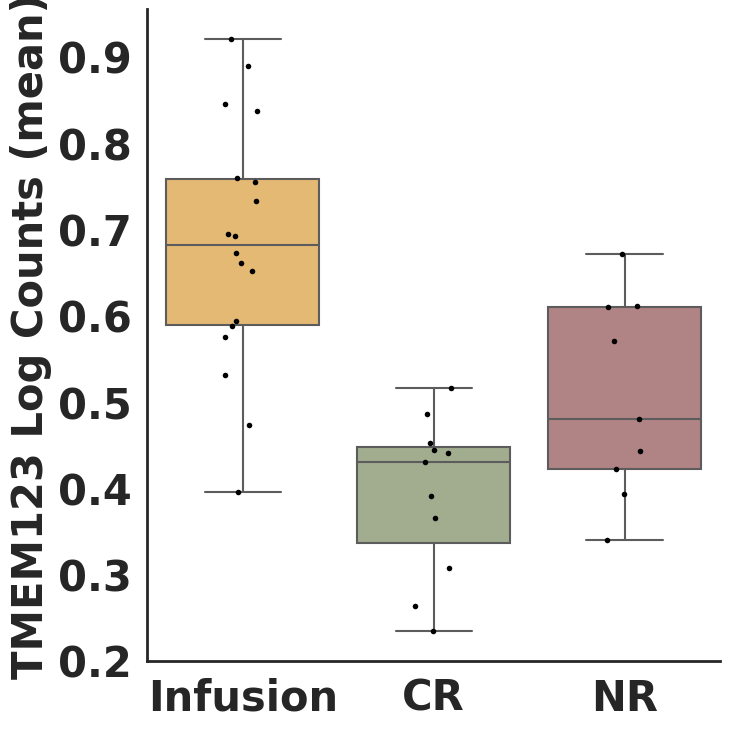

CD81 ALYREF


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


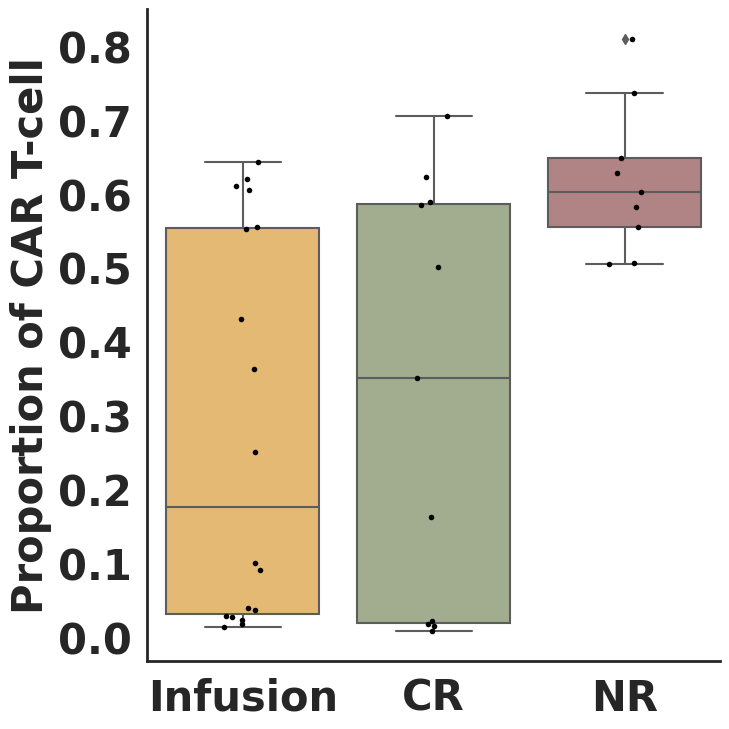

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


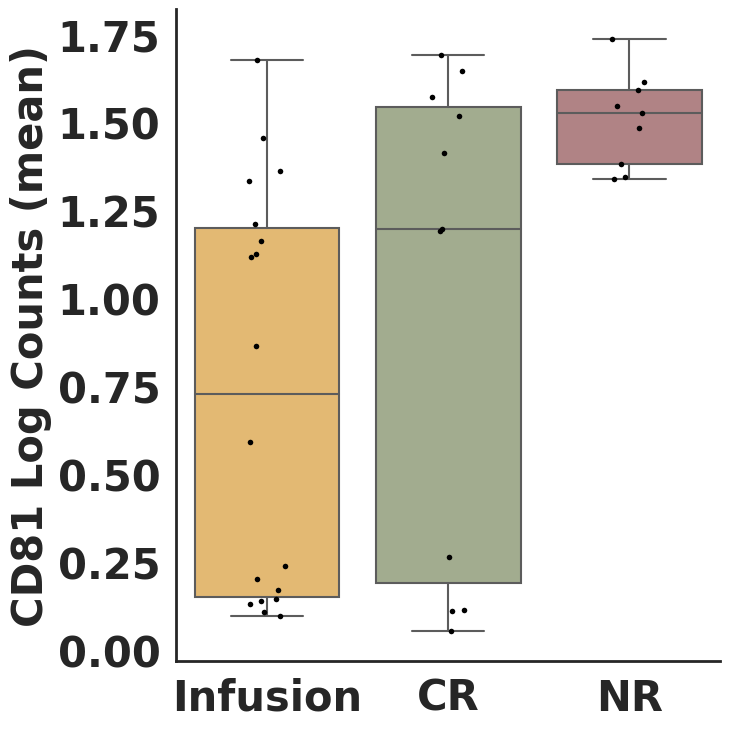

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


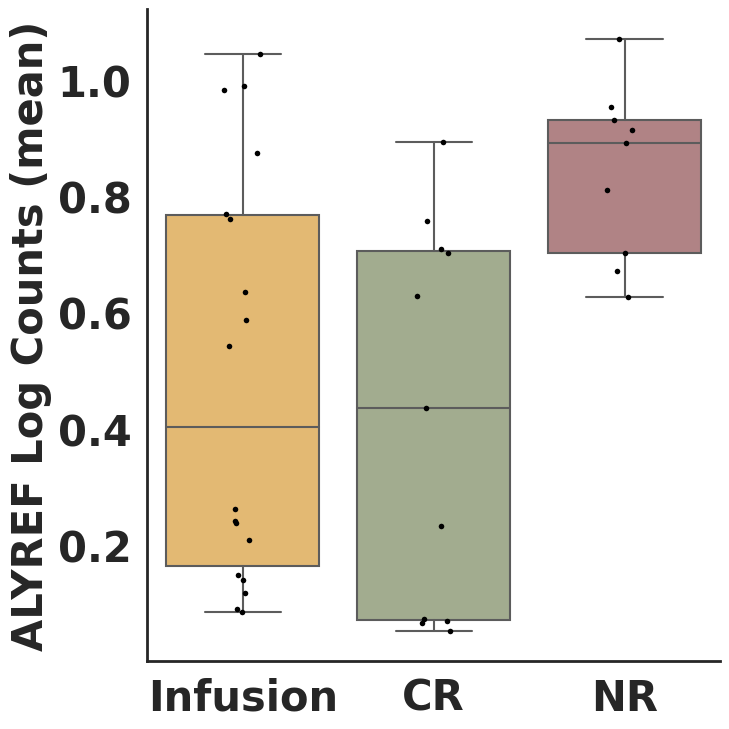

ALYREF DENND5A


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


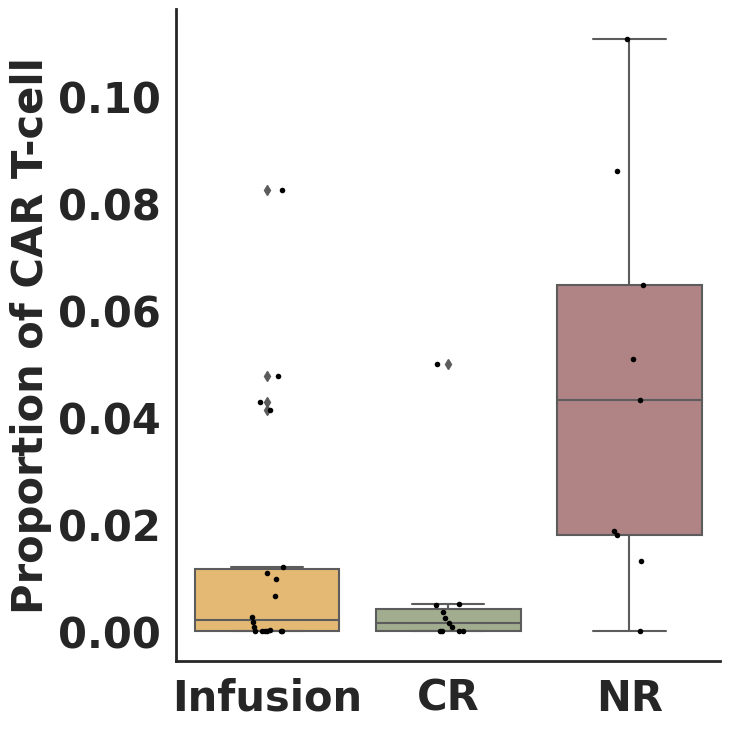

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


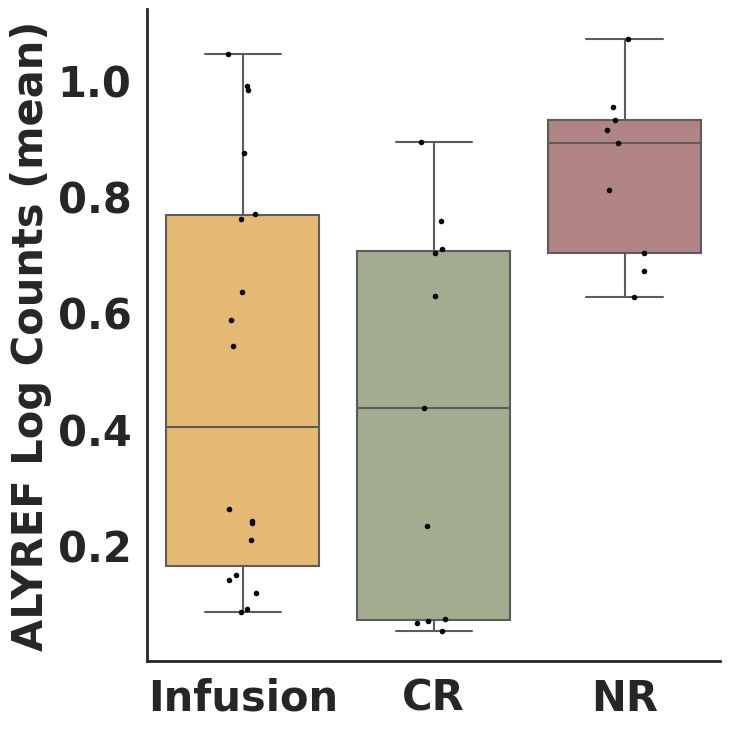

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


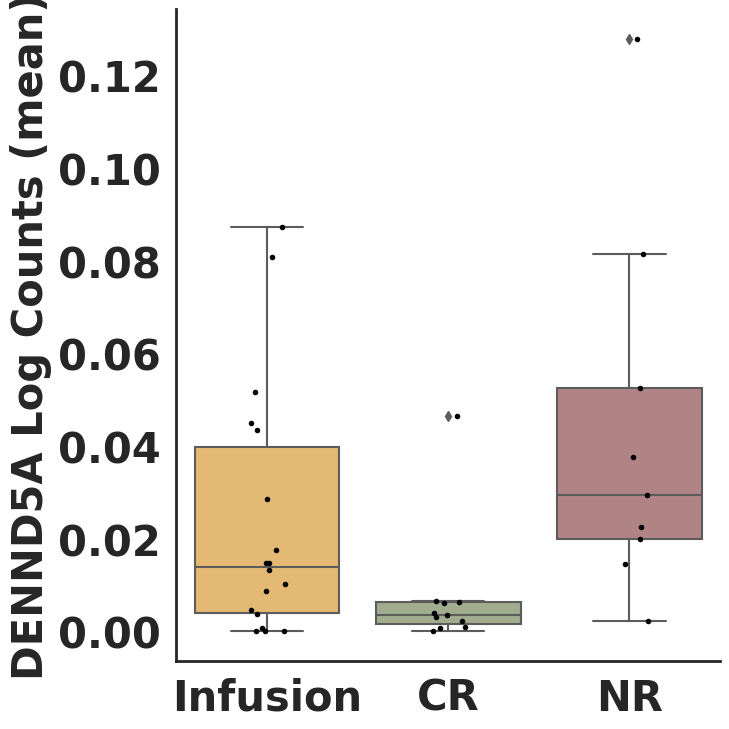

DENND5A PECAM1


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


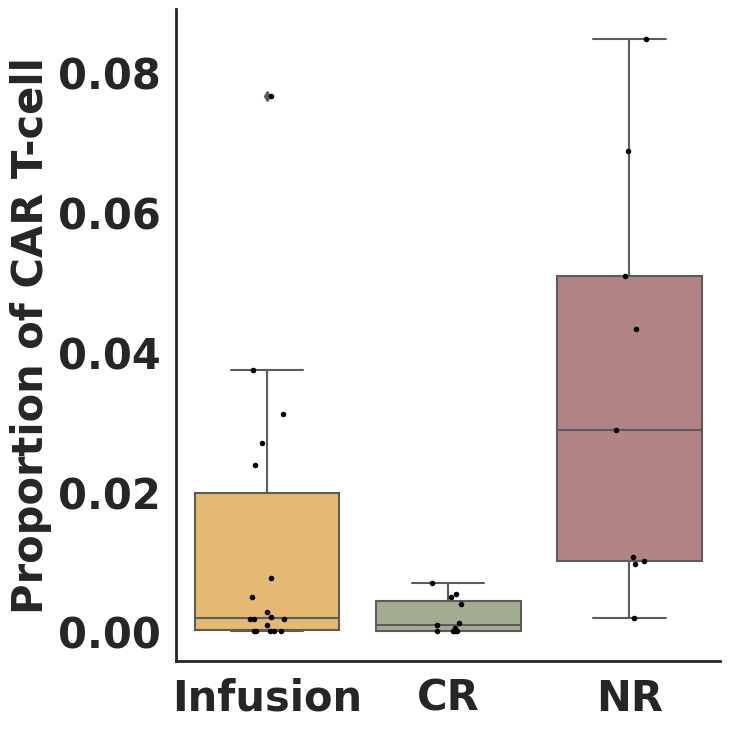

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


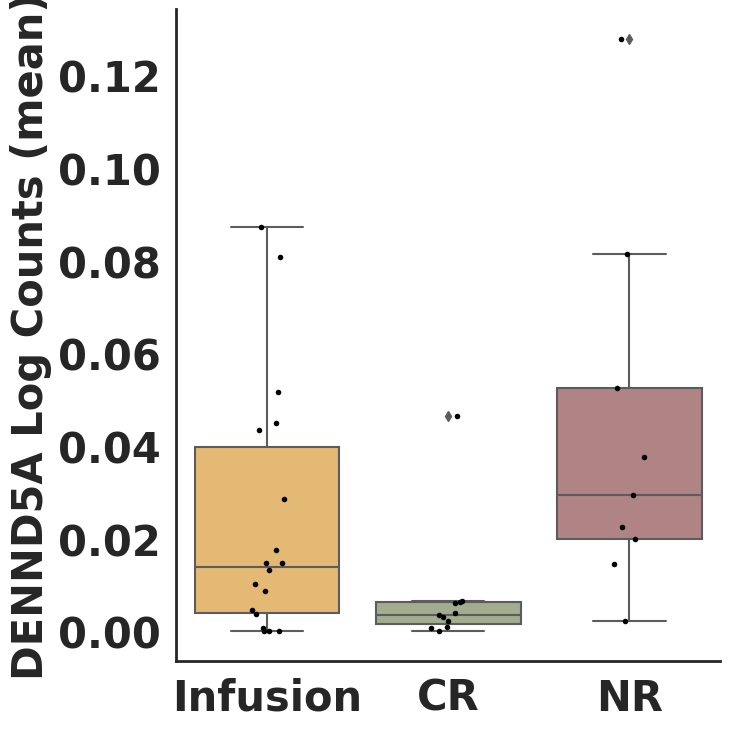

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


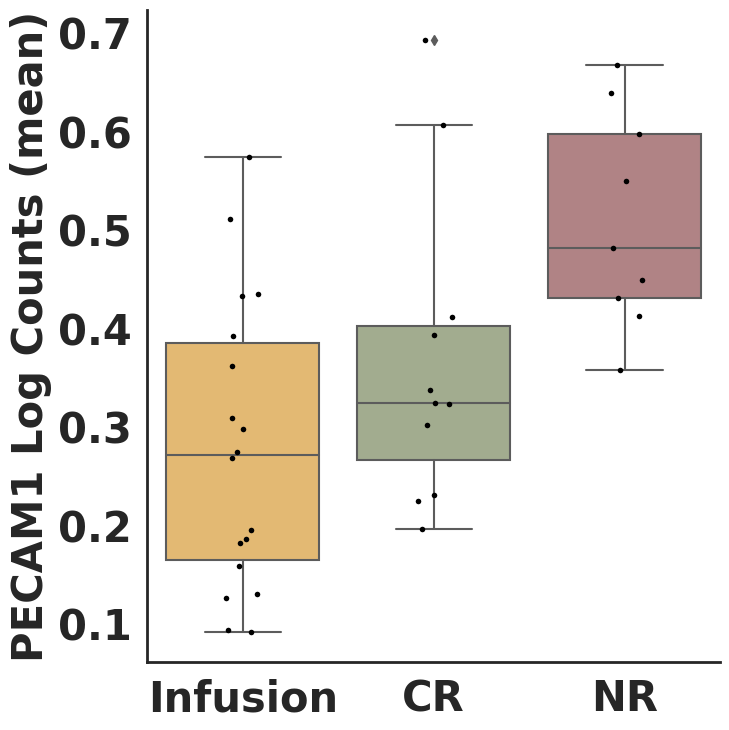

DENND5A TSC22D3


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


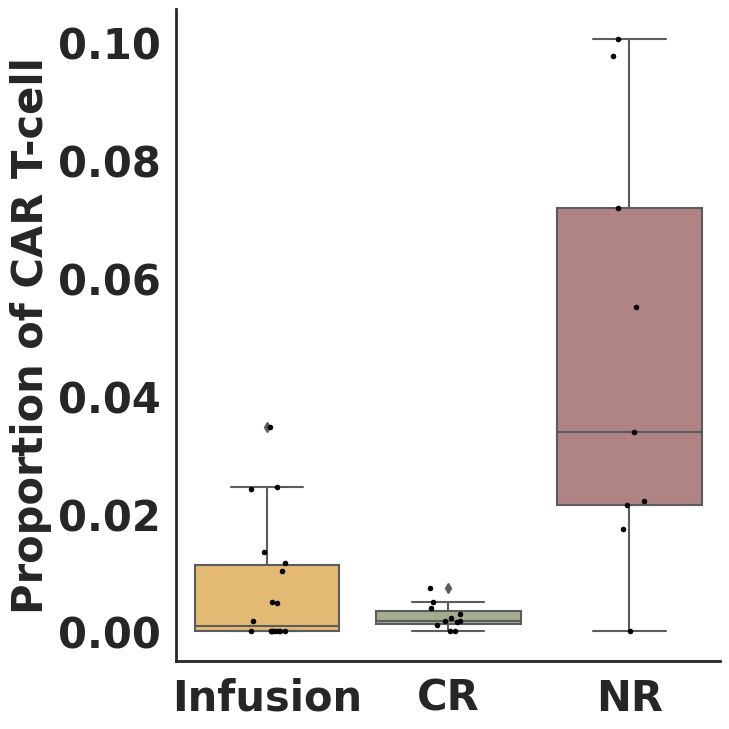

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


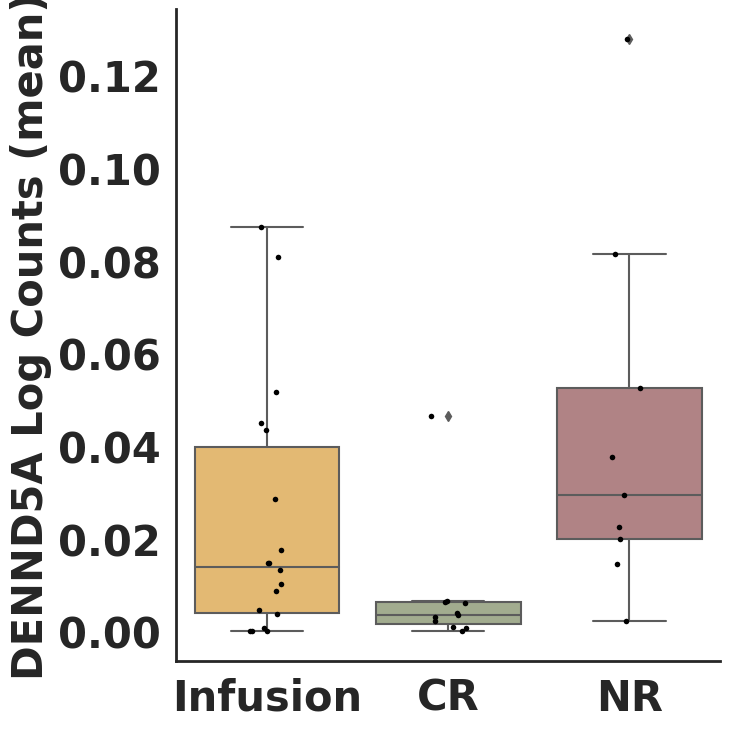

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


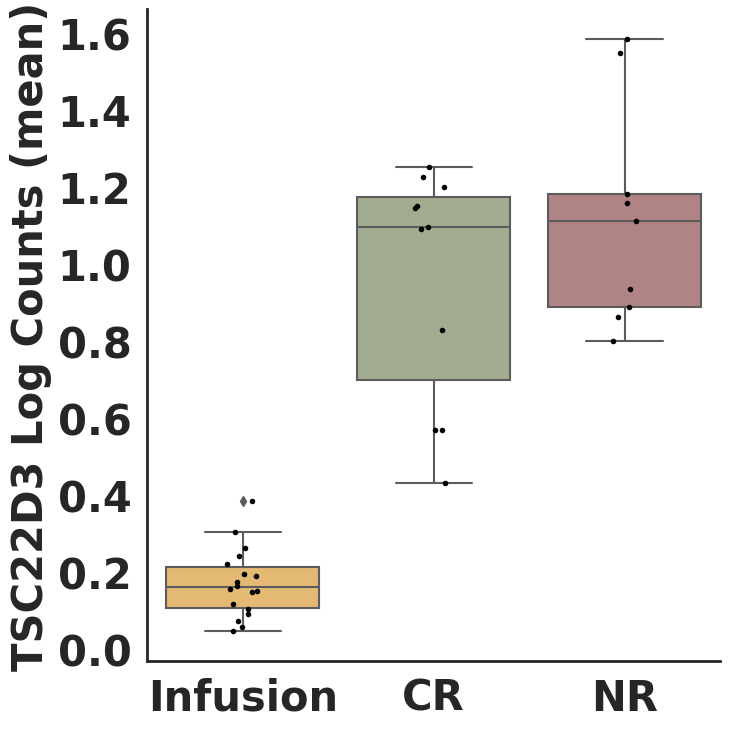

CD81 PECAM1


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


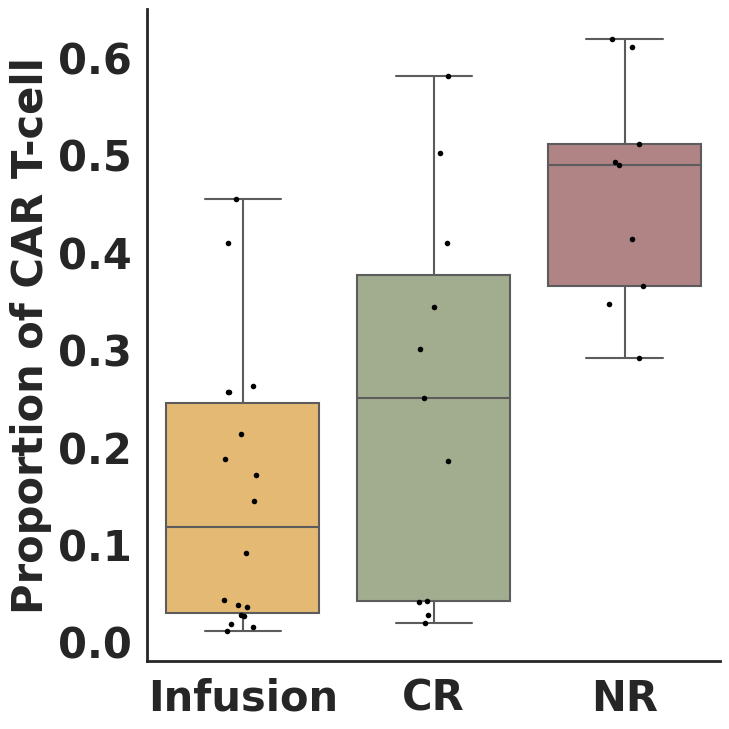

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


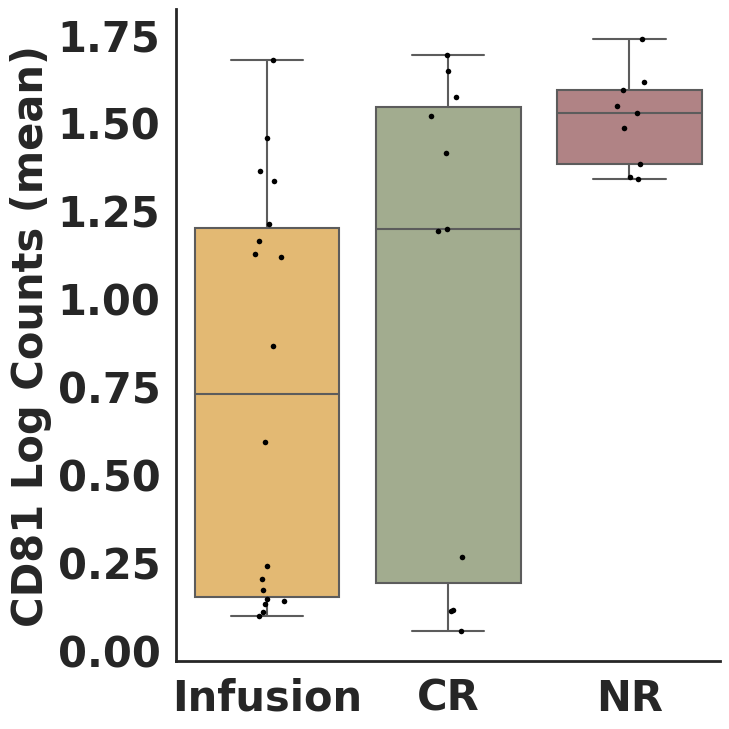

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


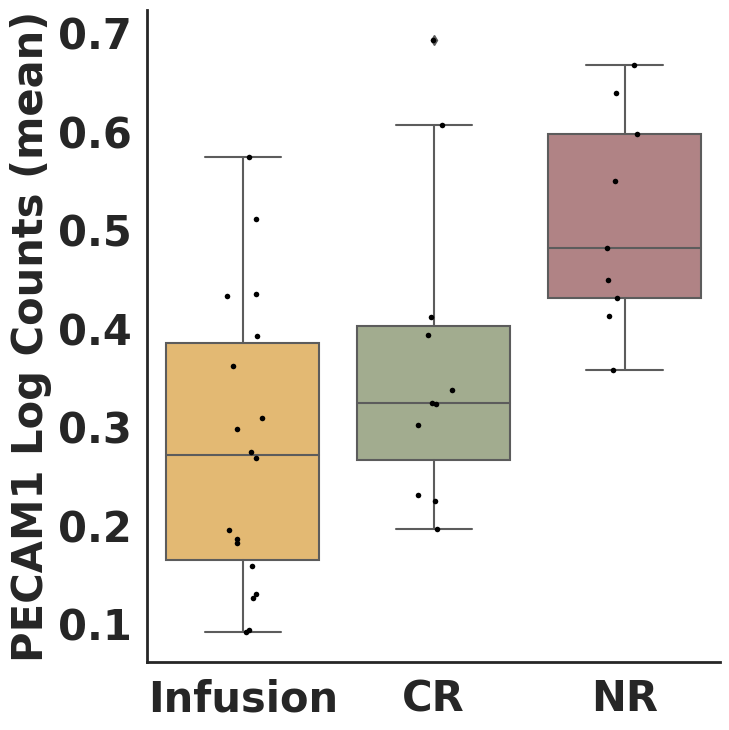

CD81 DENND5A


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


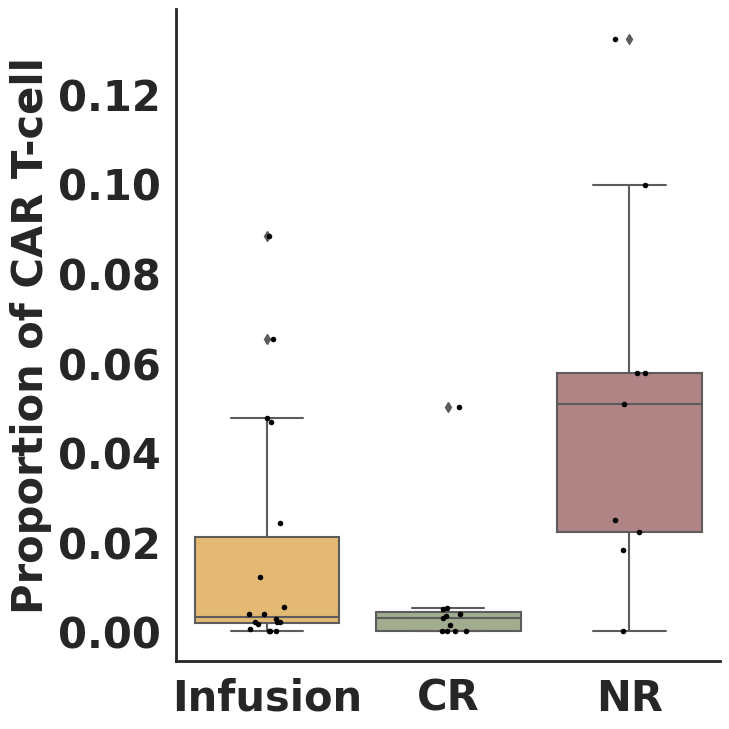

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


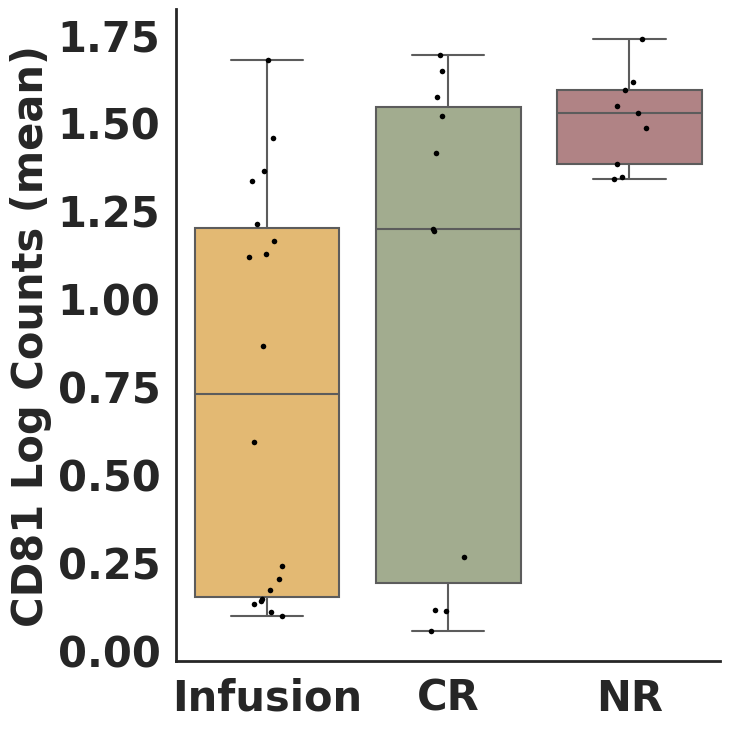

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


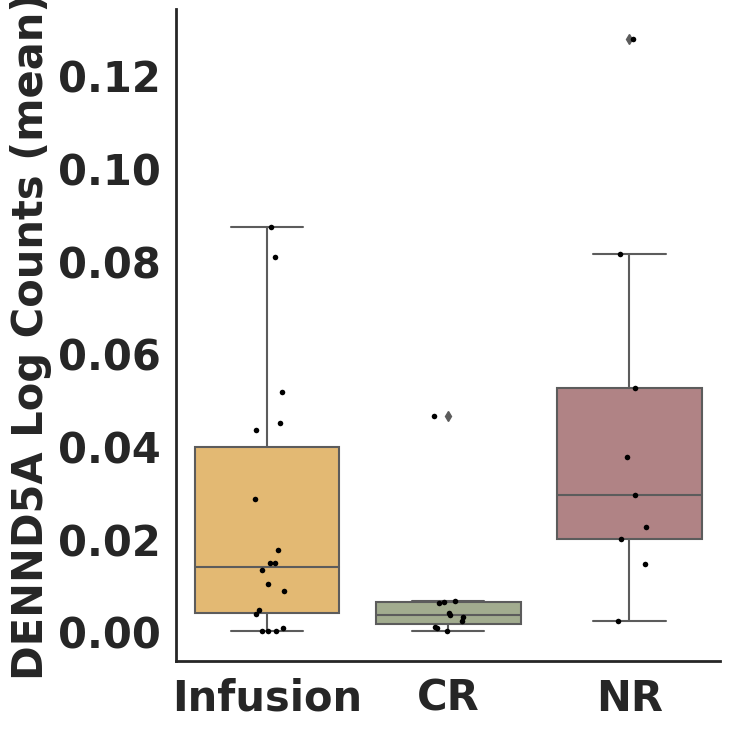

DENND5A TMEM123


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


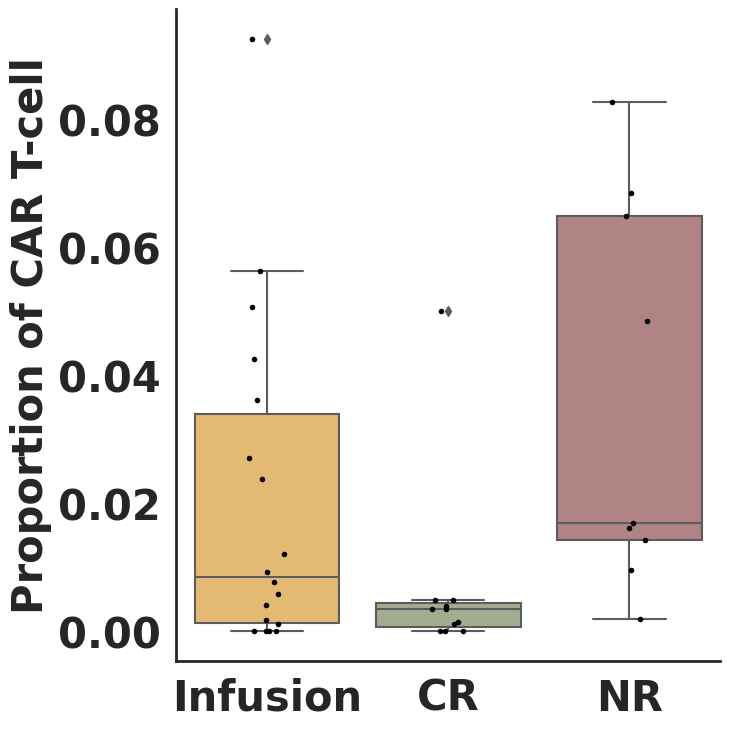

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


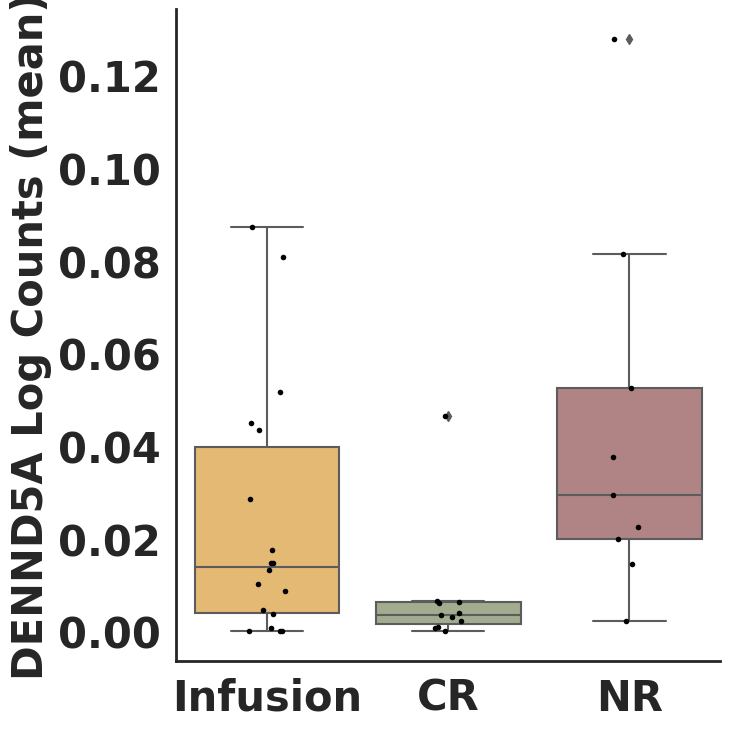

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


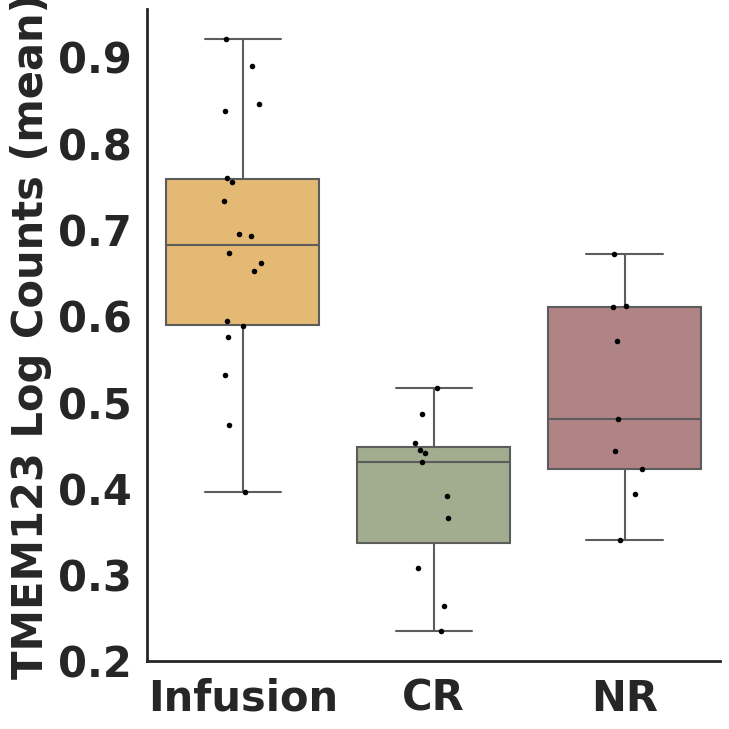

In [9]:
#chosen
import scanpy as sc
import numpy as np
import pandas as pd
from scipy.sparse import issparse
from sklearn.preprocessing import LabelEncoder
from scipy.stats import zscore
import matplotlib.pyplot as plt
import seaborn as sns

# Load your dataset
adata = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD4_CD8A_highly_variable_log.h5ad')
adata_CD8 = adata[adata.obs['cell_type'] == 'CD8'].copy()

# Encode the 'response' labels
le = LabelEncoder()
adata_CD8.obs['Response_Encoded'] = le.fit_transform(adata_CD8.obs['response'])

# Add a suffix to the patient IDs to make them unique
adata_CD8.obs['Unique_ID'] = adata_CD8.obs['barcode'].astype(str) + '-' + adata_CD8.obs['timepoint'].astype(str)

# Define gene pairs
gene_pairs = [
    # ("GZMK", "PECAM1"),
    # ("PECAM1", "RPL17"),
    # ("GZMK", "ALYREF"),
    # ("ALYREF", "RPL17"),
    ("ALYREF", "TMEM123"),
    ("CD81", "ALYREF"),
    ("ALYREF", "DENND5A"),
]

    


# Define the color palette
color_palette = ["#F6BD60", "#A3B18A", "#B77B7E"]

# Set global font and line styles for bold
plt.rcParams['font.weight'] = 'bold'
plt.rcParams['font.size'] = '30'
plt.rcParams['axes.linewidth'] = 2
plt.rcParams['axes.labelweight'] = 'bold'
plt.rcParams['xtick.major.width'] = 2
plt.rcParams['ytick.major.width'] = 2

for gene1, gene2 in gene_pairs:
    print(gene1, gene2)
    # Prepare the data for the gene pair
    model_data = []

    responses = adata_CD8.obs['response'].unique()
    for response in responses:
        resp_adata = adata_CD8[adata_CD8.obs['response'] == response]
        patients = resp_adata.obs['Unique_ID'].unique()
        
        # Calculate the proportion of cells expressing both genes for each patient
        for patient in patients:
            patient_data = resp_adata[resp_adata.obs['Unique_ID'] == patient]
            gene1_expr = patient_data[:, gene1].X.toarray().flatten() > 0 if issparse(patient_data.X) else patient_data[:, gene1].X > 0
            gene2_expr = patient_data[:, gene2].X.toarray().flatten() > 0 if issparse(patient_data.X) else patient_data[:, gene2].X > 0
            both_genes_expr = np.logical_and(gene1_expr, gene2_expr)
            proportion = np.sum(both_genes_expr) / patient_data.shape[0]
            gene1_count = np.mean(patient_data[:, gene1].X)  # Sum of log1p-transformed counts
            gene2_count = np.mean(patient_data[:, gene2].X)  # Sum of log1p-transformed counts

            # Append the data for analysis
            model_data.append({
                'Patient': patient,
                'Response_Encoded': response,
                'Proportion_Positive': proportion,
                f'{gene1}_Count': gene1_count,
                f'{gene2}_Count': gene2_count
            })

    # Convert the model_data list to a DataFrame
    model_df = pd.DataFrame(model_data)

    # Normalize the features using zscore
    model_df['Proportion_Positive_Z'] = zscore(model_df['Proportion_Positive'])
    #model_df[f'{gene1}_Count_Z'] = zscore(model_df[f'{gene1}_Count'])
    #model_df[f'{gene2}_Count_Z'] = zscore(model_df[f'{gene2}_Count'])

    # Visualization - Adjusted version to display tick marks
    sns.set_style("white")

    # 1. Proportion of cells expressing both genes across response groups
    plt.figure(figsize=(8, 8))
    sns.boxplot(x='Response_Encoded', y='Proportion_Positive', data=model_df, palette=color_palette)
    sns.stripplot(x='Response_Encoded', y='Proportion_Positive', data=model_df, color='black', size=4, jitter=True)
    plt.xlabel('')  # Ensure the x-axis label is removed
    plt.ylabel('Proportion of CAR T-cell', fontweight='bold')
    plt.tick_params(axis='both', which='both', length=8, width=2, labelsize=20)
    plt.xticks(fontsize=30)
    plt.yticks(fontsize=30)
    sns.despine(top=True, right=True)
    plt.tight_layout()
    plt.show()

    # 2. Gene counts across response groups for gene1
    plt.figure(figsize=(8, 8))
    sns.boxplot(x='Response_Encoded', y=f'{gene1}_Count', data=model_df, palette=color_palette)
    sns.stripplot(x='Response_Encoded', y=f'{gene1}_Count', data=model_df, color='black', size=4, jitter=True)
    plt.xlabel('')
    plt.ylabel(f'{gene1} Log Counts (mean)', fontweight='bold')
    plt.tick_params(axis='both', which='both', length=8, width=2, labelsize=20)
    plt.xticks(fontsize=30)
    plt.yticks(fontsize=30)
    sns.despine(top=True, right=True)
    plt.tight_layout()
    plt.show()

    # 3. Gene counts across response groups for gene2
    plt.figure(figsize=(8, 8))
    sns.boxplot(x='Response_Encoded', y=f'{gene2}_Count', data=model_df, palette=color_palette)
    sns.stripplot(x='Response_Encoded', y=f'{gene2}_Count', data=model_df, color='black', size=4, jitter=True)
    plt.xlabel('')
    plt.ylabel(f'{gene2} Log Counts (mean)', fontweight='bold')
    plt.tick_params(axis='both', which='both', length=8, width=2, labelsize=20)
    plt.xticks(fontsize=30)
    plt.yticks(fontsize=30)
    sns.despine(top=True, right=True)
    plt.tight_layout()
    plt.show()

In [24]:
import scanpy as sc
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.sparse import issparse
from sklearn.preprocessing import LabelEncoder
import scikit_posthocs as sp
from scipy.stats import zscore

# Load your dataset
adata = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD4_CD8A_highly_variable_log.h5ad')
adata_CD8 = adata[adata.obs['cell_type'] == 'CD8'].copy()

# Encode the 'response' labels
le = LabelEncoder()
adata_CD8.obs['Response_Encoded'] = le.fit_transform(adata_CD8.obs['response'])

# Add a suffix to the patient IDs to make them unique
adata_CD8.obs['Unique_ID'] = adata_CD8.obs['barcode'].astype(str) + '-' + adata_CD8.obs['timepoint'].astype(str)

# Define the gene of interest
gene = "PECAM1"

# Print the mapping of the encoded labels
response_mapping = dict(zip(le.classes_, le.transform(le.classes_)))
print("Response Label Mapping (Original Label -> Encoded Value):")
for label, encoded_value in response_mapping.items():
    print(f"{label} -> {encoded_value}")

# Prepare to store results in a single DataFrame
all_results = []

# Prepare a list to store the data for the gene
model_data = []

responses = adata_CD8.obs['Response_Encoded'].unique()
for response in responses:
    resp_adata = adata_CD8[adata_CD8.obs['Response_Encoded'] == response]
    patients = resp_adata.obs['Unique_ID'].unique()
    
    # Calculate the proportion of cells expressing the gene for each patient
    for patient in patients:
        patient_data = resp_adata[resp_adata.obs['Unique_ID'] == patient]
        
        # Ensure the data is dense if needed
        gene_expr = patient_data[:, gene].X.toarray().flatten() > 0 if issparse(patient_data.X) else patient_data[:, gene].X > 0
        proportion = np.sum(gene_expr) / patient_data.shape[0]
        gene_count = np.mean(patient_data[:, gene].X)

        # Append the data for analysis
        model_data.append({
            'Patient': patient,
            'Response_Encoded': response,
            'Proportion_Positive': proportion,
            f'{gene}_Count': gene_count
        })

# Convert the model_data list to a DataFrame
model_df = pd.DataFrame(model_data)

# Normalize the variables using Z-scores
model_df['Proportion_Positive_Z'] = zscore(model_df['Proportion_Positive'])
model_df[f'{gene}_Count_Z'] = zscore(model_df[f'{gene}_Count'])

# Perform Dunn's Post-Hoc Test for each pairwise comparison and collect results
for variable in ['Proportion_Positive_Z', f'{gene}_Count_Z']:
    dunn_results = sp.posthoc_dunn(
        model_df,
        val_col=variable,
        group_col='Response_Encoded',
        p_adjust='bonferroni'
    )
    all_results.append({
        'Gene': gene,
        'Variable': variable,
        'CR vs NR': dunn_results.loc[response_mapping['CR'], response_mapping['NR']],
        'Infusion vs CR': dunn_results.loc[response_mapping['Infusion'], response_mapping['CR']],
        'Infusion vs NR': dunn_results.loc[response_mapping['Infusion'], response_mapping['NR']]
    })

# Convert the collected results to a single DataFrame
results_df = pd.DataFrame(all_results)

# Save the combined results to a single CSV file
results_df.to_csv('/home/emma/result/CART/CD8_gene_dunn_results_Pecam1.csv', index=False)

print("Analysis complete. Results exported to '/home/emma/result/CART/CD8_gene_dunn_results_adjusted.csv'.")


Response Label Mapping (Original Label -> Encoded Value):
CR -> 0
Infusion -> 1
NR -> 2
Analysis complete. Results exported to '/home/emma/result/CART/CD8_gene_dunn_results_adjusted.csv'.


In [32]:
import scanpy as sc
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.sparse import issparse
from sklearn.preprocessing import LabelEncoder
import scikit_posthocs as sp
import itertools

# Load your dataset
adata = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD4_CD8A_highly_variable_log.h5ad')
adata_CD8 = adata[adata.obs['cell_type'] == 'CD8'].copy()

# Encode the 'response' labels
le = LabelEncoder()
adata_CD8.obs['Response_Encoded'] = le.fit_transform(adata_CD8.obs['response'])

# Print the mapping of the encoded labels
response_mapping = dict(zip(le.classes_, le.transform(le.classes_)))
print("Response Label Mapping (Original Label -> Encoded Value):")
for label, encoded_value in response_mapping.items():
    print(f"{label} -> {encoded_value}")
# Add a suffix to the patient IDs to make them unique
adata_CD8.obs['Unique_ID'] = adata_CD8.obs['barcode'].astype(str) + '-' + adata_CD8.obs['timepoint'].astype(str)

# Define gene pairs
gene_pairs = [
    ("GZMK", "PECAM1"),
    ("PECAM1", "RPL17"),
    ("GZMK", "ALYREF"),
    ("ALYREF", "RPL17"),
]

# Prepare to store results in a single DataFrame
all_results = []

# Iterate over all pairs of genes
for gene1, gene2 in gene_pairs:
    # Prepare a list to store the data for each gene pair
    model_data = []

    responses = adata_CD8.obs['Response_Encoded'].unique()
    for response in responses:
        resp_adata = adata_CD8[adata_CD8.obs['Response_Encoded'] == response]
        patients = resp_adata.obs['Unique_ID'].unique()
        
        # Calculate the proportion of cells expressing both genes for each patient
        for patient in patients:
            patient_data = resp_adata[resp_adata.obs['Unique_ID'] == patient]
            
            # Ensure the data is dense if needed
            gene1_expr = patient_data[:, gene1].X.toarray().flatten() > 0 if issparse(patient_data.X) else patient_data[:, gene1].X > 0
            gene2_expr = patient_data[:, gene2].X.toarray().flatten() > 0 if issparse(patient_data.X) else patient_data[:, gene2].X > 0
            both_genes_expr = np.logical_and(gene1_expr, gene2_expr)
            proportion = np.sum(both_genes_expr) / patient_data.shape[0]
            gene1_count = np.mean(patient_data[:, gene1].X)
            gene2_count = np.mean(patient_data[:, gene2].X)

            # Append the data for analysis
            model_data.append({
                'Patient': patient,
                'Response_Encoded': response,
                'Proportion_Positive': proportion,
                f'{gene1}_Count': gene1_count,
                f'{gene2}_Count': gene2_count
            })

    # Convert the model_data list to a DataFrame
    model_df = pd.DataFrame(model_data)

    # Normalize the variables using Z-scores
    model_df['Proportion_Positive_Z'] = zscore(model_df['Proportion_Positive'])
    model_df[f'{gene1}_Count_Z'] = zscore(model_df[f'{gene1}_Count'])
    model_df[f'{gene2}_Count_Z'] = zscore(model_df[f'{gene2}_Count'])

    # Perform Dunn's Post-Hoc Test for each pairwise comparison and collect results
    for variable in ['Proportion_Positive_Z', f'{gene1}_Count_Z', f'{gene2}_Count_Z']:
        dunn_results = sp.posthoc_dunn(
            model_df,
            val_col=variable,
            group_col='Response_Encoded',
            p_adjust='bonferroni'
        )
        all_results.append({
            'Gene_Pair': f'{gene1} & {gene2}',
            'Variable': variable,
            'CR vs NR': dunn_results.loc[response_mapping['CR'], response_mapping['NR']],
            'Infusion vs CR': dunn_results.loc[response_mapping['Infusion'], response_mapping['CR']],
            'Infusion vs NR': dunn_results.loc[response_mapping['Infusion'], response_mapping['NR']]
        })

# Convert the collected results to a single DataFrame
results_df = pd.DataFrame(all_results)

# Save the combined results to a single CSV file
results_df.to_csv('/home/emma/result/CART/CD8_gene_pairs_dunn_results_adjusted.csv', index=False)

print("Analysis complete. Results exported to '/home/emma/result/CART/CD8_gene_pairs_dunn_results_adjusted.csv'.")

Response Label Mapping (Original Label -> Encoded Value):
CR -> 0
Infusion -> 1
NR -> 2
Analysis complete. Results exported to '/home/emma/result/CART/CD8_gene_pairs_dunn_results_adjusted.csv'.


PECAM1 HOPX


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


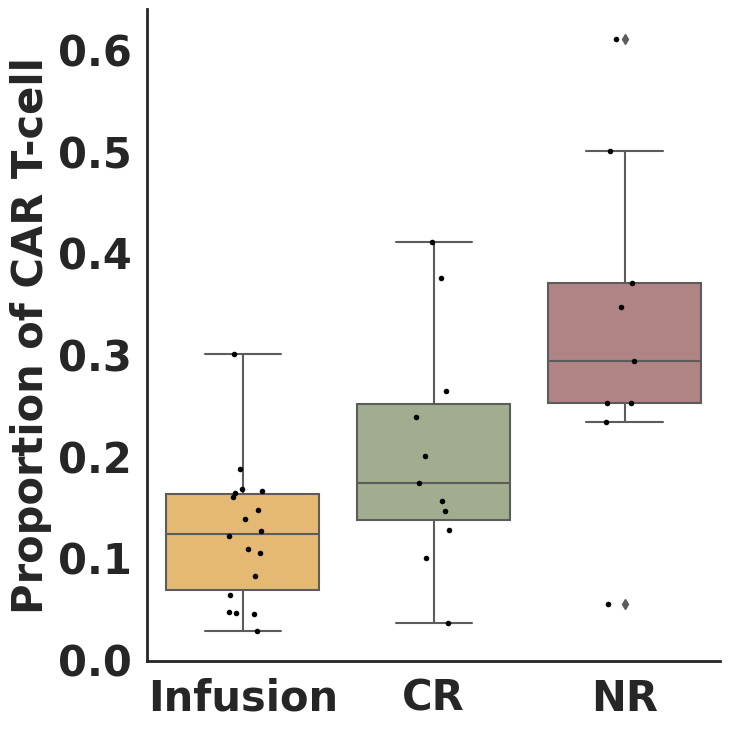

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


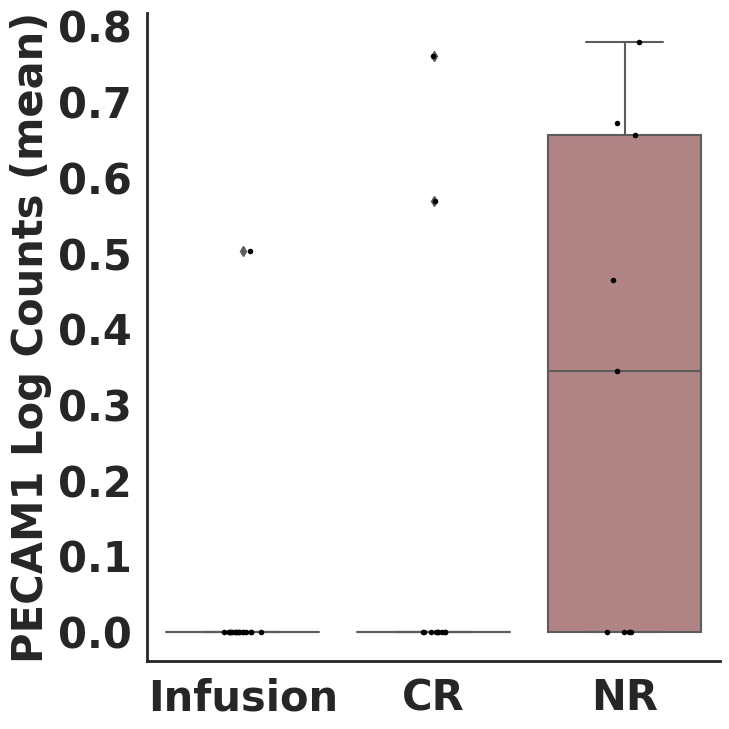

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


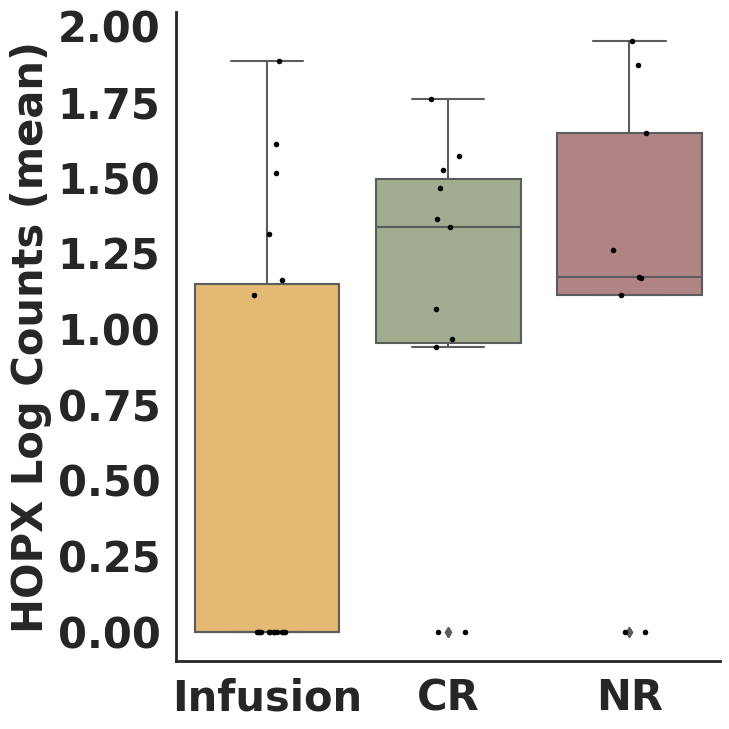

GZMK PECAM1


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


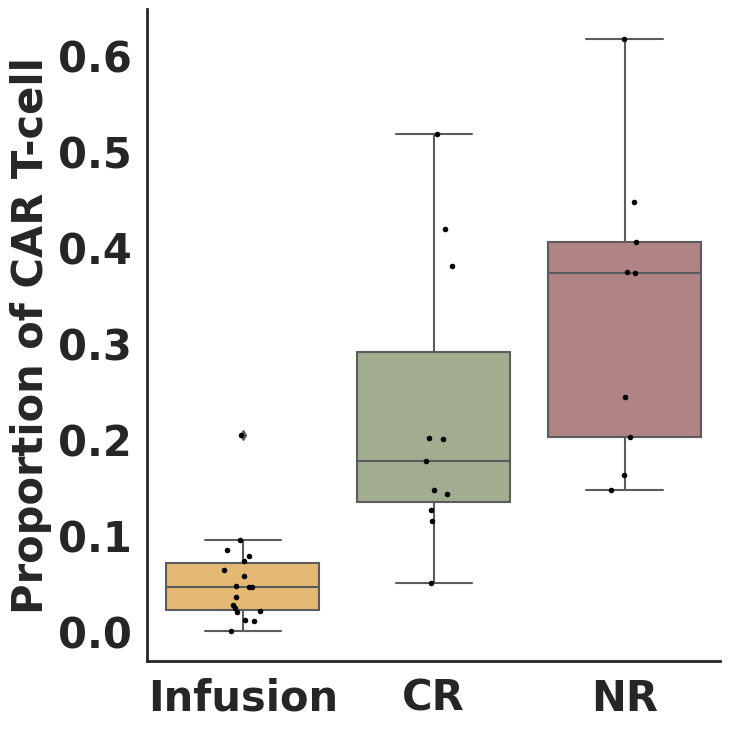

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


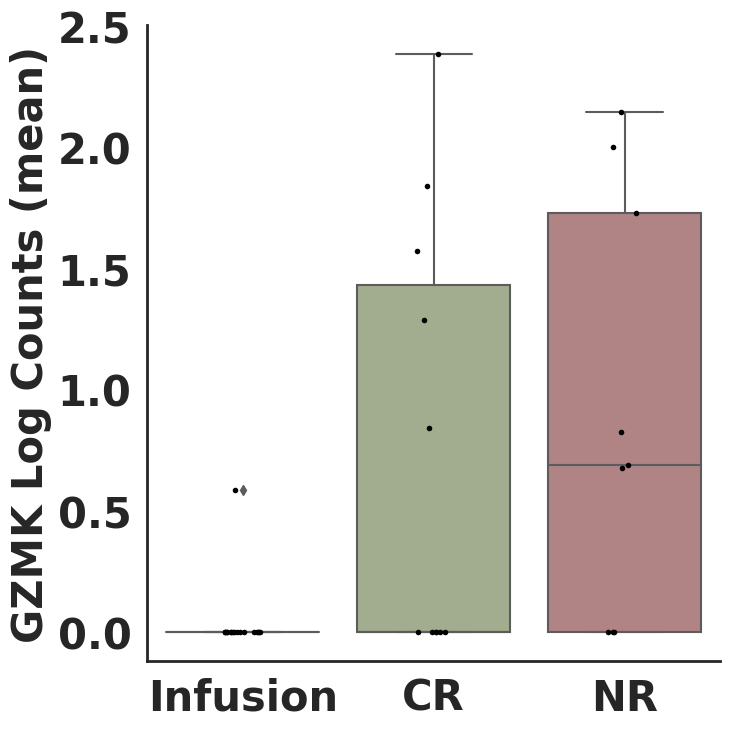

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


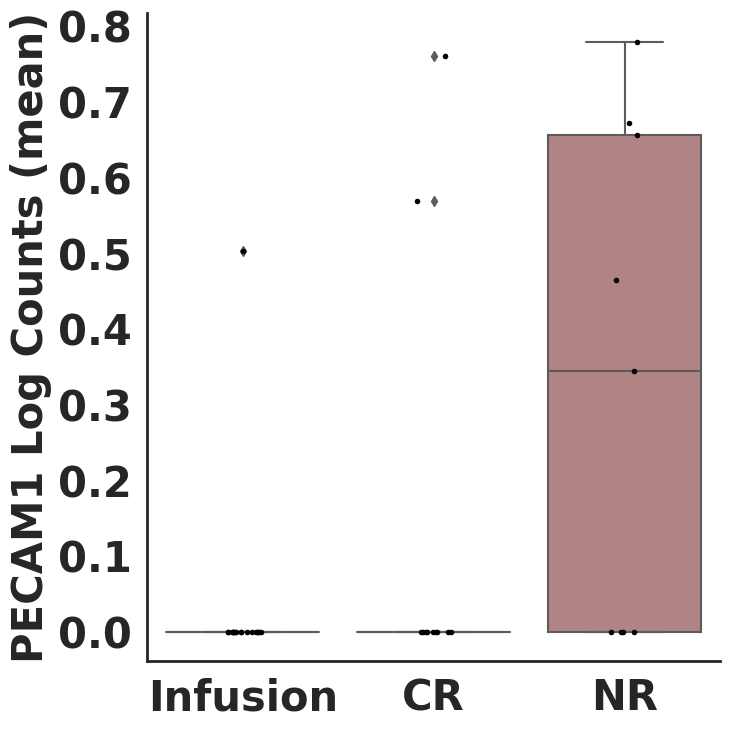

PECAM1 RPL17


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


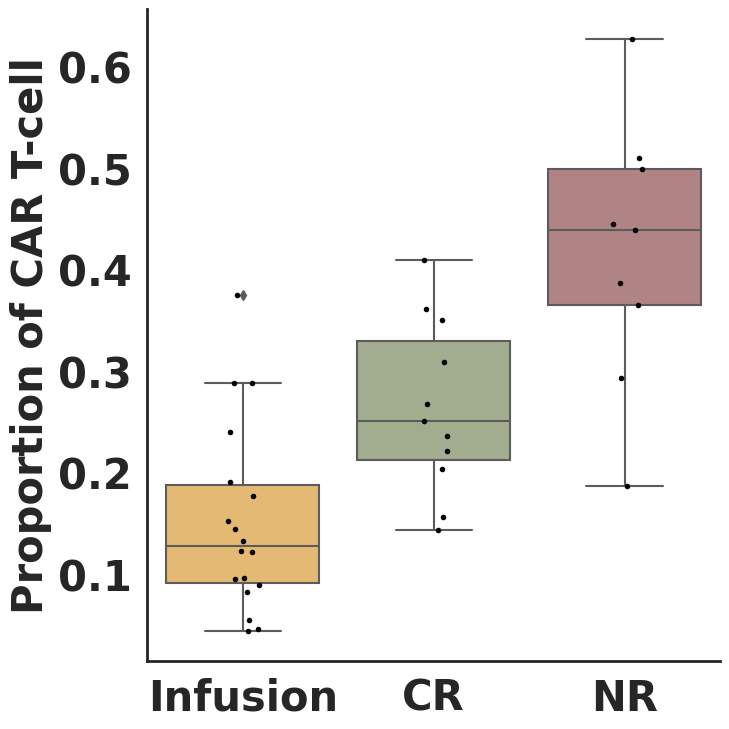

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


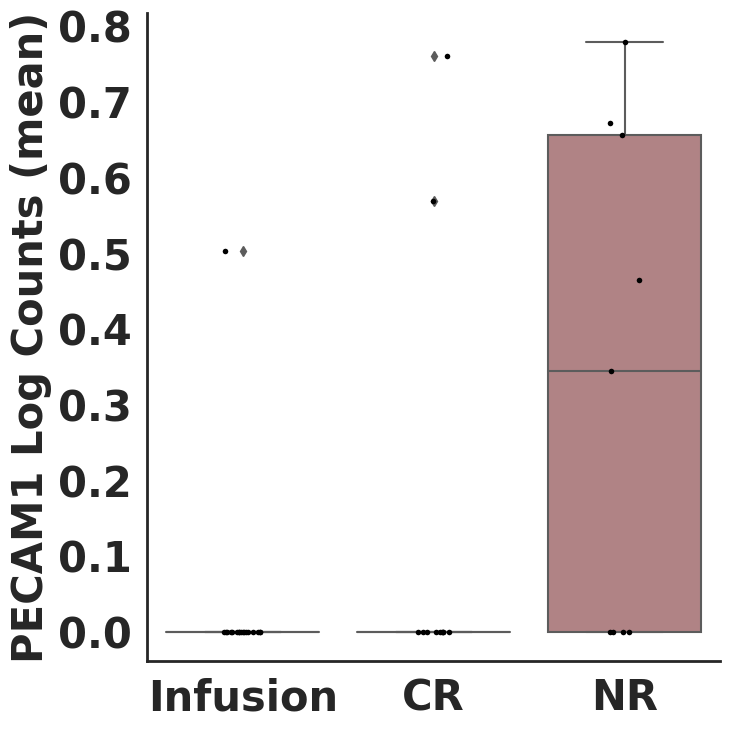

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


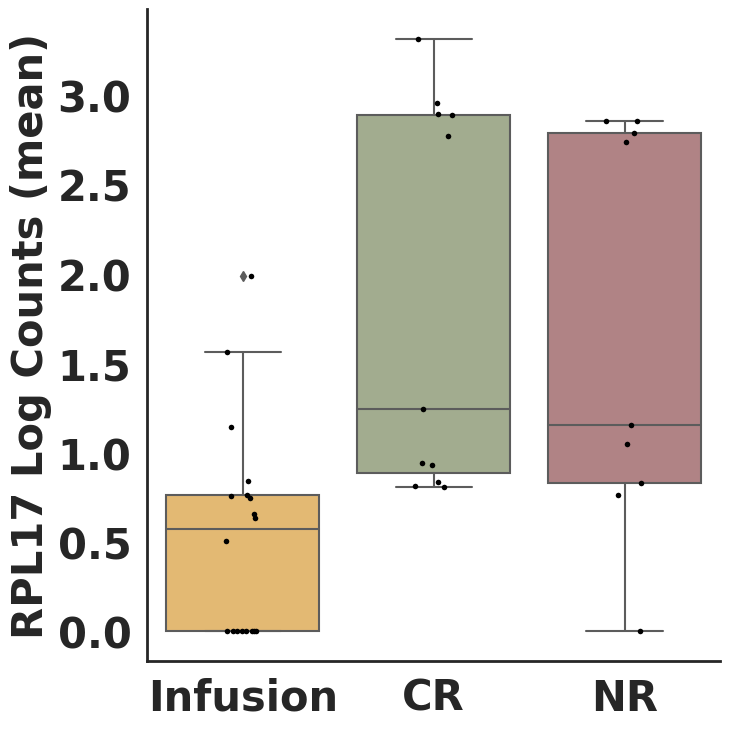

GZMK ALYREF


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


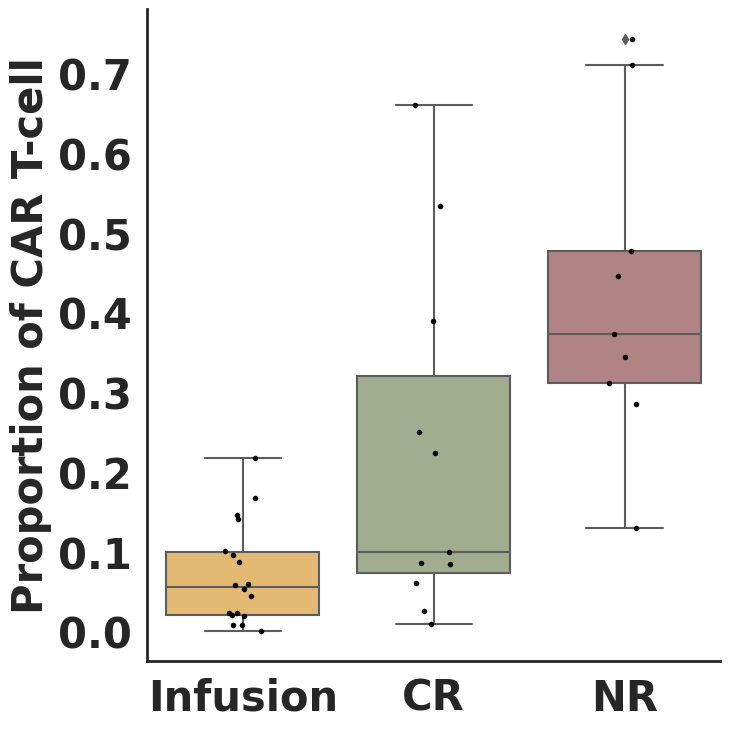

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


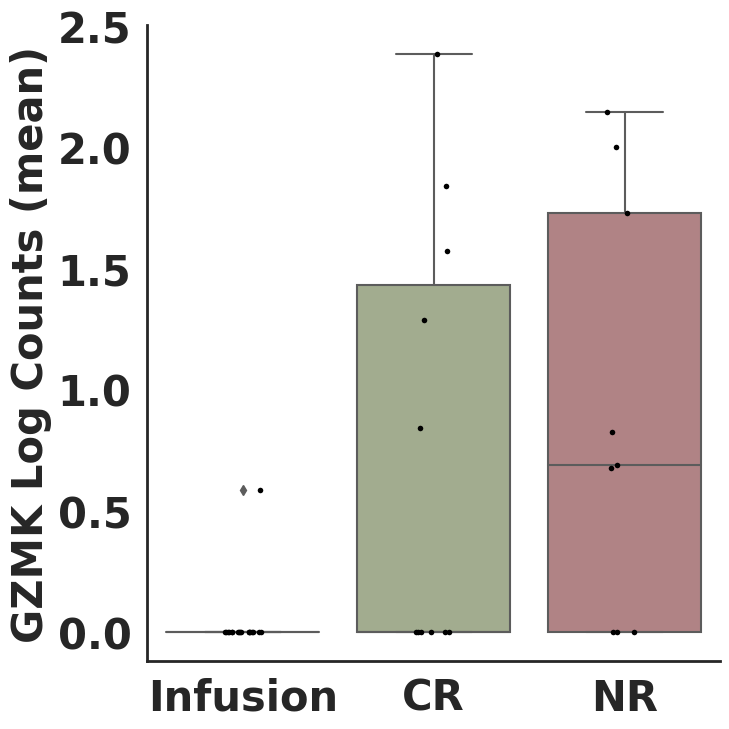

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


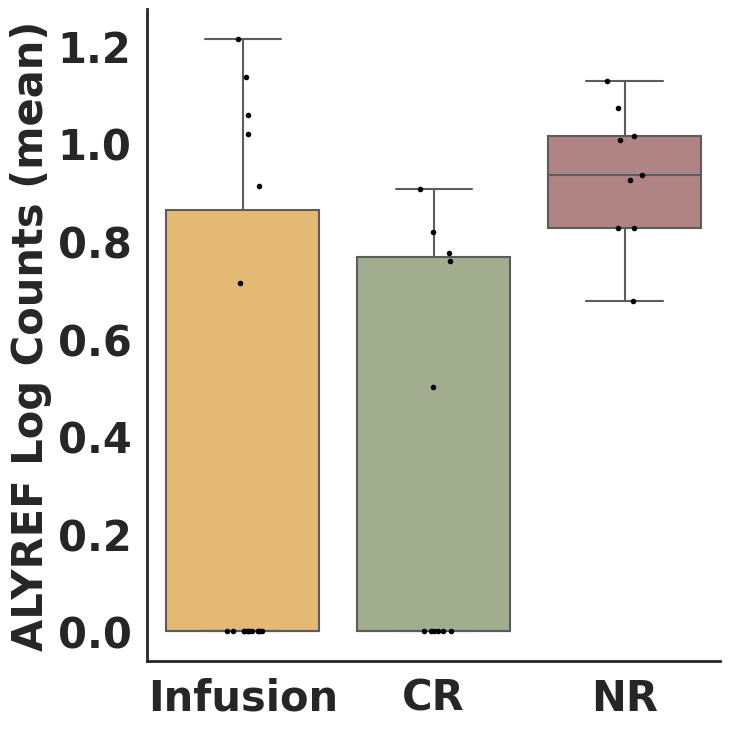

ALYREF RPL17


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


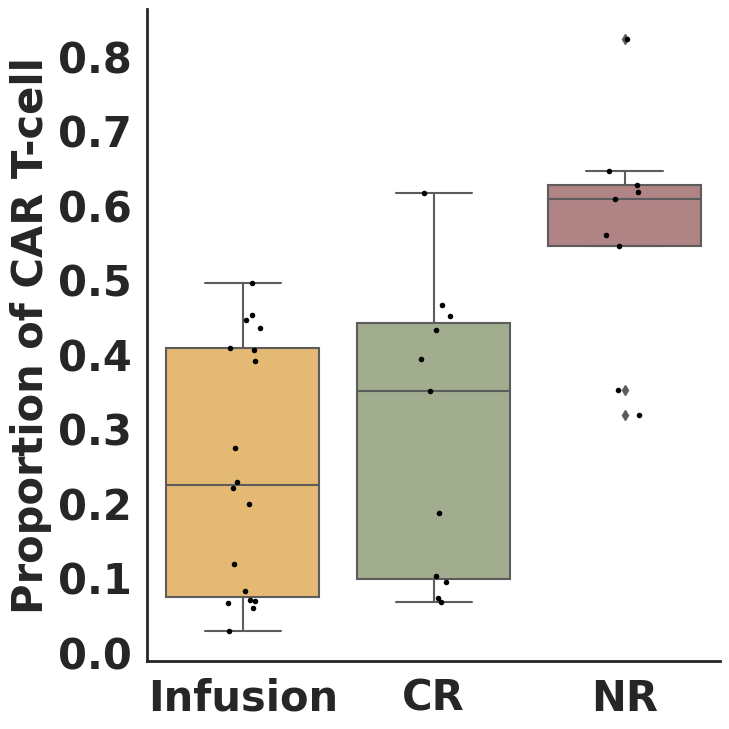

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


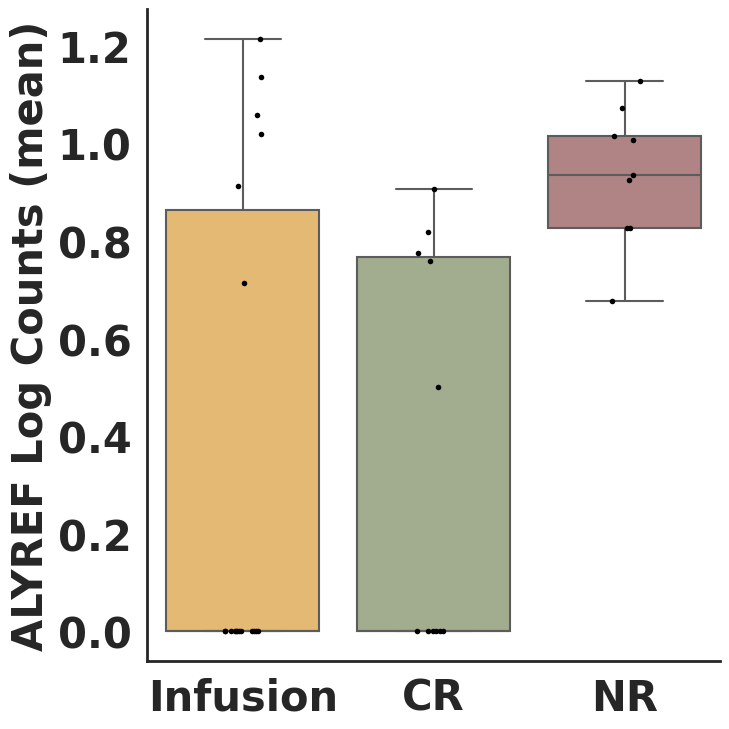

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


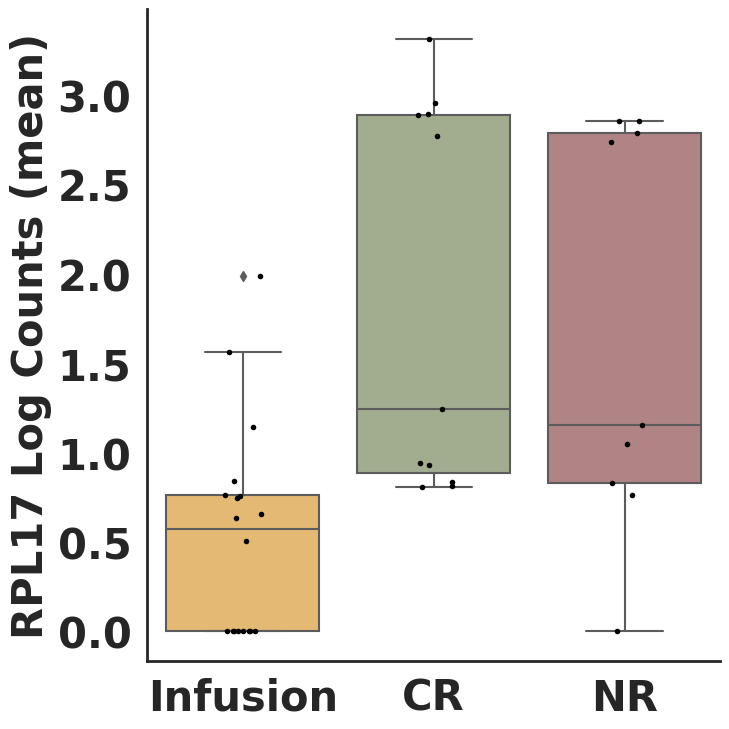

In [12]:
import scanpy as sc
import numpy as np
import pandas as pd
from scipy.sparse import issparse
from sklearn.preprocessing import LabelEncoder
from scipy.stats import zscore
import matplotlib.pyplot as plt
import seaborn as sns

# Load your dataset
adata = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD4_CD8A_highly_variable_log.h5ad')
adata_CD8 = adata[adata.obs['cell_type'] == 'CD8'].copy()

# Encode the 'response' labels
le = LabelEncoder()
adata_CD8.obs['Response_Encoded'] = le.fit_transform(adata_CD8.obs['response'])

# Add a suffix to the patient IDs to make them unique
adata_CD8.obs['Unique_ID'] = adata_CD8.obs['barcode'].astype(str) + '-' + adata_CD8.obs['timepoint'].astype(str)

# Define gene pairs
gene_pairs = [
    ("PECAM1", "HOPX"),
    ("GZMK", "PECAM1"),
    ("PECAM1", "RPL17"),
    ("GZMK", "ALYREF"),
    ("ALYREF", "RPL17"),
]

# Define the color palette
color_palette = ["#F6BD60", "#A3B18A", "#B77B7E"]

# Set global font and line styles for bold
plt.rcParams['font.weight'] = 'bold'
plt.rcParams['font.size'] = '30'
plt.rcParams['axes.linewidth'] = 2
plt.rcParams['axes.labelweight'] = 'bold'
plt.rcParams['xtick.major.width'] = 2
plt.rcParams['ytick.major.width'] = 2

for gene1, gene2 in gene_pairs:
    print(gene1, gene2)
    # Prepare the data for the gene pair
    model_data = []

    responses = adata_CD8.obs['response'].unique()
    for response in responses:
        resp_adata = adata_CD8[adata_CD8.obs['response'] == response]
        patients = resp_adata.obs['Unique_ID'].unique()
        
        # Calculate the proportion of cells expressing both genes for each patient
        for patient in patients:
            patient_data = resp_adata[resp_adata.obs['Unique_ID'] == patient]
            gene1_expr = patient_data[:, gene1].X.toarray().flatten() > 0 if issparse(patient_data.X) else patient_data[:, gene1].X > 0
            gene2_expr = patient_data[:, gene2].X.toarray().flatten() > 0 if issparse(patient_data.X) else patient_data[:, gene2].X > 0
            both_genes_expr = np.logical_and(gene1_expr, gene2_expr)
            proportion = np.sum(both_genes_expr) / patient_data.shape[0]
            gene1_count = np.sum(patient_data[:, gene1].X.toarray())  # Sum of log1p-transformed counts
            gene2_count = np.sum(patient_data[:, gene2].X.toarray())  # Sum of log1p-transformed counts

            # Append the data for analysis
            model_data.append({
                'Patient': patient,
                'Response_Encoded': response,
                'Proportion_Positive': proportion,
                f'{gene1}_Count': gene1_count,
                f'{gene2}_Count': gene2_count
            })

    # Convert the model_data list to a DataFrame
    model_df = pd.DataFrame(model_data)

    # Normalize the features using zscore
    model_df['Proportion_Positive_Z'] = zscore(model_df['Proportion_Positive'])
    model_df[f'{gene1}_Count_Z'] = zscore(model_df[f'{gene1}_Count'])
    model_df[f'{gene2}_Count_Z'] = zscore(model_df[f'{gene2}_Count'])

    # Visualization - Adjusted version to display tick marks
    sns.set_style("white")

    # 1. Proportion of cells expressing both genes across response groups
    plt.figure(figsize=(8, 8))
    sns.boxplot(x='Response_Encoded', y='Proportion_Positive', data=model_df, palette=color_palette)
    sns.stripplot(x='Response_Encoded', y='Proportion_Positive', data=model_df, color='black', size=4, jitter=True)
    plt.xlabel('')  # Ensure the x-axis label is removed
    plt.ylabel('Proportion of CAR T-cell', fontweight='bold')
    plt.tick_params(axis='both', which='both', length=8, width=2, labelsize=20)
    plt.xticks(fontsize=30)
    plt.yticks(fontsize=30)
    sns.despine(top=True, right=True)
    plt.tight_layout()
    plt.show()

    # 2. Gene counts across response groups for gene1
    plt.figure(figsize=(8, 8))
    sns.boxplot(x='Response_Encoded', y=f'{gene1}_Count', data=model_df, palette=color_palette)
    sns.stripplot(x='Response_Encoded', y=f'{gene1}_Count', data=model_df, color='black', size=4, jitter=True)
    plt.xlabel('')
    plt.ylabel(f'{gene1} Log Counts (mean)', fontweight='bold')
    plt.tick_params(axis='both', which='both', length=8, width=2, labelsize=20)
    plt.xticks(fontsize=30)
    plt.yticks(fontsize=30)
    sns.despine(top=True, right=True)
    plt.tight_layout()
    plt.show()

    # 3. Gene counts across response groups for gene2
    plt.figure(figsize=(8, 8))
    sns.boxplot(x='Response_Encoded', y=f'{gene2}_Count', data=model_df, palette=color_palette)
    sns.stripplot(x='Response_Encoded', y=f'{gene2}_Count', data=model_df, color='black', size=4, jitter=True)
    plt.xlabel('')
    plt.ylabel(f'{gene2} Log Counts (mean)', fontweight='bold')
    plt.tick_params(axis='both', which='both', length=8, width=2, labelsize=20)
    plt.xticks(fontsize=30)
    plt.yticks(fontsize=30)
    sns.despine(top=True, right=True)
    plt.tight_layout()
    plt.show()

In [22]:
 import scanpy as sc
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.sparse import issparse
from sklearn.preprocessing import LabelEncoder
import scikit_posthocs as sp
import itertools

# Load your dataset
adata = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD4_CD8A_highly_variable_log.h5ad')
adata_CD8 = adata[adata.obs['cell_type'] == 'CD8'].copy()

# Encode the 'response' labels
le = LabelEncoder()
adata_CD8.obs['Response_Encoded'] = le.fit_transform(adata_CD8.obs['response'])

# Add a suffix to the patient IDs to make them unique
adata_CD8.obs['Unique_ID'] = adata_CD8.obs['barcode'].astype(str) + '-' + adata_CD8.obs['timepoint'].astype(str)

# Define gene pairs
gene_pairs = [
    ("PECAM1", "HOPX"),
    ("GZMK", "PECAM1"),
    ("PECAM1", "RPL17"),
    ("GZMK", "ALYREF"),
    ("ALYREF", "RPL17"),
]


# Print the mapping of the encoded labels
response_mapping = dict(zip(le.classes_, le.transform(le.classes_)))
print("Response Label Mapping (Original Label -> Encoded Value):")
for label, encoded_value in response_mapping.items():
    print(f"{label} -> {encoded_value}")


# Prepare to store results in a single DataFrame
all_results = []

# Iterate over all pairs of genes
for gene1, gene2 in gene_pairs:
    # Prepare a list to store the data for each gene pair
    model_data = []

    responses = adata_CD8.obs['Response_Encoded'].unique()
    for response in responses:
        resp_adata = adata_CD8[adata_CD8.obs['Response_Encoded'] == response]
        patients = resp_adata.obs['Unique_ID'].unique()
        
        # Calculate the proportion of cells expressing both genes for each patient
        for patient in patients:
            patient_data = resp_adata[resp_adata.obs['Unique_ID'] == patient]
            
            # Ensure the data is dense if needed
            gene1_expr = patient_data[:, gene1].X.toarray().flatten() > 0 if issparse(patient_data.X) else patient_data[:, gene1].X > 0
            gene2_expr = patient_data[:, gene2].X.toarray().flatten() > 0 if issparse(patient_data.X) else patient_data[:, gene2].X > 0
            both_genes_expr = np.logical_and(gene1_expr, gene2_expr)
            proportion = np.sum(both_genes_expr) / patient_data.shape[0]
            gene1_count = np.mean(patient_data[:, gene1].X)
            gene2_count = np.mean(patient_data[:, gene2].X)

            # Append the data for analysis
            model_data.append({
                'Patient': patient,
                'Response_Encoded': response,
                'Proportion_Positive': proportion,
                f'{gene1}_Count': gene1_count,
                f'{gene2}_Count': gene2_count
            })

    # Convert the model_data list to a DataFrame
    model_df = pd.DataFrame(model_data)

    # Normalize the variables using Z-scores
    model_df['Proportion_Positive_Z'] = zscore(model_df['Proportion_Positive'])
    model_df[f'{gene1}_Count_Z'] = zscore(model_df[f'{gene1}_Count'])
    model_df[f'{gene2}_Count_Z'] = zscore(model_df[f'{gene2}_Count'])

    # Perform Dunn's Post-Hoc Test for each pairwise comparison and collect results
    for variable in ['Proportion_Positive_Z', f'{gene1}_Count_Z', f'{gene2}_Count_Z']:
        dunn_results = sp.posthoc_dunn(
            model_df,
            val_col=variable,
            group_col='Response_Encoded',
            p_adjust='bonferroni'
        )
        all_results.append({
            'Gene_Pair': f'{gene1} & {gene2}',
            'Variable': variable,
            'CR vs NR': dunn_results.loc[response_mapping['CR'], response_mapping['NR']],
            'Infusion vs CR': dunn_results.loc[response_mapping['Infusion'], response_mapping['CR']],
            'Infusion vs NR': dunn_results.loc[response_mapping['Infusion'], response_mapping['NR']]
        })

# Convert the collected results to a single DataFrame
results_df = pd.DataFrame(all_results)

# Save the combined results to a single CSV file
results_df.to_csv('/home/emma/result/CART/CD8_gene_pairs_dunn_results_adjusted.csv', index=False)

print("Analysis complete. Results exported to '/home/emma/result/CART/CD8_gene_pairs_dunn_results_adjusted.csv'.")

Response Label Mapping (Original Label -> Encoded Value):
CR -> 0
Infusion -> 1
NR -> 2
Analysis complete. Results exported to '/home/emma/result/CART/CD8_gene_pairs_dunn_results_adjusted.csv'.



Evaluation Metrics for Gene Pair: GZMK - PECAM1
Accuracy: 0.9167
Precision: 0.9375
Recall: 0.9167
F1 Score: 0.9202

Visualizing for Gene Pair: GZMK - PECAM1


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")


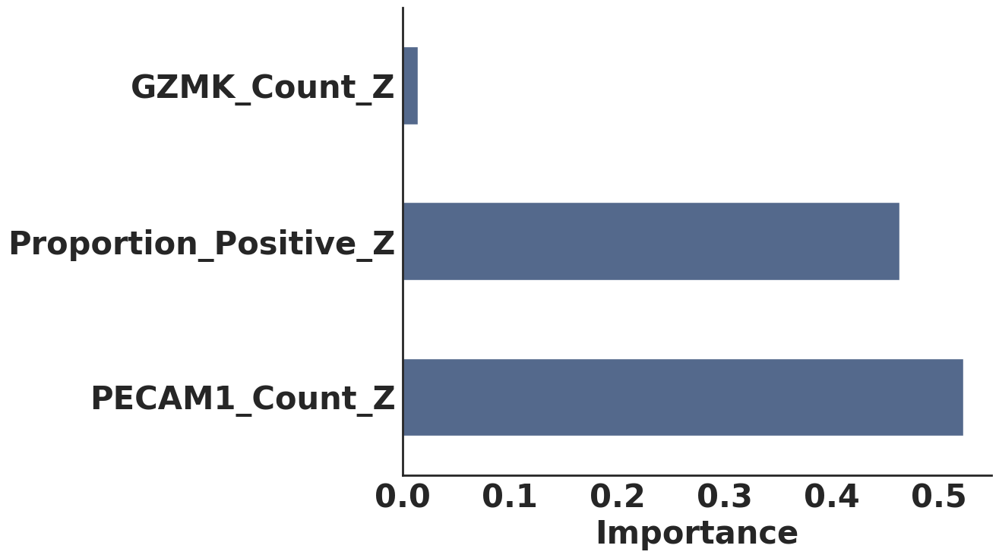


Evaluation Metrics for Gene Pair: PECAM1 - RPL17
Accuracy: 0.9167
Precision: 0.9250
Recall: 0.9167
F1 Score: 0.9105

Visualizing for Gene Pair: PECAM1 - RPL17


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")


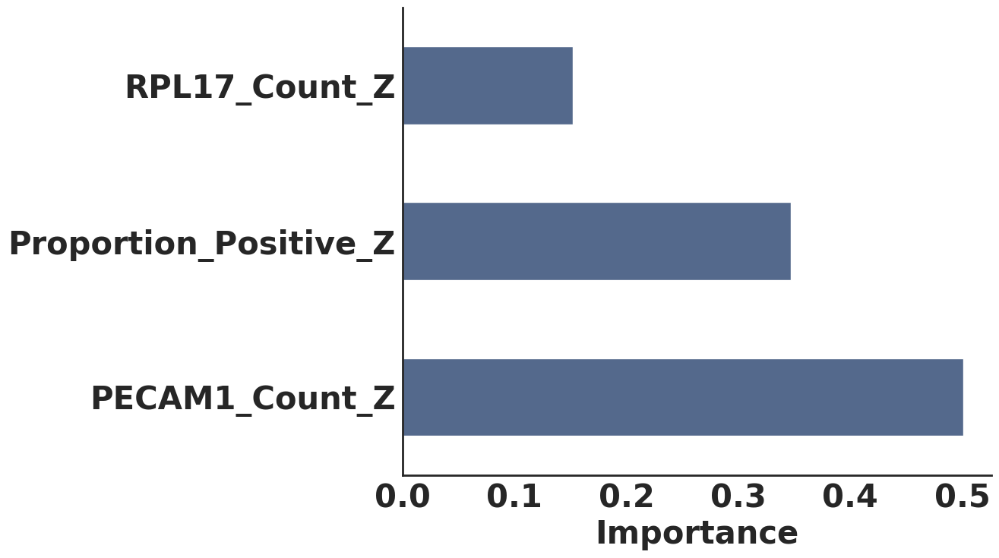


Evaluation Metrics for Gene Pair: GZMK - ALYREF
Accuracy: 0.9167
Precision: 0.9375
Recall: 0.9167
F1 Score: 0.9202

Visualizing for Gene Pair: GZMK - ALYREF


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")


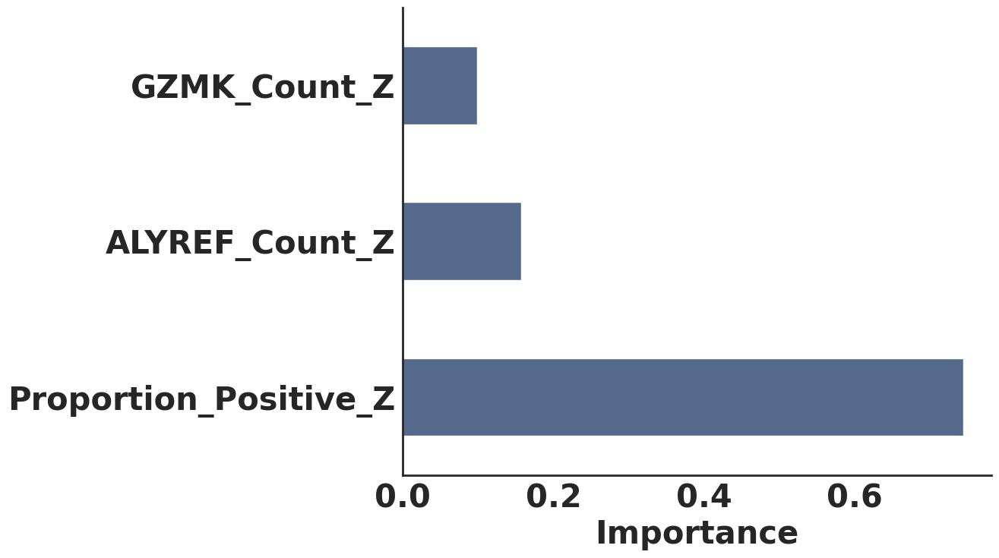


Evaluation Metrics for Gene Pair: ALYREF - RPL17
Accuracy: 0.9167
Precision: 0.9250
Recall: 0.9167
F1 Score: 0.9105

Visualizing for Gene Pair: ALYREF - RPL17


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")


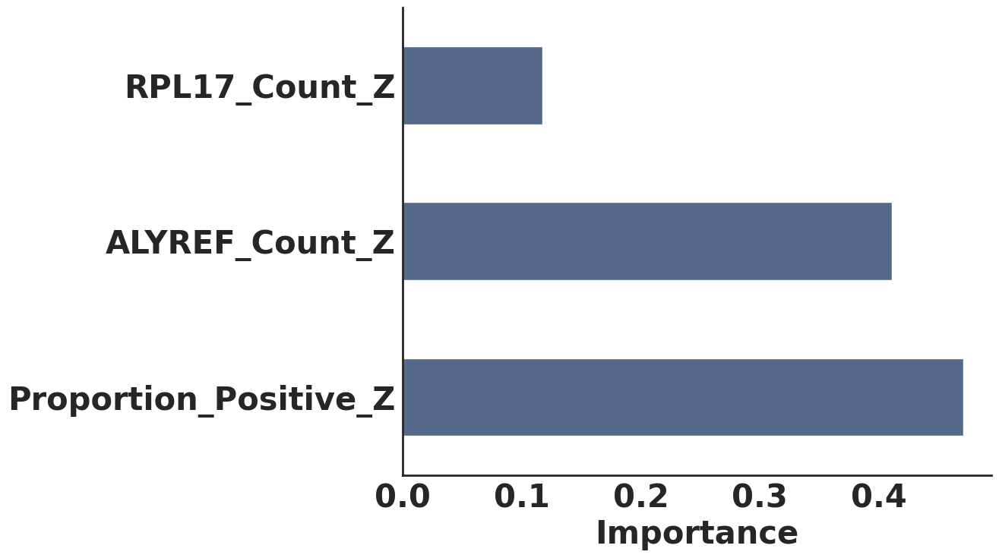

In [33]:
import scanpy as sc
import numpy as np
import pandas as pd
from scipy.sparse import issparse
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from scipy.stats import spearmanr, zscore
import xgboost as xgb
import matplotlib.pyplot as plt
import seaborn as sns

# Load your dataset
adata = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD4_CD8A_highly_variable_log.h5ad')
adata_CD8 = adata[adata.obs['cell_type'] == 'CD8'].copy()

# Simplify response labels by combining 'CR' and 'Infusion' as 'Non-NR'
adata_CD8.obs['Response_Simplified'] = adata_CD8.obs['response'].replace({
    'Infusion': 'Non-NR',
    'CR': 'Non-NR',
    'NR': 'NR'
})

# Encode the simplified labels
le = LabelEncoder()
adata_CD8.obs['Response_Encoded'] = le.fit_transform(adata_CD8.obs['Response_Simplified'])

# Map the encoded response back to the original labels for plotting
response_map = dict(zip(le.classes_, le.transform(le.classes_)))
adata_CD8.obs['Response_Label'] = adata_CD8.obs['Response_Encoded'].map(response_map)

# Add a suffix to the patient IDs to make them unique
adata_CD8.obs['Unique_ID'] = adata_CD8.obs['barcode'].astype(str) + '-' + adata_CD4.obs['timepoint'].astype(str)

# Define gene pairs
gene_pairs = [
    ("GZMK", "PECAM1"),
    ("PECAM1", "RPL17"),
    ("GZMK", "ALYREF"),
    ("ALYREF", "RPL17"),
]
# Define the color palette
color_palette = ["#B77B7E", "#F6BD60", "#A3B18A"]

for gene1, gene2 in gene_pairs:
    # Prepare the data for the gene pair
    model_data = []

    responses = adata_CD8.obs['Response_Simplified'].unique()
    for response in responses:
        resp_adata = adata_CD8[adata_CD8.obs['Response_Simplified'] == response]
        patients = resp_adata.obs['Unique_ID'].unique()
        
        # Calculate the proportion of cells expressing both genes for each patient
        for patient in patients:
            patient_data = resp_adata[resp_adata.obs['Unique_ID'] == patient]
            gene1_expr = patient_data[:, gene1].X.toarray().flatten() > 0 if issparse(patient_data.X) else patient_data[:, gene1].X > 0
            gene2_expr = patient_data[:, gene2].X.toarray().flatten() > 0 if issparse(patient_data.X) else patient_data[:, gene2].X > 0
            both_genes_expr = np.logical_and(gene1_expr, gene2_expr)
            proportion = np.sum(both_genes_expr) / patient_data.shape[0]
            gene1_count = np.mean(patient_data[:, gene1].X)  # Sum of log1p-transformed counts
            gene2_count = np.mean(patient_data[:, gene2].X)  # Sum of log1p-transformed counts

            # Append the data for analysis
            model_data.append({
                'Patient': patient,
                'Response_Simplified': response,
                'Proportion_Positive': proportion,
                f'{gene1}_Count': gene1_count,
                f'{gene2}_Count': gene2_count
            })

    # Convert the model_data list to a DataFrame
    model_df = pd.DataFrame(model_data)

    # Normalize the features using zscore for XGBoost
    model_df['Proportion_Positive_Z'] = zscore(model_df['Proportion_Positive'])
    model_df[f'{gene1}_Count_Z'] = zscore(model_df[f'{gene1}_Count'])
    model_df[f'{gene2}_Count_Z'] = zscore(model_df[f'{gene2}_Count'])

    # Select the normalized features and the target variable
    X = model_df[['Proportion_Positive_Z', f'{gene1}_Count_Z', f'{gene2}_Count_Z']]
    y = model_df['Response_Simplified']

    # Encode the target variable for XGBoost
    y_encoded = le.fit_transform(y)

    # Split the data into training and test sets
    X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.3, random_state=42)

    # Train an XGBoost classifier using the common parameters
    xgb_params = {
        'n_estimators': 100,
        'random_state': 42,
        'use_label_encoder': False,
        'eval_metric': 'logloss'
    }
    xgb_model = xgb.XGBClassifier(**xgb_params)
    xgb_model.fit(X_train, y_train)

    # Predict on the test set
    y_pred = xgb_model.predict(X_test)

    # Calculate accuracy, precision, recall, and F1-score
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')

    print(f"\nEvaluation Metrics for Gene Pair: {gene1} - {gene2}")
    print(f"Accuracy: {accuracy:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"F1 Score: {f1:.4f}")

    # Feature Importance using XGBoost
    feature_importances = pd.Series(xgb_model.feature_importances_, index=X.columns).sort_values(ascending=False)

    # Visualization
    print(f"\nVisualizing for Gene Pair: {gene1} - {gene2}")
    

    # 4. Feature Importance using XGBoost
    feature_importances.plot(kind='barh', color='#54698C', figsize=(10, 8))
    plt.xlabel('Importance')
    plt.ylabel('')
    sns.despine(top=True, right=True)
    plt.show()

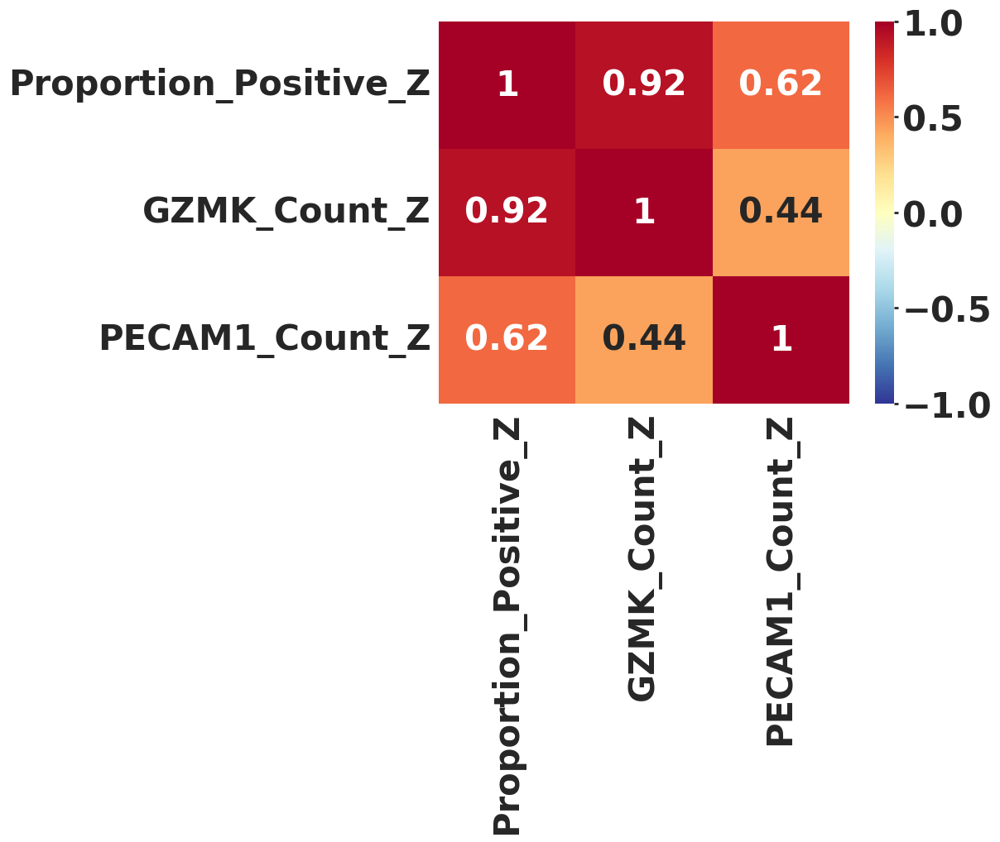

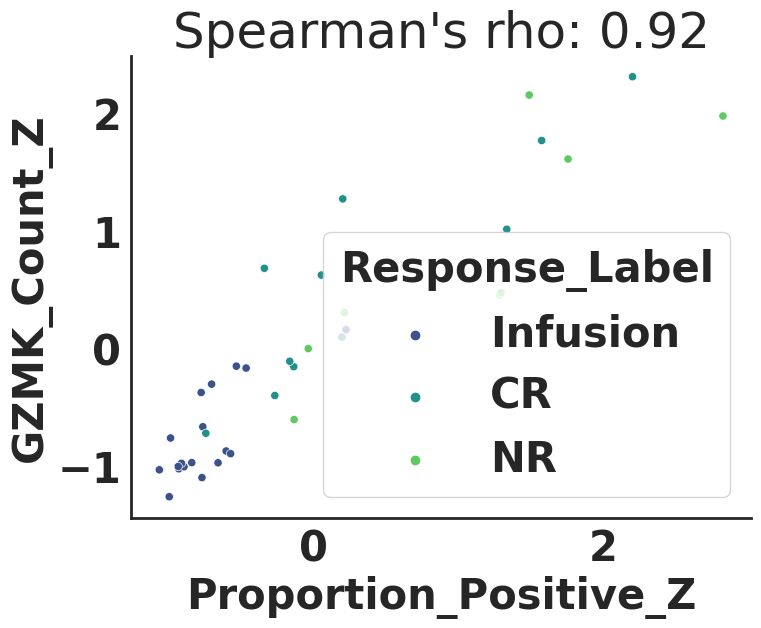

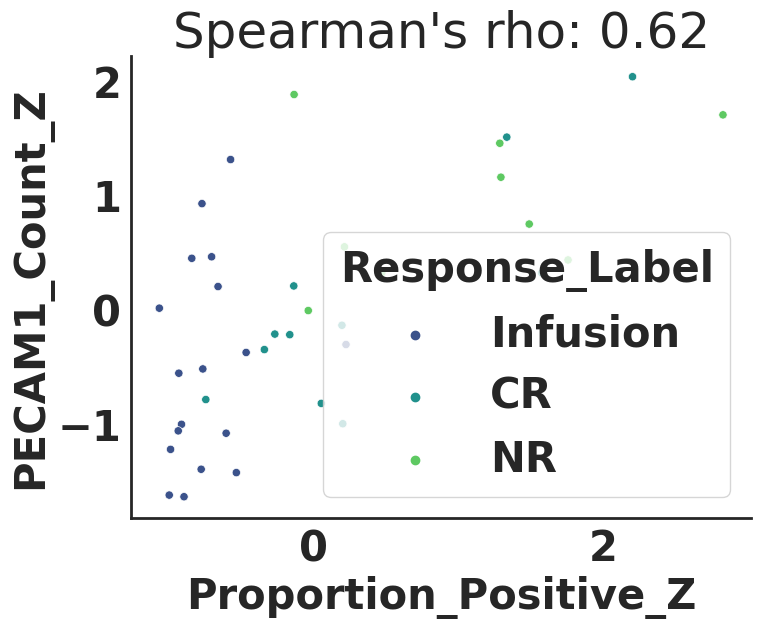

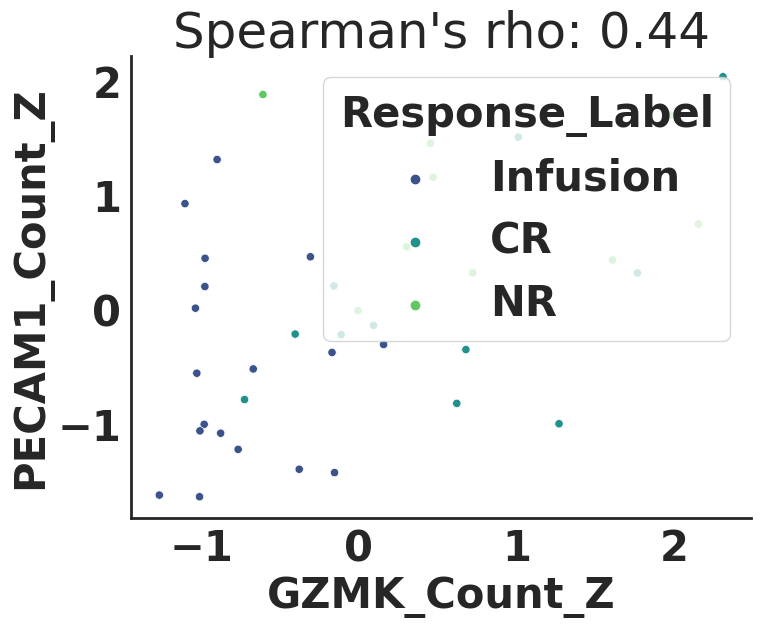

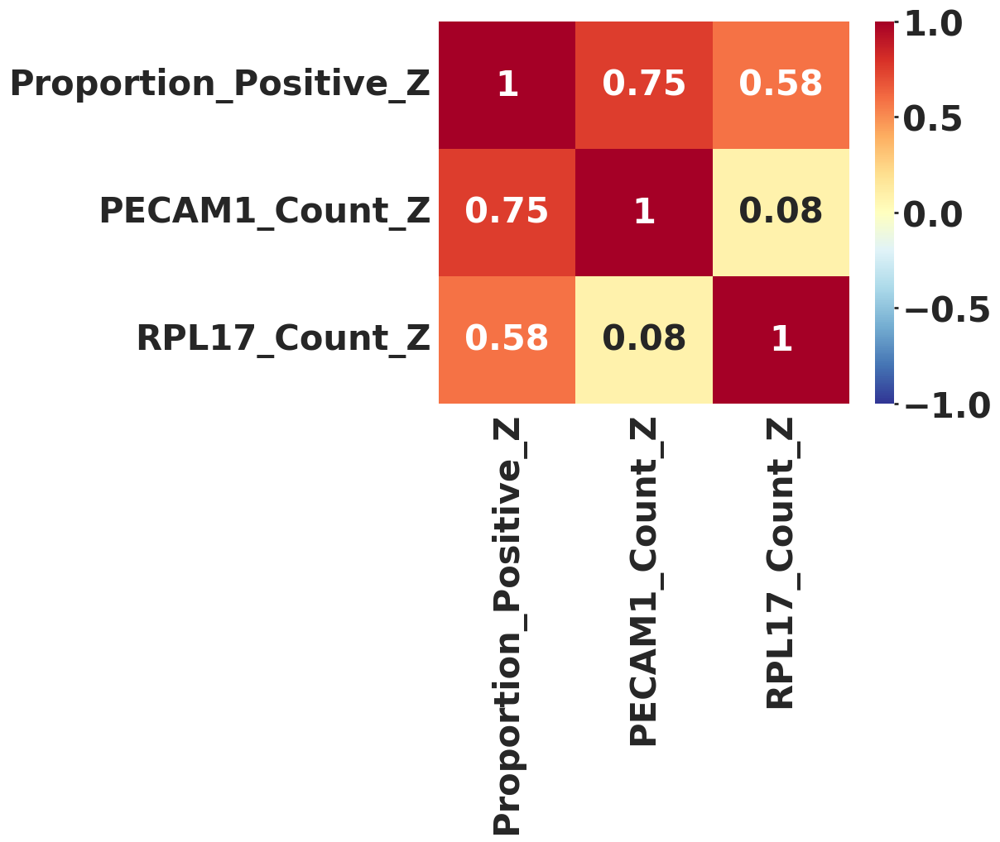

...

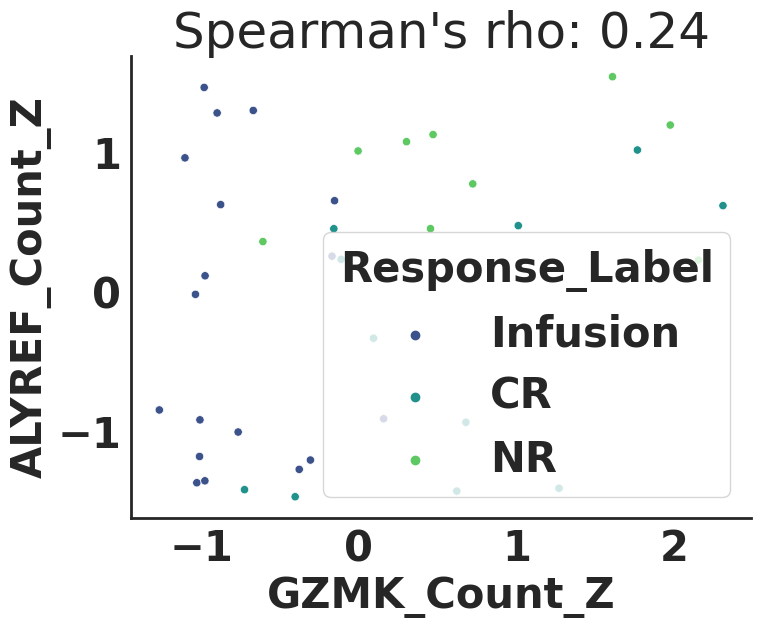

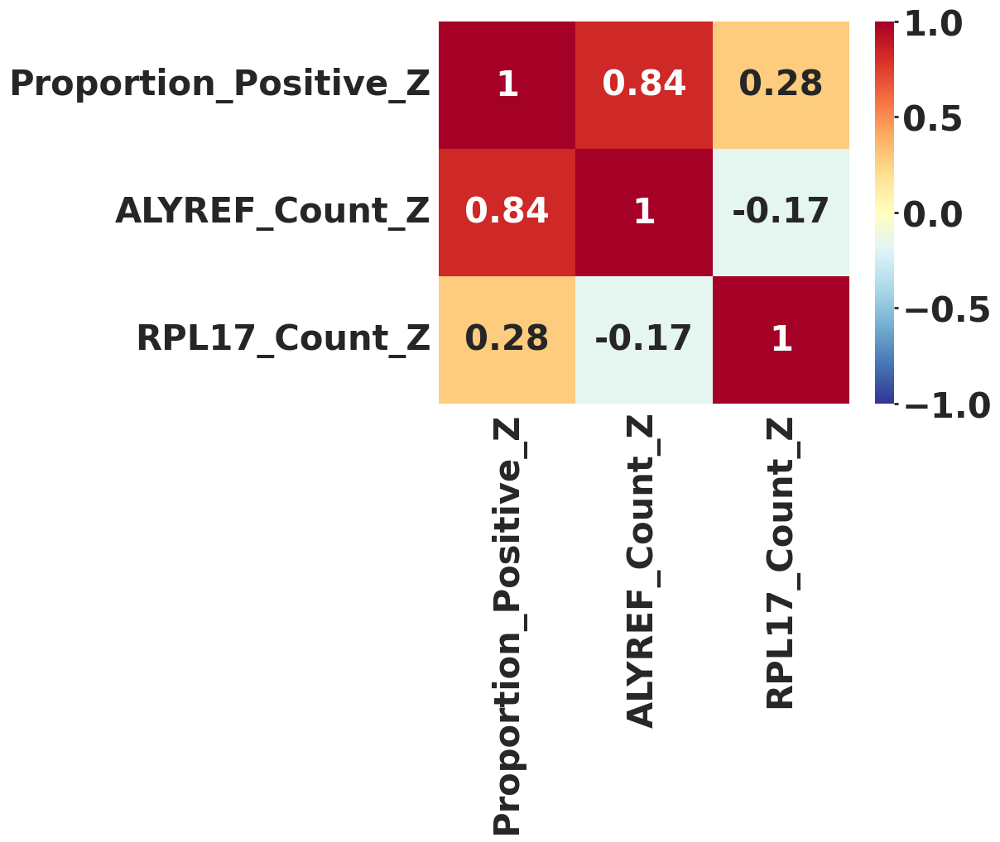

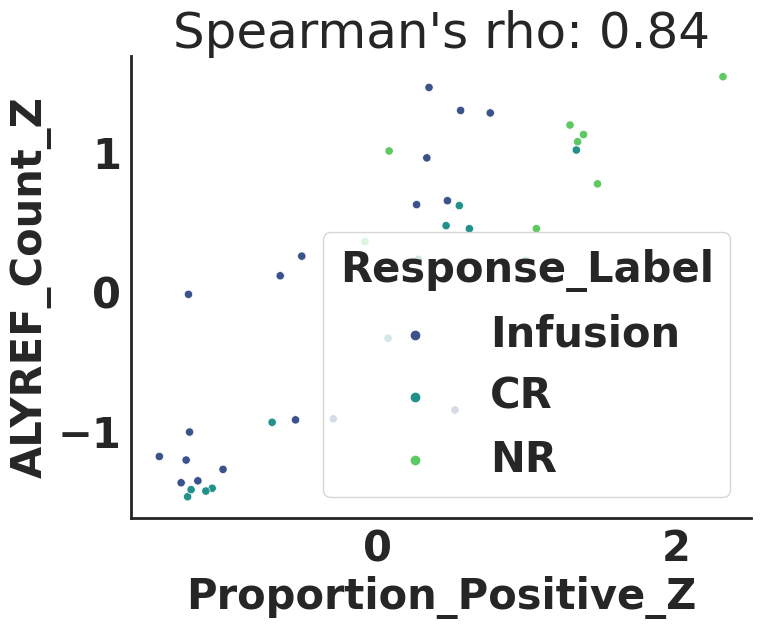

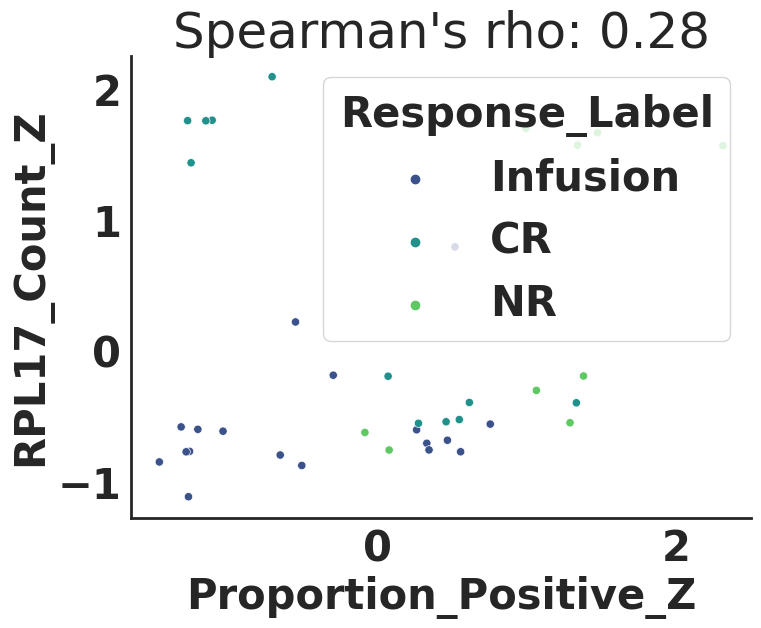

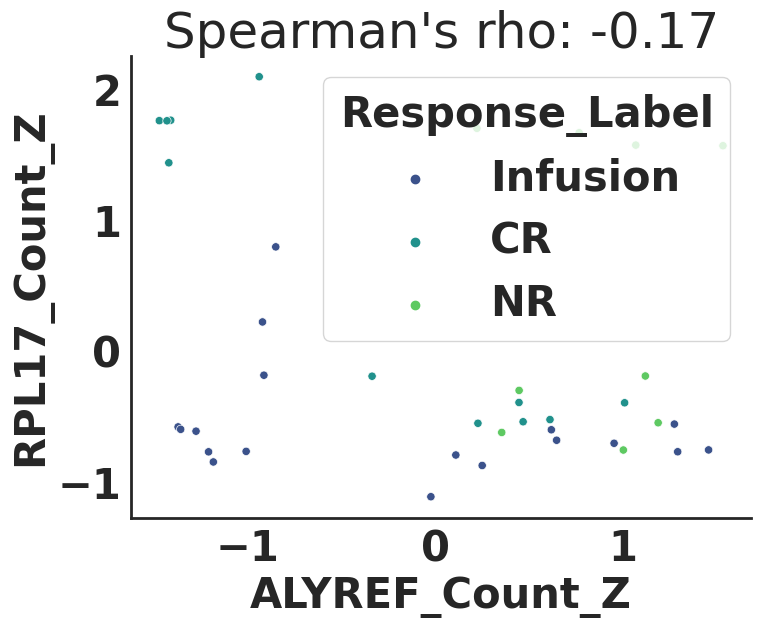

In [34]:
import scanpy as sc
import numpy as np
import pandas as pd
from scipy.sparse import issparse
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from scipy.stats import spearmanr, zscore
import matplotlib.pyplot as plt
import seaborn as sns

# Load your dataset
adata = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD4_CD8A_highly_variable_log.h5ad')
adata_CD8= adata[adata.obs['cell_type'] == 'CD8'].copy()

# Encode the 'response' labels
le = LabelEncoder()
adata_CD8.obs['Response_Encoded'] = le.fit_transform(adata_CD8.obs['response'])

# Add a suffix to the patient IDs to make them unique
adata_CD8.obs['Unique_ID'] = adata_CD8.obs['barcode'].astype(str) + '-' + adata_CD8.obs['timepoint'].astype(str)

# Define gene pairs
gene_pairs = [
    ("GZMK", "PECAM1"),
    ("PECAM1", "RPL17"),
    ("GZMK", "ALYREF"),
    ("ALYREF", "RPL17"),
]
# Map the encoded response back to the original labels for plotting
response_map = {index: label for index, label in enumerate(le.classes_)}
adata_CD8.obs['Response_Label'] = adata_CD8.obs['Response_Encoded'].map(response_map)

# Define the color palette
color_palette = ["#A3B18A", "#B77B7E", "#F6BD60"]

for gene1, gene2 in gene_pairs:
    # Prepare the data for the gene pair
    model_data = []

    responses = adata_CD8.obs['response'].unique()
    for response in responses:
        resp_adata = adata_CD8[adata_CD8.obs['response'] == response]
        patients = resp_adata.obs['Unique_ID'].unique()
        
        # Calculate the proportion of cells expressing both genes for each patient
        for patient in patients:
            patient_data = resp_adata[resp_adata.obs['Unique_ID'] == patient]
            gene1_expr = patient_data[:, gene1].X.toarray().flatten() > 0 if issparse(patient_data.X) else patient_data[:, gene1].X > 0
            gene2_expr = patient_data[:, gene2].X.toarray().flatten() > 0 if issparse(patient_data.X) else patient_data[:, gene2].X > 0
            both_genes_expr = np.logical_and(gene1_expr, gene2_expr)
            proportion = np.sum(both_genes_expr) / patient_data.shape[0]
            gene1_count = np.mean(patient_data[:, gene1].X)  # Sum of log1p-transformed counts
            gene2_count = np.mean(patient_data[:, gene2].X)  # Sum of log1p-transformed counts

            # Append the data for analysis
            model_data.append({
                'Patient': patient,
                'Response_Label': patient_data.obs['Response_Label'].values[0], 
                'Response_Encoded': patient_data.obs['Response_Encoded'].values[0], 
                'Proportion_Positive': proportion,
                f'{gene1}_Count': gene1_count,
                f'{gene2}_Count': gene2_count
            })

    # Convert the model_data list to a DataFrame
    model_df = pd.DataFrame(model_data)

    # Normalize the features using zscore for XGBoost
    model_df['Proportion_Positive_Z'] = zscore(model_df['Proportion_Positive'])
    model_df[f'{gene1}_Count_Z'] = zscore(model_df[f'{gene1}_Count'])
    model_df[f'{gene2}_Count_Z'] = zscore(model_df[f'{gene2}_Count'])

    # 5. Heatmap of Spearman Correlation (using z-score normalized data)
    correlation_matrix = model_df[['Proportion_Positive_Z', f'{gene1}_Count_Z', f'{gene2}_Count_Z']].corr(method='spearman')
    plt.figure(figsize=(8, 6))
    sns.heatmap(correlation_matrix, annot=True, cmap='RdYlBu_r', vmin=-1, vmax=1)
    #sns.despine(top=True, right=True)
    plt.show()
    
    # 6. Scatter plots with Spearman's rho displayed (using z-score normalized data)
    pairs = [
        ('Proportion_Positive_Z', f'{gene1}_Count_Z'),
        ('Proportion_Positive_Z', f'{gene2}_Count_Z'),
        (f'{gene1}_Count_Z', f'{gene2}_Count_Z')
    ]
    
    for var1, var2 in pairs:
        plt.figure(figsize=(8, 6))
        sns.scatterplot(x=model_df[var1], y=model_df[var2], hue=model_df['Response_Label'], palette='viridis')
        rho, _ = spearmanr(model_df[var1], model_df[var2])
        plt.title(f"Spearman's rho: {rho:.2f}")
        plt.xlabel(var1)
        plt.ylabel(var2)
        sns.despine(top=True, right=True)
        plt.show()  # Make sure to show each scatter plot

In [6]:
import scanpy as sc
import numpy as np
import pandas as pd
import itertools
from scipy.stats import mannwhitneyu
from statsmodels.stats.multitest import multipletests
from scipy.sparse import issparse

# Load your dataset
adata = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD4_CD8A_highly_variable_combat.h5ad')
adata_CD8 = adata[adata.obs['cell_type'] == 'CD8'].copy()

# Define gene list
all_genes = [
    "CD27", "CD81", "CD7", "KLRK1", "ITGB2",                          # Immune System and Cell Surface Markers
    "GZMK", "PRF1", "CST7",                                           # Cytotoxicity and Immune Response
    "ALYREF", "ZNF683",                                               # Transcription Factors and Gene Regulation
    "DENND5A", "TSC22D3",                                             # Signal Transduction and Kinases
    "IL7R",                                                           # Cytokine Receptors
    "PECAM1", "ITM2A", "PLP2", "HOPX", "RPL17"                        # Cellular Structure and Metabolism
]

# Prepare to store results
results = []

# Iterate over all pairs of genes
for gene1, gene2 in itertools.combinations(all_genes, 2):
    proportions = {}
    
    responses = adata_CD8.obs['response'].unique()
    for response in responses:
        resp_adata = adata_CD8[adata_CD8.obs['response'] == response]
        patients = resp_adata.obs['barcode'].unique()
        # Calculate the proportion of cells expressing both genes for each patient
        for patient in patients:
            patient_data = resp_adata[resp_adata.obs['barcode'] == patient]
            # Ensure the data is dense if needed
            gene1_expr = patient_data[:, gene1].X.toarray().flatten() > 0 if issparse(patient_data.X) else patient_data[:, gene1].X > 0
            gene2_expr = patient_data[:, gene2].X.toarray().flatten() > 0 if issparse(patient_data.X) else patient_data[:, gene2].X > 0
            both_genes_expr = np.logical_and(gene1_expr, gene2_expr)
            proportion = np.sum(both_genes_expr) / patient_data.shape[0]
            
            if response not in proportions:
                proportions[response] = []
            proportions[response].append(proportion)
        
    # Perform pairwise Mann-Whitney U tests for Infusion vs CR and Infusion vs NR
    u_stat_cr, p_value_cr = mannwhitneyu(proportions['Infusion'], proportions['CR'], alternative='two-sided')
    u_stat_nr, p_value_nr = mannwhitneyu(proportions['Infusion'], proportions['NR'], alternative='two-sided')
    
    # Apply Bonferroni correction to the p-values
    corrected_p_values = multipletests([p_value_cr, p_value_nr], method='bonferroni')[1]
    
    # Save only the pairs where Infusion vs CR is significant and Infusion vs NR is not
    if corrected_p_values[0] < 0.05 and corrected_p_values[1] >= 0.05:
        results.append({
            'Gene1': gene1,
            'Gene2': gene2,
            'P-value Infusion vs CR': corrected_p_values[0],
            'P-value Infusion vs NR': corrected_p_values[1],
            'Proportion Infusion Mean': np.mean(proportions['Infusion']),
            'Proportion CR Mean': np.mean(proportions['CR']),
            'Proportion NR Mean': np.mean(proportions['NR'])
        })

# Convert the results list to a DataFrame
results_df = pd.DataFrame(results)

# Export the results to an Excel file
results_df.to_excel('/home/emma/result/CART/CD8_figure3_gene_pair_infusion_vs_cr_vs_nr.xlsx', index=False)

print("Analysis complete. Results exported to '/home/emma/result/CART/CD8_figure3_gene_pair_infusion_vs_cr_vs_nr.xlsx'.")

Analysis complete. Results exported to '/home/emma/result/CART/CD8_figure3_gene_pair_infusion_vs_cr_vs_nr.xlsx'.


               Patient  Response  Proportion_JUND_IFITM3_Positive
0             Axi-R-01  Infusion                         0.021065
1             Axi-R-17  Infusion                         0.022727
2             Axi-R-15  Infusion                         0.006148
3             Axi-N-18  Infusion                         0.000000
4             Axi-N-16  Infusion                         0.000000
5             Axi-R-19  Infusion                         0.000000
6             Axi-R-13  Infusion                         0.000000
7             Axi-N-10  Infusion                         0.049430
8             Axi-R-11  Infusion                         0.000000
9             Axi-N-09  Infusion                         0.027132
10            Axi-N-07  Infusion                         0.062257
11            Axi-R-08  Infusion                         0.014563
12            Axi-P-05  Infusion                         0.009164
13            Axi-R-04  Infusion                         0.006814
14        

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


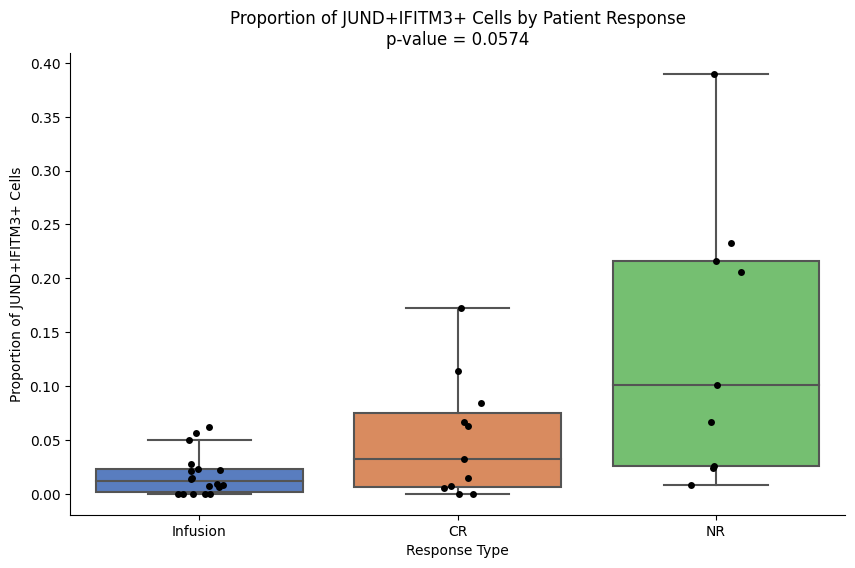

In [22]:
import scanpy as sc
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import mannwhitneyu

# Load your dataset
adata = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD4_CD8A_highly_variable_log.h5ad')
adata_CD8 = adata[adata.obs['cell_type'] == 'CD8'].copy()

# Define gene list
genes_up = [
    "PECAM1",  # Signal Transduction and Kinases
    "MAF"  # Cellular Structure and Adhesion
]

# Prepare to store results
results = []

responses = adata_CD8.obs['response'].unique()
for response in responses:
    resp_adata = adata_CD8[adata_CD8.obs['response'] == response]
    patients = resp_adata.obs['barcode'].unique()
    # Calculate the proportion of cells expressing both genes for each patient
    for patient in patients:
        patient_data = resp_adata[resp_adata.obs['barcode'] == patient]
         # Ensure the data is dense if needed
        gene1_expr = patient_data[:, "CD81"].X.toarray().flatten() > 0 if issparse(patient_data.X) else patient_data[:, gene1].X > 0
        gene2_expr = patient_data[:, "CD7"].X.toarray().flatten() > 0 if issparse(patient_data.X) else patient_data[:, gene2].X > 0
        both_genes_expr = np.logical_and(gene1_expr, gene2_expr)
        proportion = np.sum(both_genes_expr) / patient_data.shape[0]
        
        results.append({
            'Patient': patient,
            'Response': response,
            'Proportion_JUND_IFITM3_Positive': proportion
        })

# Convert the results list to a DataFrame
results_df = pd.DataFrame(results)

# Display the DataFrame
print(results_df)

# Statistical Analysis
responders = results_df[results_df['Response'] == 'CR']['Proportion_JUND_IFITM3_Positive']
non_responders = results_df[results_df['Response'] == 'NR']['Proportion_JUND_IFITM3_Positive']
stat, p_value = mannwhitneyu(responders, non_responders)
print(f"Proportion JUND+IFITM3+ cells: p-value = {p_value:.4f}")

# Plotting
plt.figure(figsize=(10, 6))
ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
sns.boxplot(data=results_df, x='Response', y='Proportion_JUND_IFITM3_Positive', palette='muted', showfliers=False)
sns.stripplot(data=results_df, x='Response', y='Proportion_JUND_IFITM3_Positive', color='black', jitter=True, size=5)
plt.xlabel('Response Type')
plt.ylabel('Proportion of JUND+IFITM3+ Cells')
plt.title(f'Proportion of JUND+IFITM3+ Cells by Patient Response\np-value = {p_value:.4f}')
plt.show()

In [4]:
import scanpy as sc
import numpy as np
import pandas as pd/home/emma/code
import itertools
from scipy.stats import mannwhitneyu, kruskal
from statsmodels.stats.multitest import multipletests

# Load your dataset
adata = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD4_CD8A_highly_variable_combat.h5ad')
adata_CD8 = adata[adata.obs['cell_type'] == 'CD8'].copy()

# Define gene list
all_genes = [
    "CD27", "CD81", "CD7", "KLRK1", "ITGB2",                          # Immune System and Cell Surface Markers
    "GZMK", "PRF1", "CST7",                                           # Cytotoxicity and Immune Response
    "ALYREF", "ZNF683",                                               # Transcription Factors and Gene Regulation
    "DENND5A", "TSC22D3",                                             # Signal Transduction and Kinases
    "IL7R",                                                           # Cytokine Receptors
    "PECAM1", "ITM2A", "PLP2", "HOPX", "RPL17"                        # Cellular Structure and Metabolism
]

# Prepare to store results
results = []

# Iterate over all pairs of genes
for gene1, gene2 in itertools.combinations(all_genes, 2):
    proportions = {}
    
    # Calculate the proportion of cells expressing both genes for each patient
    for patient in adata_CD8.obs['barcode'].unique():
        patient_data = adata_CD8[adata_CD8.obs['barcode'] == patient]
        gene1_expr = patient_data[:, gene1].X > 0
        gene2_expr = patient_data[:, gene2].X > 0
        both_genes_expr = np.logical_and(gene1_expr, gene2_expr)
        proportion = np.sum(both_genes_expr) / patient_data.shape[0]
        
        response = patient_data.obs['response'].iloc[0]  # Assuming each patient has one response type
        if response not in proportions:
            proportions[response] = []
        proportions[response].append(proportion)
    
    # Perform Kruskal-Wallis H-test to compare more than two groups
    group_proportions = [proportions[response] for response in proportions]
    
    # Skip Kruskal-Wallis test if all proportions are identical
    if len(np.unique([item for sublist in group_proportions for item in sublist])) == 1:
        print(f"Skipping Kruskal-Wallis test for {gene1} and {gene2} due to identical values.")
        continue
    
    kruskal_p = kruskal(*group_proportions).pvalue
    
    # If Kruskal-Wallis is significant, perform pairwise Mann-Whitney U tests
    if kruskal_p < 0.05:
        pairwise_p_values = []
        for response1, response2 in itertools.combinations(proportions.keys(), 2):
            u_stat, p_value = mannwhitneyu(proportions[response1], proportions[response2], alternative='two-sided')
            results.append({
                'Gene1': gene1,
                'Gene2': gene2,
                'Response1': response1,
                'Response2': response2,
                'Proportion1 Mean': np.mean(proportions[response1]),
                'Proportion2 Mean': np.mean(proportions[response2]),
                'Mann-Whitney U Stat': u_stat,
                'P-value': p_value
            })
            pairwise_p_values.append(p_value)
        
        # Apply Bonferroni correction only to the 3 pairwise tests for this gene pair
        corrected_p_values = multipletests(pairwise_p_values, method='bonferroni')[1]
        for i in range(3):
            results[-3+i]['Corrected P-value'] = corrected_p_values[i]
    
# Convert the results list to a DataFrame
results_df = pd.DataFrame(results)

# Export the results to an Excel file
results_df.to_excel('/home/emma/result/CART/CD8_figure3_gene_pair_groupwise_response_mannwhitney_combat.xlsx', index=False)

print("Analysis complete. Results exported to '/home/emma/result/CART/CD8_figure3_gene_pair_groupwise_response_mannwhitney.xlsx'.")

Analysis complete. Results exported to '/home/emma/result/CART/CD8_figure3_gene_pair_groupwise_response_mannwhitney.xlsx'.


               Patient  Response  Proportion_JUND_IFITM3_Positive
0             Axi-R-01  Infusion                         1.000000
1             Axi-R-17  Infusion                         0.297414
2             Axi-R-15  Infusion                         1.000000
3             Axi-N-18  Infusion                         1.000000
4             Axi-N-16  Infusion                         0.766990
5             Axi-R-19  Infusion                         1.000000
6             Axi-R-13  Infusion                         0.987952
7             Axi-N-10  Infusion                         0.906832
8             Axi-R-11  Infusion                         1.000000
9             Axi-N-09  Infusion                         1.000000
10            Axi-N-07  Infusion                         0.527451
11            Axi-R-08  Infusion                         0.946341
12            Axi-P-05  Infusion                         1.000000
13            Axi-R-04  Infusion                         0.868825
14        

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


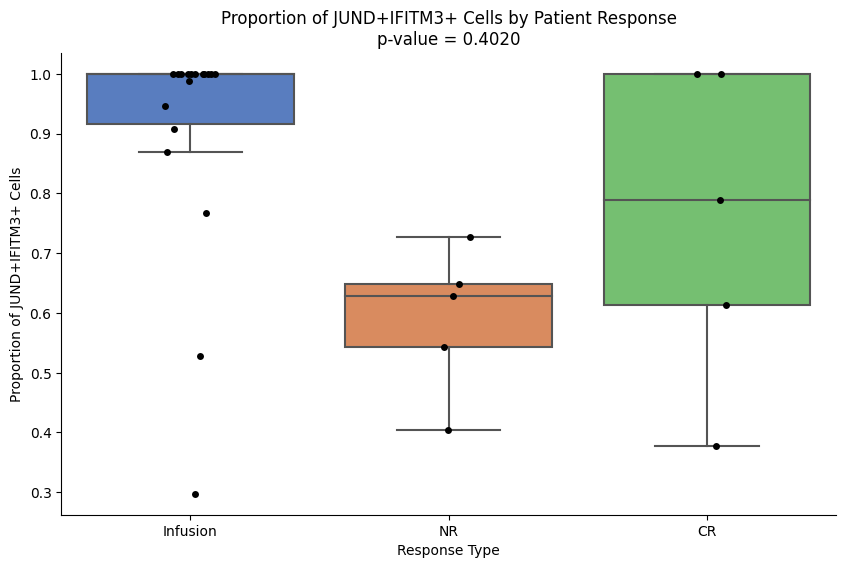

In [9]:
import scanpy as sc
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import mannwhitneyu

# Load your dataset
adata = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD4_CD8A_highly_variable_combat.h5ad')
adata_CD4 = adata[adata.obs['cell_type'] == 'CD8'].copy()

# Define gene list


# Prepare to store results
results = []

# Calculate the proportion of cells expressing both genes for each patient
for patient in adata_CD4.obs['barcode'].unique():
    patient_data = adata_CD4[adata_CD4.obs['barcode'] == patient]
    gene1_expr = patient_data[:, 'ZNF683'].X > 0
    gene2_expr = patient_data[:, 'HOPX'].X > 0
    both_genes_expr = np.logical_and(gene1_expr, gene2_expr)
    proportion = np.sum(both_genes_expr) / patient_data.shape[0]
    
    response = patient_data.obs['response'].iloc[0]  # Assuming each patient has one response type
    results.append({
        'Patient': patient,
        'Response': response,
        'Proportion_JUND_IFITM3_Positive': proportion
    })

# Convert the results list to a DataFrame
results_df = pd.DataFrame(results)

# Display the DataFrame
print(results_df)

# Statistical Analysis
responders = results_df[results_df['Response'] == 'CR']['Proportion_JUND_IFITM3_Positive']
non_responders = results_df[results_df['Response'] == 'NR']['Proportion_JUND_IFITM3_Positive']
stat, p_value = mannwhitneyu(responders, non_responders)
print(f"Proportion JUND+IFITM3+ cells: p-value = {p_value:.4f}")

# Plotting
plt.figure(figsize=(10, 6))
ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
sns.boxplot(data=results_df, x='Response', y='Proportion_JUND_IFITM3_Positive', palette='muted', showfliers=False)
sns.stripplot(data=results_df, x='Response', y='Proportion_JUND_IFITM3_Positive', color='black', jitter=True, size=5)
plt.xlabel('Response Type')
plt.ylabel('Proportion of JUND+IFITM3+ Cells')
plt.title(f'Proportion of JUND+IFITM3+ Cells by Patient Response\np-value = {p_value:.4f}')
plt.show()


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


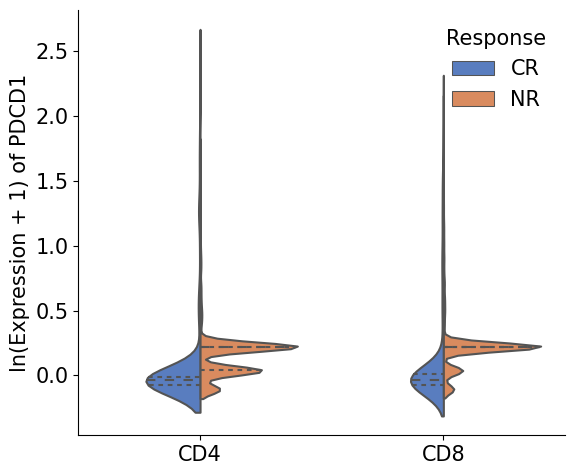

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


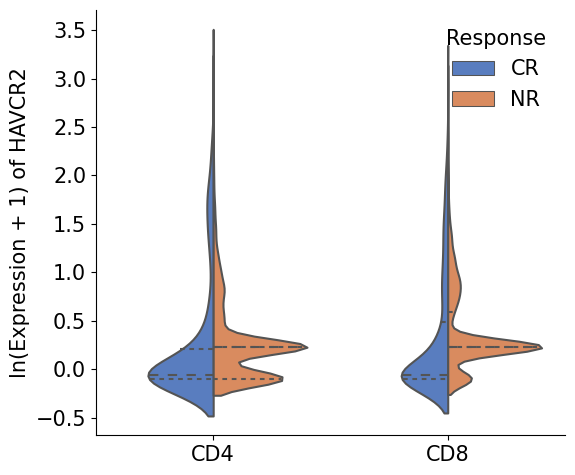

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


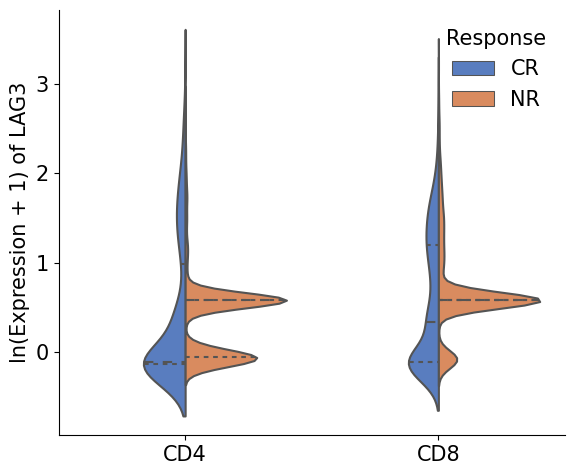

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


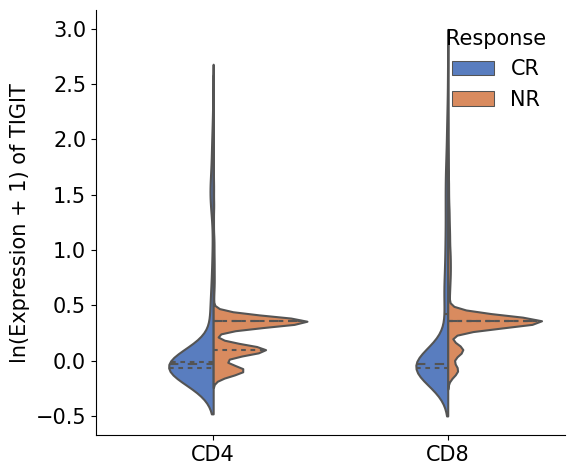

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


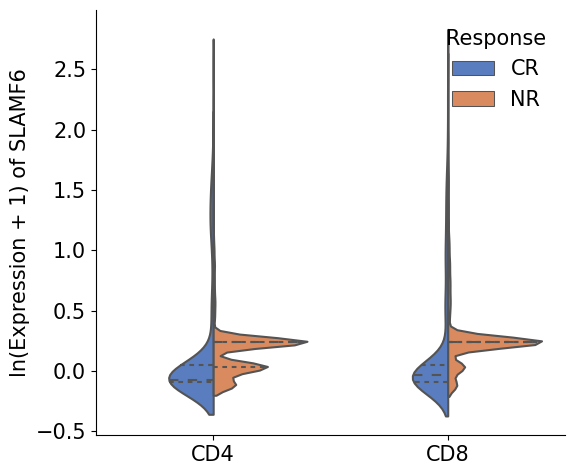

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


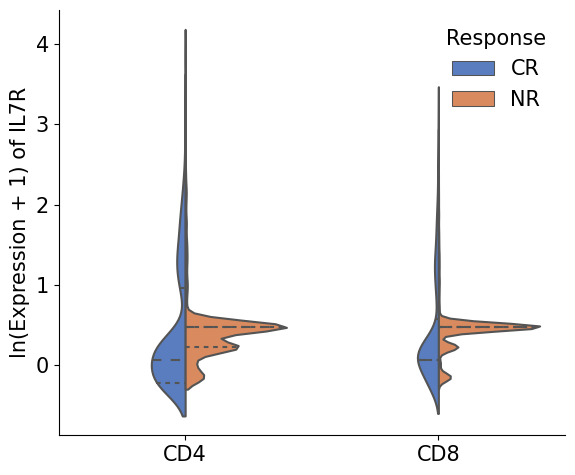

In [16]:
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt

# Load your dataset
#adata = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_D7sorted_CD4_CD8A_highly_variable_combat_CR_NR.h5ad')
adata = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD4_CD8A_highly_variable_combat.h5ad')
adata_CD4 = adata[adata.obs['cell_type'] == 'CD4'].copy()

# Filter data based on your conditions
all_genes = [
    "PECAM1", "CD7", "FCER1G", "KLRB1",                             # Immune System and Cell Surface Markers
    "JUND", "ZNF683", "TLE5", "LFNG", "TSC22D3", "MAF",             # Transcription Factors and Gene Regulation
    "MTRNR2L12", "RRM2", "TYMS", "GINS2",                           # Mitochondrial and Cellular Metabolism
    "MATK",                                                         # Signal Transduction and Kinases
    "IFITM3",                                                       # Antiviral Response
    "PLP2", "CLSPN", "MSN", "CTSW"                                  # Cellular Structure and Adhesion
]


for genes in all_genes.pairwise():
    responses = adata.obs['response'].unique()
    for response in responses:
        filtered_adata = adata[adata.obs['response'] == response].copy()
        mask = filtered_adata.obs_vector('genes') > 0
        ratio = np.sum(mask) / filtered_adata.shape[0]


        # Plotting
        plt.figure(figsize=(6, 5))
        plt.rcParams.update({'font.size': 15})
        ax = sns.violinplot(data=df, x="cell_type", y=gene, hue="response", split=True, inner="quart", palette="muted")
        sns.despine()  # Remove the top and right spines
        plt.title(f'')
        plt.xlabel('')
        plt.ylabel(f'ln(Expression + 1) of {gene}')

        # Positioning the legend on the top left
        plt.legend(title='Response', frameon=False)
        plt.tight_layout()
        plt.savefig(f'/home/emma/result/CART/violinplot_all3_13_14_15/{gene}_clusters3_13_14_15_violinplot.png')
        plt.show()
    else:
        print(f"{gene} is not present in the variable names. Please check your adata object.")

In [17]:
import scanpy as sc
import pandas as pd
from scipy.stats import mannwhitneyu

# Load your dataset
adata = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_D7sorted_CD4_CD8A_highly_variable_combat_CR_NR.h5ad')

# Apply your filters for relevant clusters
mask = adata.obs['leiden_0.9'].isin(['3', '13', '14', '15'])
adata = adata[mask].copy()

# List of genes to check
genes = ['PDCD1', 'HAVCR2', 'LAG3', 'TIGIT', 'SLAMF6', 'IL7R']

# Iterate over each gene in the list
for gene in genes:
    if gene in adata.var_names:
        # Convert to DataFrame for easier manipulation
        df = adata.to_df()
        df['cell_type'] = adata.obs['cell_type']
        df['response'] = adata.obs['response']

        # Separate the data by cell type and response for each gene
        cd4_nr = df[(df['cell_type'] == 'CD4') & (df['response'] == 'NR')][gene]
        cd4_cr = df[(df['cell_type'] == 'CD4') & (df['response'] == 'CR')][gene]
        cd8_nr = df[(df['cell_type'] == 'CD8') & (df['response'] == 'NR')][gene]
        cd8_cr = df[(df['cell_type'] == 'CD8') & (df['response'] == 'CR')][gene]

        # Perform Mann-Whitney U test for CD4 and CD8 T cells
        mwu_cd4 = mannwhitneyu(cd4_nr, cd4_cr, alternative='two-sided')
        mwu_cd8 = mannwhitneyu(cd8_nr, cd8_cr, alternative='two-sided')

        print(f"Mann-Whitney U test for CD4 T cells (NR vs. CR) on {gene}: U = {mwu_cd4.statistic}, p-value = {mwu_cd4.pvalue}")
        print(f"Mann-Whitney U test for CD8 T cells (NR vs. CR) on {gene}: U = {mwu_cd8.statistic}, p-value = {mwu_cd8.pvalue}")
    else:
        print(f"{gene} is not present in the variable names. Please check your adata object.")

Mann-Whitney U test for CD4 T cells (NR vs. CR) on PDCD1: U = 1551406.0, p-value = 3.5098259259672507e-125
Mann-Whitney U test for CD8 T cells (NR vs. CR) on PDCD1: U = 2920583.0, p-value = 1.6259302101768312e-155
Mann-Whitney U test for CD4 T cells (NR vs. CR) on HAVCR2: U = 1161346.0, p-value = 2.5013232470057116e-14
Mann-Whitney U test for CD8 T cells (NR vs. CR) on HAVCR2: U = 2531841.0, p-value = 4.374076576220207e-52
Mann-Whitney U test for CD4 T cells (NR vs. CR) on LAG3: U = 1233437.0, p-value = 7.656645072180966e-27
Mann-Whitney U test for CD8 T cells (NR vs. CR) on LAG3: U = 2269282.0, p-value = 5.2542452853730486e-20
Mann-Whitney U test for CD4 T cells (NR vs. CR) on TIGIT: U = 1373005.0, p-value = 5.340796828556375e-61
Mann-Whitney U test for CD8 T cells (NR vs. CR) on TIGIT: U = 2673975.0, p-value = 5.502708296915208e-88
Mann-Whitney U test for CD4 T cells (NR vs. CR) on SLAMF6: U = 1337295.0, p-value = 8.707058249041202e-51
Mann-Whitney U test for CD8 T cells (NR vs. CR) 

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


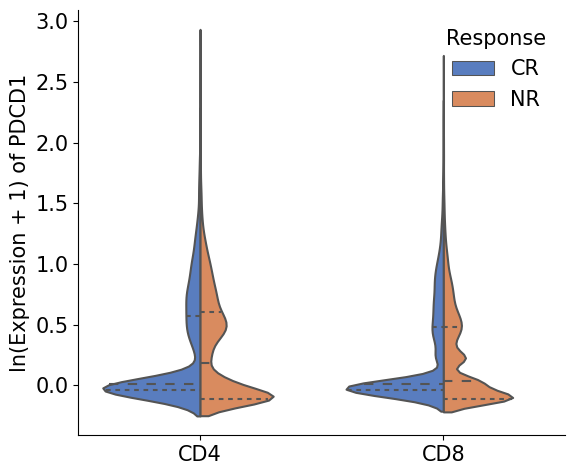

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


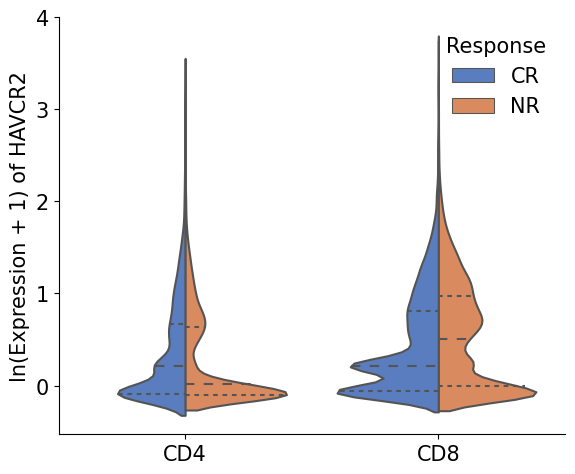

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


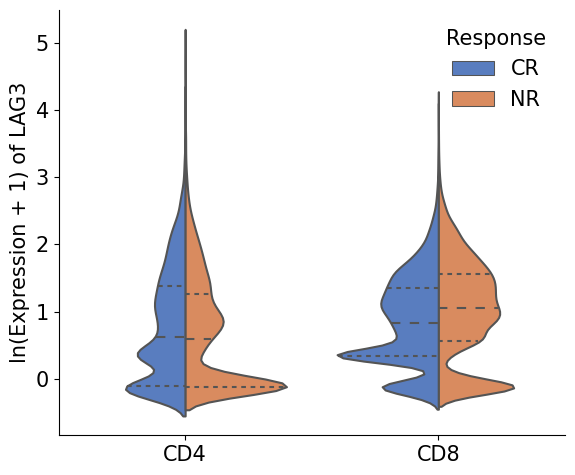

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


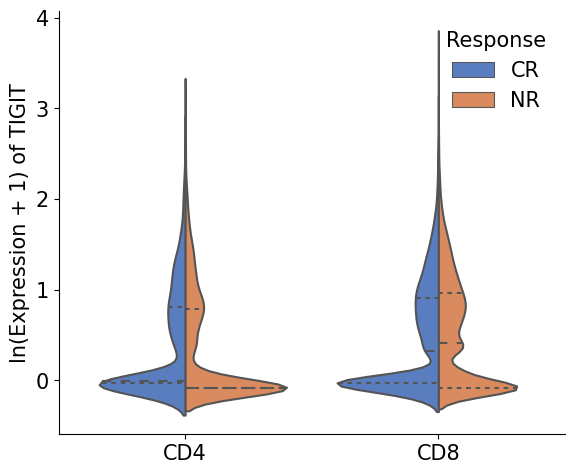

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


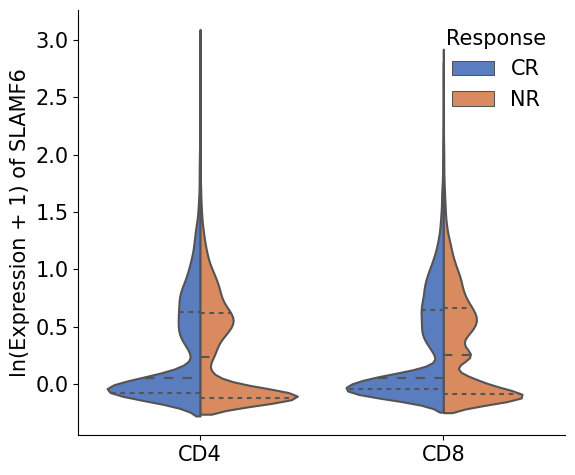

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


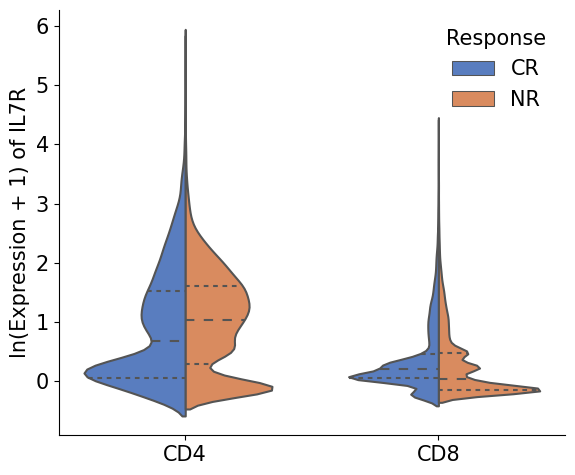

In [18]:
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt

# Load your dataset
adata = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_D7sorted_CD4_CD8A_highly_variable_combat_CR_NR.h5ad')

# Filter data based on your conditions
#mask = adata.obs['leiden_0.9'].isin(['3', '13', '14', '15']) | ((adata.obs['leiden_0.9'].isin(['1', '5', '10', '11'])) & (adata.obs['cell_type'] == 'CD8'))
mask = adata.obs['leiden_0.9'].isin(['3', '13', '14', '15'])
adata = adata[~mask].copy()

genes = ['PDCD1', 'HAVCR2', 'LAG3', 'TIGIT', 'SLAMF6', 'IL7R']  # Ensure variable names are correct and consistent
# Iterate over each gene in the list
for gene in genes:
    if gene in adata.var_names:
        # Convert to DataFrame for plotting
        df = adata.to_df()

        # Adding metadata from adata.obs
        df['cell_type'] = adata.obs['cell_type']
        df['response'] = adata.obs['response']

        # Plotting
        plt.figure(figsize=(6, 5))
        plt.rcParams.update({'font.size': 15})
        ax = sns.violinplot(data=df, x="cell_type", y=gene, hue="response", split=True, inner="quart", palette="muted")
        sns.despine()  # Remove the top and right spines
        plt.title(f'')
        plt.xlabel('')
        plt.ylabel(f'ln(Expression + 1) of {gene}')

        # Positioning the legend on the top left
        plt.legend(title='Response', frameon=False)
        plt.tight_layout()
        plt.savefig(f'/home/emma/result/CART/violinplot_all3_13_14_15/{gene}_rest_clusters_violinplot.png')
        plt.show()
    else:
        print(f"{gene} is not present in the variable names. Please check your adata object.")

In [19]:
import scanpy as sc
import pandas as pd
from scipy.stats import mannwhitneyu

# Load your dataset
adata = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_D7sorted_CD4_CD8A_highly_variable_combat_CR_NR.h5ad')

# Apply your filters for relevant clusters
mask = adata.obs['leiden_0.9'].isin(['3', '13', '14', '15'])
adata = adata[~mask].copy()

# List of genes to check
genes = ['PDCD1', 'HAVCR2', 'LAG3', 'TIGIT', 'SLAMF6', 'IL7R']

# Iterate over each gene in the list
for gene in genes:
    if gene in adata.var_names:
        # Convert to DataFrame for easier manipulation
        df = adata.to_df()
        df['cell_type'] = adata.obs['cell_type']
        df['response'] = adata.obs['response']

        # Separate the data by cell type and response for each gene
        cd4_nr = df[(df['cell_type'] == 'CD4') & (df['response'] == 'NR')][gene]
        cd4_cr = df[(df['cell_type'] == 'CD4') & (df['response'] == 'CR')][gene]
        cd8_nr = df[(df['cell_type'] == 'CD8') & (df['response'] == 'NR')][gene]
        cd8_cr = df[(df['cell_type'] == 'CD8') & (df['response'] == 'CR')][gene]

        # Perform Mann-Whitney U test for CD4 and CD8 T cells
        mwu_cd4 = mannwhitneyu(cd4_nr, cd4_cr, alternative='two-sided')
        mwu_cd8 = mannwhitneyu(cd8_nr, cd8_cr, alternative='two-sided')

        print(f"Mann-Whitney U test for CD4 T cells (NR vs. CR) on {gene}: U = {mwu_cd4.statistic}, p-value = {mwu_cd4.pvalue}")
        print(f"Mann-Whitney U test for CD8 T cells (NR vs. CR) on {gene}: U = {mwu_cd8.statistic}, p-value = {mwu_cd8.pvalue}")
    else:
        print(f"{gene} is not present in the variable names. Please check your adata object.")


Mann-Whitney U test for CD4 T cells (NR vs. CR) on PDCD1: U = 21727517.0, p-value = 1.941544769801867e-06
Mann-Whitney U test for CD8 T cells (NR vs. CR) on PDCD1: U = 115492154.0, p-value = 2.2115481397069676e-13
Mann-Whitney U test for CD4 T cells (NR vs. CR) on HAVCR2: U = 18069631.0, p-value = 2.5742357622688018e-95
Mann-Whitney U test for CD8 T cells (NR vs. CR) on HAVCR2: U = 128781021.0, p-value = 5.027514636417175e-21
Mann-Whitney U test for CD4 T cells (NR vs. CR) on LAG3: U = 21793920.0, p-value = 7.850175509848641e-06
Mann-Whitney U test for CD8 T cells (NR vs. CR) on LAG3: U = 138209438.0, p-value = 2.3074731547533963e-100
Mann-Whitney U test for CD4 T cells (NR vs. CR) on TIGIT: U = 18165743.0, p-value = 1.2718002070391494e-91
Mann-Whitney U test for CD8 T cells (NR vs. CR) on TIGIT: U = 121246073.0, p-value = 0.9365009716119875
Mann-Whitney U test for CD4 T cells (NR vs. CR) on SLAMF6: U = 19677369.0, p-value = 2.1943107184273237e-42
Mann-Whitney U test for CD8 T cells (N

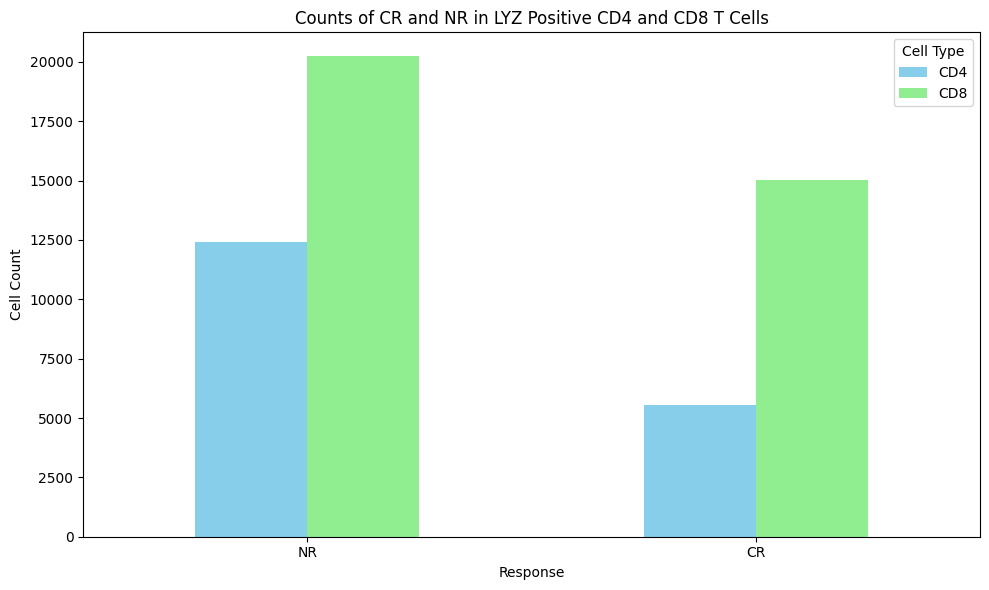

ModuleNotFoundError: No module named 'ace_tools'

In [2]:
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load your dataset
adata = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_D7sorted_CD4_CD8A_highly_variable_combat_CR_NR.h5ad')

# Filter for LYZ-positive cells
lyz_positive = adata[:, adata.var_names.isin(['LYZ'])].X > 0
lyz_positive_cells = adata[lyz_positive]

# Create a DataFrame for easier manipulation
df = pd.DataFrame({
    'cell_type': lyz_positive_cells.obs['cell_type'],
    'response': lyz_positive_cells.obs['response']
})

# Filter for CD4 and CD8 T cells
cd4_cells = df[df['cell_type'] == 'CD4']
cd8_cells = df[df['cell_type'] == 'CD8']

# Count the number of CR and NR cells in CD4 and CD8 T cell populations
cd4_counts = cd4_cells['response'].value_counts()
cd8_counts = cd8_cells['response'].value_counts()

# Create a summary DataFrame
summary_df = pd.DataFrame({
    'CD4': cd4_counts,
    'CD8': cd8_counts
}).fillna(0).astype(int)

# Plot the counts as a bar graph
summary_df.plot(kind='bar', figsize=(10, 6), color=['skyblue', 'lightgreen'])
plt.title('Counts of CR and NR in LYZ Positive CD4 and CD8 T Cells')
plt.xlabel('Response')
plt.ylabel('Cell Count')
plt.xticks(rotation=0)
plt.legend(title='Cell Type')
plt.tight_layout()
plt.savefig('/home/emma/result/CART/LYZ_positive_CD4_CD8_CR_NR_counts.png')
plt.show()

# Display the summary
import ace_tools as tools; tools.display_dataframe_to_user(name="LYZ Positive CD4 and CD8 T cells - CR and NR Counts", dataframe=summary_df)

print(summary_df)


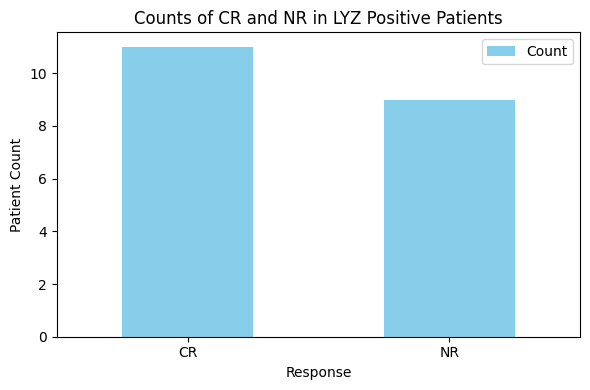

ModuleNotFoundError: No module named 'ace_tools'

In [4]:
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load your dataset
adata = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_D7sorted_CD4_CD8A_highly_variable_combat_CR_NR.h5ad')

# Filter for LYZ-positive cells
lyz_positive = adata[:, adata.var_names.isin(['LYZ'])].X > 0
lyz_positive_cells = adata[lyz_positive]

# Create a DataFrame for easier manipulation
df = pd.DataFrame({
    'barcode': lyz_positive_cells.obs['barcode'],
    'response': lyz_positive_cells.obs['response']
})

# Count the number of unique CR and NR patients in LYZ-positive cells
response_counts = df.drop_duplicates('barcode')['response'].value_counts()

# Create a summary DataFrame
summary_df = pd.DataFrame({
    'Count': response_counts
}).fillna(0).astype(int)

# Plot the counts as a bar graph
summary_df.plot(kind='bar', figsize=(6, 4), color=['skyblue', 'lightgreen'])
plt.title('Counts of CR and NR in LYZ Positive Patients')
plt.xlabel('Response')
plt.ylabel('Patient Count')
plt.xticks(rotation=0)
plt.tight_layout()
plt.savefig('/home/emma/result/CART/LYZ_positive_patient_CR_NR_counts.png')
plt.show()

# Display the summary
import ace_tools as tools; tools.display_dataframe_to_user(name="LYZ Positive Patients - CR and NR Counts", dataframe=summary_df)

print(summary_df)


/tmp/ipykernel_2535613/1053494334.py:19: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  patient_group = df.groupby('barcode')


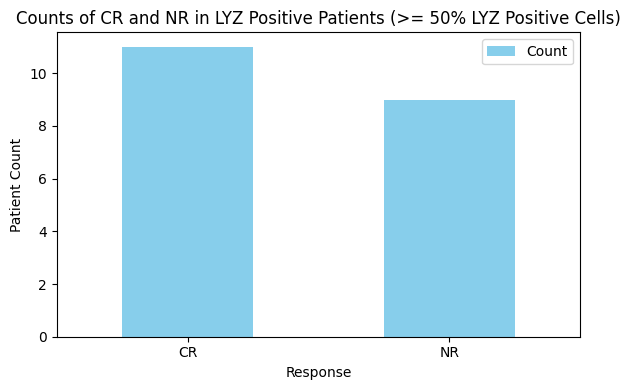

ModuleNotFoundError: No module named 'ace_tools'

In [2]:
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load your dataset
adata = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_D7sorted_CD4_CD8A_highly_variable_combat_CR_NR.h5ad')

# Determine LYZ-positive cells
lyz_positive = adata[:, adata.var_names.isin(['LYZ'])].X > 0

# Add LYZ-positive information to adata.obs
adata.obs['lyz_positive'] = lyz_positive

# Create a DataFrame for easier manipulation
df = adata.obs[['barcode', 'response', 'lyz_positive']]

# Calculate the percentage of LYZ-positive cells for each patient
patient_group = df.groupby('barcode')
percent_lyz_positive = patient_group['lyz_positive'].mean() * 100

# Determine which patients have at least 50% LYZ-positive cells
lyz_positive_patients = percent_lyz_positive[percent_lyz_positive >= 50].index

# Filter the original DataFrame for LYZ-positive patients
lyz_positive_df = df[df['barcode'].isin(lyz_positive_patients)]

# Count the number of unique CR and NR patients in LYZ-positive cells
response_counts = lyz_positive_df.drop_duplicates('barcode')['response'].value_counts()

# Create a summary DataFrame
summary_df = pd.DataFrame({
    'Count': response_counts
}).fillna(0).astype(int)

# Plot the counts as a bar graph
summary_df.plot(kind='bar', figsize=(6, 4), color=['skyblue', 'lightgreen'])
plt.title('Counts of CR and NR in LYZ Positive Patients (>= 50% LYZ Positive Cells)')
plt.xlabel('Response')
plt.ylabel('Patient Count')
plt.xticks(rotation=0)
plt.tight_layout()
plt.savefig('/home/emma/result/CART/LYZ_positive_patient_CR_NR_counts.png')
plt.show()

# Display the summary
import ace_tools as tools; tools.display_dataframe_to_user(name="LYZ Positive Patients - CR and NR Counts", dataframe=summary_df)

print(summary_df)

/tmp/ipykernel_2536115/2377581712.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  patient_lyz_total = df.groupby('barcode').agg({
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/minico

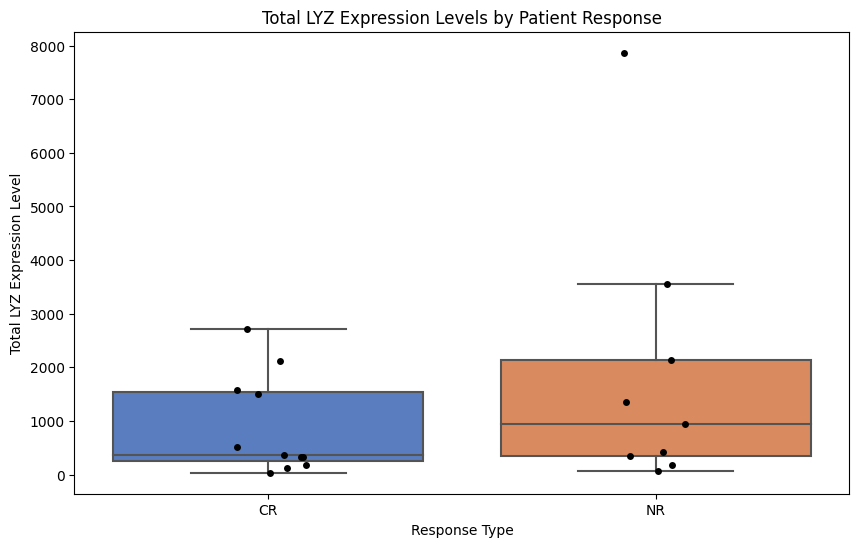

In [3]:
import scanpy as sc
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load your dataset
adata = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_D7sorted_CD4_CD8A_highly_variable_combat_CR_NR.h5ad')

# Get the LYZ expression data
adata.obs['LYZ_expression'] = adata[:, 'LYZ'].X.toarray().flatten()  # Adjust if using a sparse matrix

# Create a DataFrame with patient IDs, their response, and LYZ expression
df = adata.obs[['barcode', 'response', 'LYZ_expression']]

# Group by patient ID and calculate total LYZ expression
patient_lyz_total = df.groupby('barcode').agg({
    'response': 'first',  # Assuming response is the same for all entries of the same patient
    'LYZ_expression': 'sum'
}).reset_index()

# Plotting
plt.figure(figsize=(10, 6))
sns.boxplot(data=patient_lyz_total, x='response', y='LYZ_expression', palette='muted', showfliers=False)
sns.stripplot(data=patient_lyz_total, x='response', y='LYZ_expression', color='black', jitter=True, size=5)
plt.title('Total LYZ Expression Levels by Patient Response')
plt.xlabel('Response Type')
plt.ylabel('Total LYZ Expression Level')
plt.savefig('/home/emma/result/CART/total_LYZ_expression_by_patient_boxplot.png')
plt.show()



/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


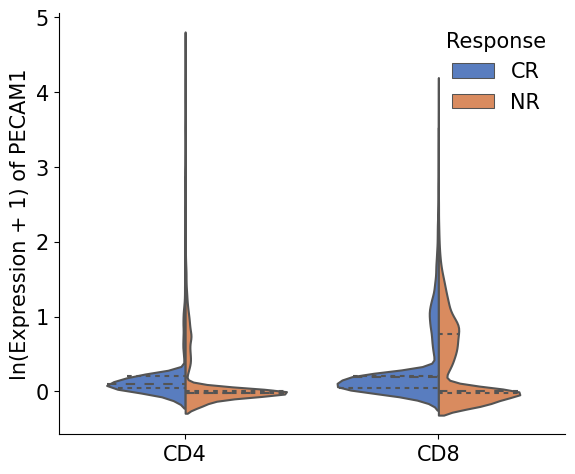

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


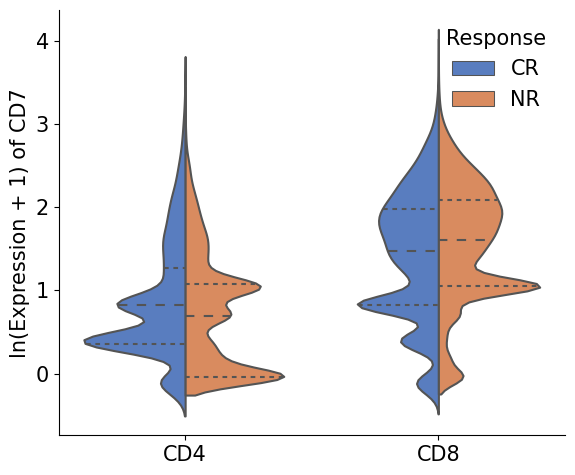

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


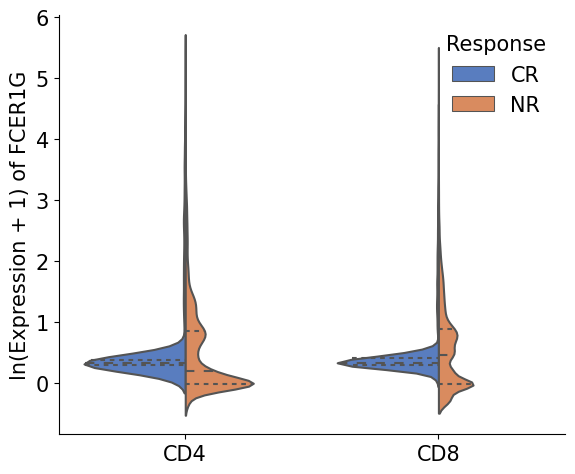

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


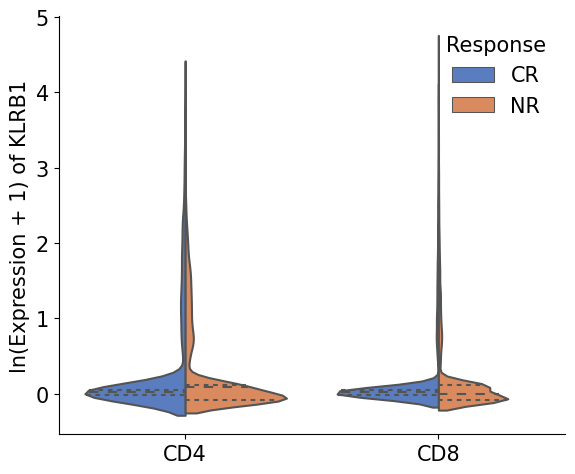

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


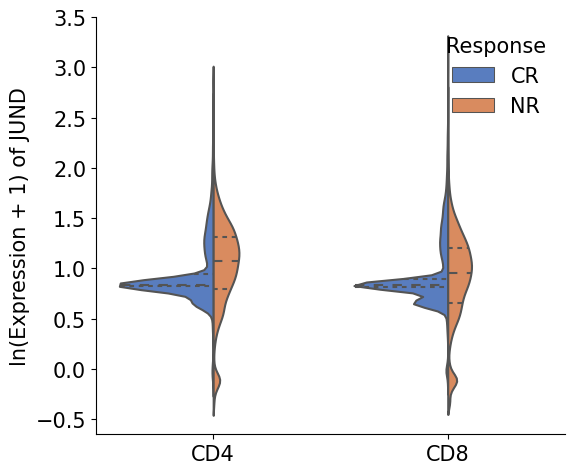

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


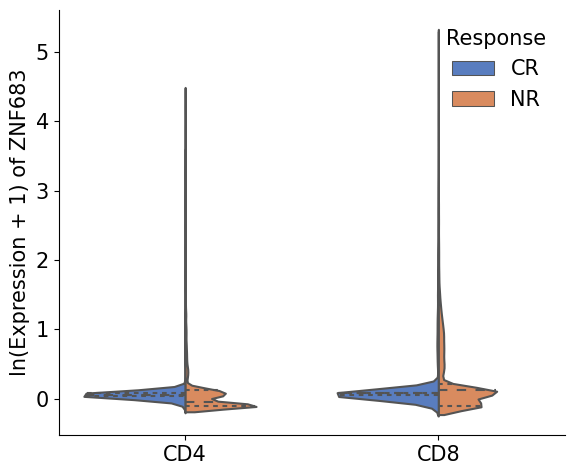

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


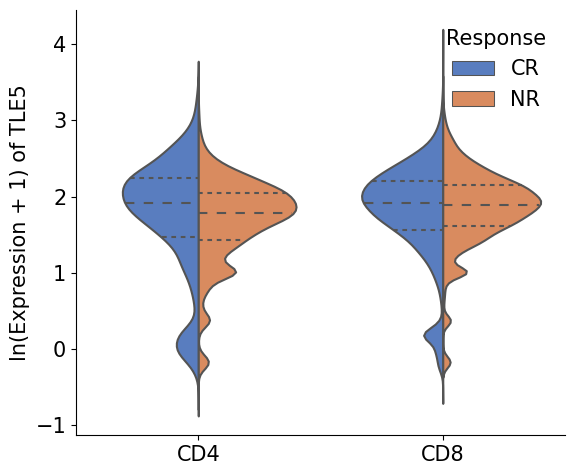

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


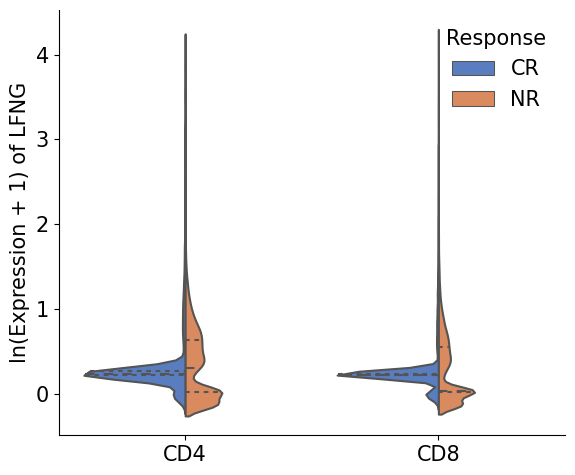

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


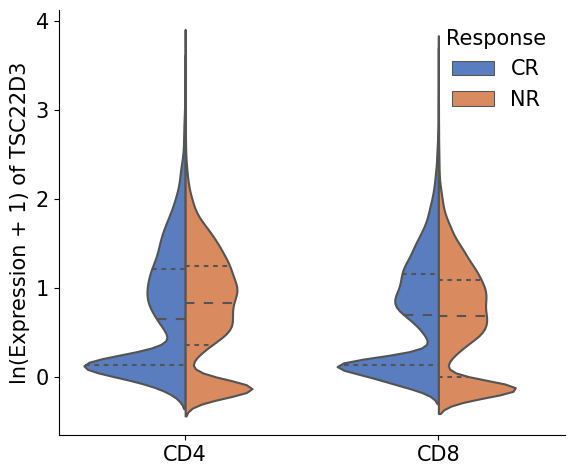

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


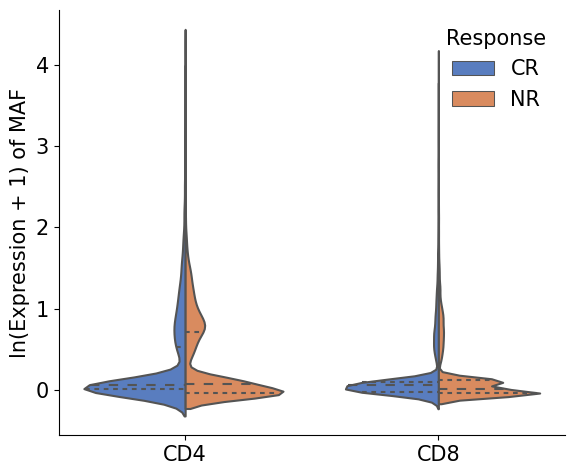

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


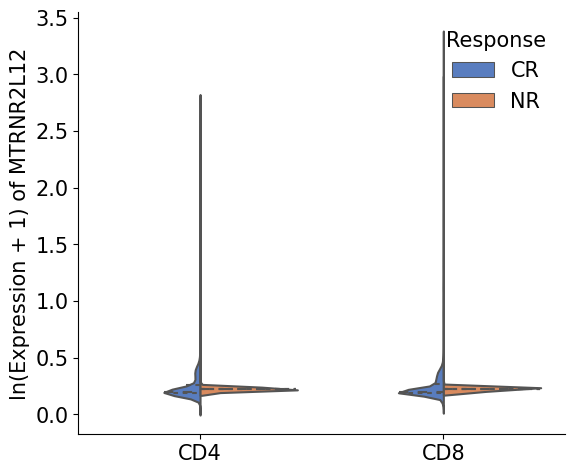

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


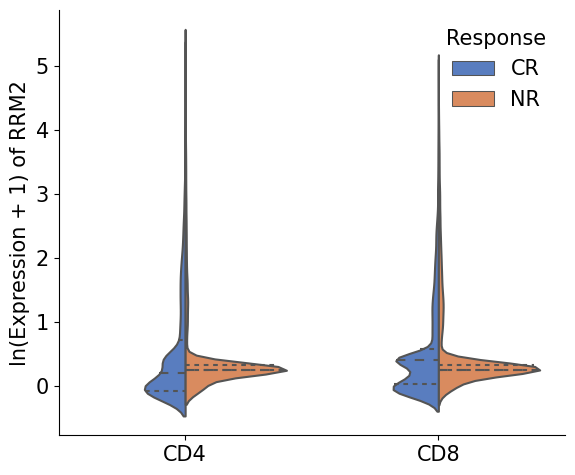

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


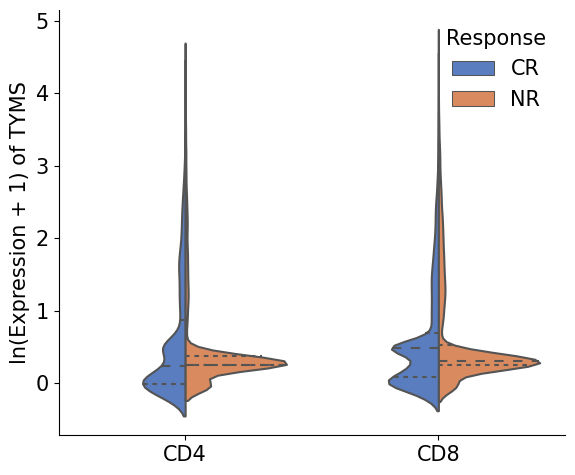

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


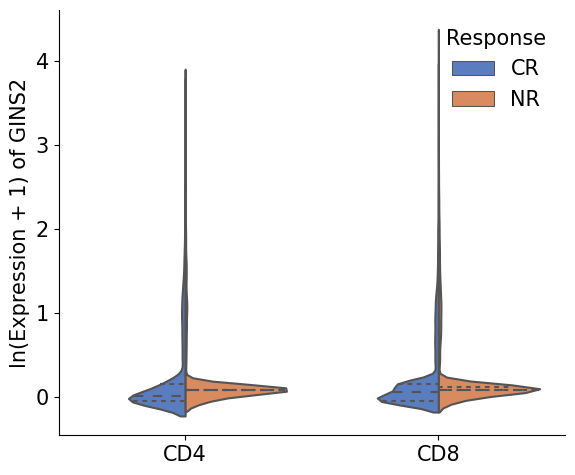

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


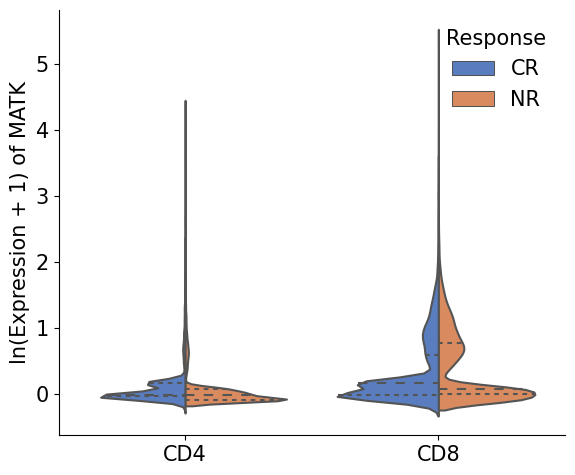

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


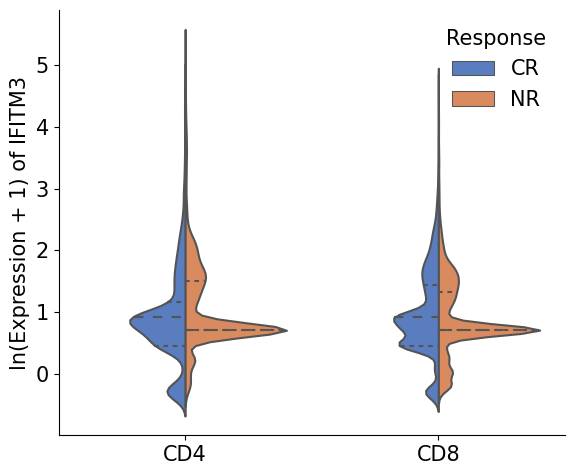

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


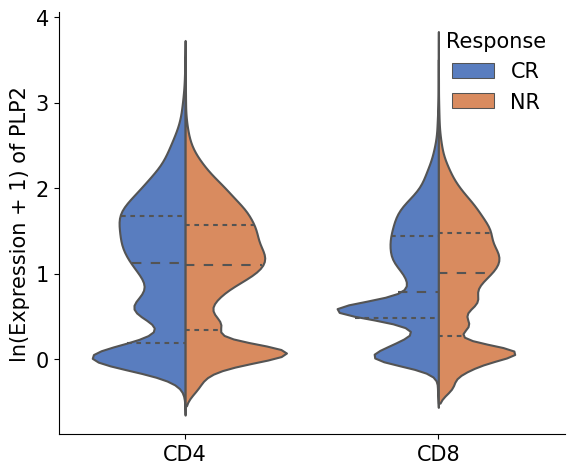

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


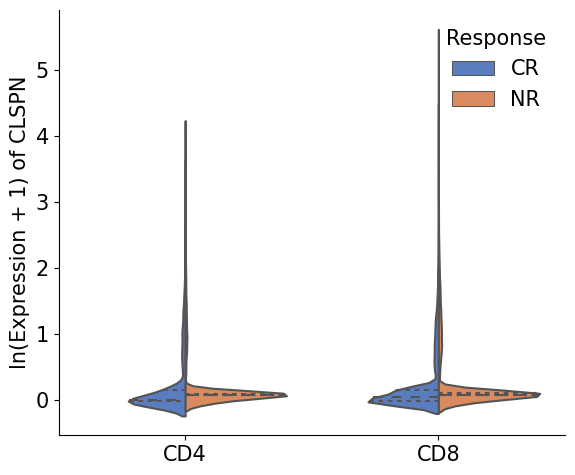

MSN is not present in the variable names. Please check your adata object.


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


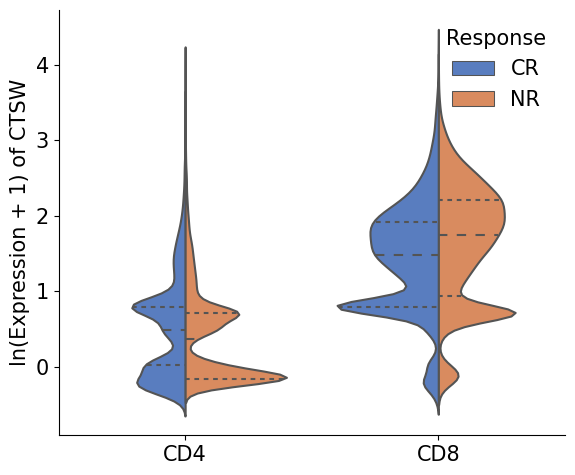

In [4]:
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt

# Load your dataset
adata = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_D7sorted_CD4_CD8A_highly_variable_combat_CR_NR.h5ad')

# Filter data based on your conditions
#mask = adata.obs['leiden_0.9'].isin(['3', '13', '14', '15']) | ((adata.obs['leiden_0.9'].isin(['1', '5', '10', '11'])) & (adata.obs['cell_type'] == 'CD8'))
##mask = adata.obs['leiden_0.9'].isin(['3', '13', '14', '15'])
#adata = adata[mask].copy()

genes = [
    "PECAM1", "CD7", "FCER1G", "KLRB1",                             # Immune System and Cell Surface Markers
    "JUND", "ZNF683", "TLE5", "LFNG", "TSC22D3", "MAF",             # Transcription Factors and Gene Regulation
    "MTRNR2L12", "RRM2", "TYMS", "GINS2",                           # Mitochondrial and Cellular Metabolism
    "MATK",                                                         # Signal Transduction and Kinases
    "IFITM3",                                                       # Antiviral Response
    "PLP2", "CLSPN", "MSN", "CTSW"                                  # Cellular Structure and Adhesion
]  # Ensure variable names are correct and consistent
# Iterate over each gene in the list
for gene in genes:
    if gene in adata.var_names:
        # Convert to DataFrame for plotting
        df = adata.to_df()

        # Adding metadata from adata.obs
        df['cell_type'] = adata.obs['cell_type']
        df['response'] = adata.obs['response']

        # Plotting
        plt.figure(figsize=(6, 5))
        plt.rcParams.update({'font.size': 15})
        ax = sns.violinplot(data=df, x="cell_type", y=gene, hue="response", split=True, inner="quart", palette="muted")
        sns.despine()  # Remove the top and right spines
        plt.title(f'')
        plt.xlabel('')
        plt.ylabel(f'ln(Expression + 1) of {gene}')

        # Positioning the legend on the top left
        plt.legend(title='Response', frameon=False)
        plt.tight_layout()
        plt.savefig(f'/home/emma/result/CART/violinplot_all3_13_14_15/{gene}_clusters3_13_14_15_violinplot.png')
        plt.show()
    else:
        print(f"{gene} is not present in the variable names. Please check your adata object.")

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


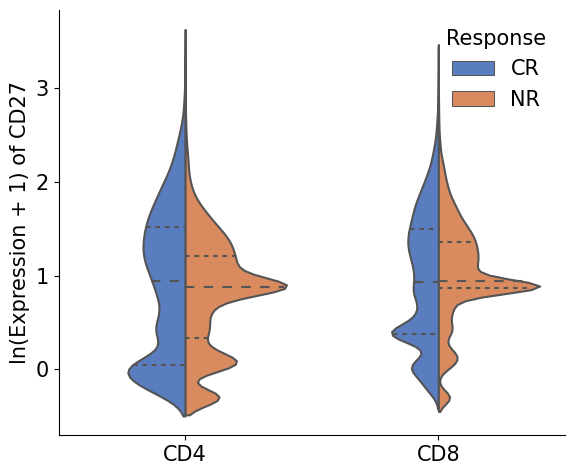

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


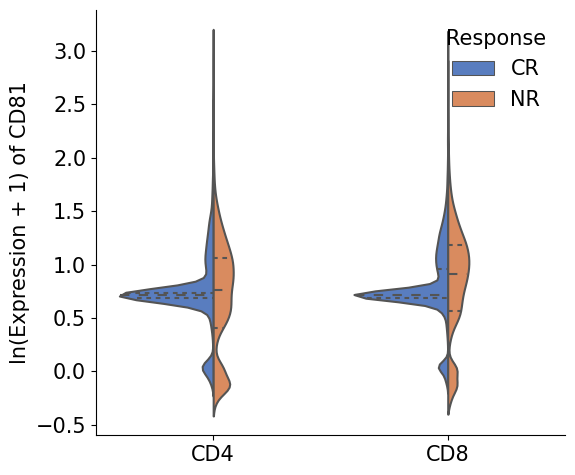

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


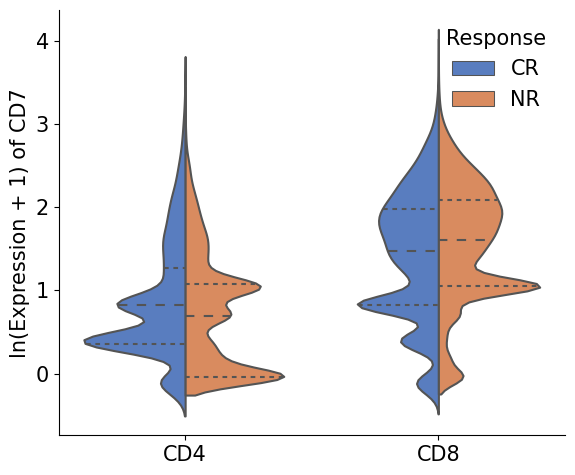

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


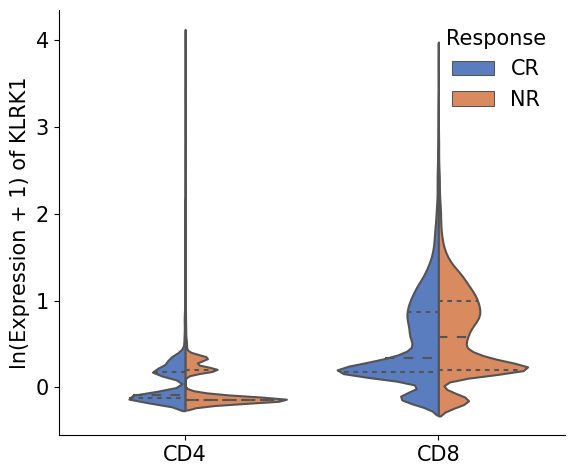

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


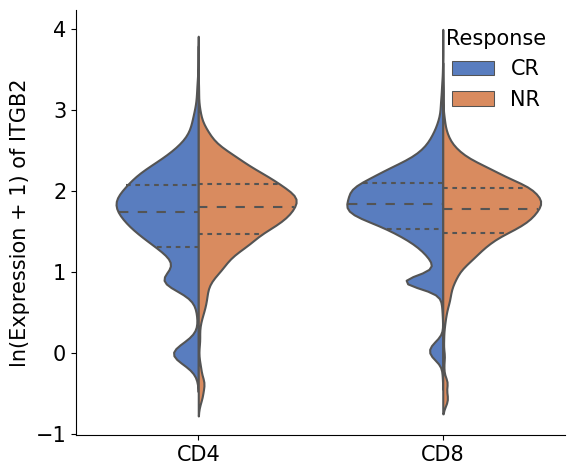

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


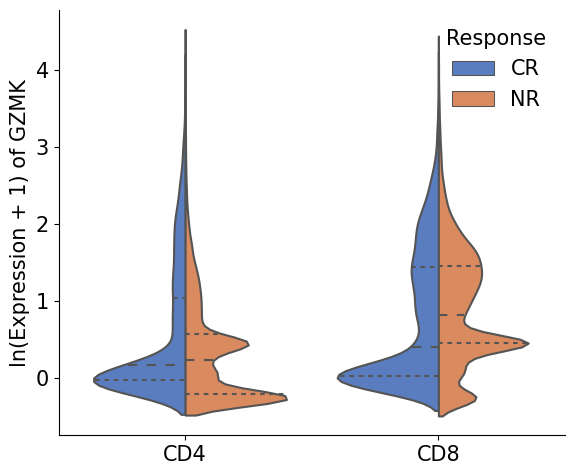

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


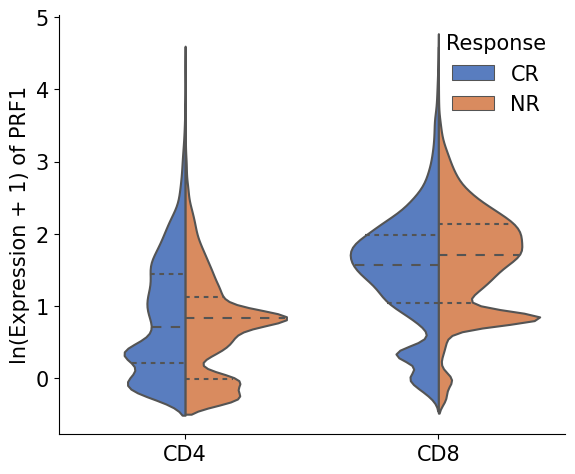

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


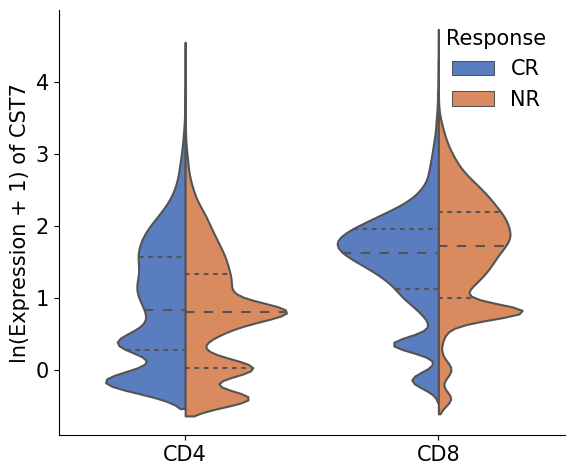

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


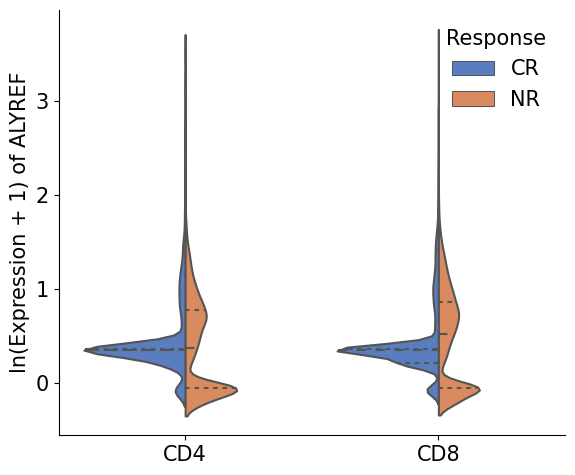

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


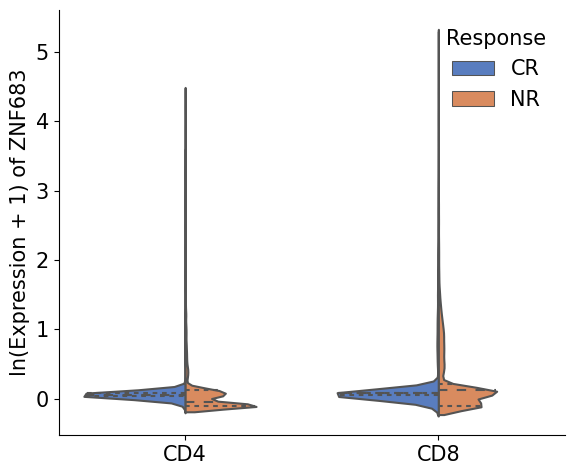

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


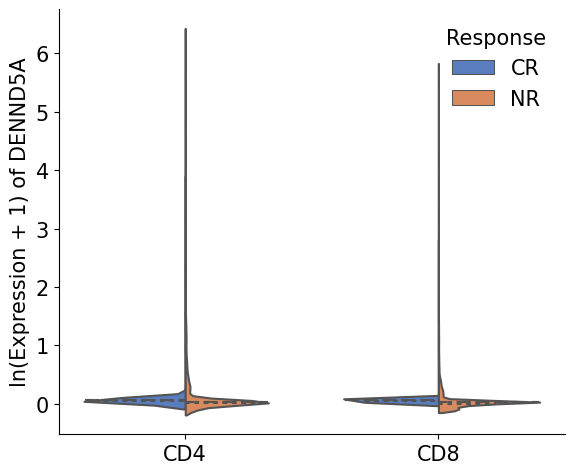

ARL4C is not present in the variable names. Please check your adata object.


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


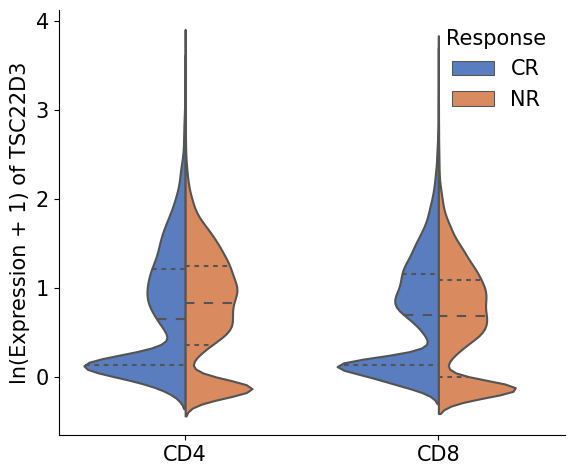

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


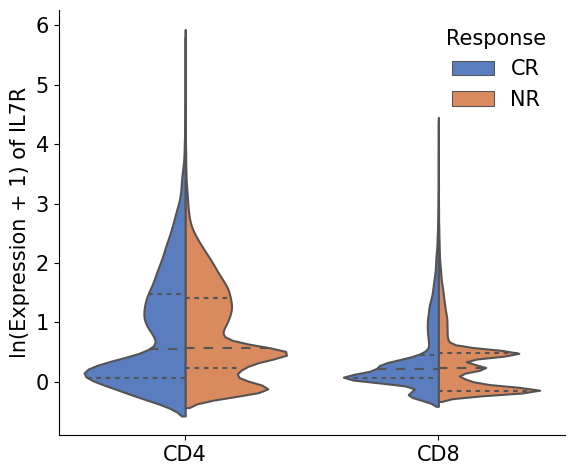

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


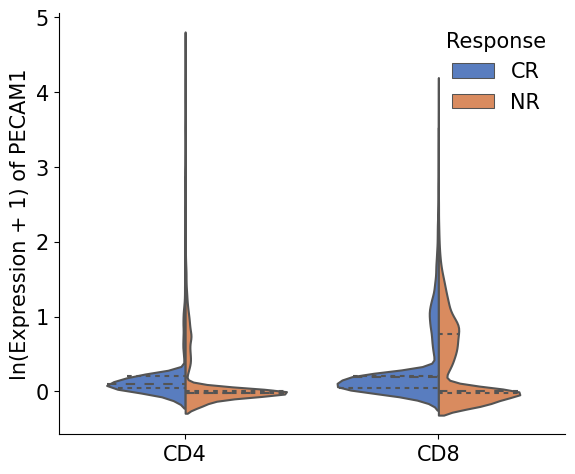

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


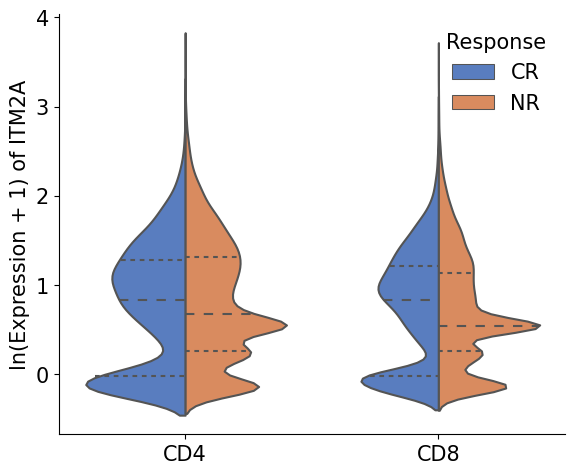

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


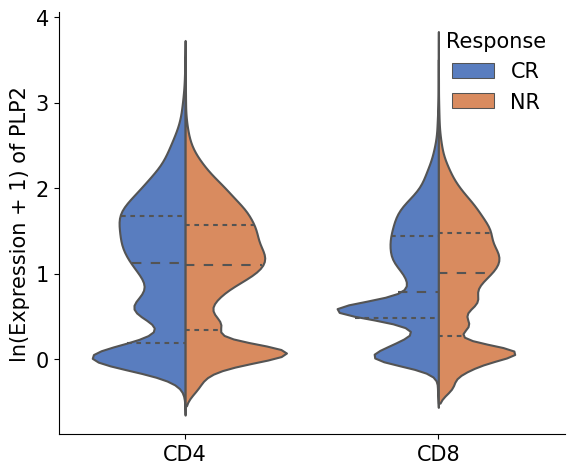

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


TMEM123 is not present in the variable names. Please check your adata object.


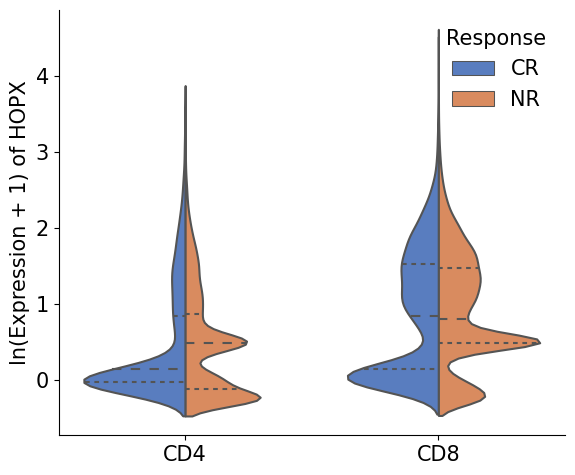

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


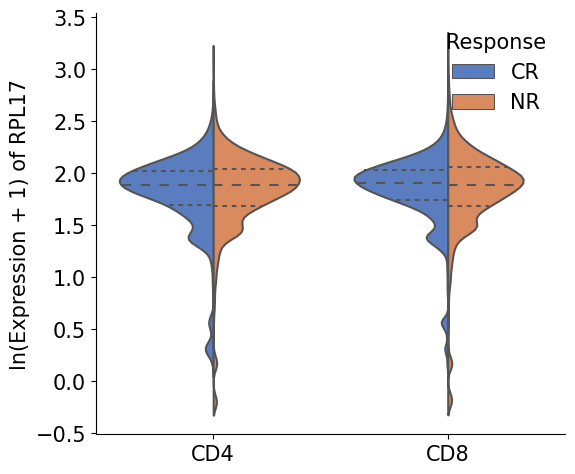

In [5]:
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt

# Load your dataset
adata = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_D7sorted_CD4_CD8A_highly_variable_combat_CR_NR.h5ad')

# Filter data based on your conditions
#mask = adata.obs['leiden_0.9'].isin(['3', '13', '14', '15']) | ((adata.obs['leiden_0.9'].isin(['1', '5', '10', '11'])) & (adata.obs['cell_type'] == 'CD8'))
##mask = adata.obs['leiden_0.9'].isin(['3', '13', '14', '15'])
#adata = adata[mask].copy()

genes = [
    "CD27", "CD81", "CD7", "KLRK1", "ITGB2",                          # Immune System and Cell Surface Markers
    "GZMK", "PRF1", "CST7",                                           # Cytotoxicity and Immune Response
    "ALYREF", "ZNF683",                                               # Transcription Factors and Gene Regulation
    "DENND5A", "ARL4C", "TSC22D3",                                    # Signal Transduction and Kinases
    "IL7R",                                                           # Cytokine Receptors
    "PECAM1", "ITM2A", "PLP2", "TMEM123", "HOPX", "RPL17"             # Cellular Structure and Metabolism
]
  # Ensure variable names are correct and consistent
# Iterate over each gene in the list
for gene in genes:
    if gene in adata.var_names:
        # Convert to DataFrame for plotting
        df = adata.to_df()

        # Adding metadata from adata.obs
        df['cell_type'] = adata.obs['cell_type']
        df['response'] = adata.obs['response']

        # Plotting
        plt.figure(figsize=(6, 5))
        plt.rcParams.update({'font.size': 15})
        ax = sns.violinplot(data=df, x="cell_type", y=gene, hue="response", split=True, inner="quart", palette="muted")
        sns.despine()  # Remove the top and right spines
        plt.title(f'')
        plt.xlabel('')
        plt.ylabel(f'ln(Expression + 1) of {gene}')

        # Positioning the legend on the top left
        plt.legend(title='Response', frameon=False)
        plt.tight_layout()
        plt.savefig(f'/home/emma/result/CART/violinplot_all3_13_14_15/{gene}_clusters3_13_14_15_violinplot.png')
        plt.show()
    else:
        print(f"{gene} is not present in the variable names. Please check your adata object.")

/tmp/ipykernel_3166425/3627766515.py:31: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  patient_gene_avg = df.groupby('barcode').agg({
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


PECAM1: p-value = 0.1965


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


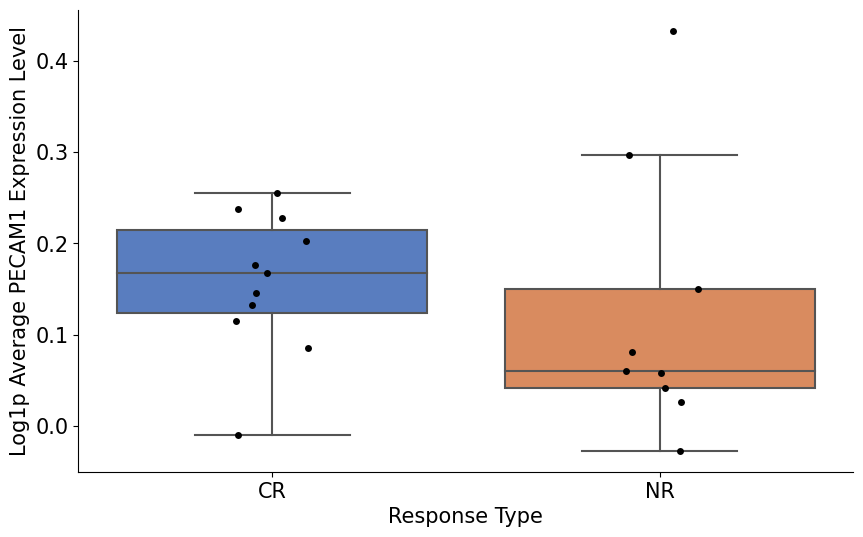

CD7: p-value = 0.0682


/tmp/ipykernel_3166425/3627766515.py:31: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  patient_gene_avg = df.groupby('barcode').agg({
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/minicon

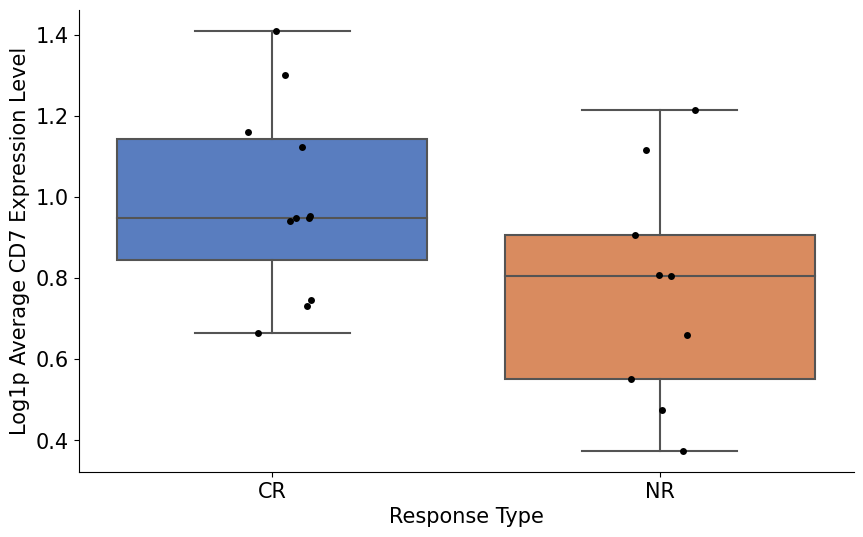

/tmp/ipykernel_3166425/3627766515.py:31: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  patient_gene_avg = df.groupby('barcode').agg({


FCER1G: p-value = 0.7040


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


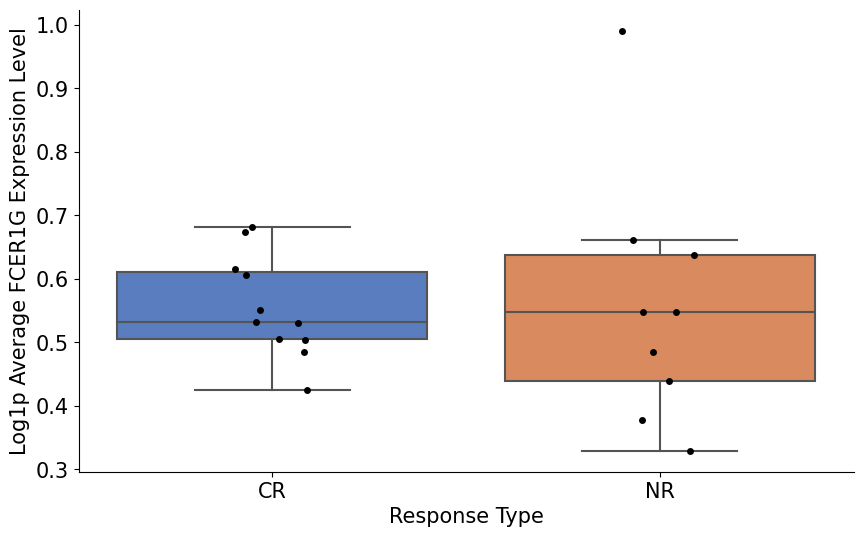

/tmp/ipykernel_3166425/3627766515.py:31: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  patient_gene_avg = df.groupby('barcode').agg({
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/minicon

KLRB1: p-value = 0.4033


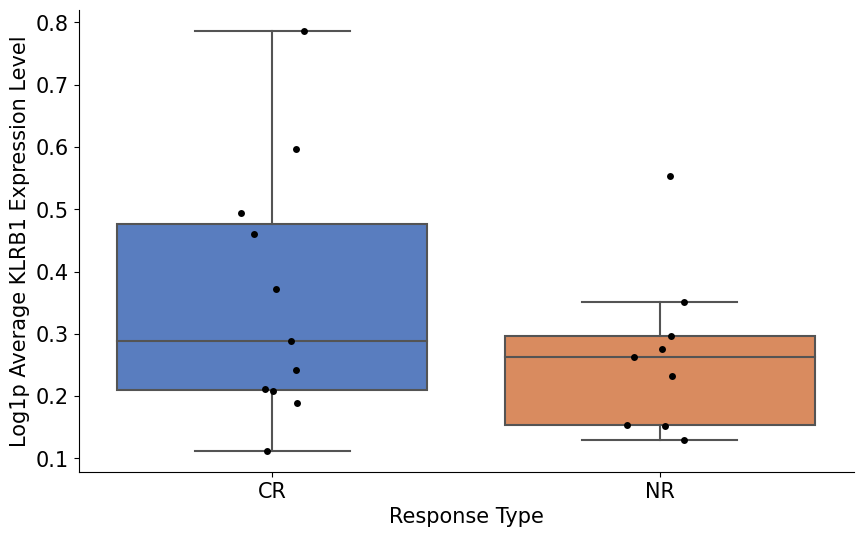

/tmp/ipykernel_3166425/3627766515.py:31: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  patient_gene_avg = df.groupby('barcode').agg({
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/minicon

JUND: p-value = 0.0682


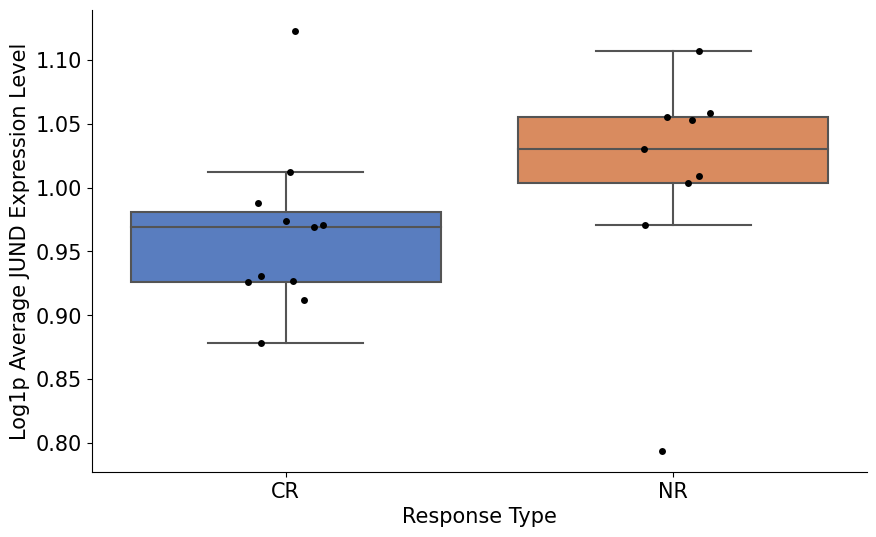

/tmp/ipykernel_3166425/3627766515.py:31: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  patient_gene_avg = df.groupby('barcode').agg({
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/minicon

ZNF683: p-value = 0.6485


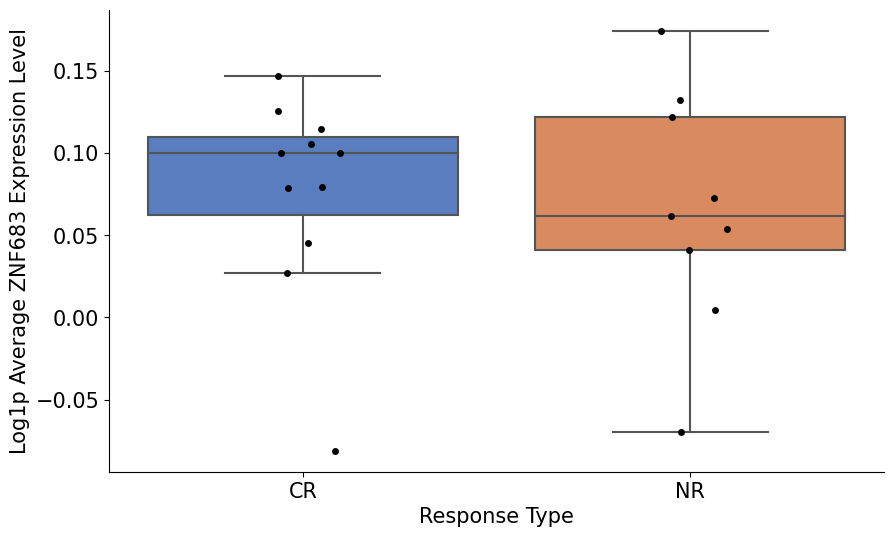

/tmp/ipykernel_3166425/3627766515.py:31: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  patient_gene_avg = df.groupby('barcode').agg({
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/minicon

TLE5: p-value = 0.6485


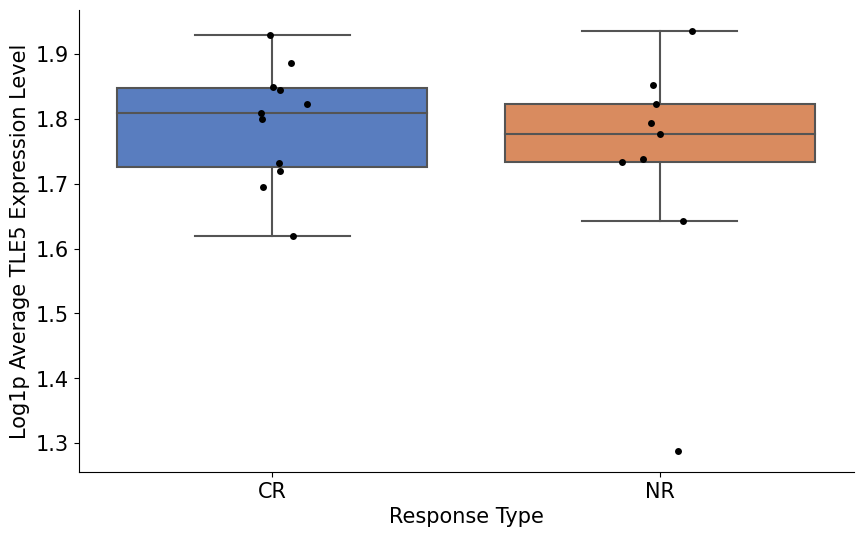

/tmp/ipykernel_3166425/3627766515.py:31: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  patient_gene_avg = df.groupby('barcode').agg({
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/minicon

LFNG: p-value = 0.7612


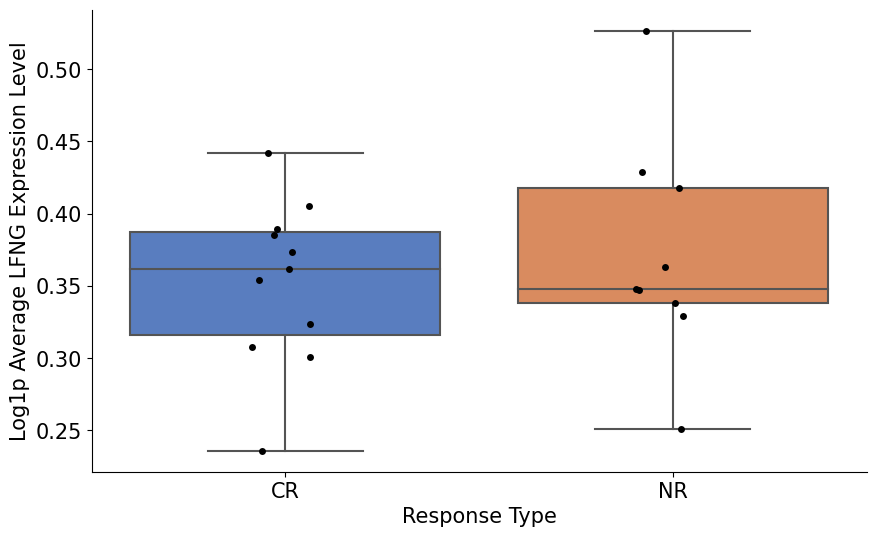

/tmp/ipykernel_3166425/3627766515.py:31: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  patient_gene_avg = df.groupby('barcode').agg({
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/minicon

TSC22D3: p-value = 0.7040


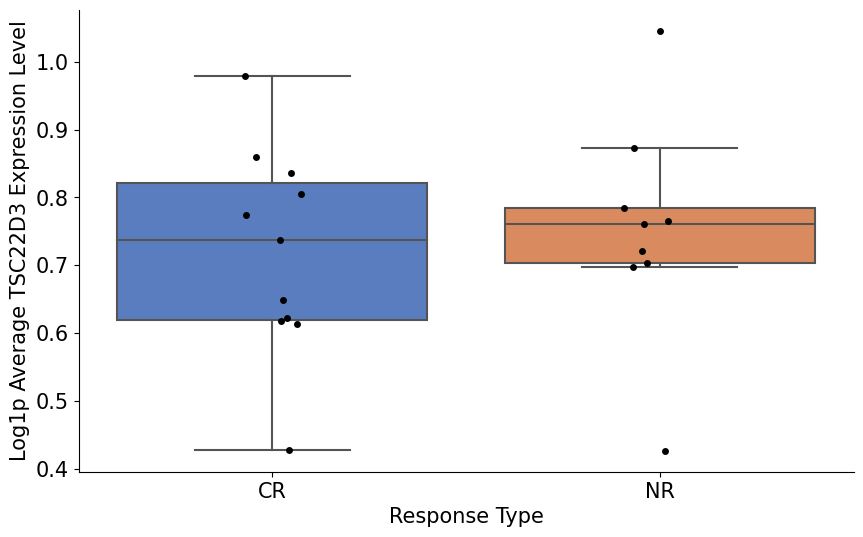

/tmp/ipykernel_3166425/3627766515.py:31: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  patient_gene_avg = df.groupby('barcode').agg({
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/minicon

MAF: p-value = 0.5949


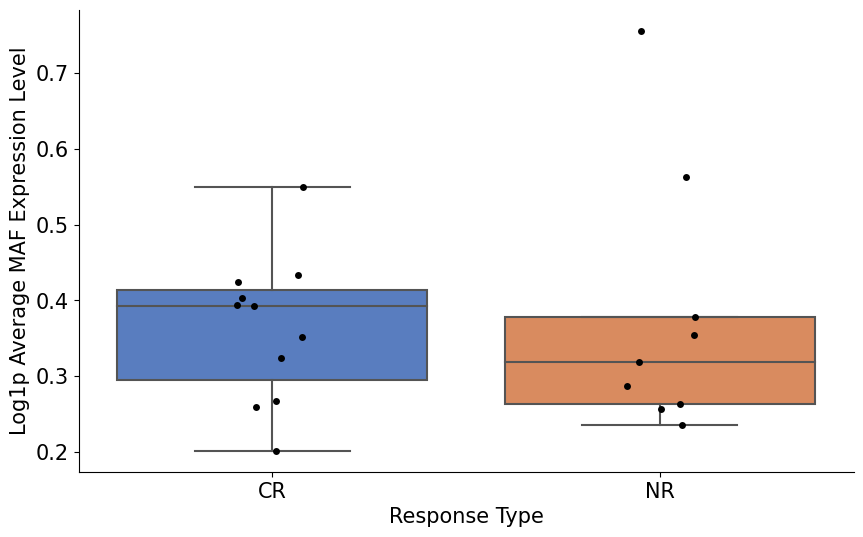

/tmp/ipykernel_3166425/3627766515.py:31: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  patient_gene_avg = df.groupby('barcode').agg({
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/minicon

MTRNR2L12: p-value = 0.1489


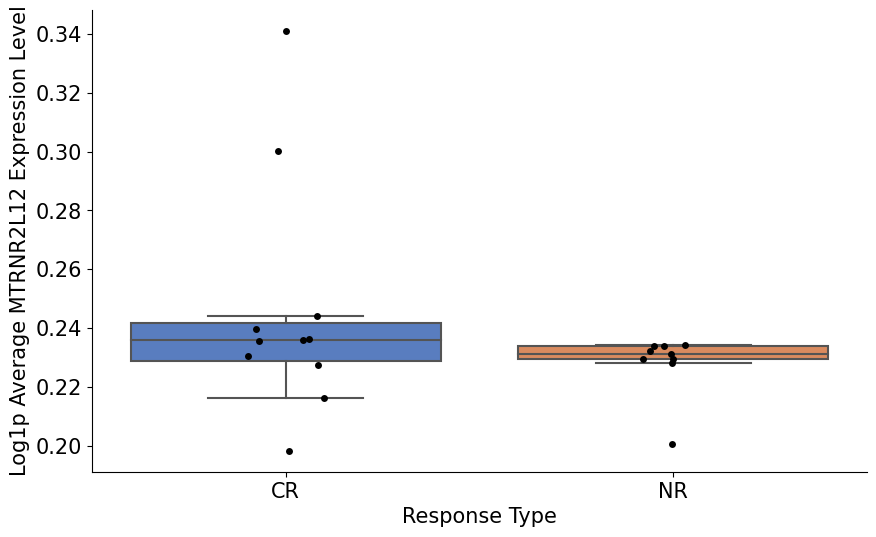

/tmp/ipykernel_3166425/3627766515.py:31: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  patient_gene_avg = df.groupby('barcode').agg({
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/minicon

RRM2: p-value = 0.1106


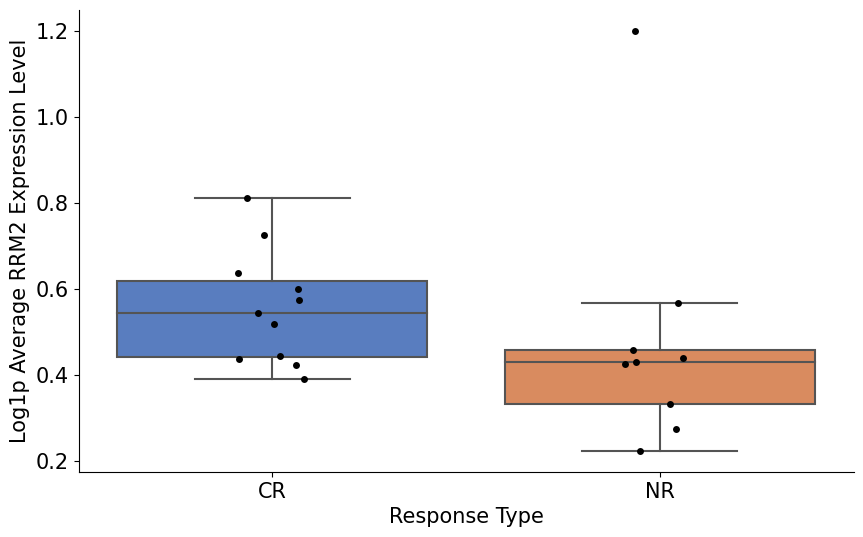

/tmp/ipykernel_3166425/3627766515.py:31: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  patient_gene_avg = df.groupby('barcode').agg({
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/minicon

TYMS: p-value = 0.1106


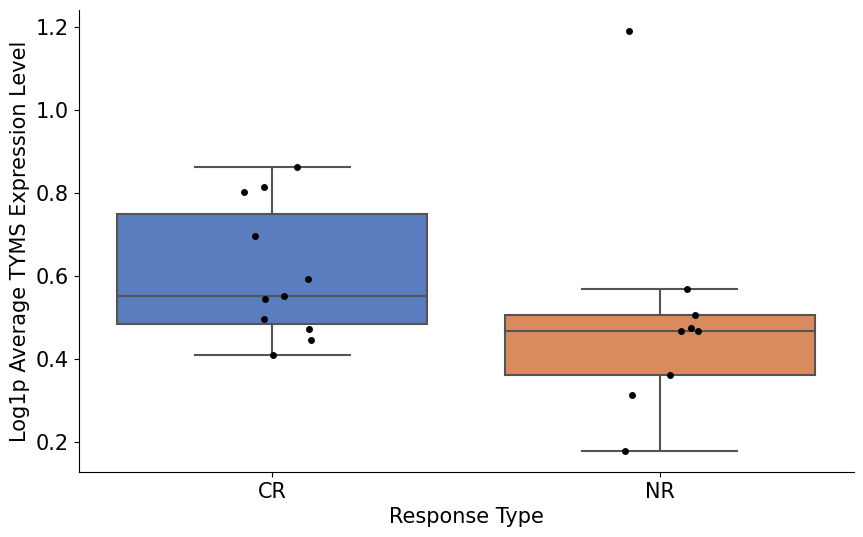

/tmp/ipykernel_3166425/3627766515.py:31: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  patient_gene_avg = df.groupby('barcode').agg({
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/minicon

GINS2: p-value = 0.1489


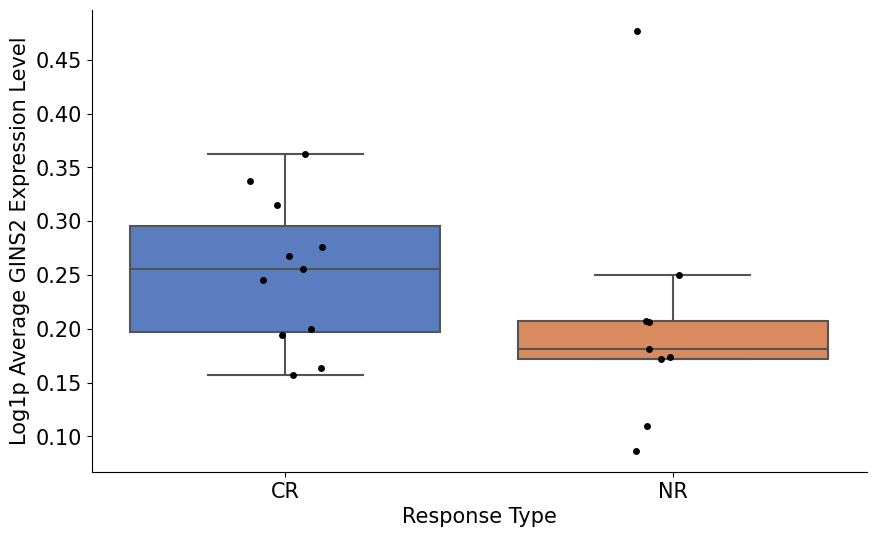

/tmp/ipykernel_3166425/3627766515.py:31: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  patient_gene_avg = df.groupby('barcode').agg({
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/minicon

MATK: p-value = 0.0946


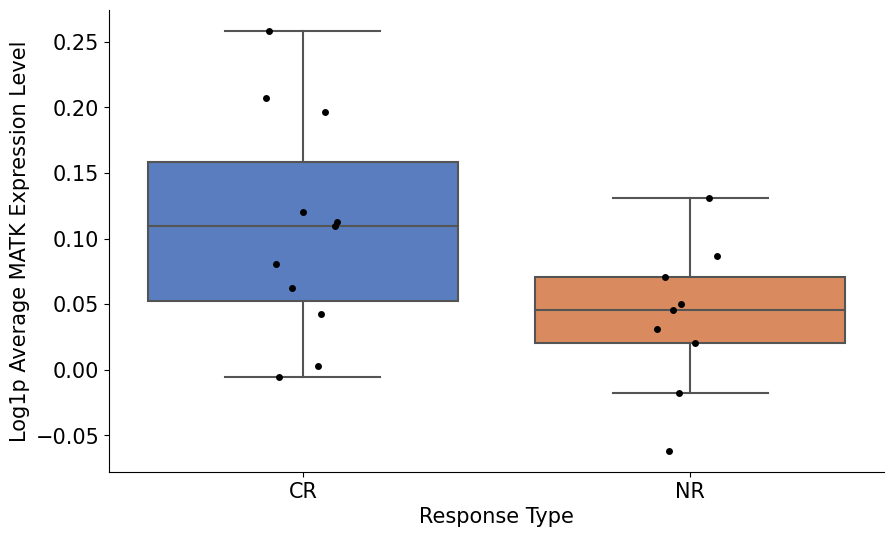

/tmp/ipykernel_3166425/3627766515.py:31: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  patient_gene_avg = df.groupby('barcode').agg({
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/minicon

IFITM3: p-value = 0.6485


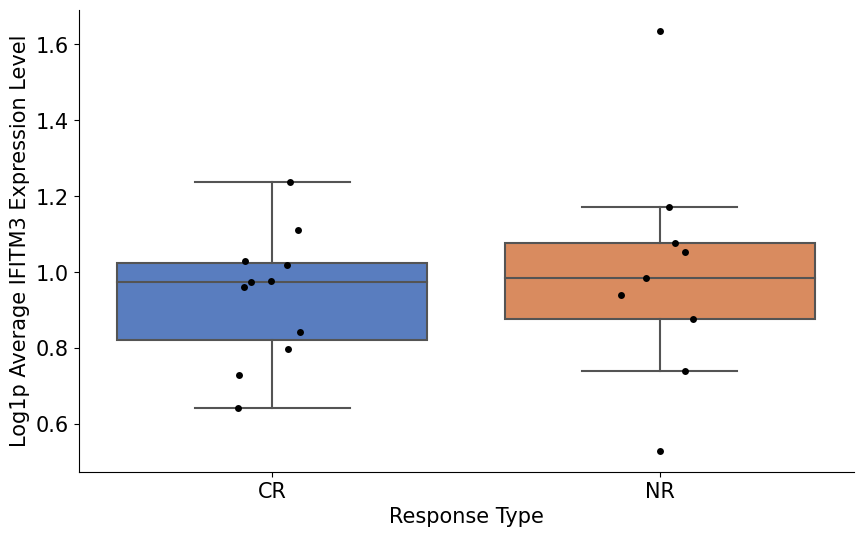

/tmp/ipykernel_3166425/3627766515.py:31: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  patient_gene_avg = df.groupby('barcode').agg({
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/minicon

PLP2: p-value = 0.6485


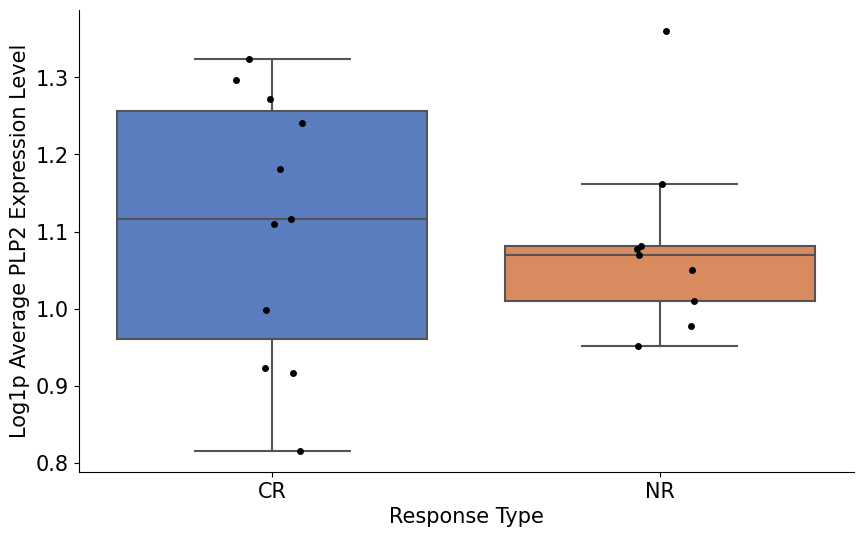

/tmp/ipykernel_3166425/3627766515.py:31: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  patient_gene_avg = df.groupby('barcode').agg({
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/minicon

CLSPN: p-value = 0.0334


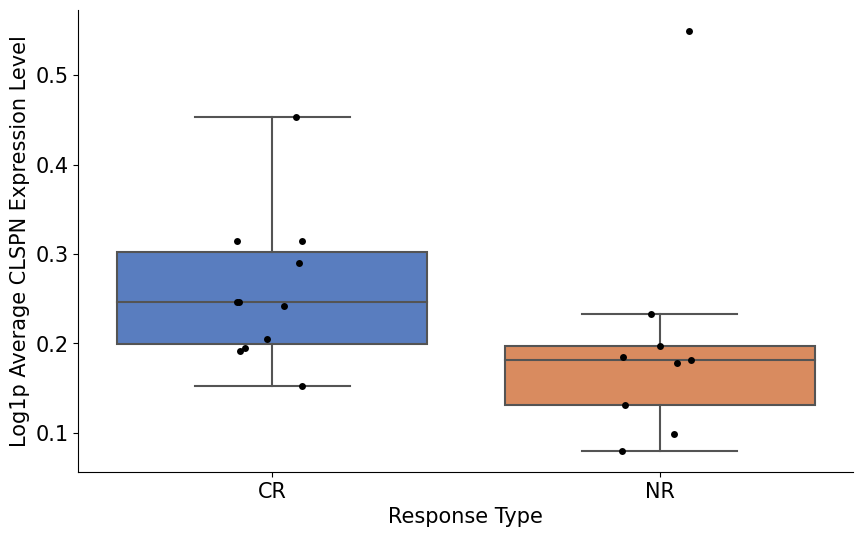

/tmp/ipykernel_3166425/3627766515.py:31: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  patient_gene_avg = df.groupby('barcode').agg({
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/minicon

CTSW: p-value = 0.3619


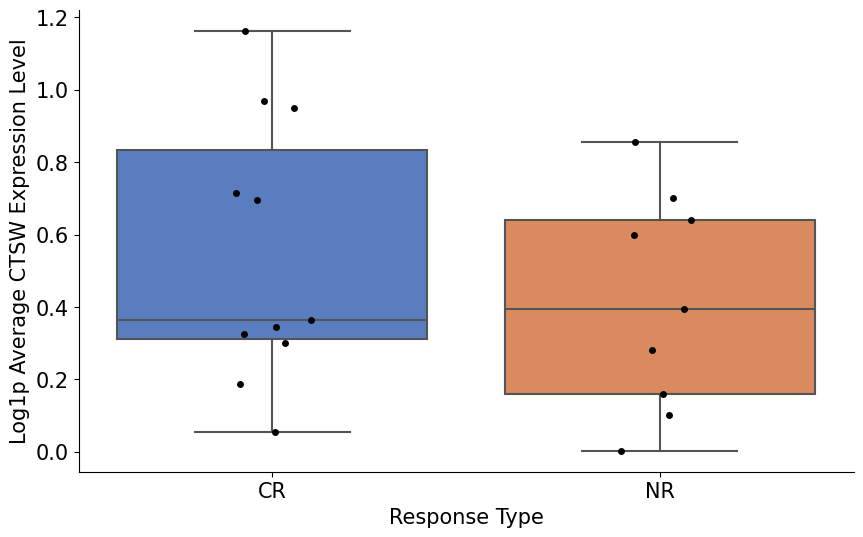

In [16]:
import scanpy as sc
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import mannwhitneyu

# Load your dataset
adata = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_D7sorted_CD4_CD8A_highly_variable_combat_CR_NR.h5ad')
adata = adata[adata.obs['cell_type'] == 'CD4'].copy()

# List of genes to check
all_genes = [
    "PECAM1", "CD7", "FCER1G", "KLRB1",                             # Immune System and Cell Surface Markers
    "JUND", "ZNF683", "TLE5", "LFNG", "TSC22D3", "MAF",             # Transcription Factors and Gene Regulation
    "MTRNR2L12", "RRM2", "TYMS", "GINS2",                           # Mitochondrial and Cellular Metabolism
    "MATK",                                                         # Signal Transduction and Kinases
    "IFITM3",                                                       # Antiviral Response
    "PLP2", "CLSPN", "MSN", "CTSW"                                  # Cellular Structure and Adhesion
]

# Iterate through each gene and plot its expression
for gene in all_genes:
    if gene in adata.var_names:
        # Get the gene expression data
        adata.obs[f'{gene}_expression'] = adata[:, gene].X.toarray().flatten()  # Adjust if using a sparse matrix
        
        # Create a DataFrame with patient IDs, their response, and gene expression
        df = adata.obs[['barcode', 'response', f'{gene}_expression']]
        
        # Group by patient ID and calculate average gene expression
        patient_gene_avg = df.groupby('barcode').agg({
            'response': 'first',  # Assuming response is the same for all entries of the same patient
            f'{gene}_expression': 'mean'
        }).reset_index()

        # Calculate p-value using Mann-Whitney U test
        responders = patient_gene_avg[patient_gene_avg['response'] == 'CR'][f'{gene}_expression']
        non_responders = patient_gene_avg[patient_gene_avg['response'] == 'NR'][f'{gene}_expression']
        stat, p_value = mannwhitneyu(responders, non_responders)
        print(f"{gene}: p-value = {p_value:.4f}")
        # Plotting
        plt.figure(figsize=(10, 6))
        ax = plt.gca()
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        sns.boxplot(data=patient_gene_avg, x='response', y=f'{gene}_expression', palette='muted', showfliers=False)
        sns.stripplot(data=patient_gene_avg, x='response', y=f'{gene}_expression', color='black', jitter=True, size=5)
        plt.xlabel('Response Type')
        plt.ylabel(f'Log1p Average {gene} Expression Level')
        #plt.title(f'Log1p Average {gene} Expression Levels by Patient Response\np-value = {p_value:.4f}')
        plt.show()


/tmp/ipykernel_3166425/650804808.py:30: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  patient_gene_avg = df.groupby('barcode').agg({


CD27: p-value = 0.5949


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


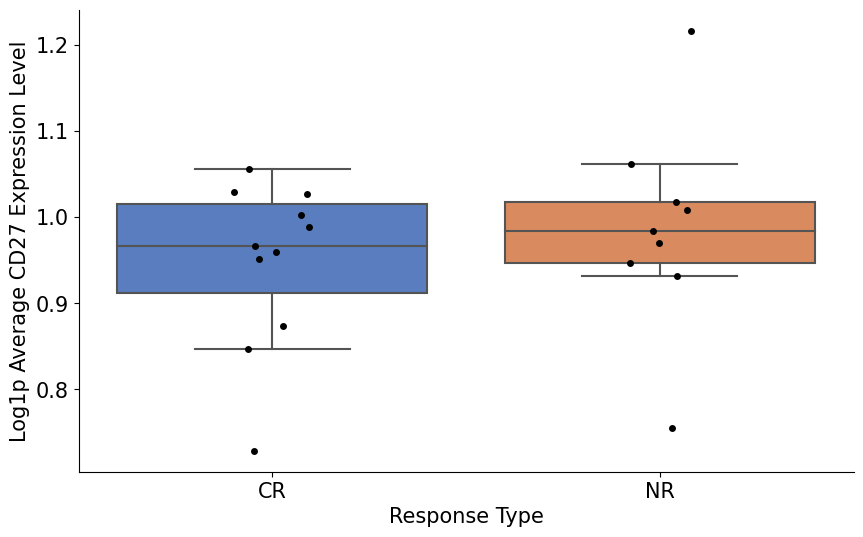

/tmp/ipykernel_3166425/650804808.py:30: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  patient_gene_avg = df.groupby('barcode').agg({
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/minicond

CD81: p-value = 0.0122


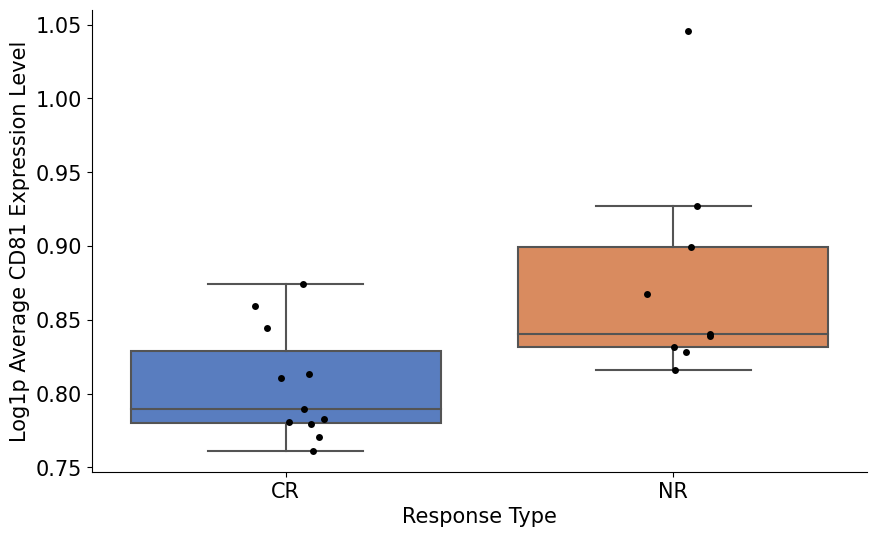

CD7: p-value = 0.0334


/tmp/ipykernel_3166425/650804808.py:30: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  patient_gene_avg = df.groupby('barcode').agg({
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/minicond

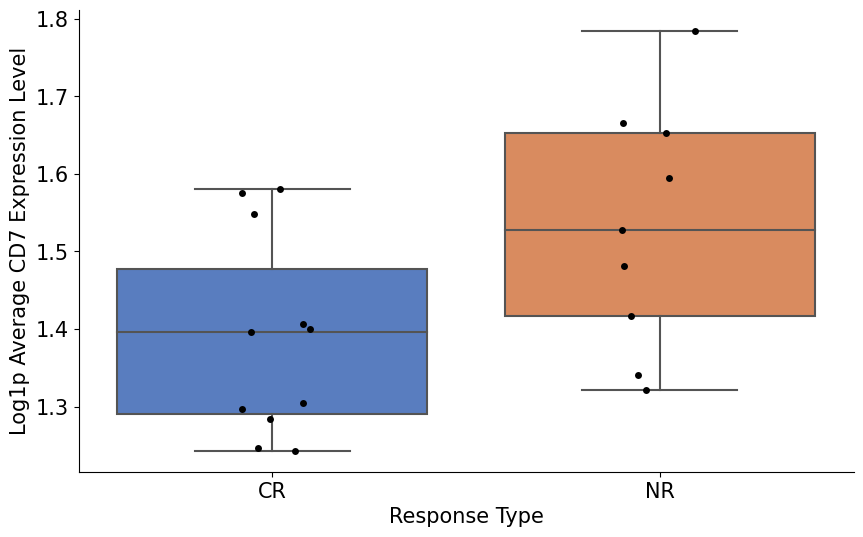

/tmp/ipykernel_3166425/650804808.py:30: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  patient_gene_avg = df.groupby('barcode').agg({


KLRK1: p-value = 0.4033


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


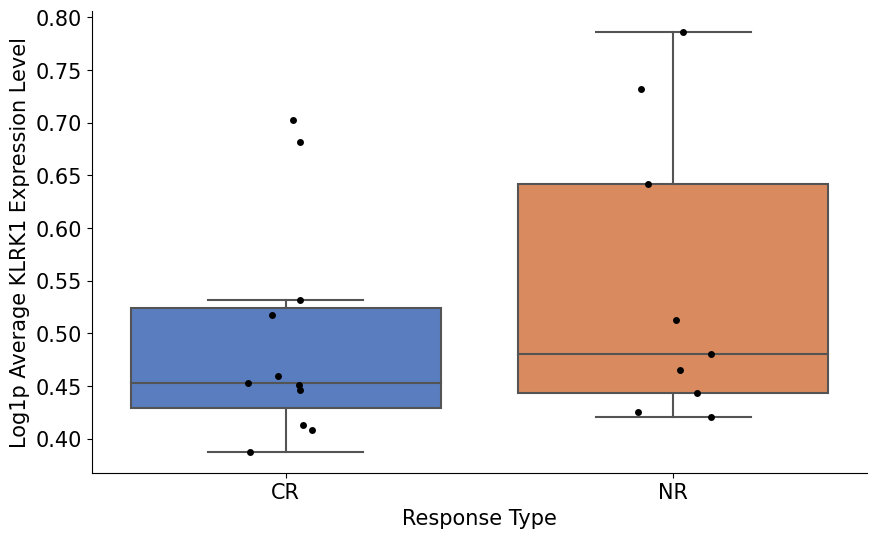

/tmp/ipykernel_3166425/650804808.py:30: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  patient_gene_avg = df.groupby('barcode').agg({
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


ITGB2: p-value = 0.8197


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


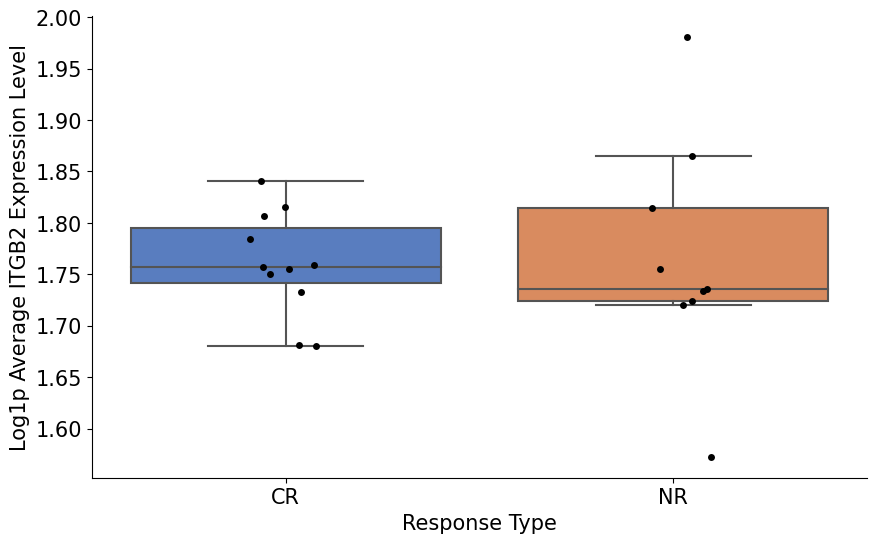

GZMK: p-value = 0.0482


/tmp/ipykernel_3166425/650804808.py:30: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  patient_gene_avg = df.groupby('barcode').agg({
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/minicond

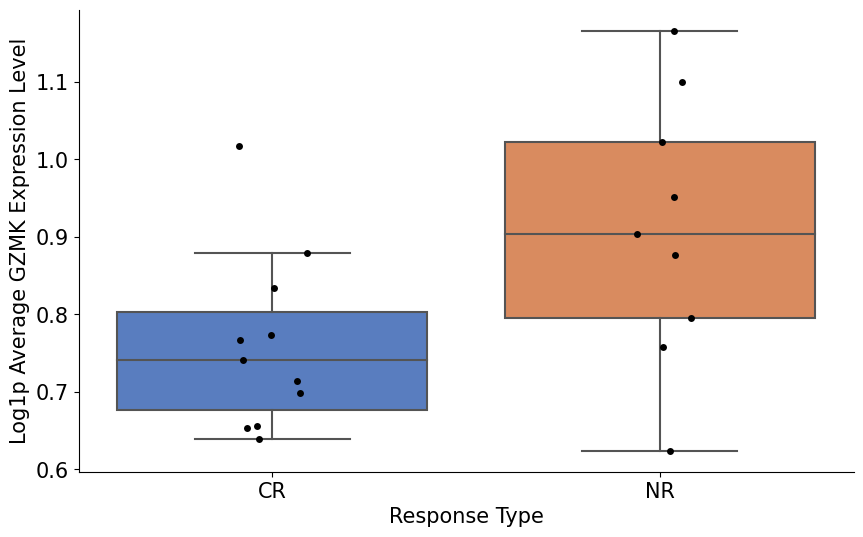

PRF1: p-value = 0.0276


/tmp/ipykernel_3166425/650804808.py:30: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  patient_gene_avg = df.groupby('barcode').agg({
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/minicond

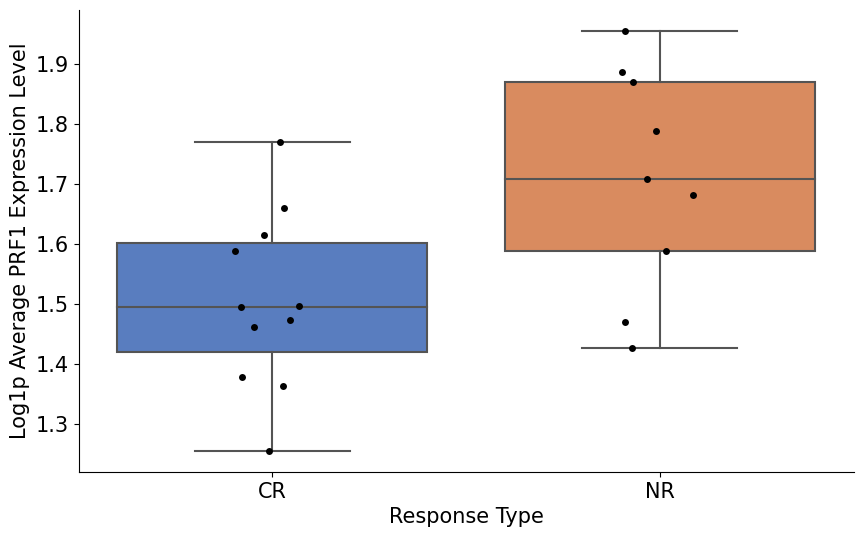

/tmp/ipykernel_3166425/650804808.py:30: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  patient_gene_avg = df.groupby('barcode').agg({
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


CST7: p-value = 0.0334


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


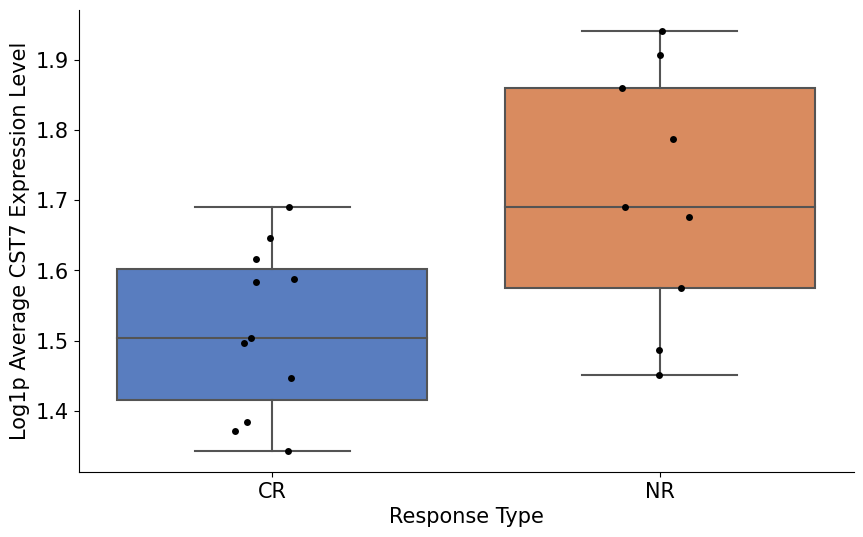

/tmp/ipykernel_3166425/650804808.py:30: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  patient_gene_avg = df.groupby('barcode').agg({


ALYREF: p-value = 0.0682

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


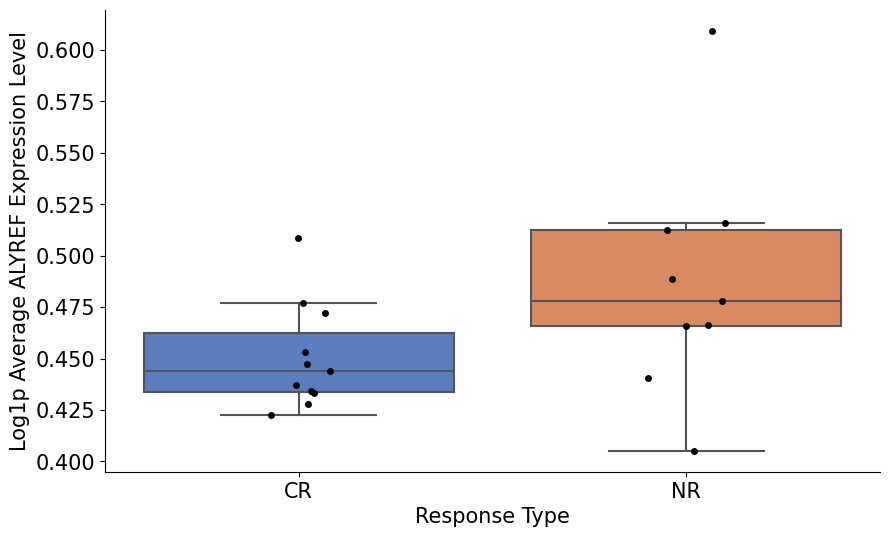

ZNF683: p-value = 0.2545


/tmp/ipykernel_3166425/650804808.py:30: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  patient_gene_avg = df.groupby('barcode').agg({
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/minicond

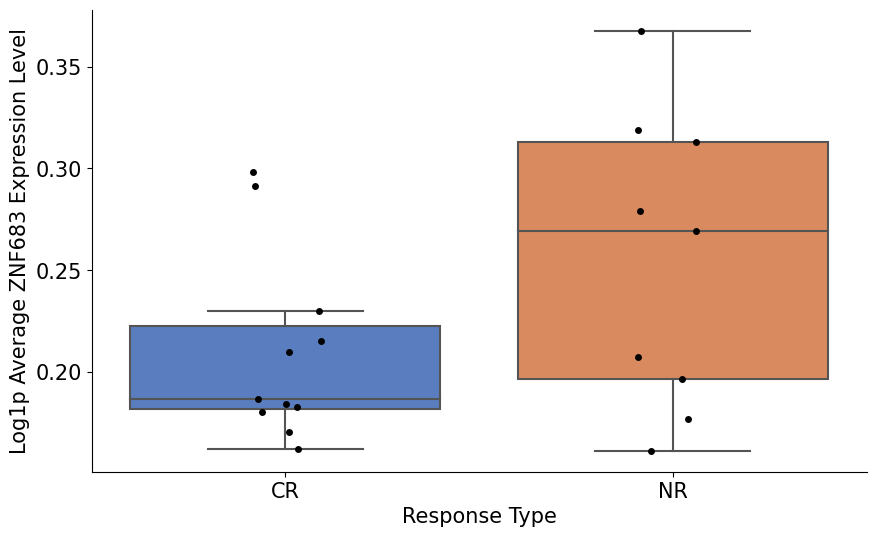

/tmp/ipykernel_3166425/650804808.py:30: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  patient_gene_avg = df.groupby('barcode').agg({


DENND5A: p-value = 0.0575


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


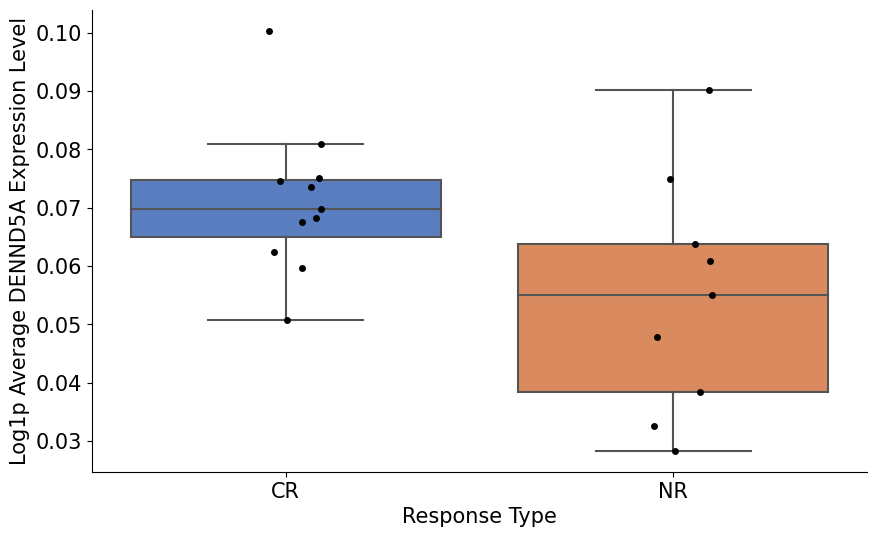

/tmp/ipykernel_3166425/650804808.py:30: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  patient_gene_avg = df.groupby('barcode').agg({
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


TSC22D3: p-value = 0.2241


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


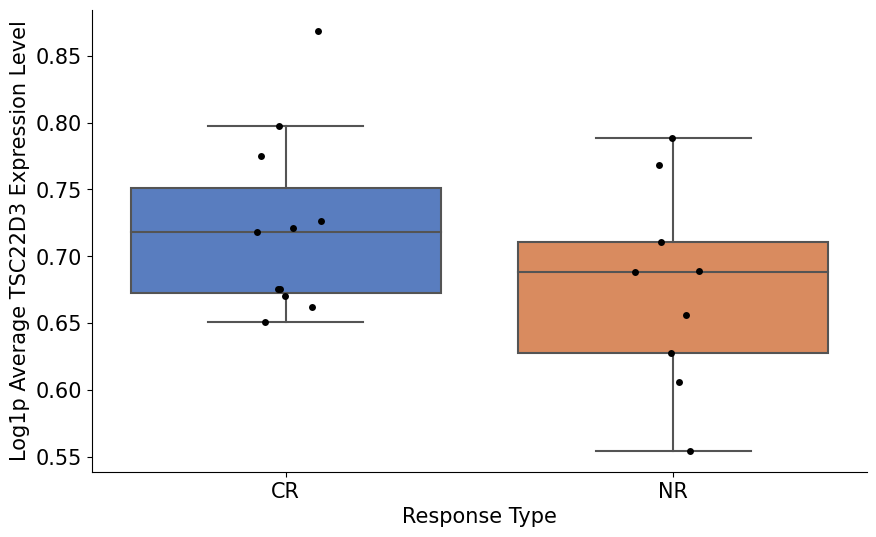

/tmp/ipykernel_3166425/650804808.py:30: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  patient_gene_avg = df.groupby('barcode').agg({


IL7R: p-value = 0.0402

/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


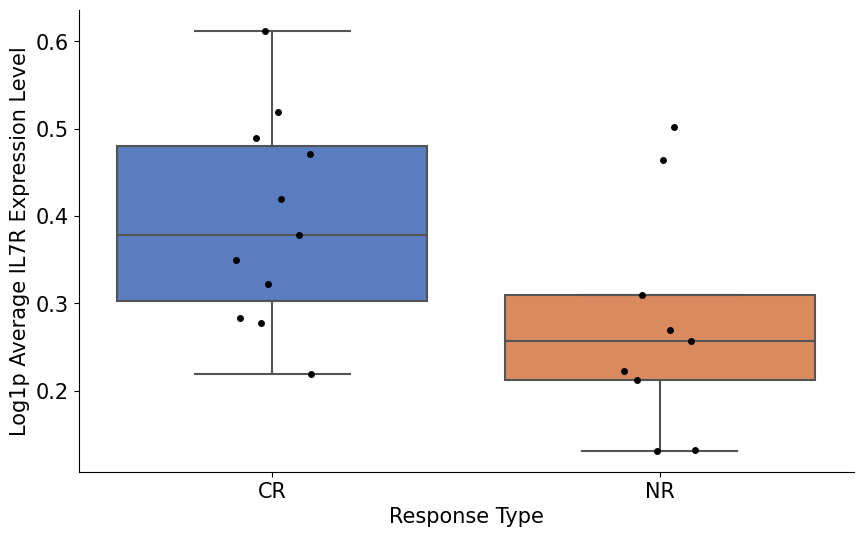

/tmp/ipykernel_3166425/650804808.py:30: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  patient_gene_avg = df.groupby('barcode').agg({


PECAM1: p-value = 0.1965


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


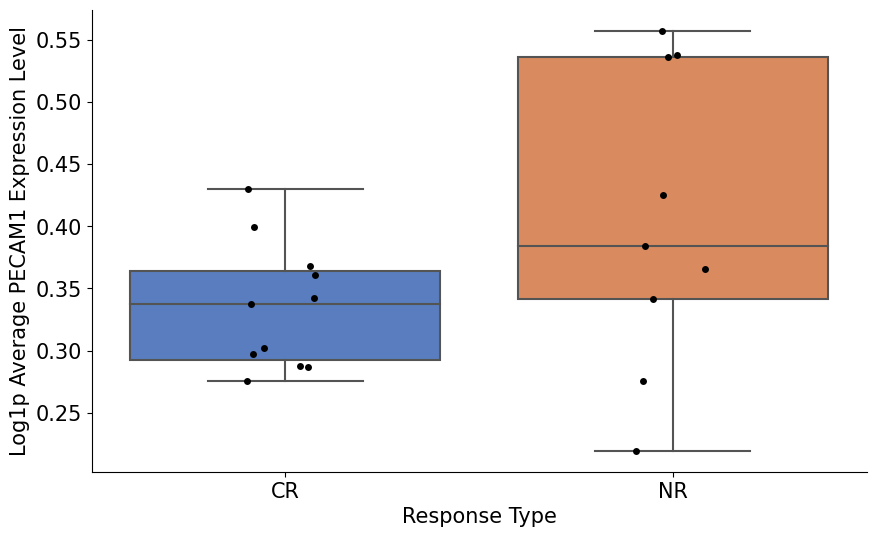

ITM2A: p-value = 0.0806


/tmp/ipykernel_3166425/650804808.py:30: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  patient_gene_avg = df.groupby('barcode').agg({
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/minicond

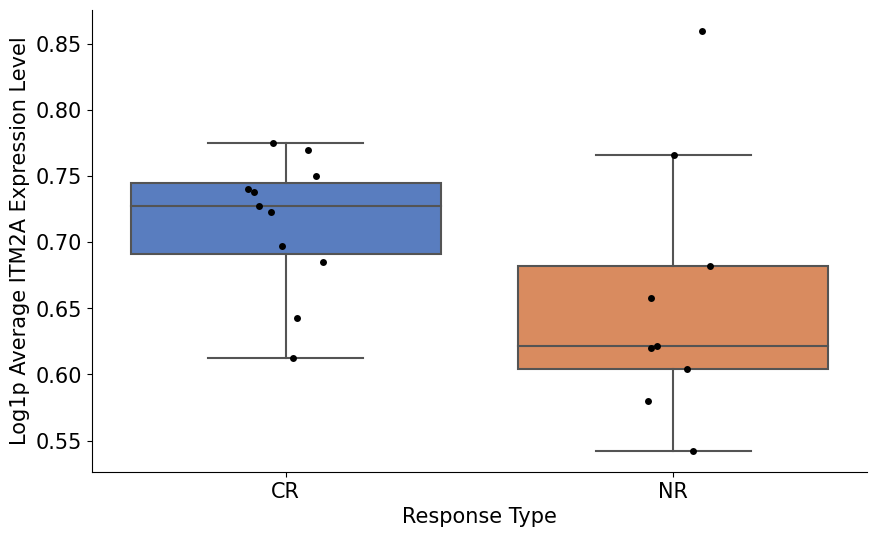

/tmp/ipykernel_3166425/650804808.py:30: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  patient_gene_avg = df.groupby('barcode').agg({
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


PLP2: p-value = 0.4474


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


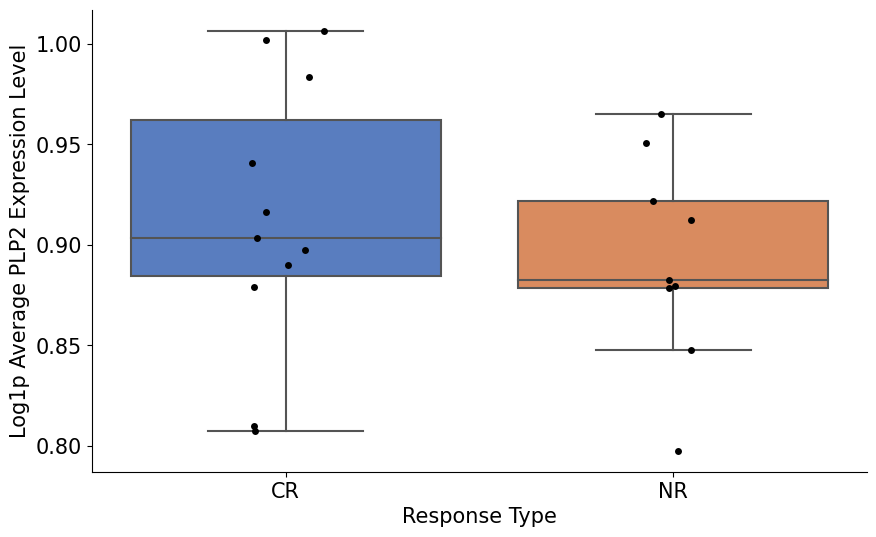

/tmp/ipykernel_3166425/650804808.py:30: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  patient_gene_avg = df.groupby('barcode').agg({


HOPX: p-value = 0.2545


/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


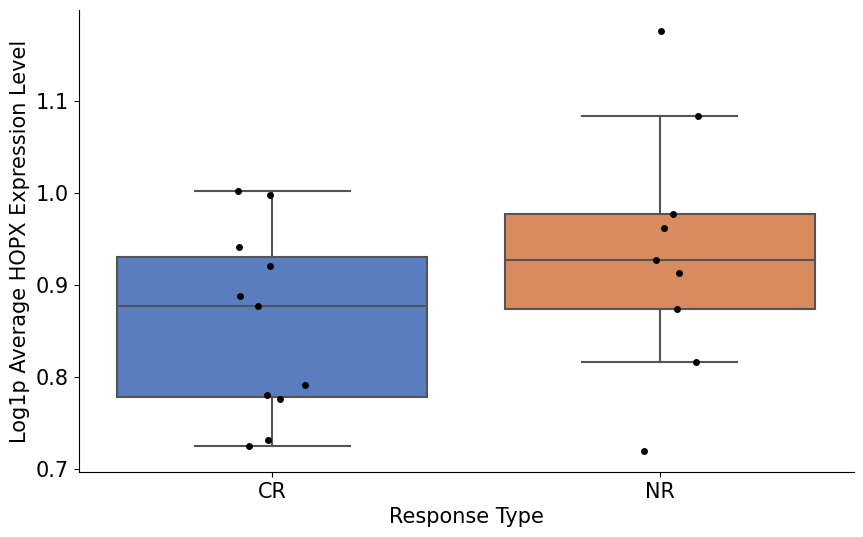

/tmp/ipykernel_3166425/650804808.py:30: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  patient_gene_avg = df.groupby('barcode').agg({
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
/home/emma/miniconda3/envs/serverGPU/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/emma/minicond

RPL17: p-value = 0.6485


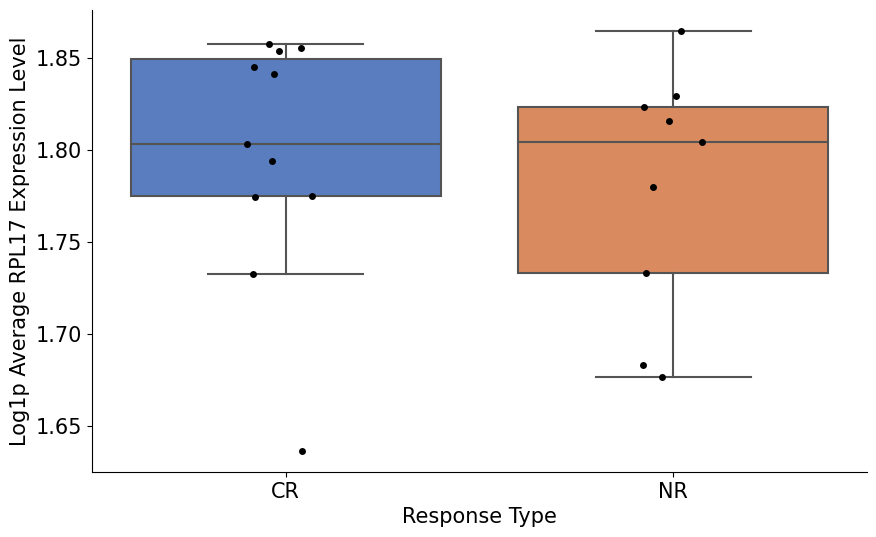

In [17]:
import scanpy as sc
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load your dataset
adata = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_D7sorted_CD4_CD8A_highly_variable_combat_CR_NR.h5ad')
adata = adata[adata.obs['cell_type'] == 'CD8'].copy()
# List of genes to check
all_genes = [
    "CD27", "CD81", "CD7", "KLRK1", "ITGB2",                          # Immune System and Cell Surface Markers
    "GZMK", "PRF1", "CST7",                                           # Cytotoxicity and Immune Response
    "ALYREF", "ZNF683",                                               # Transcription Factors and Gene Regulation
    "DENND5A", "ARL4C", "TSC22D3",                                    # Signal Transduction and Kinases
    "IL7R",                                                           # Cytokine Receptors
    "PECAM1", "ITM2A", "PLP2", "TMEM123", "HOPX", "RPL17"             # Cellular Structure and Metabolism
]

# Iterate through each gene and plot its expression
# Iterate through each gene and plot its expression
for gene in all_genes:
    if gene in adata.var_names:
        # Get the gene expression data
        adata.obs[f'{gene}_expression'] = adata[:, gene].X.toarray().flatten()  # Adjust if using a sparse matrix
        
        # Create a DataFrame with patient IDs, their response, and gene expression
        df = adata.obs[['barcode', 'response', f'{gene}_expression']]
        
        # Group by patient ID and calculate average gene expression
        patient_gene_avg = df.groupby('barcode').agg({
            'response': 'first',  # Assuming response is the same for all entries of the same patient
            f'{gene}_expression': 'mean'
        }).reset_index()

        # Calculate p-value using Mann-Whitney U test
        responders = patient_gene_avg[patient_gene_avg['response'] == 'CR'][f'{gene}_expression']
        non_responders = patient_gene_avg[patient_gene_avg['response'] == 'NR'][f'{gene}_expression']
        stat, p_value = mannwhitneyu(responders, non_responders)
        print(f"{gene}: p-value = {p_value:.4f}")
        # Plotting
        plt.figure(figsize=(10, 6))
        ax = plt.gca()
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        sns.boxplot(data=patient_gene_avg, x='response', y=f'{gene}_expression', palette='muted', showfliers=False)
        sns.stripplot(data=patient_gene_avg, x='response', y=f'{gene}_expression', color='black', jitter=True, size=5)
        plt.xlabel('Response Type')
        plt.ylabel(f'Log1p Average {gene} Expression Level')
        #plt.title(f'Log1p Average {gene} Expression Levels by Patient Response\np-value = {p_value:.4f}')
        plt.show()
